In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import keras.backend as ker
from tensorflow import keras
import keras_tuner as kt

2021-12-18 20:53:18.195222: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2021-12-18 20:53:18.195272: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


Powiększenie domyślnych czcionek wykresów.

In [2]:
import matplotlib
font = {'family' : 'DejaVu Sans',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)

In [4]:
train_data = pd.read_csv("spektra_full_data.csv")

In [5]:
train_data

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,985.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
1,597.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,0.000000,...,0.0,14.36367,0.0,0.0,20.36367,0.0,0.0,0.0,21.363670,0.0
2,627.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,44.60562,12.605620,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
3,657.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,28.245655,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,5.245655,0.0
4,686.0,0.0050,0.0,0.00,0.00,0.50,0.0,0.5,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
465,977.0,0.0120,0.0,1.00,0.00,0.00,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
466,977.0,0.0120,0.0,1.00,0.00,0.00,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
467,976.0,0.0022,0.0,0.78,0.21,0.01,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0
468,948.0,0.0039,0.0,0.78,0.21,0.01,0.0,0.0,0.00000,0.000000,...,0.0,0.00000,0.0,0.0,0.00000,0.0,0.0,0.0,0.000000,0.0


# 1. Sieć A

Sieć A ma za zadanie przewidywać stężenia gazów tylko na podstawie widma - nie dajemy jej dostępu do danych na temat ciśnienia i napięcia polaryzacji struktury.

## 1.1. Wczytywanie danych

In [6]:
train_data = pd.read_csv("train_data.csv")
test_data = pd.read_csv("test_data.csv")
wavelengths = np.loadtxt("wavelengths")

In [7]:
train_data.head()

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,972.0,0.0150,0.0,0.666667,0.0,0.0,0.333333,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,985.0,0.0050,0.0,0.000000,1.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,637.0,0.0100,0.0,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,971.0,0.0123,0.0,0.909091,0.0,0.0,0.090909,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,965.0,0.0130,0.0,0.975610,0.0,0.0,0.024390,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
train_concentrations = train_data.to_numpy()[:, 2:8]
train_spectrumsA = train_data.to_numpy()[:, 8:]

test_concentrations = test_data.to_numpy()[:, 2:8]
test_spectrumsA = test_data.to_numpy()[:, 8:]

# 1.2. Wstępny model

Definujemy zmodyfikowaną funkcję błędu omówioną w rozdziale 6.1.

In [50]:
def custom_loss(y_true, y_pred):
    mse = ker.mean(ker.square(y_true-y_pred), axis=-1)
    sum_constraint = ker.abs(ker.sum(y_pred, axis=-1) - 1)
    emission_lines = ker.sum(ker.square(np.ones(6)-y_true) * ker.abs(y_true-y_pred))
    return mse + sum_constraint + 0.2*emission_lines

Funkcja do przerwania nauki w momencie braku poleszenia na zbiorze testowym

In [54]:
stop_learning = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=30)

In [56]:
tf.random.set_seed(13) # Ustawienie stałego sposobu generacji liczb losowych zapewnia powtarzalność rezultatów.

modelA = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(2048,)),
    tf.keras.layers.Dense(512, activation='tanh'),
    tf.keras.layers.Dense(256, activation='tanh'),
    tf.keras.layers.Dense(64, activation='tanh'),
    tf.keras.layers.Dense(6, activation="sigmoid")
]
)

modelA.compile(loss=custom_loss,
              optimizer='Adam',
              metrics=['mse','mae'])

history = modelA.fit(train_spectrumsA,
                    train_concentrations,
                    epochs=500,
                    steps_per_epoch=10,
                    verbose = 2,
                    callbacks = [stop_learning],
                    validation_split = 0.2)

Epoch 1/500
10/10 - 1s - loss: 4.8772 - mse: 0.0714 - mae: 0.1857 - val_loss: 1.7430 - val_mse: 0.0381 - val_mae: 0.1124
Epoch 2/500
10/10 - 0s - loss: 1.4807 - mse: 0.0343 - mae: 0.0952 - val_loss: 1.2771 - val_mse: 0.0281 - val_mae: 0.0819
Epoch 3/500
10/10 - 0s - loss: 1.1750 - mse: 0.0263 - mae: 0.0752 - val_loss: 1.0720 - val_mse: 0.0219 - val_mae: 0.0697
Epoch 4/500
10/10 - 0s - loss: 1.0057 - mse: 0.0208 - mae: 0.0654 - val_loss: 0.9243 - val_mse: 0.0158 - val_mae: 0.0597
Epoch 5/500
10/10 - 0s - loss: 0.8791 - mse: 0.0148 - mae: 0.0551 - val_loss: 0.8101 - val_mse: 0.0098 - val_mae: 0.0489
Epoch 6/500
10/10 - 0s - loss: 0.7905 - mse: 0.0112 - mae: 0.0476 - val_loss: 0.7319 - val_mse: 0.0079 - val_mae: 0.0438
Epoch 7/500
10/10 - 0s - loss: 0.7312 - mse: 0.0100 - mae: 0.0436 - val_loss: 0.6768 - val_mse: 0.0069 - val_mae: 0.0402
Epoch 8/500
10/10 - 0s - loss: 0.6782 - mse: 0.0092 - mae: 0.0408 - val_loss: 0.6268 - val_mse: 0.0062 - val_mae: 0.0368
Epoch 9/500
10/10 - 0s - loss: 0

Epoch 69/500
10/10 - 0s - loss: 0.2670 - mse: 0.0060 - mae: 0.0198 - val_loss: 0.2539 - val_mse: 0.0045 - val_mae: 0.0183
Epoch 70/500
10/10 - 0s - loss: 0.2582 - mse: 0.0053 - mae: 0.0187 - val_loss: 0.2625 - val_mse: 0.0059 - val_mae: 0.0197
Epoch 71/500
10/10 - 0s - loss: 0.2839 - mse: 0.0064 - mae: 0.0208 - val_loss: 0.2392 - val_mse: 0.0043 - val_mae: 0.0175
Epoch 72/500
10/10 - 0s - loss: 0.2615 - mse: 0.0062 - mae: 0.0196 - val_loss: 0.2524 - val_mse: 0.0067 - val_mae: 0.0191
Epoch 73/500
10/10 - 0s - loss: 0.2386 - mse: 0.0054 - mae: 0.0180 - val_loss: 0.2327 - val_mse: 0.0039 - val_mae: 0.0167
Epoch 74/500
10/10 - 0s - loss: 0.2589 - mse: 0.0058 - mae: 0.0190 - val_loss: 0.2580 - val_mse: 0.0051 - val_mae: 0.0189
Epoch 75/500
10/10 - 0s - loss: 0.2464 - mse: 0.0050 - mae: 0.0181 - val_loss: 0.2425 - val_mse: 0.0048 - val_mae: 0.0177
Epoch 76/500
10/10 - 0s - loss: 0.2373 - mse: 0.0048 - mae: 0.0172 - val_loss: 0.2411 - val_mse: 0.0059 - val_mae: 0.0183
Epoch 77/500
10/10 - 0s 

In [57]:
modelA.evaluate(test_spectrumsA, test_concentrations)

3/3 [==============================] - 0s 7ms/step - loss: 0.2072 - mse: 0.0035 - mae: 0.0151


[0.20717908442020416, 0.0035113736521452665, 0.01505375187844038]

In [24]:
def show_predictions(mod, spectrums, concentrations, index):
  fig = plt.figure(figsize=(20,6))  
  labels=["CO2", "N", "O", "Ar", "He", "Ne"]
  plt.subplot(1, 3, 3) 
  plt.grid(True)
  plt.title("Przewidywane stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  prediction = mod.predict(np.asarray([spectrums[index]]))[0]
  thisplot = plt.bar(labels,  prediction)
  plt.ylim([0, 1])
    
  plt.subplot(1, 3, 2)   
  plt.title("Widmo")
  plt.grid(True)
  plt.plot(wavelengths , spectrums[index], color="green")
  plt.subplot(1, 3, 1)   

  plt.grid(True)
  plt.title("Rzeczywiste stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  thisplot = plt.bar(labels,  concentrations[index], color="red")
  plt.ylim([0, 1])
    
  plt.tight_layout()
  plt.show()
  return fig

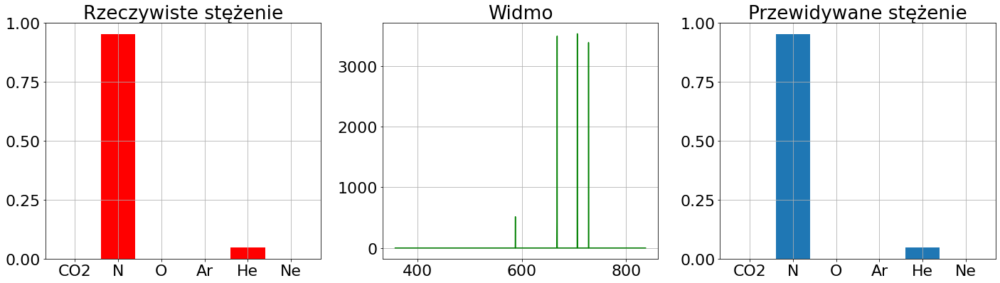

0


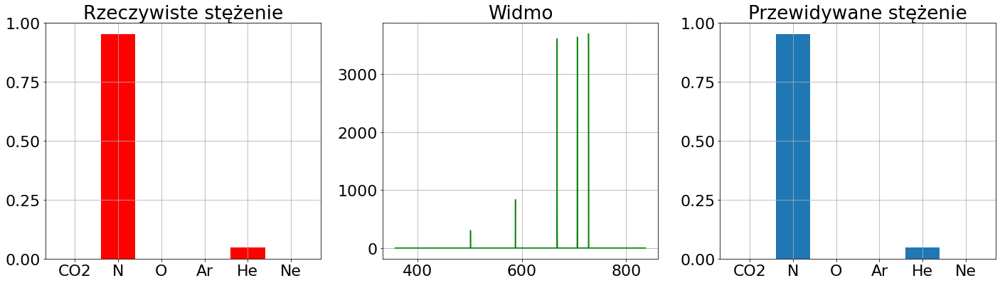

1


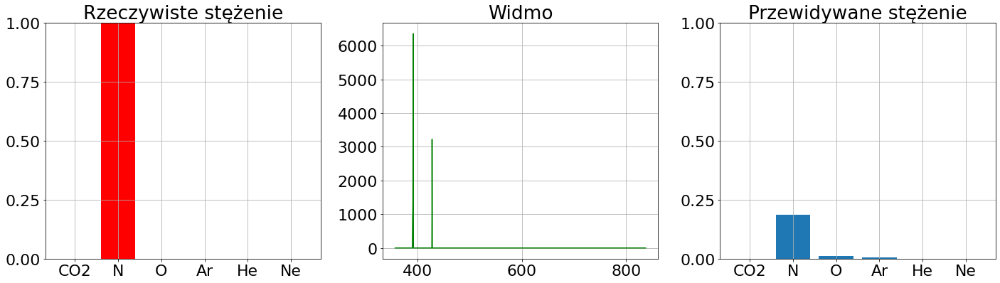

2


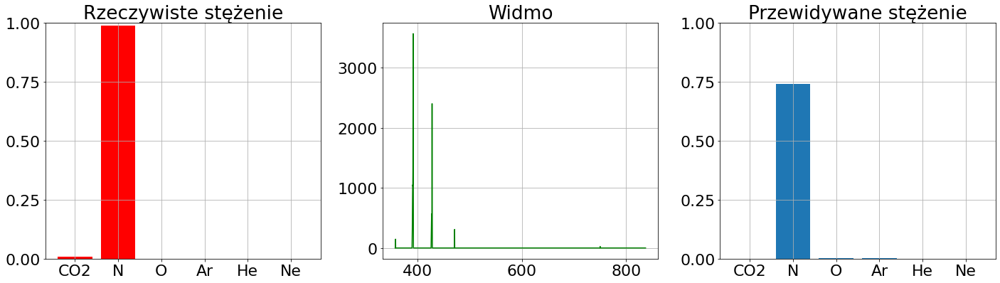

3


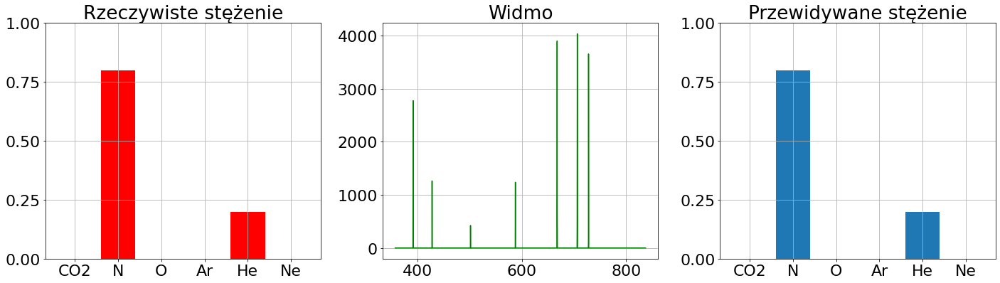

4


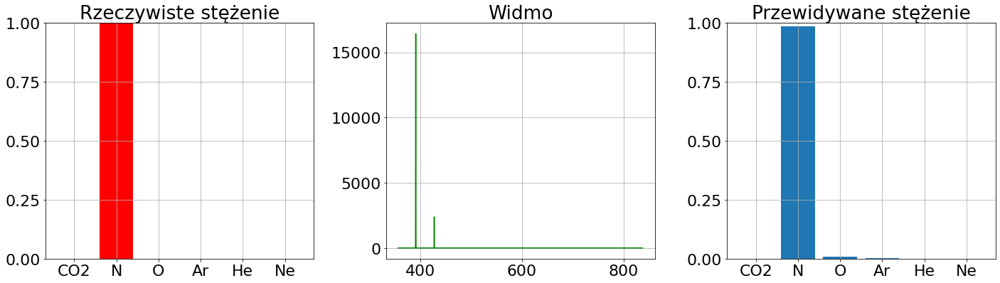

5


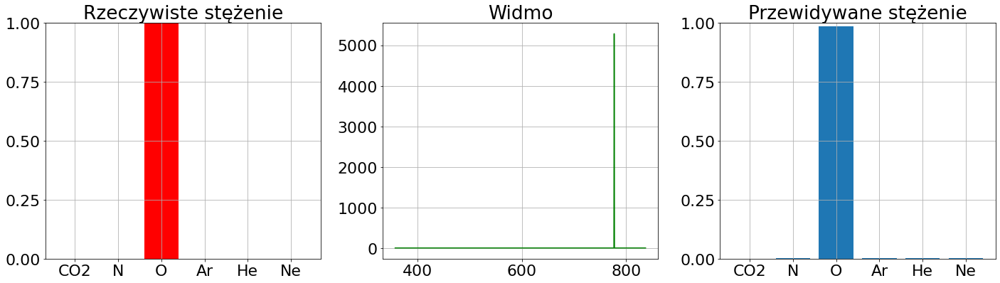

6


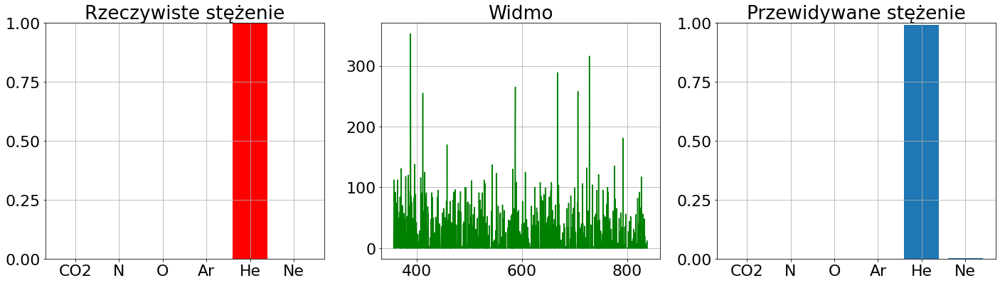

7


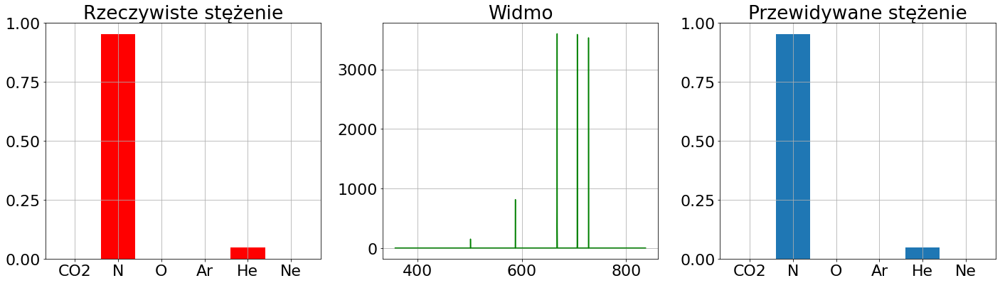

8


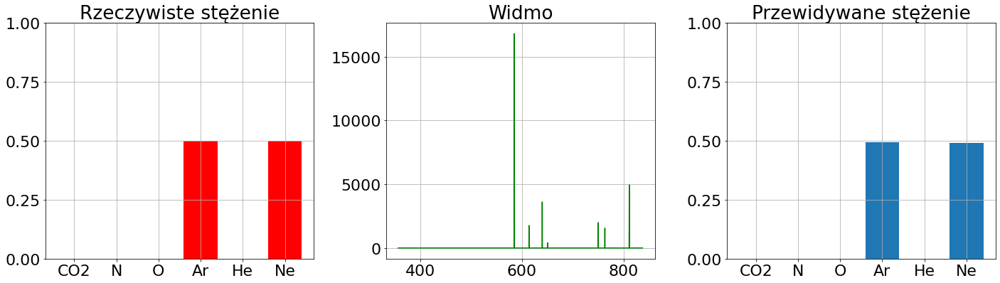

9


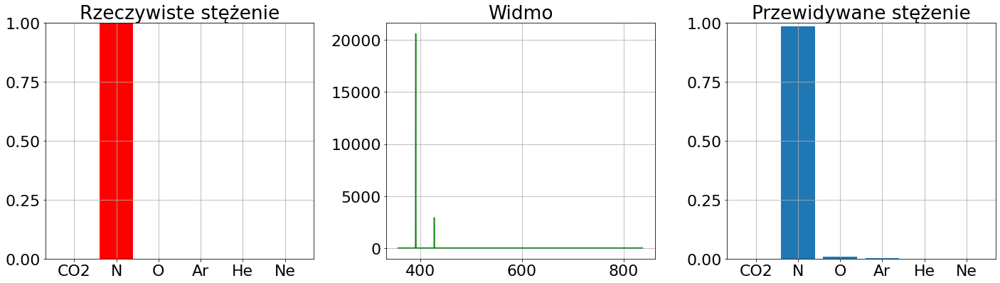

10


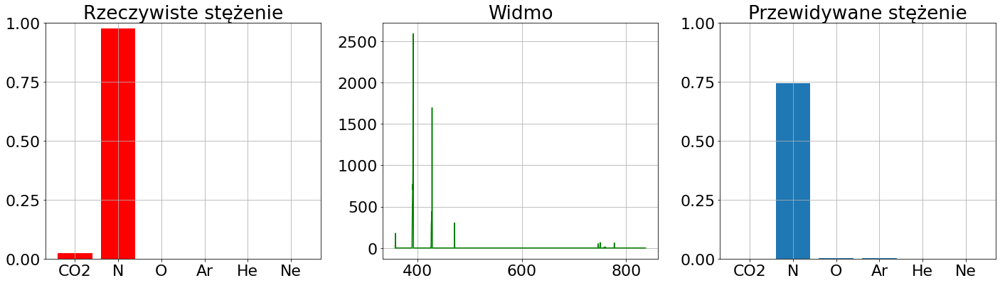

11


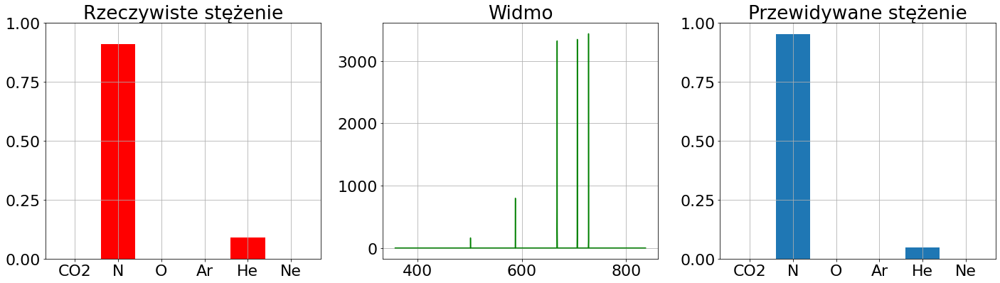

12


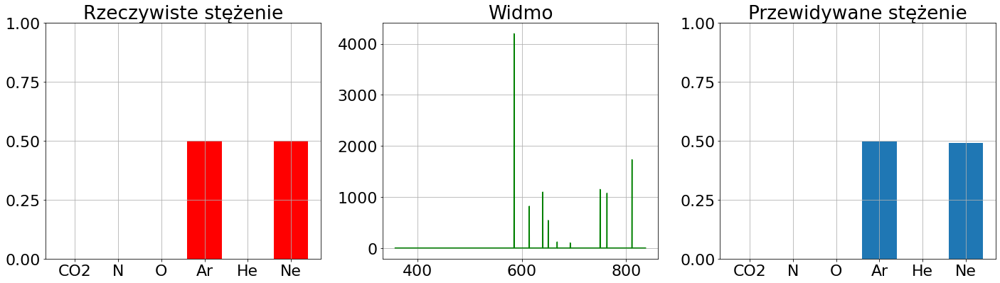

13


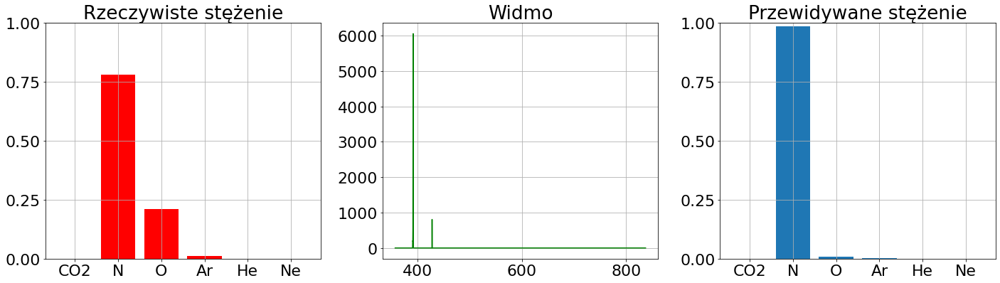

14


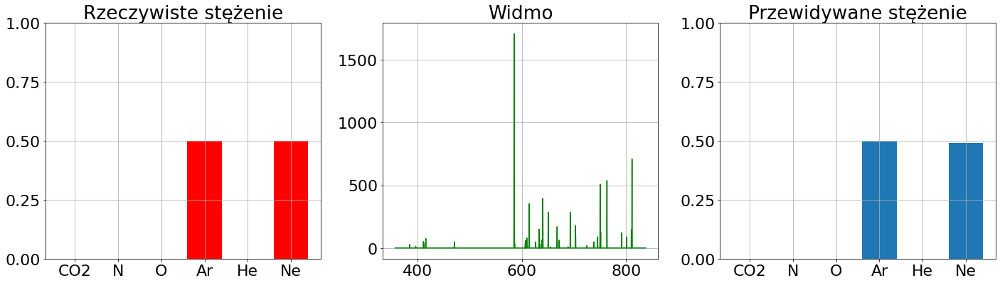

15


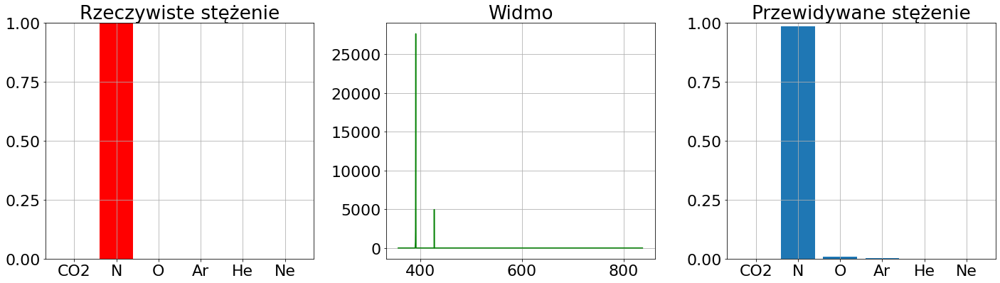

16


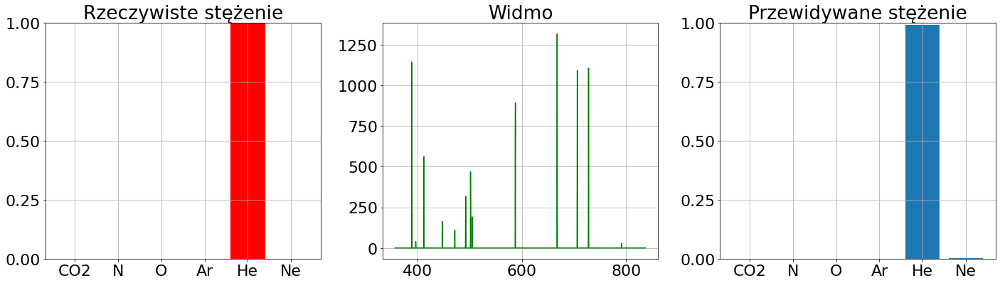

17


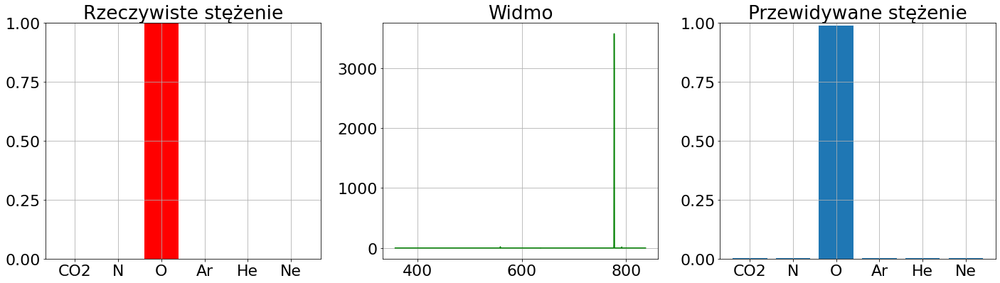

18


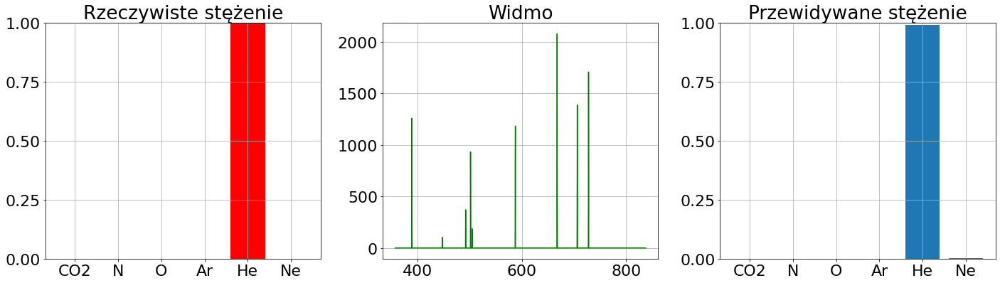

19


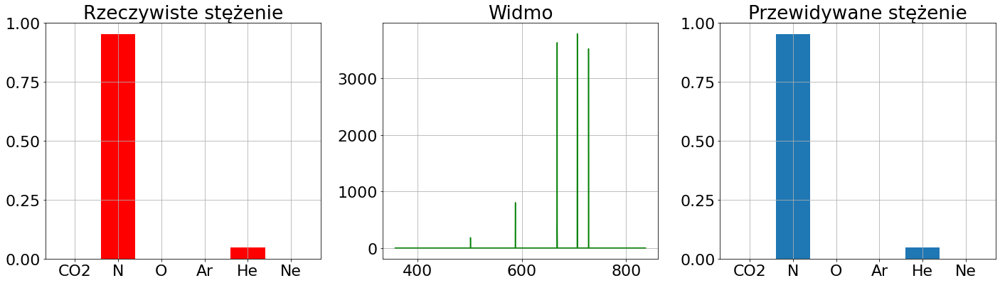

20


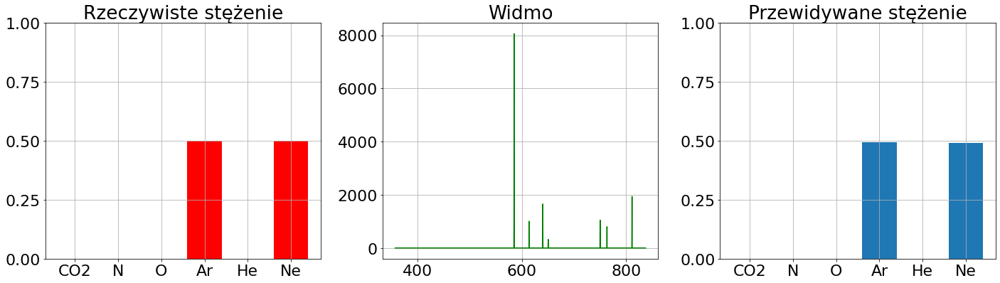

21


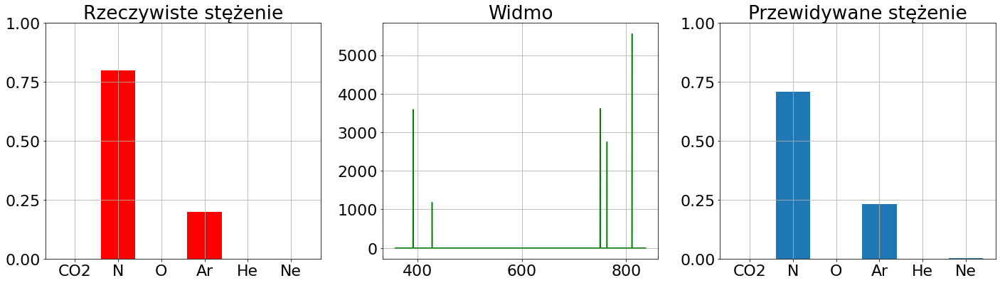

22


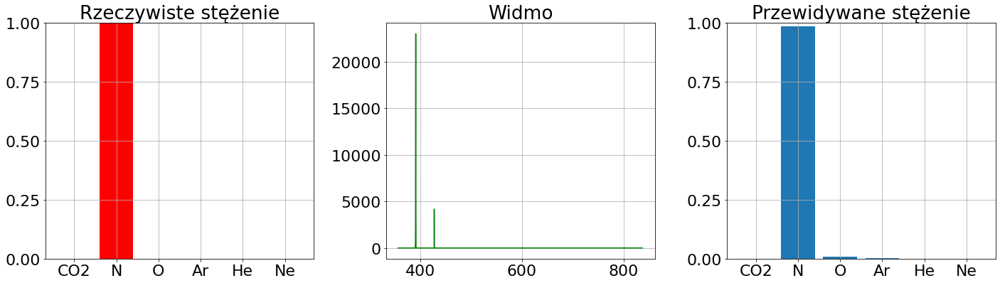

23


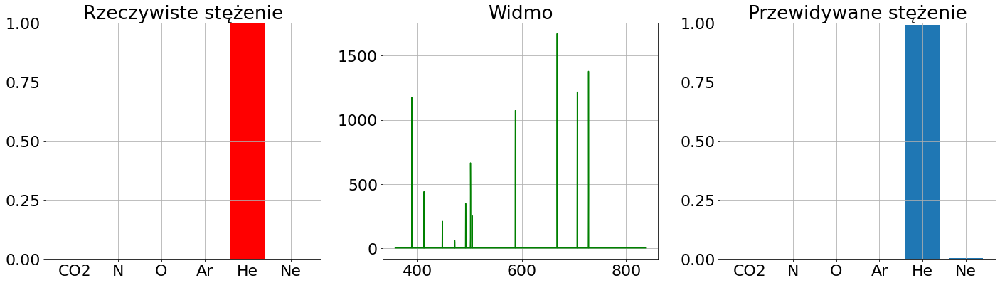

24


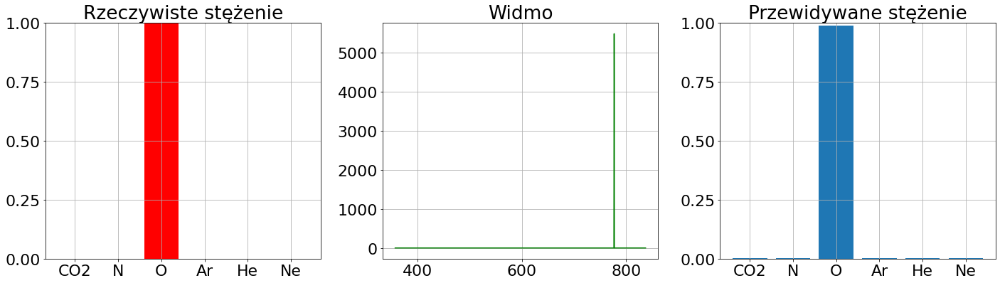

25


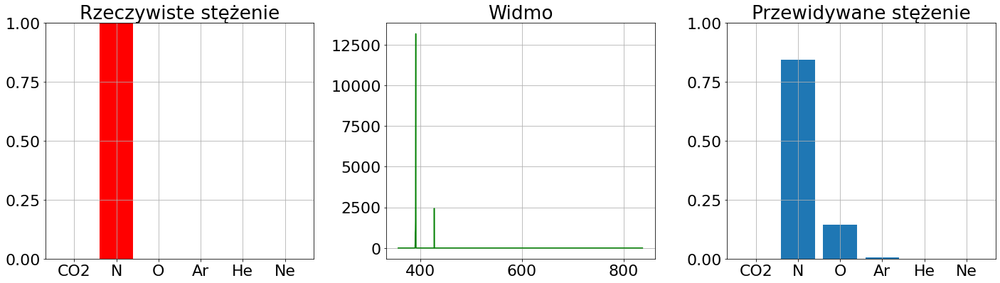

26


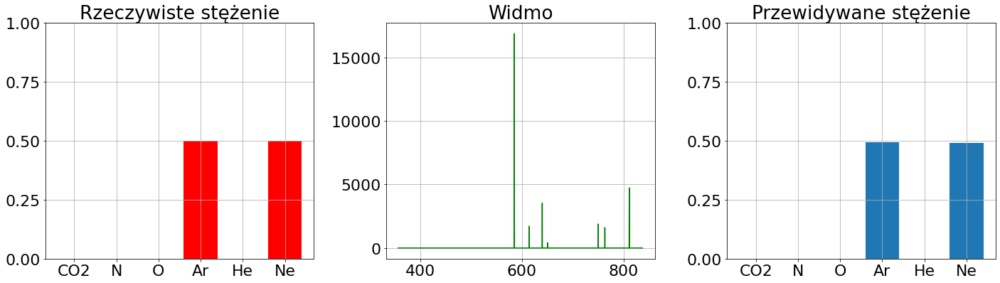

27


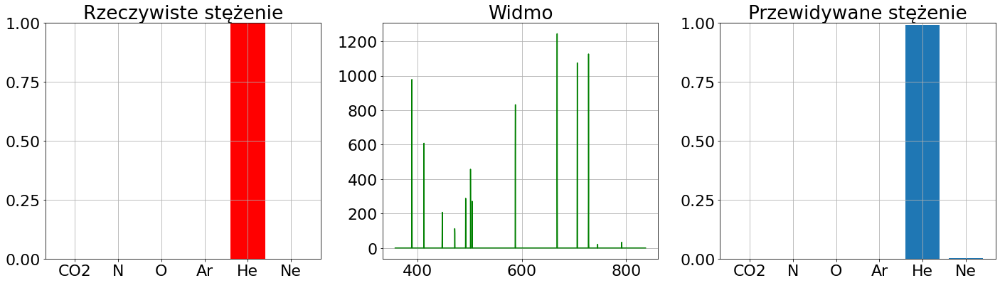

28


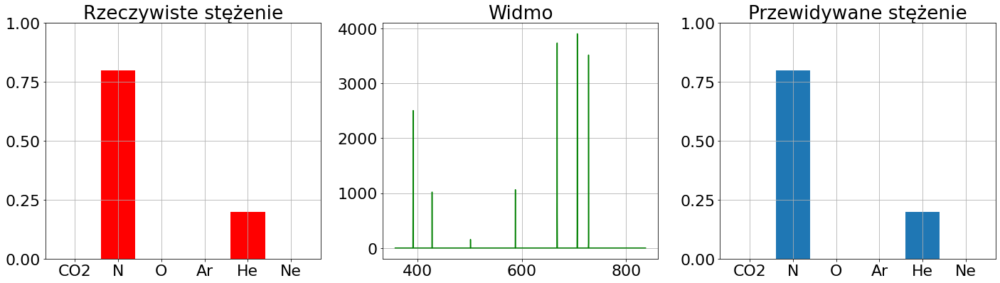

29


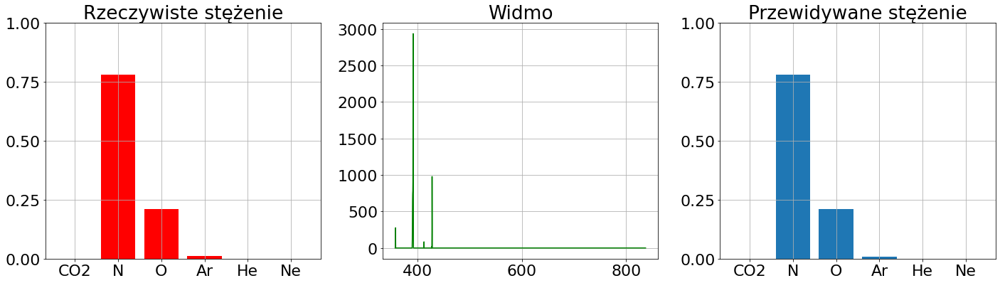

30


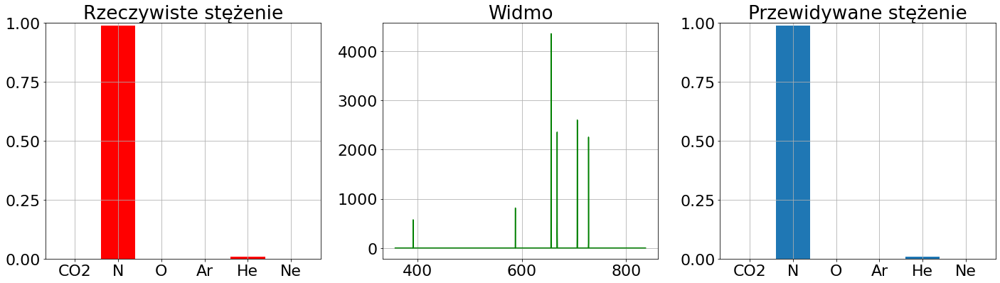

31


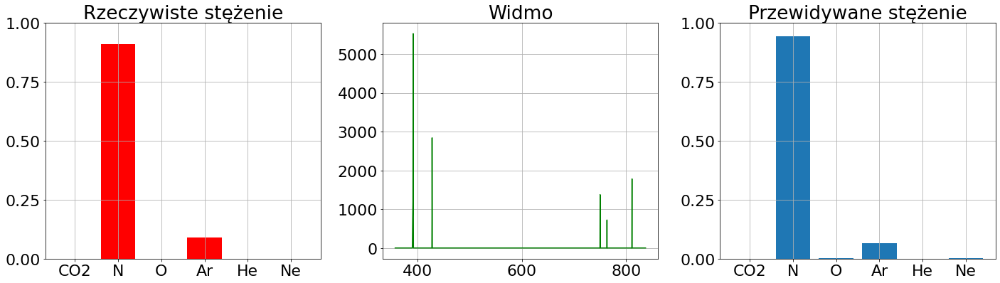

32


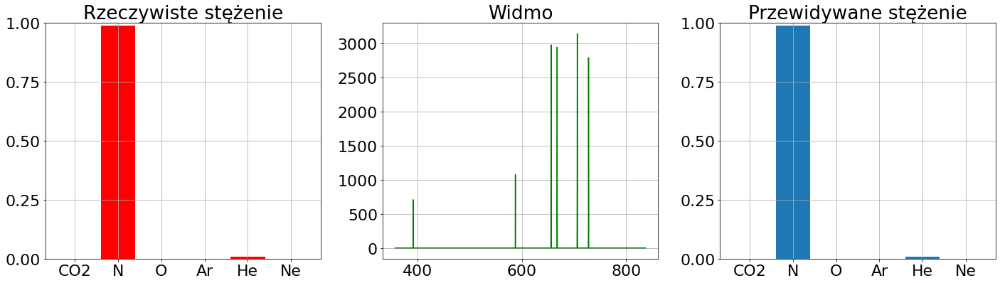

33


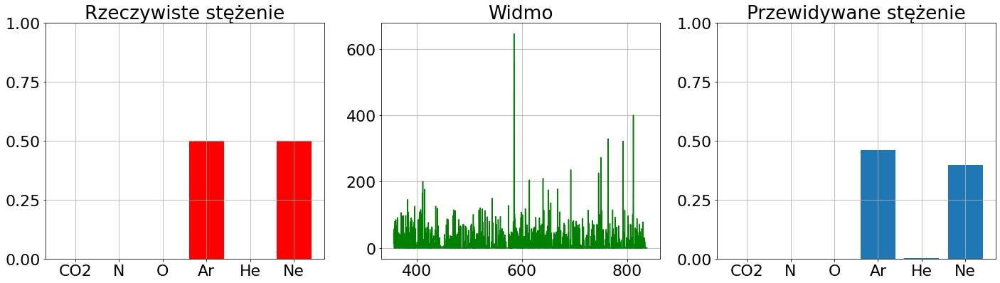

34


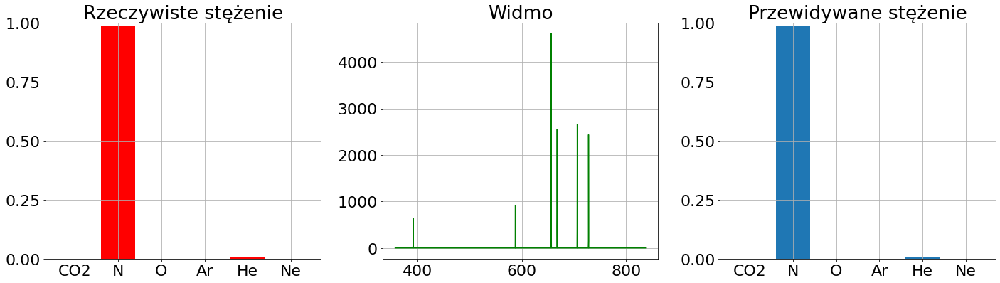

35


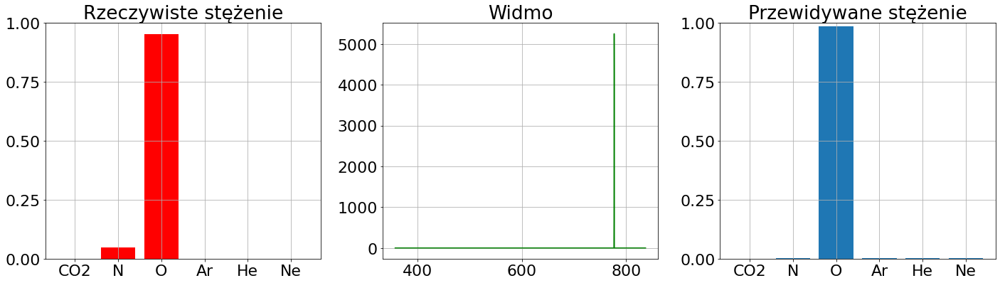

36


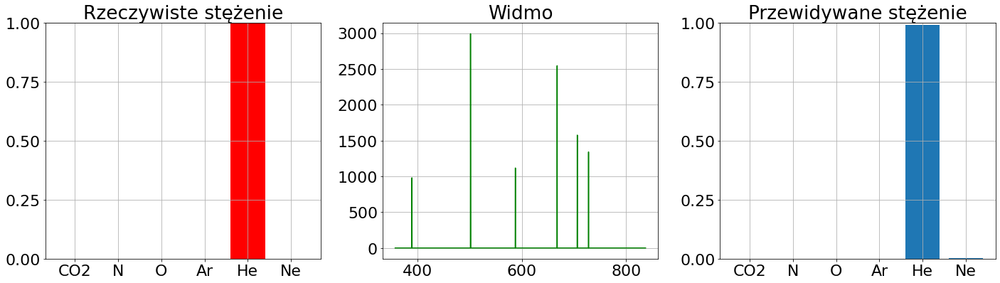

37


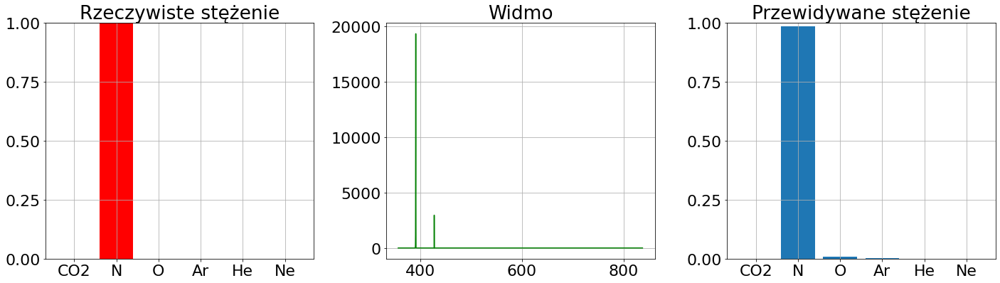

38


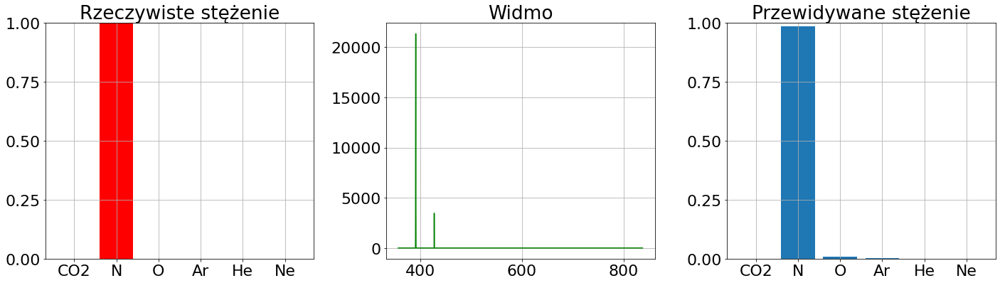

39


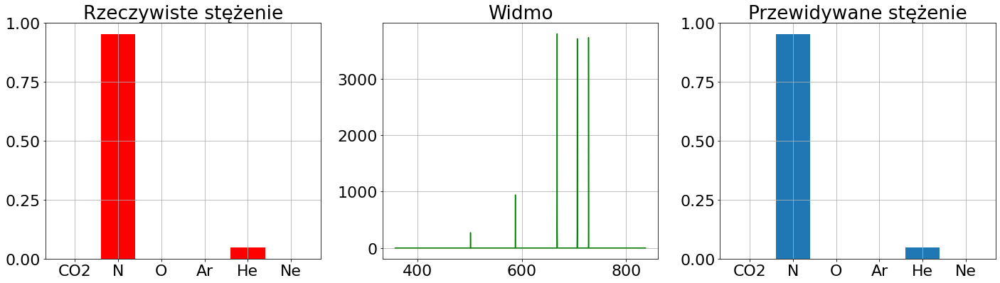

40


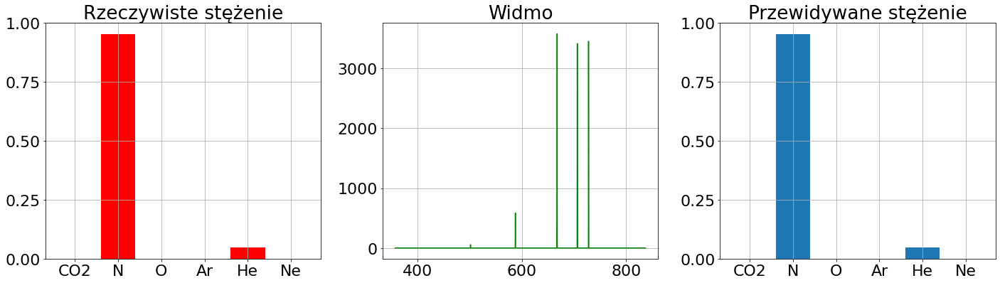

41


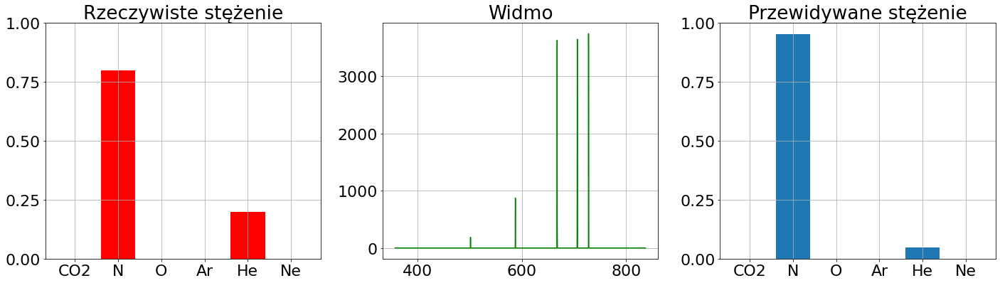

42


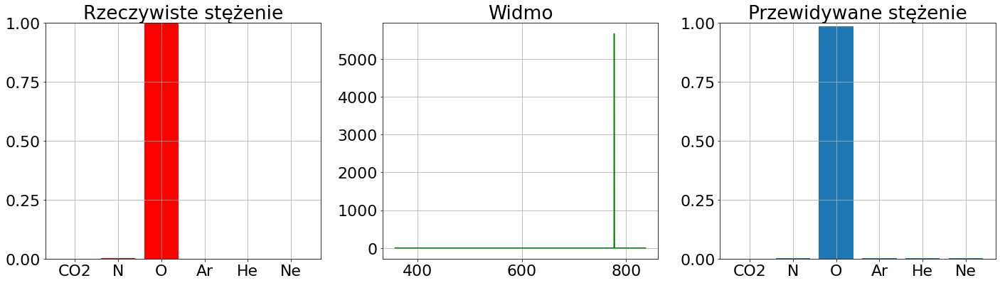

43


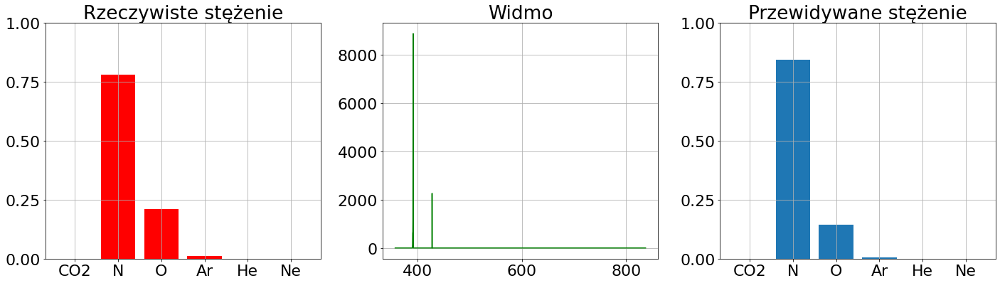

44


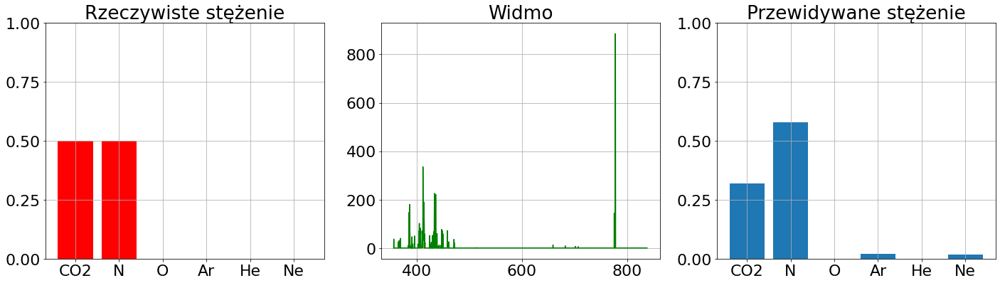

45


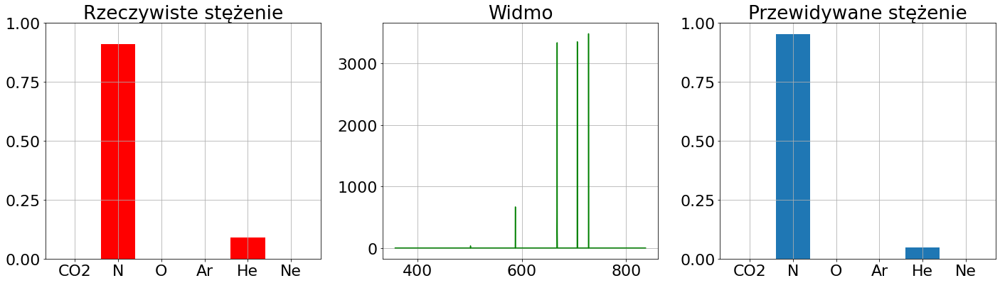

46


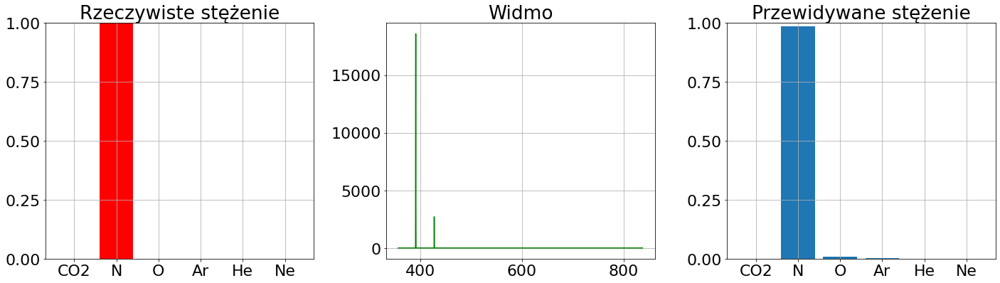

47


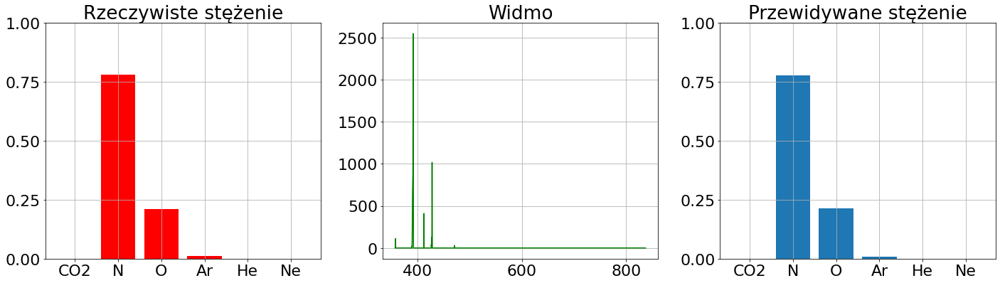

48


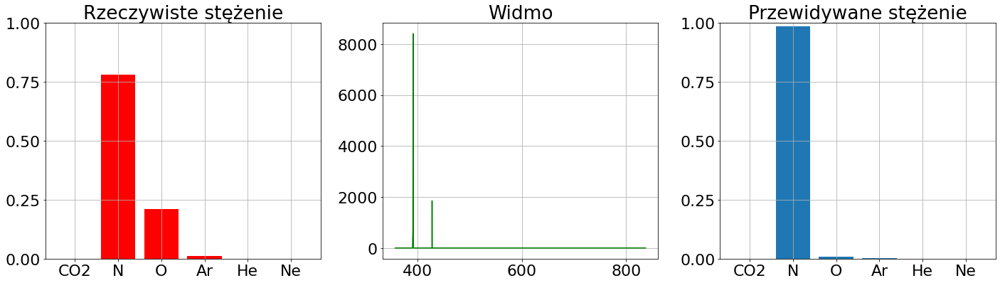

49


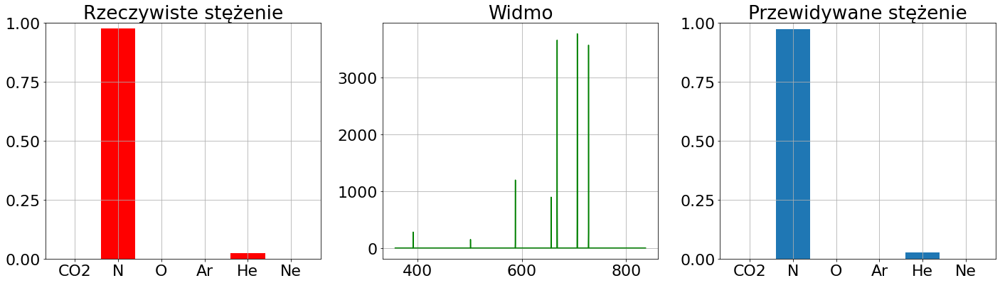

50


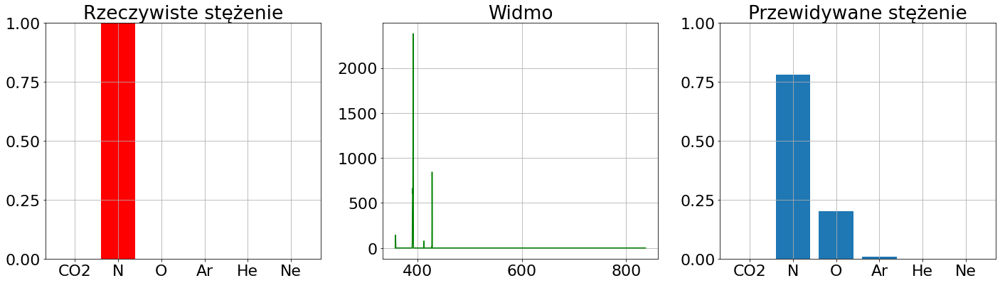

51


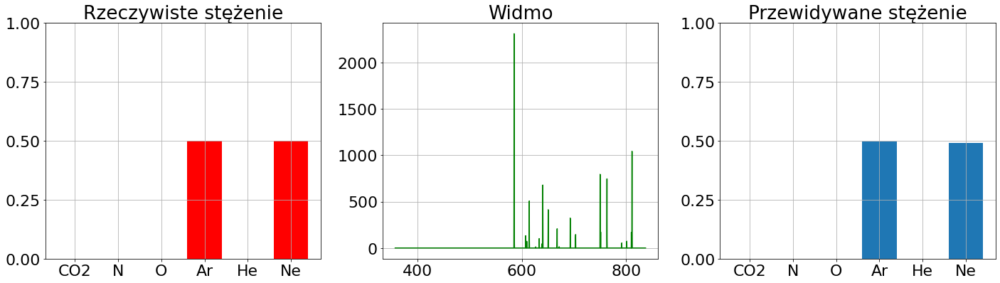

52


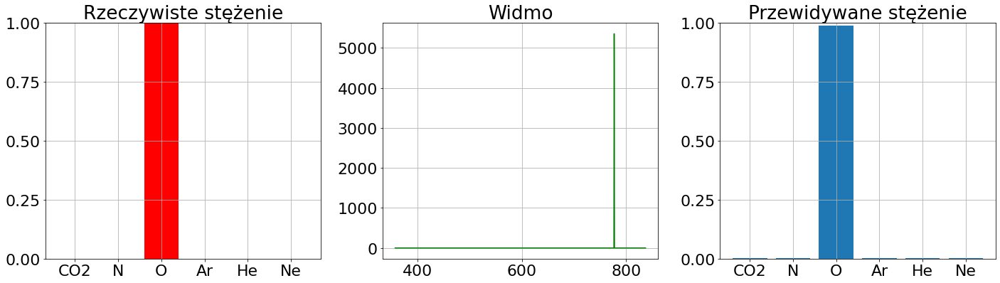

53


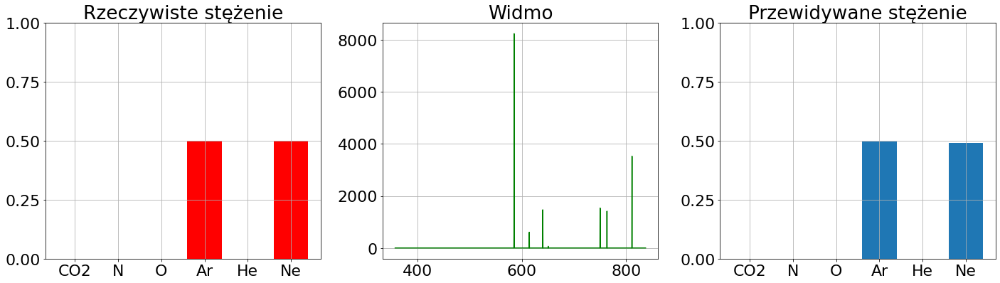

54


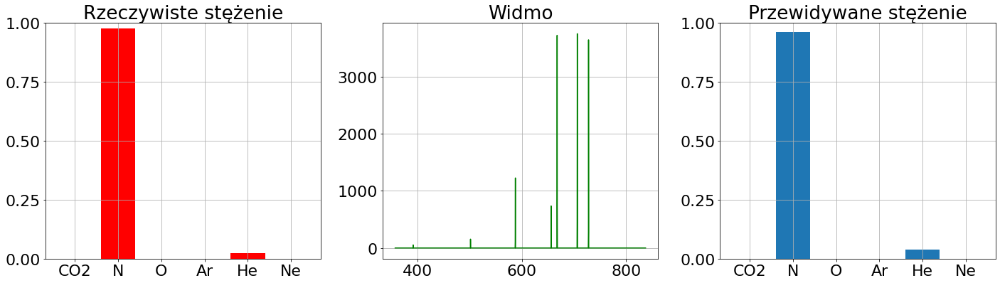

55


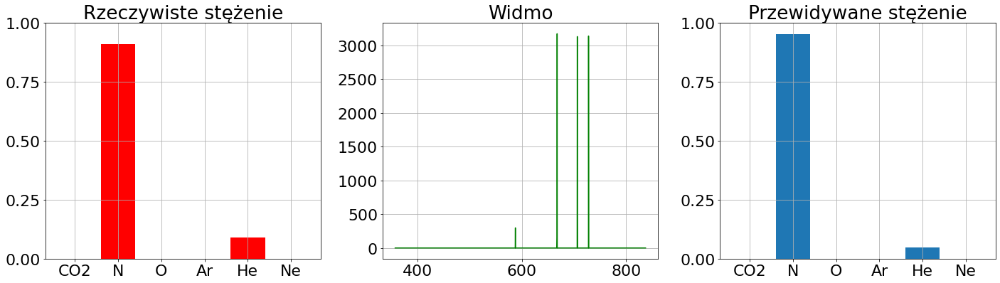

56


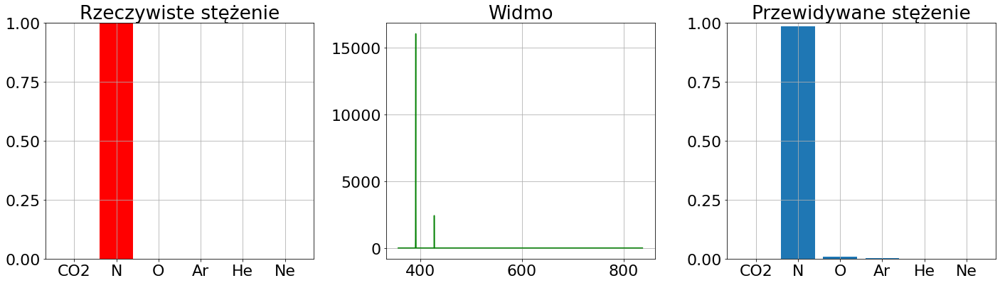

57


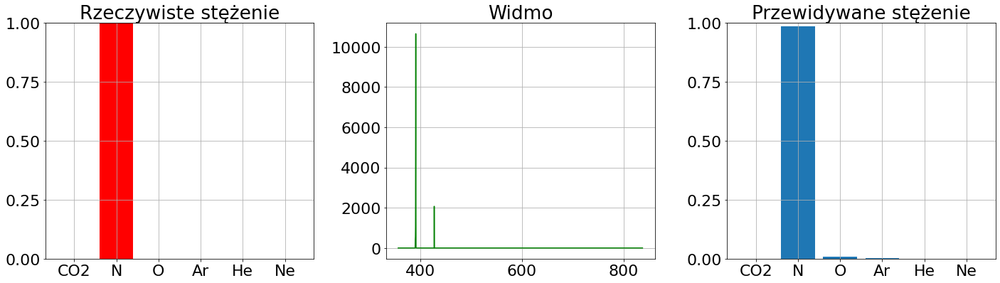

58


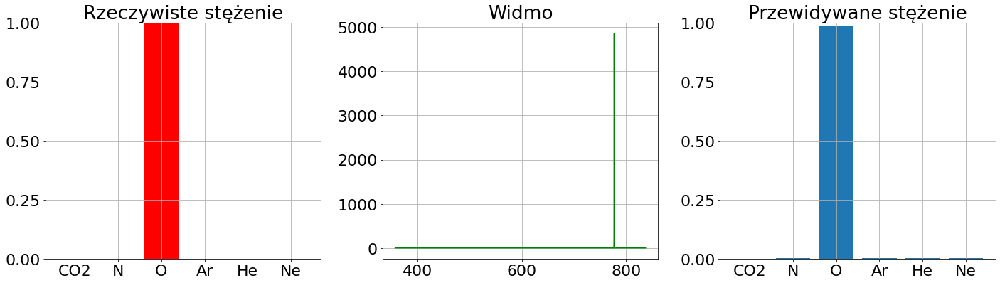

59


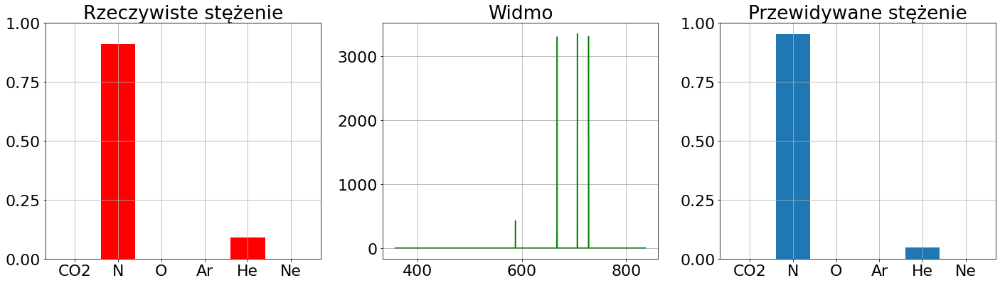

60


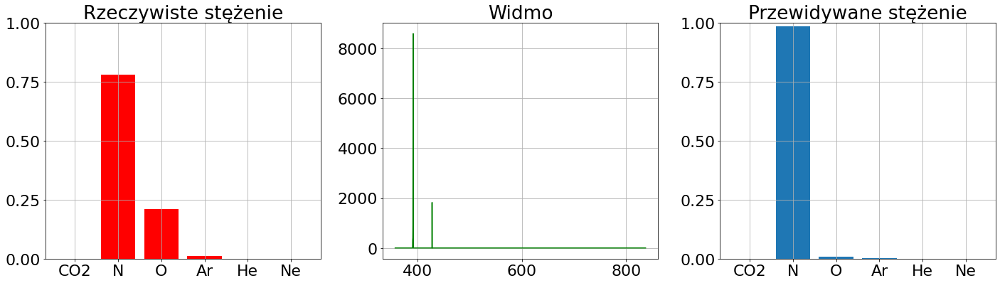

61


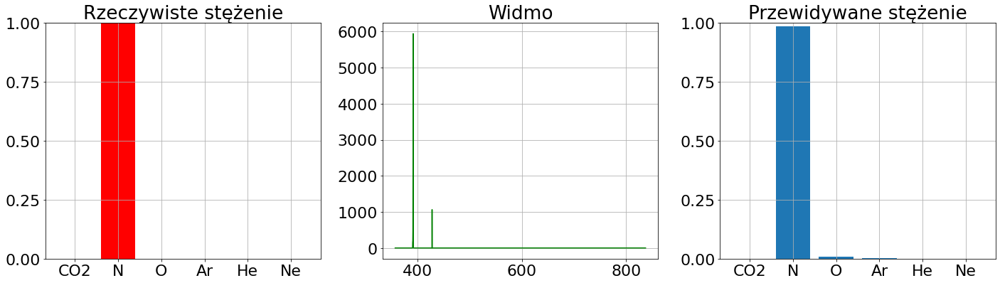

62


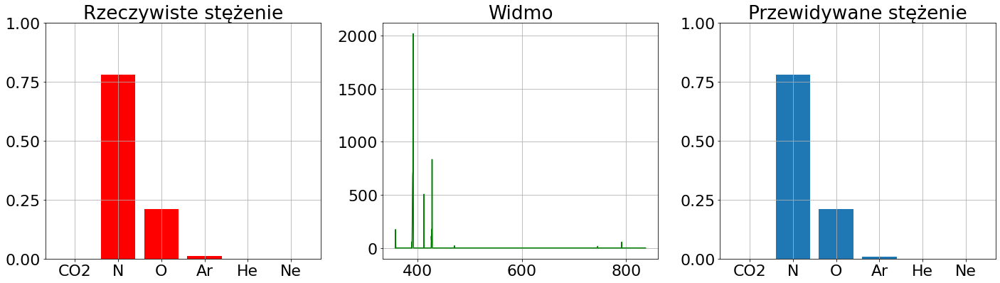

63


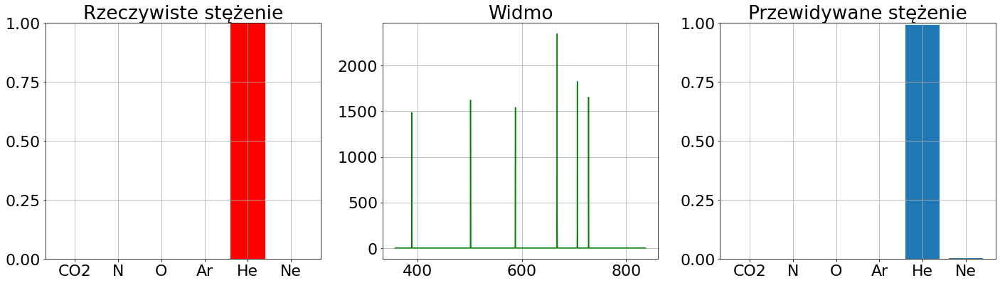

64


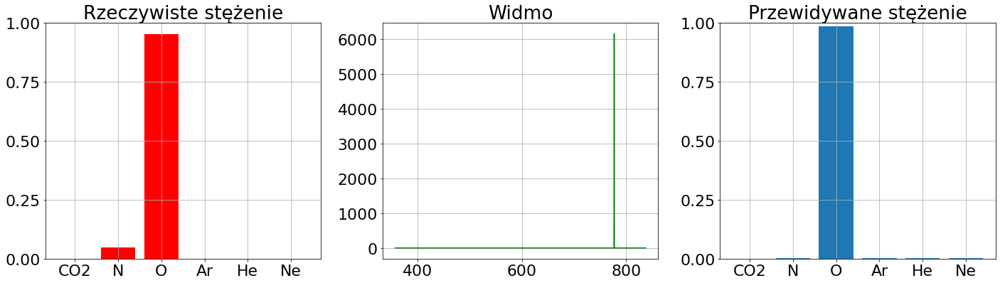

65


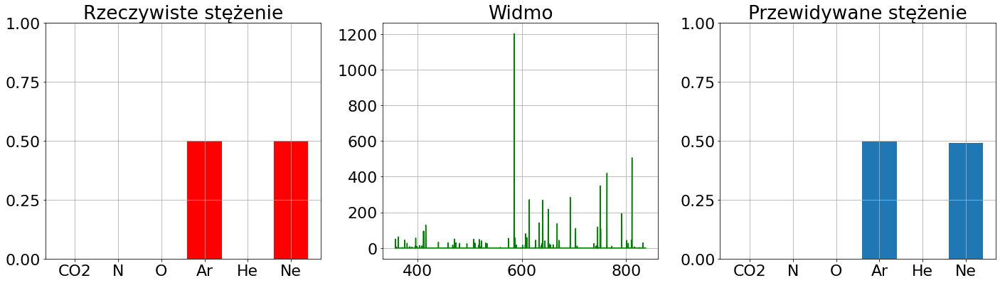

66


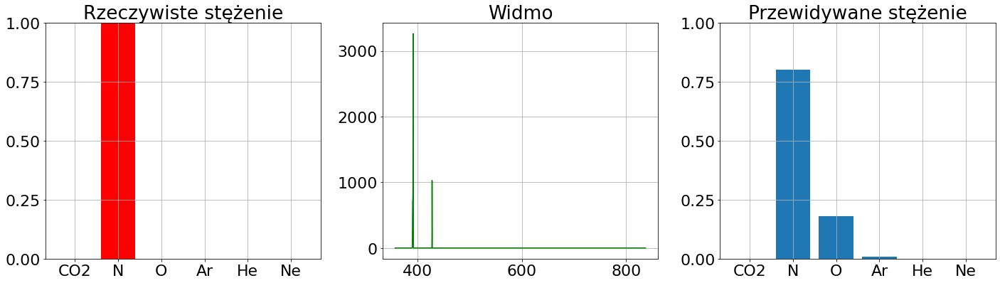

67


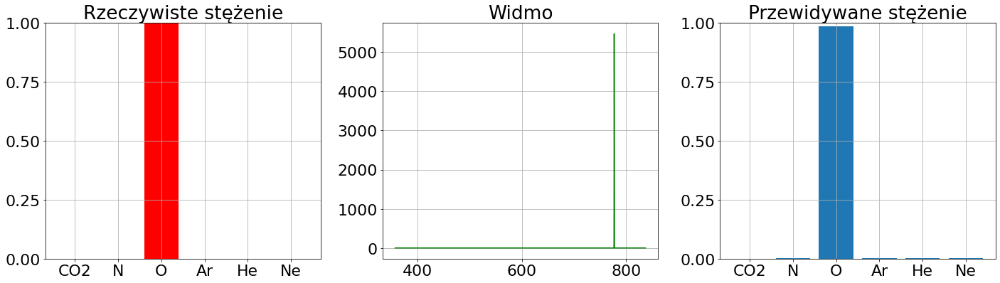

68


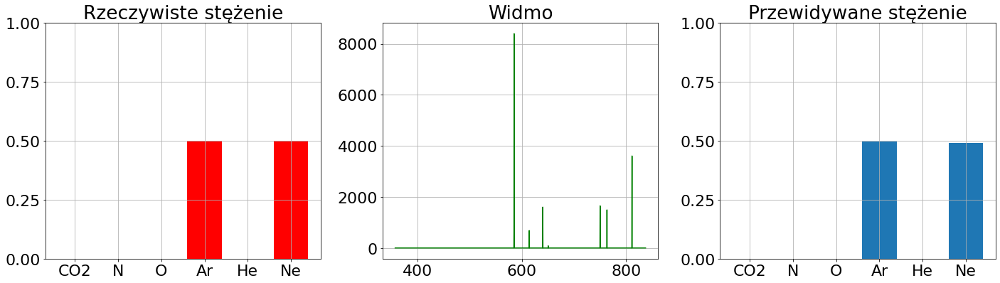

69


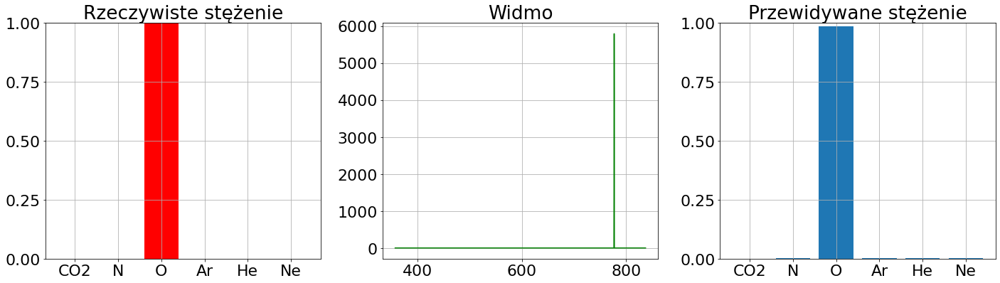

70


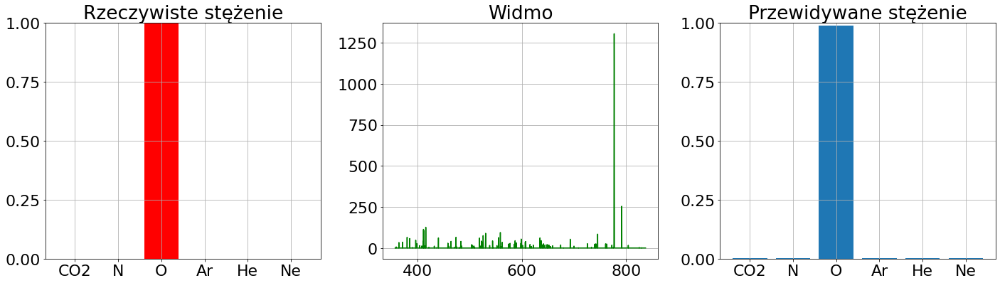

71


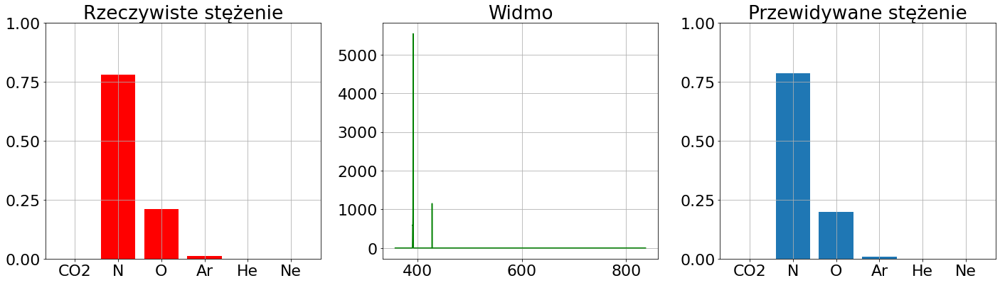

72


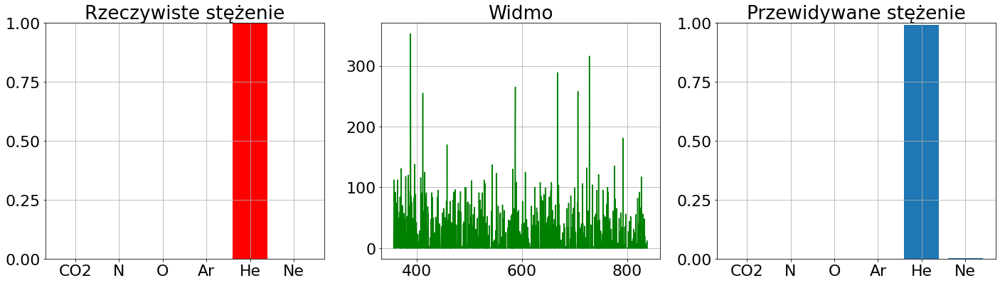

73


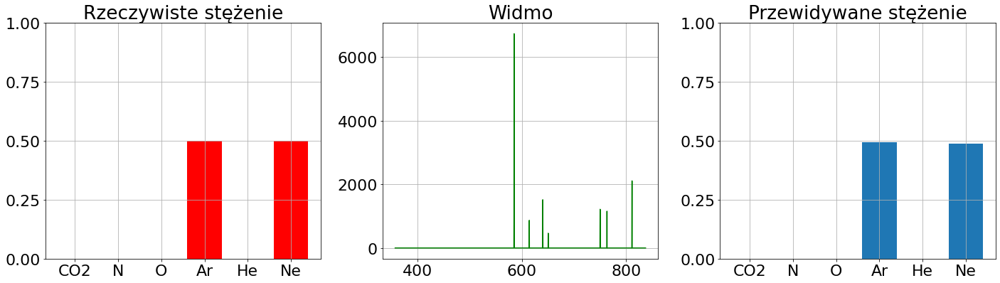

74


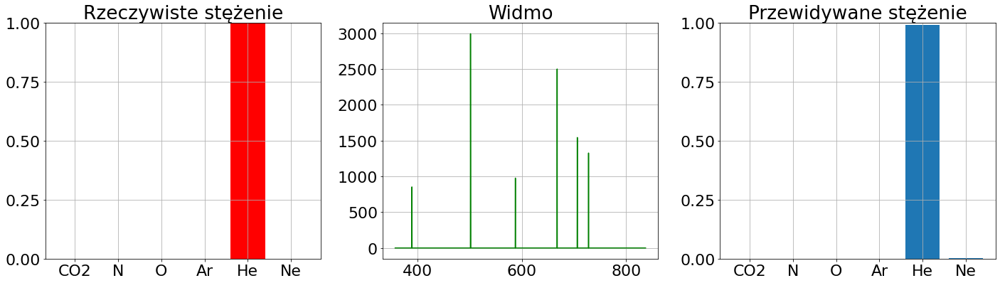

75


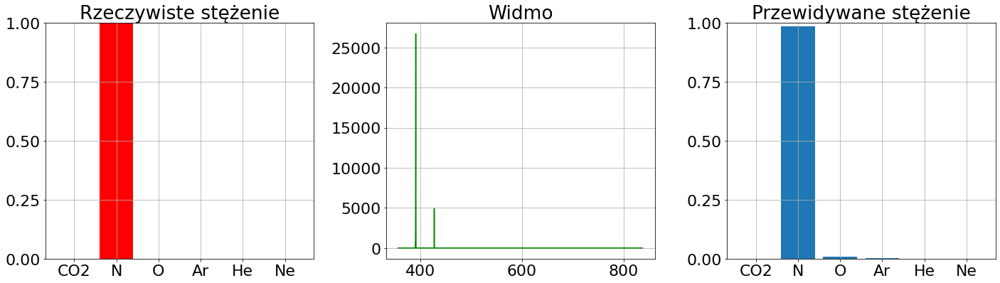

76


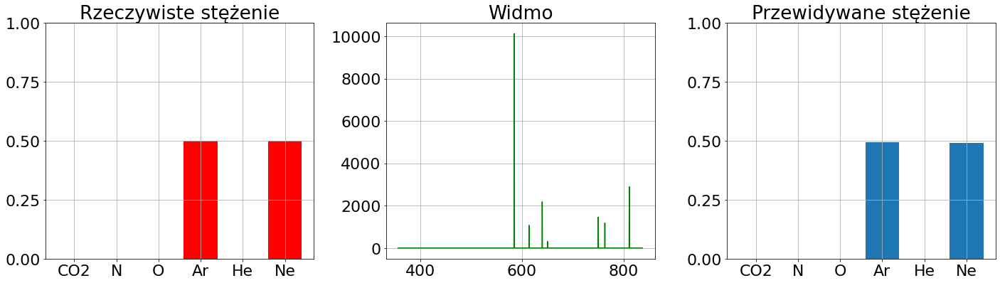

77


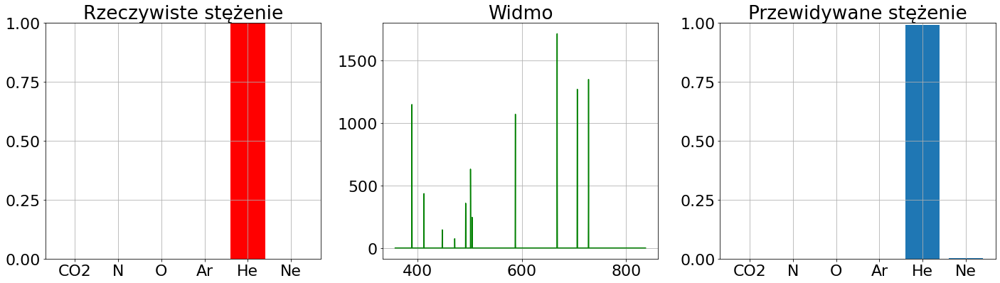

78


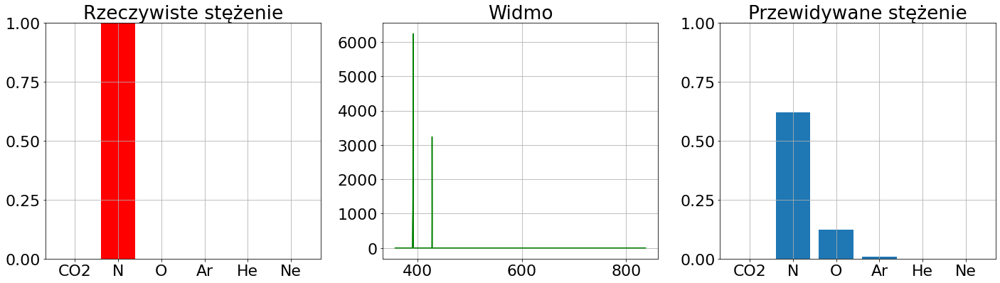

79


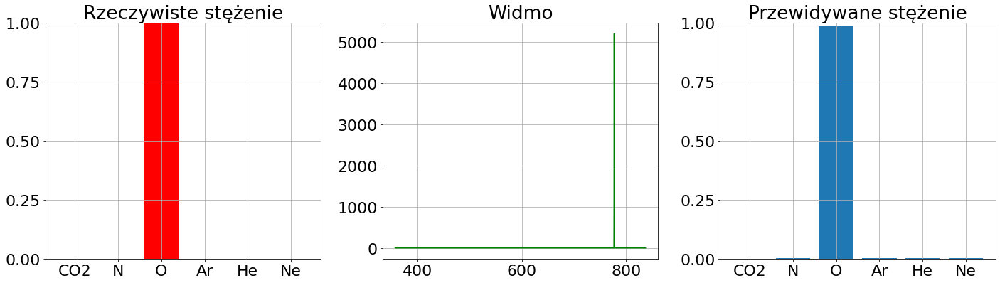

80


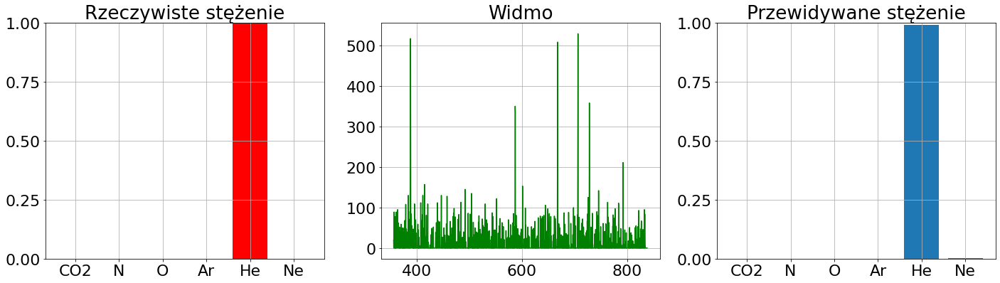

81


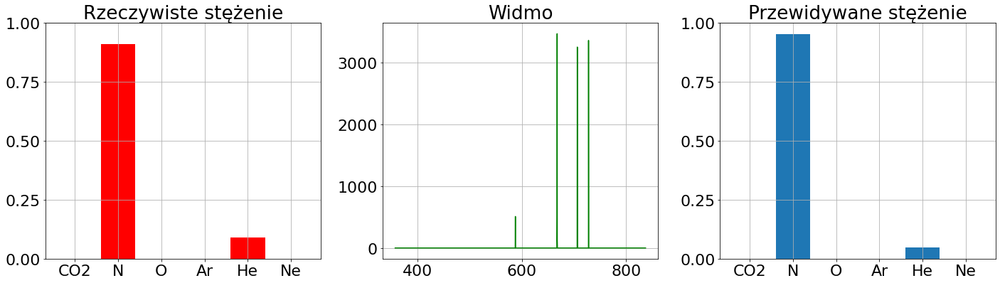

82


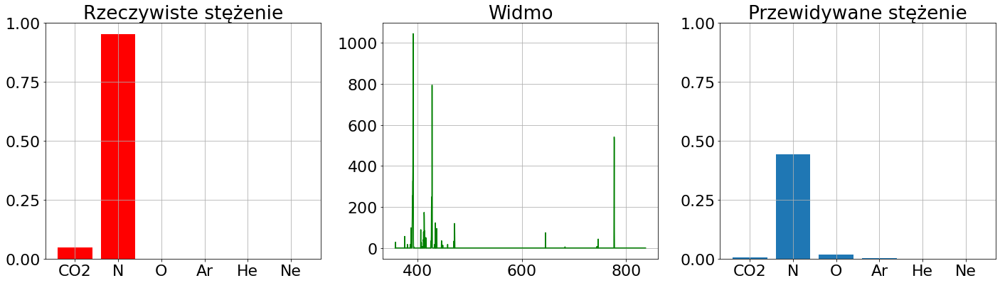

83


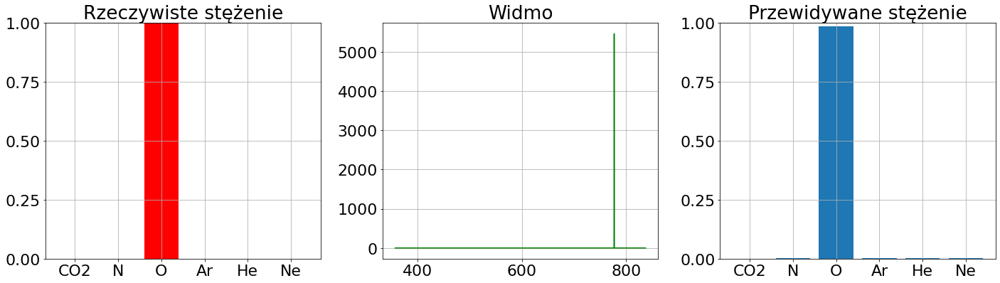

84


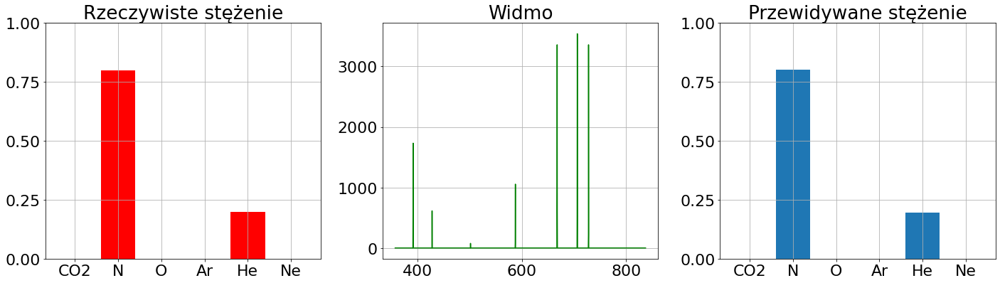

85


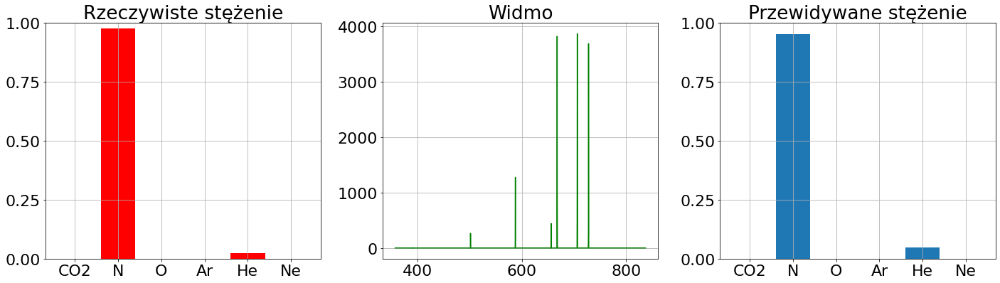

86


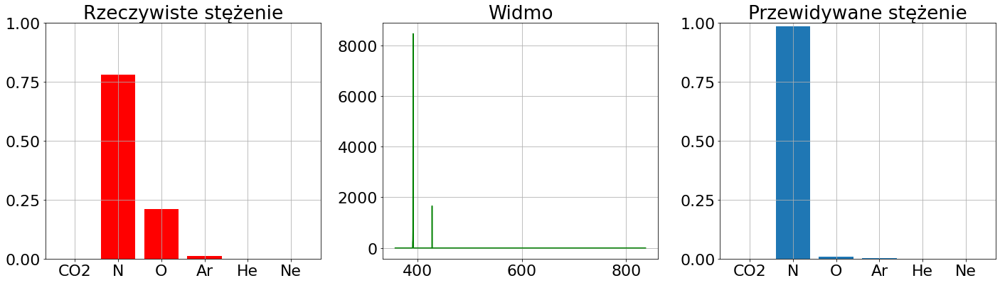

87


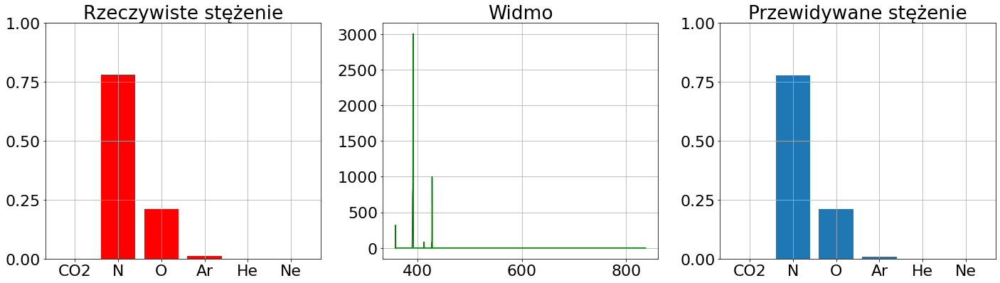

88


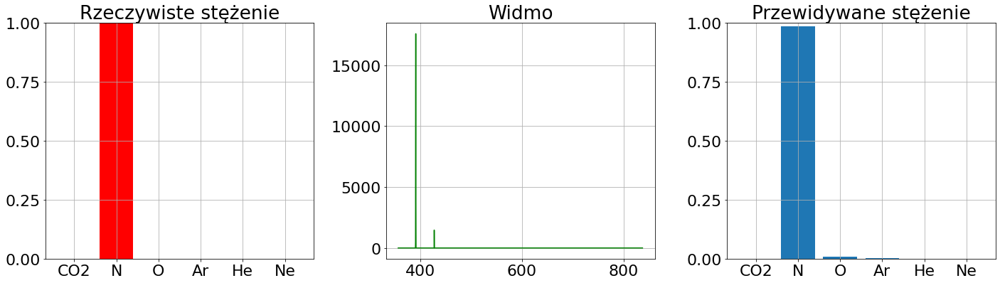

89


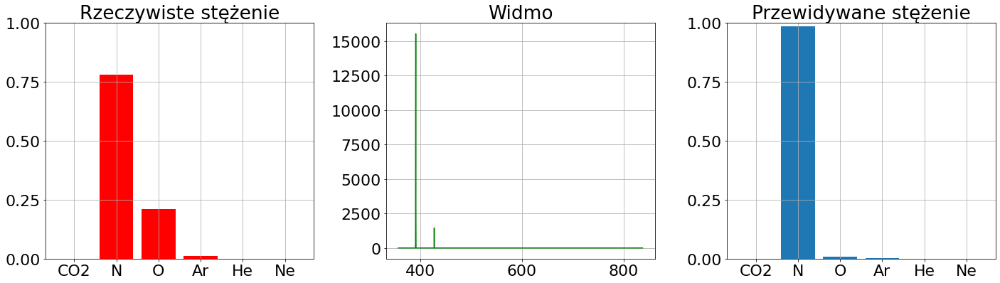

90


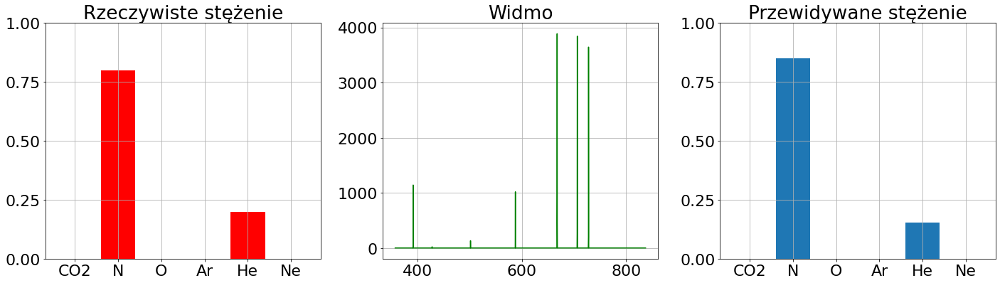

91


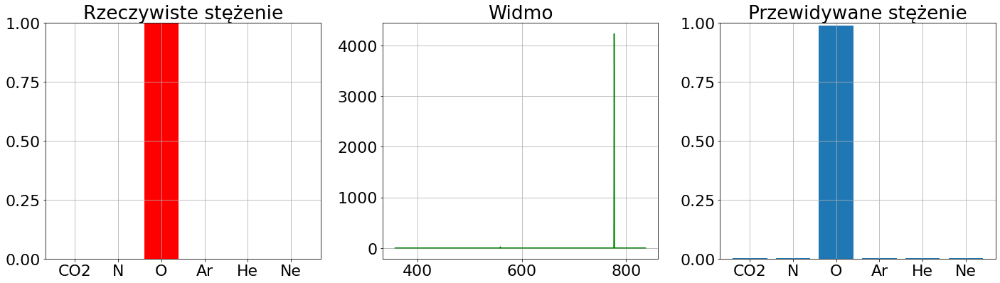

92


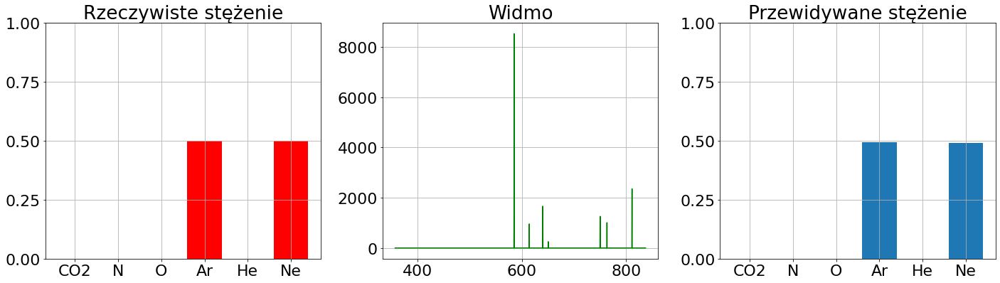

93


In [25]:
for i in range(test_spectrumsA.shape[0]):
    fig = show_predictions(modelA, test_spectrumsA, test_concentrations, i)
    print(i)

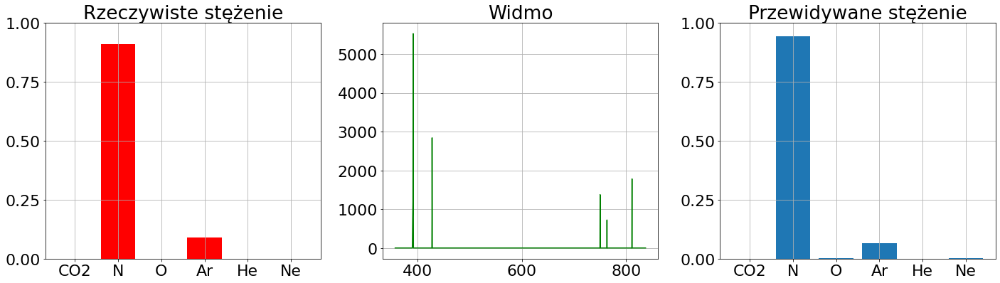

In [329]:
fig = show_predictions(modelA, test_spectrumsA, test_concentrations, 32)

In [331]:
fig.savefig('siec_A_przewidywania_NiAr', dpi=fig.dpi)

## 1.3 Optymalizacja

In [66]:
def model_builder(hp):
  hp_units1 = hp.Int('units1', min_value=32, max_value=1028, step=16)
  hp_units2 = hp.Int('units2', min_value=32, max_value=512, step=16)
  hp_units3 = hp.Int('units3', min_value=32, max_value=256, step=16)
    
  model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(2048,)),
            tf.keras.layers.Dense(hp_units1, activation='tanh'),
            tf.keras.layers.Dense(hp_units2, activation='tanh'),
            tf.keras.layers.Dense(hp_units3, activation='tanh'),
            tf.keras.layers.Dense(6, activation="sigmoid")])

  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 5e-2, 1e-3, 5e-3, 1e-4, 5e-4, 1e-5]) 
  model.compile(loss=custom_loss,
              optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
              metrics=['mse','mae'])

  return model

In [67]:
tf.random.set_seed(13)

tuner = kt.Hyperband(model_builder,
                     objective='val_loss',
                     max_epochs=50,
                     factor=3,
                     directory='tunerA',
                     project_name='siecA')

In [68]:
tf.random.set_seed(13)
stop_learning = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

tuner.search(train_spectrumsA,
             train_concentrations,
             epochs=50,
             validation_split=0.2,
             callbacks=[stop_learning])


best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 90 Complete [00h 00m 11s]
val_loss: 0.25335562229156494

Best val_loss So Far: 0.25335562229156494
Total elapsed time: 00h 07m 01s
INFO:tensorflow:Oracle triggered exit


In [69]:
print('Liczba neuronów w warstwie 1: %d' % best_hps.get('units1'))
print('Liczba neuronów w warstwie 2: %d' % best_hps.get('units2'))
print('Liczba neuronów w warstwie 3: %d' % best_hps.get('units3'))
print('Współczynnik uczenia: %f' % best_hps.get('learning_rate'))

Liczba neuronów w warstwie 1: 528
Liczba neuronów w warstwie 2: 240
Liczba neuronów w warstwie 3: 128
Współczynnik uczenia: 0.001000


In [70]:
tf.random.set_seed(13)

model = tuner.hypermodel.build(best_hps)
history = model.fit(train_spectrumsA,
                    train_concentrations,
                    steps_per_epoch=10,
                    epochs=500,
                    validation_split=0.2)

val_loss_per_epoch = history.history['val_loss']
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/500
10/10 [==============================] - 1s 47ms/step - loss: 4.4355 - mse: 0.0771 - mae: 0.1787 - val_loss: 1.0865 - val_mse: 0.0290 - val_mae: 0.0784
Epoch 2/500
10/10 [==============================] - 0s 22ms/step - loss: 0.9146 - mse: 0.0223 - mae: 0.0627 - val_loss: 0.6909 - val_mse: 0.0131 - val_mae: 0.0464
Epoch 3/500
10/10 [==============================] - 0s 21ms/step - loss: 0.6796 - mse: 0.0131 - mae: 0.0439 - val_loss: 0.5861 - val_mse: 0.0089 - val_mae: 0.0363
Epoch 4/500
10/10 [==============================] - 0s 23ms/step - loss: 0.5804 - mse: 0.0109 - mae: 0.0368 - val_loss: 0.5158 - val_mse: 0.0075 - val_mae: 0.0320
Epoch 5/500
10/10 [==============================] - 0s 24ms/step - loss: 0.5283 - mse: 0.0101 - mae: 0.0335 - val_loss: 0.4661 - val_mse: 0.0062 - val_mae: 0.0297
Epoch 6/500
10/10 [==============================] - 0s 19ms/step - loss: 0.4865 - mse: 0.0094 - mae: 0.0313 - val_loss: 0.4277 - val_mse: 0.0058 - val_mae: 0.0278
Epoch 7/500
10/1

Epoch 51/500
10/10 [==============================] - 0s 37ms/step - loss: 0.2855 - mse: 0.0059 - mae: 0.0198 - val_loss: 0.2782 - val_mse: 0.0039 - val_mae: 0.0194
Epoch 52/500
10/10 [==============================] - 0s 18ms/step - loss: 0.2923 - mse: 0.0063 - mae: 0.0199 - val_loss: 0.2867 - val_mse: 0.0048 - val_mae: 0.0207
Epoch 53/500
10/10 [==============================] - 0s 29ms/step - loss: 0.2823 - mse: 0.0064 - mae: 0.0196 - val_loss: 0.2680 - val_mse: 0.0047 - val_mae: 0.0198
Epoch 54/500
10/10 [==============================] - 0s 39ms/step - loss: 0.2882 - mse: 0.0064 - mae: 0.0200 - val_loss: 0.2688 - val_mse: 0.0045 - val_mae: 0.0198
Epoch 55/500
10/10 [==============================] - 0s 37ms/step - loss: 0.2947 - mse: 0.0062 - mae: 0.0205 - val_loss: 0.2656 - val_mse: 0.0038 - val_mae: 0.0187
Epoch 56/500
10/10 [==============================] - 0s 30ms/step - loss: 0.3123 - mse: 0.0063 - mae: 0.0212 - val_loss: 0.2730 - val_mse: 0.0040 - val_mae: 0.0196
Epoch 57/5

Epoch 101/500
10/10 [==============================] - 0s 31ms/step - loss: 0.2650 - mse: 0.0060 - mae: 0.0193 - val_loss: 0.2599 - val_mse: 0.0041 - val_mae: 0.0195
Epoch 102/500
10/10 [==============================] - 0s 33ms/step - loss: 0.2773 - mse: 0.0065 - mae: 0.0203 - val_loss: 0.2803 - val_mse: 0.0046 - val_mae: 0.0204
Epoch 103/500
10/10 [==============================] - 0s 34ms/step - loss: 0.2588 - mse: 0.0061 - mae: 0.0195 - val_loss: 0.2606 - val_mse: 0.0045 - val_mae: 0.0196
Epoch 104/500
10/10 [==============================] - 0s 26ms/step - loss: 0.2606 - mse: 0.0065 - mae: 0.0199 - val_loss: 0.2737 - val_mse: 0.0047 - val_mae: 0.0206
Epoch 105/500
10/10 [==============================] - 0s 30ms/step - loss: 0.2623 - mse: 0.0060 - mae: 0.0197 - val_loss: 0.2824 - val_mse: 0.0048 - val_mae: 0.0206
Epoch 106/500
10/10 [==============================] - 0s 32ms/step - loss: 0.2633 - mse: 0.0063 - mae: 0.0200 - val_loss: 0.2609 - val_mse: 0.0050 - val_mae: 0.0196
Epoc

10/10 [==============================] - 0s 26ms/step - loss: 0.2507 - mse: 0.0077 - mae: 0.0203 - val_loss: 0.2745 - val_mse: 0.0071 - val_mae: 0.0218
Epoch 151/500
10/10 [==============================] - 0s 29ms/step - loss: 0.2456 - mse: 0.0081 - mae: 0.0201 - val_loss: 0.2816 - val_mse: 0.0075 - val_mae: 0.0223
Epoch 152/500
10/10 [==============================] - 0s 24ms/step - loss: 0.2482 - mse: 0.0081 - mae: 0.0202 - val_loss: 0.2985 - val_mse: 0.0083 - val_mae: 0.0230
Epoch 153/500
10/10 [==============================] - 0s 25ms/step - loss: 0.2482 - mse: 0.0080 - mae: 0.0202 - val_loss: 0.2719 - val_mse: 0.0071 - val_mae: 0.0216
Epoch 154/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2453 - mse: 0.0079 - mae: 0.0201 - val_loss: 0.2800 - val_mse: 0.0076 - val_mae: 0.0223
Epoch 155/500
10/10 [==============================] - 0s 18ms/step - loss: 0.2438 - mse: 0.0082 - mae: 0.0201 - val_loss: 0.2785 - val_mse: 0.0075 - val_mae: 0.0221
Epoch 156/500
10/1

10/10 [==============================] - 0s 22ms/step - loss: 0.2482 - mse: 0.0084 - mae: 0.0206 - val_loss: 0.2938 - val_mse: 0.0085 - val_mae: 0.0234
Epoch 200/500
10/10 [==============================] - 0s 16ms/step - loss: 0.2460 - mse: 0.0084 - mae: 0.0203 - val_loss: 0.2754 - val_mse: 0.0076 - val_mae: 0.0221
Epoch 201/500
10/10 [==============================] - 0s 17ms/step - loss: 0.2408 - mse: 0.0081 - mae: 0.0199 - val_loss: 0.2801 - val_mse: 0.0080 - val_mae: 0.0227
Epoch 202/500
10/10 [==============================] - 0s 16ms/step - loss: 0.2405 - mse: 0.0083 - mae: 0.0200 - val_loss: 0.2861 - val_mse: 0.0081 - val_mae: 0.0230
Epoch 203/500
10/10 [==============================] - 0s 22ms/step - loss: 0.2435 - mse: 0.0084 - mae: 0.0202 - val_loss: 0.2853 - val_mse: 0.0082 - val_mae: 0.0229
Epoch 204/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2411 - mse: 0.0083 - mae: 0.0201 - val_loss: 0.2848 - val_mse: 0.0081 - val_mae: 0.0228
Epoch 205/500
10/1

10/10 [==============================] - 0s 18ms/step - loss: 0.2391 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2852 - val_mse: 0.0082 - val_mae: 0.0231
Epoch 249/500
10/10 [==============================] - 0s 21ms/step - loss: 0.2372 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2896 - val_mse: 0.0085 - val_mae: 0.0234
Epoch 250/500
10/10 [==============================] - 1s 57ms/step - loss: 0.2380 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2859 - val_mse: 0.0083 - val_mae: 0.0230
Epoch 251/500
10/10 [==============================] - 0s 26ms/step - loss: 0.2372 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2868 - val_mse: 0.0084 - val_mae: 0.0232
Epoch 252/500
10/10 [==============================] - 0s 22ms/step - loss: 0.2369 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2916 - val_mse: 0.0087 - val_mae: 0.0236
Epoch 253/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2373 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2778 - val_mse: 0.0079 - val_mae: 0.0224
Epoch 254/500
10/1

10/10 [==============================] - 0s 29ms/step - loss: 0.2398 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2859 - val_mse: 0.0083 - val_mae: 0.0231
Epoch 298/500
10/10 [==============================] - 0s 23ms/step - loss: 0.2418 - mse: 0.0085 - mae: 0.0201 - val_loss: 0.2894 - val_mse: 0.0086 - val_mae: 0.0233
Epoch 299/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2405 - mse: 0.0085 - mae: 0.0201 - val_loss: 0.2910 - val_mse: 0.0087 - val_mae: 0.0235
Epoch 300/500
10/10 [==============================] - 0s 28ms/step - loss: 0.2401 - mse: 0.0085 - mae: 0.0200 - val_loss: 0.2880 - val_mse: 0.0084 - val_mae: 0.0232
Epoch 301/500
10/10 [==============================] - ETA: 0s - loss: 0.2367 - mse: 0.0079 - mae: 0.019 - 0s 30ms/step - loss: 0.2378 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2892 - val_mse: 0.0083 - val_mae: 0.0232
Epoch 302/500
10/10 [==============================] - 0s 31ms/step - loss: 0.2405 - mse: 0.0085 - mae: 0.0200 - val_loss: 0.2890 - 

10/10 [==============================] - 0s 20ms/step - loss: 0.2394 - mse: 0.0085 - mae: 0.0200 - val_loss: 0.2870 - val_mse: 0.0085 - val_mae: 0.0231
Epoch 347/500
10/10 [==============================] - 0s 16ms/step - loss: 0.2577 - mse: 0.0089 - mae: 0.0207 - val_loss: 0.3652 - val_mse: 0.0116 - val_mae: 0.0275
Epoch 348/500
10/10 [==============================] - 0s 16ms/step - loss: 0.2620 - mse: 0.0089 - mae: 0.0213 - val_loss: 0.2622 - val_mse: 0.0047 - val_mae: 0.0205
Epoch 349/500
10/10 [==============================] - 0s 19ms/step - loss: 0.2533 - mse: 0.0060 - mae: 0.0180 - val_loss: 0.2556 - val_mse: 0.0048 - val_mae: 0.0195
Epoch 350/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2542 - mse: 0.0062 - mae: 0.0179 - val_loss: 0.2567 - val_mse: 0.0046 - val_mae: 0.0195
Epoch 351/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2542 - mse: 0.0063 - mae: 0.0183 - val_loss: 0.2534 - val_mse: 0.0042 - val_mae: 0.0194
Epoch 352/500
10/1

10/10 [==============================] - 0s 26ms/step - loss: 0.2468 - mse: 0.0060 - mae: 0.0175 - val_loss: 0.2581 - val_mse: 0.0045 - val_mae: 0.0195
Epoch 396/500
10/10 [==============================] - 0s 18ms/step - loss: 0.2471 - mse: 0.0060 - mae: 0.0176 - val_loss: 0.2587 - val_mse: 0.0045 - val_mae: 0.0196
Epoch 397/500
10/10 [==============================] - 0s 22ms/step - loss: 0.2460 - mse: 0.0059 - mae: 0.0177 - val_loss: 0.2633 - val_mse: 0.0046 - val_mae: 0.0198
Epoch 398/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2445 - mse: 0.0058 - mae: 0.0179 - val_loss: 0.2652 - val_mse: 0.0047 - val_mae: 0.0201
Epoch 399/500
10/10 [==============================] - 0s 16ms/step - loss: 0.2491 - mse: 0.0064 - mae: 0.0189 - val_loss: 0.2681 - val_mse: 0.0053 - val_mae: 0.0207
Epoch 400/500
10/10 [==============================] - 0s 18ms/step - loss: 0.2483 - mse: 0.0062 - mae: 0.0187 - val_loss: 0.2790 - val_mse: 0.0055 - val_mae: 0.0206
Epoch 401/500
10/1

10/10 [==============================] - 0s 22ms/step - loss: 0.2351 - mse: 0.0086 - mae: 0.0198 - val_loss: 0.2794 - val_mse: 0.0080 - val_mae: 0.0223
Epoch 445/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2357 - mse: 0.0085 - mae: 0.0198 - val_loss: 0.2768 - val_mse: 0.0080 - val_mae: 0.0222
Epoch 446/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2341 - mse: 0.0086 - mae: 0.0198 - val_loss: 0.2854 - val_mse: 0.0085 - val_mae: 0.0231
Epoch 447/500
10/10 [==============================] - 0s 21ms/step - loss: 0.2329 - mse: 0.0086 - mae: 0.0197 - val_loss: 0.2790 - val_mse: 0.0081 - val_mae: 0.0224
Epoch 448/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2329 - mse: 0.0086 - mae: 0.0197 - val_loss: 0.2822 - val_mse: 0.0081 - val_mae: 0.0226
Epoch 449/500
10/10 [==============================] - 0s 17ms/step - loss: 0.2348 - mse: 0.0086 - mae: 0.0198 - val_loss: 0.2810 - val_mse: 0.0081 - val_mae: 0.0226
Epoch 450/500
10/1

10/10 [==============================] - 0s 18ms/step - loss: 0.2366 - mse: 0.0086 - mae: 0.0199 - val_loss: 0.2834 - val_mse: 0.0081 - val_mae: 0.0225
Epoch 494/500
10/10 [==============================] - 0s 18ms/step - loss: 0.2355 - mse: 0.0086 - mae: 0.0199 - val_loss: 0.2817 - val_mse: 0.0082 - val_mae: 0.0227
Epoch 495/500
10/10 [==============================] - 0s 18ms/step - loss: 0.2324 - mse: 0.0086 - mae: 0.0197 - val_loss: 0.2807 - val_mse: 0.0081 - val_mae: 0.0226
Epoch 496/500
10/10 [==============================] - 0s 20ms/step - loss: 0.2343 - mse: 0.0086 - mae: 0.0198 - val_loss: 0.2840 - val_mse: 0.0081 - val_mae: 0.0227
Epoch 497/500
10/10 [==============================] - 0s 27ms/step - loss: 0.2341 - mse: 0.0086 - mae: 0.0198 - val_loss: 0.2833 - val_mse: 0.0083 - val_mae: 0.0228
Epoch 498/500
10/10 [==============================] - 0s 22ms/step - loss: 0.2334 - mse: 0.0086 - mae: 0.0197 - val_loss: 0.2808 - val_mse: 0.0081 - val_mae: 0.0224
Epoch 499/500
10/1

In [71]:
print('Najlepsza liczba iteracji: %d' % (best_epoch,))

Najlepsza liczba iteracji: 379


In [74]:
tf.random.set_seed(13)

hypermodel = tuner.hypermodel.build(best_hps)

hypermodel.fit(train_spectrumsA,
               train_concentrations,
               steps_per_epoch=10, 
               epochs=best_epoch, 
               validation_split=0.2)

Epoch 1/379
10/10 [==============================] - 1s 35ms/step - loss: 4.4355 - mse: 0.0771 - mae: 0.1787 - val_loss: 1.0865 - val_mse: 0.0290 - val_mae: 0.0784
Epoch 2/379
10/10 [==============================] - 0s 17ms/step - loss: 0.9146 - mse: 0.0223 - mae: 0.0627 - val_loss: 0.6909 - val_mse: 0.0131 - val_mae: 0.0464
Epoch 3/379
10/10 [==============================] - 0s 16ms/step - loss: 0.6796 - mse: 0.0131 - mae: 0.0439 - val_loss: 0.5861 - val_mse: 0.0089 - val_mae: 0.0363
Epoch 4/379
10/10 [==============================] - 0s 16ms/step - loss: 0.5804 - mse: 0.0109 - mae: 0.0368 - val_loss: 0.5158 - val_mse: 0.0075 - val_mae: 0.0320
Epoch 5/379
10/10 [==============================] - 0s 16ms/step - loss: 0.5283 - mse: 0.0101 - mae: 0.0335 - val_loss: 0.4661 - val_mse: 0.0062 - val_mae: 0.0297
Epoch 6/379
10/10 [==============================] - 0s 16ms/step - loss: 0.4865 - mse: 0.0094 - mae: 0.0313 - val_loss: 0.4277 - val_mse: 0.0058 - val_mae: 0.0278
Epoch 7/379
10/1

10/10 [==============================] - 0s 14ms/step - loss: 0.2889 - mse: 0.0063 - mae: 0.0202 - val_loss: 0.2699 - val_mse: 0.0041 - val_mae: 0.0194
Epoch 51/379
10/10 [==============================] - 0s 17ms/step - loss: 0.2855 - mse: 0.0059 - mae: 0.0198 - val_loss: 0.2782 - val_mse: 0.0039 - val_mae: 0.0194
Epoch 52/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2923 - mse: 0.0063 - mae: 0.0199 - val_loss: 0.2867 - val_mse: 0.0048 - val_mae: 0.0207
Epoch 53/379
10/10 [==============================] - 0s 14ms/step - loss: 0.2823 - mse: 0.0064 - mae: 0.0196 - val_loss: 0.2680 - val_mse: 0.0047 - val_mae: 0.0198
Epoch 54/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2882 - mse: 0.0064 - mae: 0.0200 - val_loss: 0.2688 - val_mse: 0.0045 - val_mae: 0.0198
Epoch 55/379
10/10 [==============================] - 0s 14ms/step - loss: 0.2947 - mse: 0.0062 - mae: 0.0205 - val_loss: 0.2656 - val_mse: 0.0038 - val_mae: 0.0187
Epoch 56/379
10/10 [===

Epoch 100/379
10/10 [==============================] - 0s 13ms/step - loss: 0.2693 - mse: 0.0060 - mae: 0.0196 - val_loss: 0.2710 - val_mse: 0.0041 - val_mae: 0.0196
Epoch 101/379
10/10 [==============================] - 0s 14ms/step - loss: 0.2650 - mse: 0.0060 - mae: 0.0193 - val_loss: 0.2599 - val_mse: 0.0041 - val_mae: 0.0195
Epoch 102/379
10/10 [==============================] - 0s 16ms/step - loss: 0.2773 - mse: 0.0065 - mae: 0.0203 - val_loss: 0.2803 - val_mse: 0.0046 - val_mae: 0.0204
Epoch 103/379
10/10 [==============================] - 0s 13ms/step - loss: 0.2588 - mse: 0.0061 - mae: 0.0195 - val_loss: 0.2606 - val_mse: 0.0045 - val_mae: 0.0196
Epoch 104/379
10/10 [==============================] - 0s 14ms/step - loss: 0.2606 - mse: 0.0065 - mae: 0.0199 - val_loss: 0.2737 - val_mse: 0.0047 - val_mae: 0.0206
Epoch 105/379
10/10 [==============================] - 0s 13ms/step - loss: 0.2623 - mse: 0.0060 - mae: 0.0197 - val_loss: 0.2824 - val_mse: 0.0048 - val_mae: 0.0206
Epoc

10/10 [==============================] - 0s 14ms/step - loss: 0.2514 - mse: 0.0080 - mae: 0.0203 - val_loss: 0.2731 - val_mse: 0.0066 - val_mae: 0.0215
Epoch 150/379
10/10 [==============================] - 1s 74ms/step - loss: 0.2507 - mse: 0.0077 - mae: 0.0203 - val_loss: 0.2745 - val_mse: 0.0071 - val_mae: 0.0218
Epoch 151/379
10/10 [==============================] - 0s 14ms/step - loss: 0.2456 - mse: 0.0081 - mae: 0.0201 - val_loss: 0.2816 - val_mse: 0.0075 - val_mae: 0.0223
Epoch 152/379
10/10 [==============================] - 0s 14ms/step - loss: 0.2482 - mse: 0.0081 - mae: 0.0202 - val_loss: 0.2985 - val_mse: 0.0083 - val_mae: 0.0230
Epoch 153/379
10/10 [==============================] - 0s 14ms/step - loss: 0.2482 - mse: 0.0080 - mae: 0.0202 - val_loss: 0.2719 - val_mse: 0.0071 - val_mae: 0.0216
Epoch 154/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2453 - mse: 0.0079 - mae: 0.0201 - val_loss: 0.2800 - val_mse: 0.0076 - val_mae: 0.0223
Epoch 155/379
10/1

10/10 [==============================] - 0s 16ms/step - loss: 0.2466 - mse: 0.0083 - mae: 0.0205 - val_loss: 0.2797 - val_mse: 0.0078 - val_mae: 0.0224
Epoch 199/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2482 - mse: 0.0084 - mae: 0.0206 - val_loss: 0.2938 - val_mse: 0.0085 - val_mae: 0.0234
Epoch 200/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2460 - mse: 0.0084 - mae: 0.0203 - val_loss: 0.2754 - val_mse: 0.0076 - val_mae: 0.0221
Epoch 201/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2408 - mse: 0.0081 - mae: 0.0199 - val_loss: 0.2801 - val_mse: 0.0080 - val_mae: 0.0227
Epoch 202/379
10/10 [==============================] - 0s 50ms/step - loss: 0.2405 - mse: 0.0083 - mae: 0.0200 - val_loss: 0.2861 - val_mse: 0.0081 - val_mae: 0.0230
Epoch 203/379
10/10 [==============================] - 0s 18ms/step - loss: 0.2435 - mse: 0.0084 - mae: 0.0202 - val_loss: 0.2853 - val_mse: 0.0082 - val_mae: 0.0229
Epoch 204/379
10/1

10/10 [==============================] - 0s 16ms/step - loss: 0.2400 - mse: 0.0083 - mae: 0.0199 - val_loss: 0.2913 - val_mse: 0.0085 - val_mae: 0.0233
Epoch 248/379
10/10 [==============================] - 1s 73ms/step - loss: 0.2391 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2852 - val_mse: 0.0082 - val_mae: 0.0231
Epoch 249/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2372 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2896 - val_mse: 0.0085 - val_mae: 0.0234
Epoch 250/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2380 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2859 - val_mse: 0.0083 - val_mae: 0.0230
Epoch 251/379
10/10 [==============================] - 0s 16ms/step - loss: 0.2372 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2868 - val_mse: 0.0084 - val_mae: 0.0232
Epoch 252/379
10/10 [==============================] - 0s 15ms/step - loss: 0.2369 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2916 - val_mse: 0.0087 - val_mae: 0.0236
Epoch 253/379
10/1

10/10 [==============================] - 0s 20ms/step - loss: 0.2434 - mse: 0.0084 - mae: 0.0201 - val_loss: 0.2864 - val_mse: 0.0085 - val_mae: 0.0231
Epoch 297/379
10/10 [==============================] - 0s 16ms/step - loss: 0.2398 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2859 - val_mse: 0.0083 - val_mae: 0.0231
Epoch 298/379
10/10 [==============================] - 0s 25ms/step - loss: 0.2418 - mse: 0.0085 - mae: 0.0201 - val_loss: 0.2894 - val_mse: 0.0086 - val_mae: 0.0233
Epoch 299/379
10/10 [==============================] - 0s 26ms/step - loss: 0.2405 - mse: 0.0085 - mae: 0.0201 - val_loss: 0.2910 - val_mse: 0.0087 - val_mae: 0.0235
Epoch 300/379
10/10 [==============================] - 0s 20ms/step - loss: 0.2401 - mse: 0.0085 - mae: 0.0200 - val_loss: 0.2880 - val_mse: 0.0084 - val_mae: 0.0232
Epoch 301/379
10/10 [==============================] - 0s 18ms/step - loss: 0.2378 - mse: 0.0084 - mae: 0.0199 - val_loss: 0.2892 - val_mse: 0.0083 - val_mae: 0.0232
Epoch 302/379
10/1

10/10 [==============================] - 0s 13ms/step - loss: 0.2425 - mse: 0.0085 - mae: 0.0201 - val_loss: 0.2863 - val_mse: 0.0083 - val_mae: 0.0230
Epoch 346/379
10/10 [==============================] - 0s 12ms/step - loss: 0.2394 - mse: 0.0085 - mae: 0.0200 - val_loss: 0.2870 - val_mse: 0.0085 - val_mae: 0.0231
Epoch 347/379
10/10 [==============================] - 0s 12ms/step - loss: 0.2577 - mse: 0.0089 - mae: 0.0207 - val_loss: 0.3652 - val_mse: 0.0116 - val_mae: 0.0275
Epoch 348/379
10/10 [==============================] - 0s 10ms/step - loss: 0.2620 - mse: 0.0089 - mae: 0.0213 - val_loss: 0.2622 - val_mse: 0.0047 - val_mae: 0.0205
Epoch 349/379
10/10 [==============================] - 0s 11ms/step - loss: 0.2533 - mse: 0.0060 - mae: 0.0180 - val_loss: 0.2556 - val_mse: 0.0048 - val_mae: 0.0195
Epoch 350/379
10/10 [==============================] - 0s 12ms/step - loss: 0.2542 - mse: 0.0062 - mae: 0.0179 - val_loss: 0.2567 - val_mse: 0.0046 - val_mae: 0.0195
Epoch 351/379
10/1

In [262]:
hypermodel.evaluate(test_spectrumsA, test_concentrations)

3/3 [==============================] - 0s 6ms/step - loss: 0.1655 - mse: 0.0022 - mae: 0.0125


[0.1654561460018158, 0.0021578327286988497, 0.012507002800703049]

0


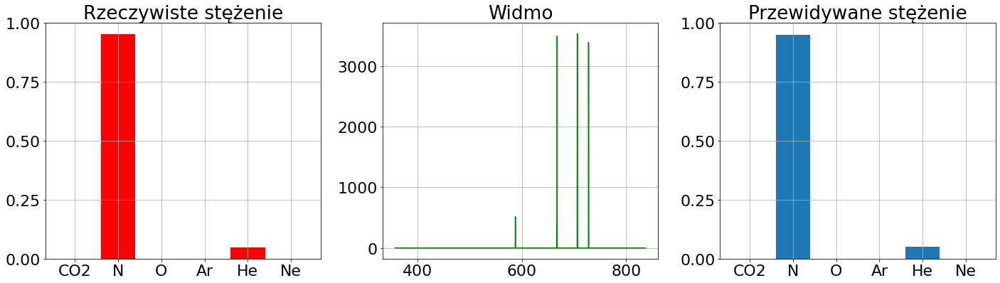

1


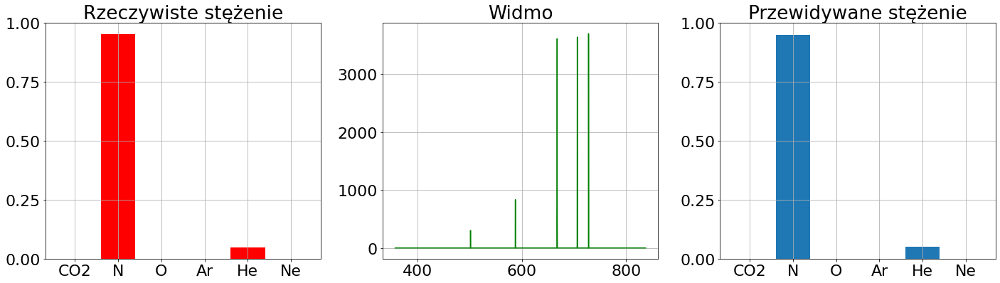

2


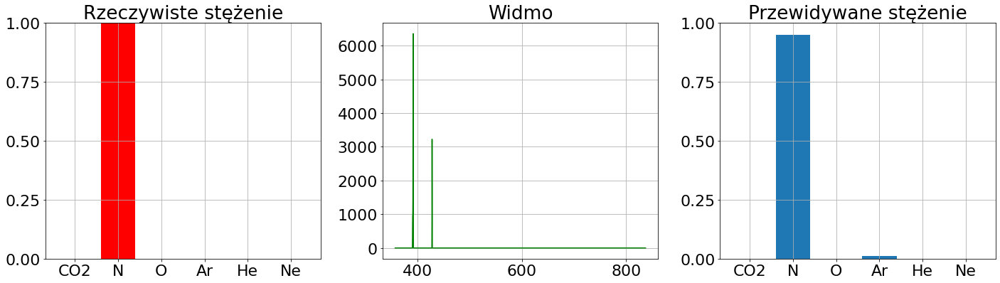

3


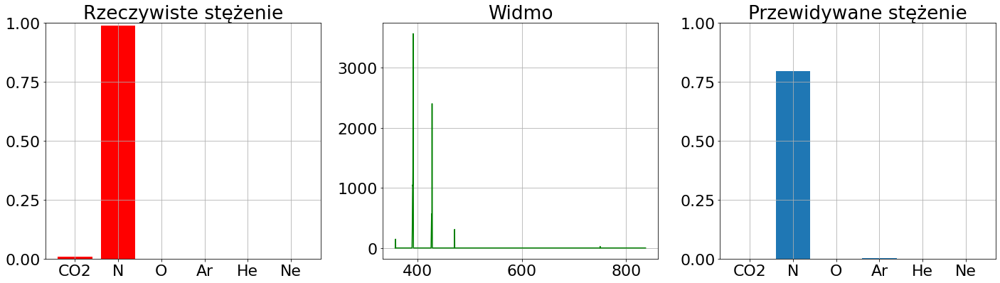

4


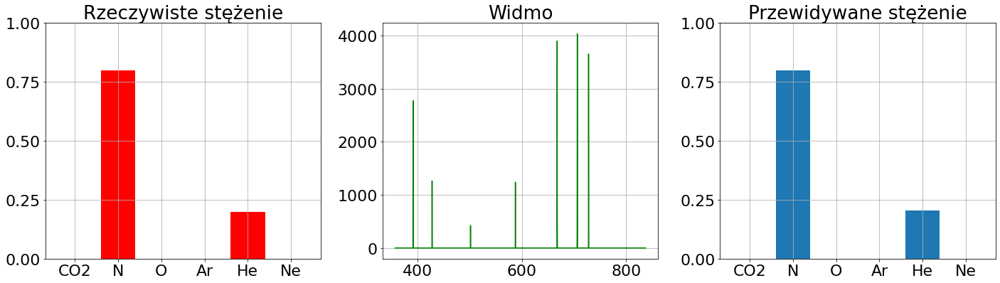

5


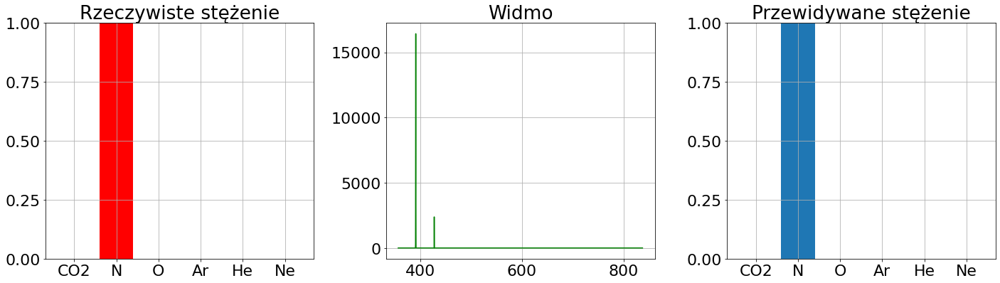

6


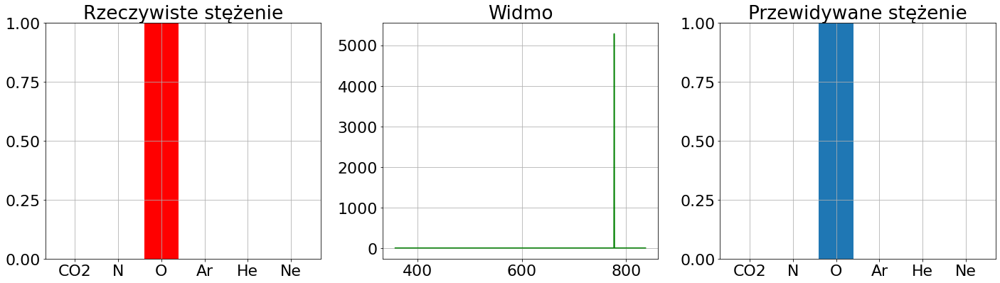

7


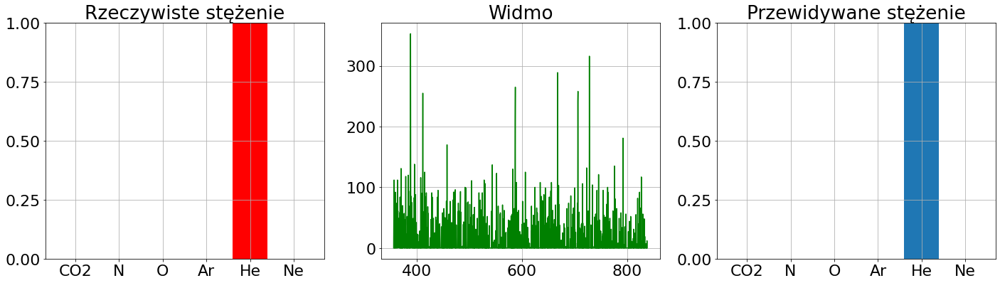

8


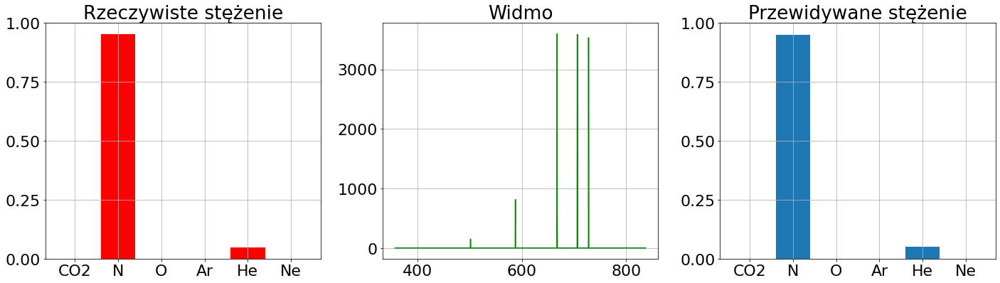

9


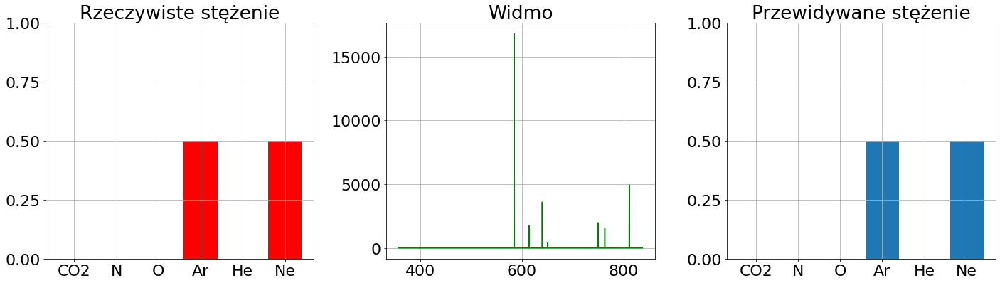

10


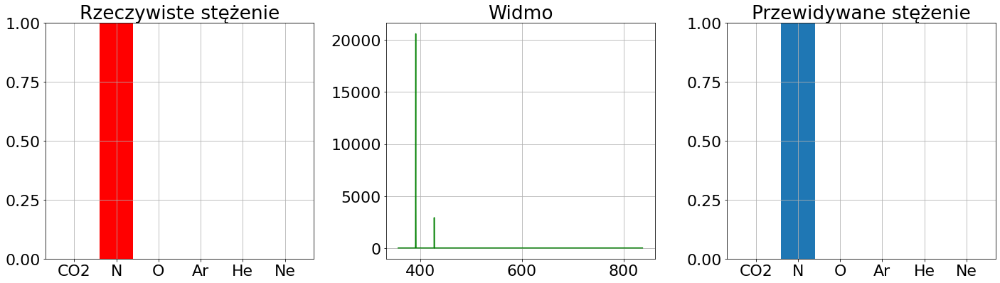

11


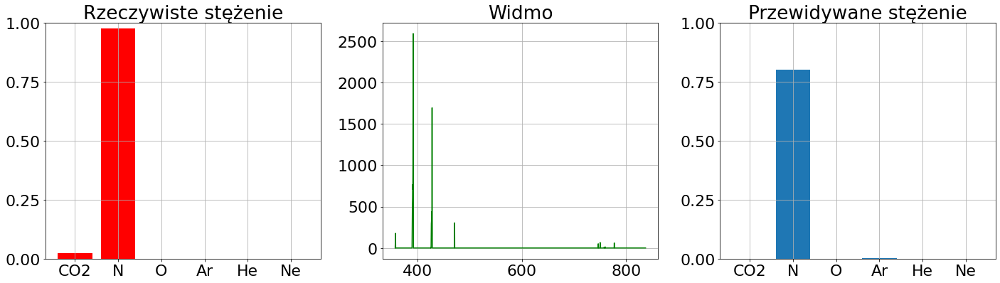

12


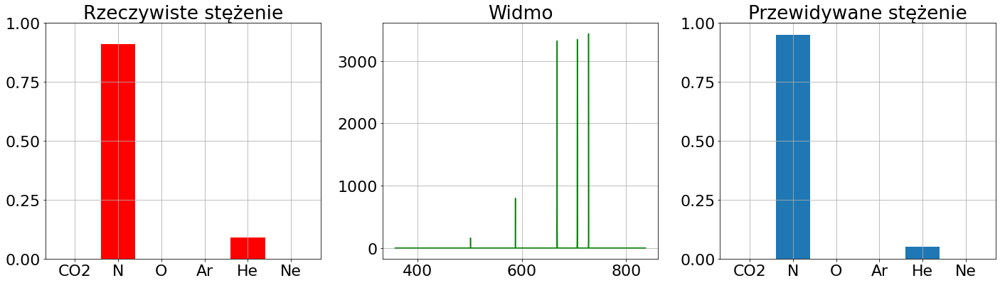

13


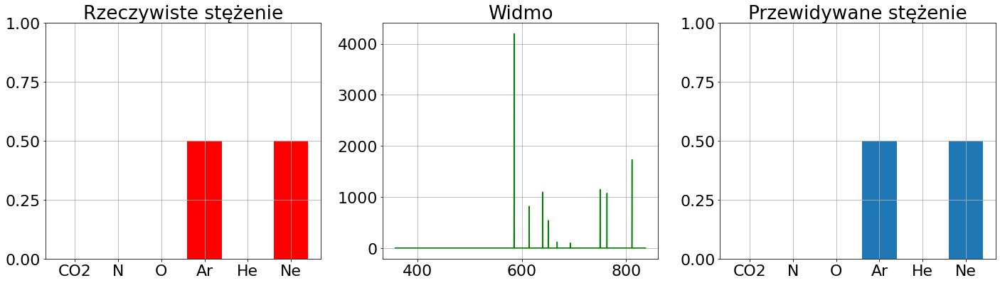

14


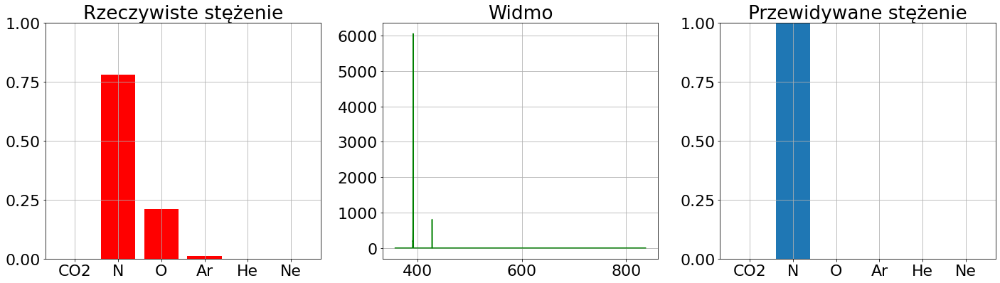

15


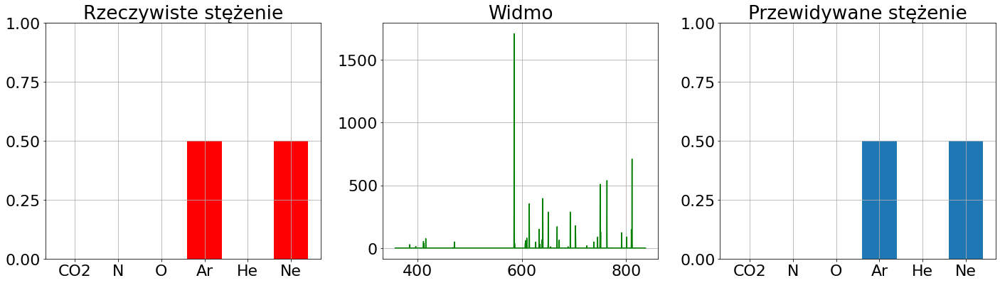

16


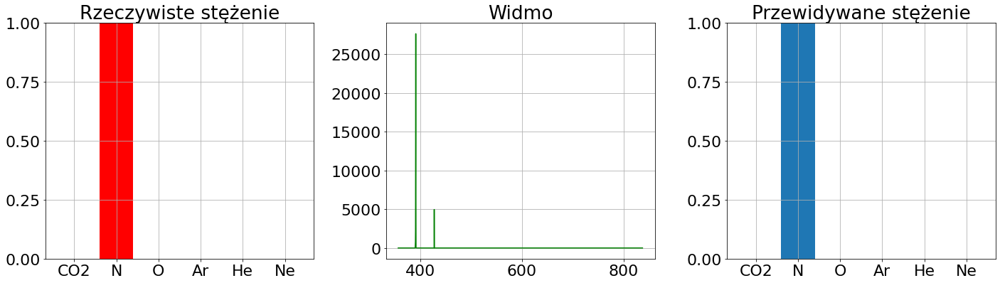

17


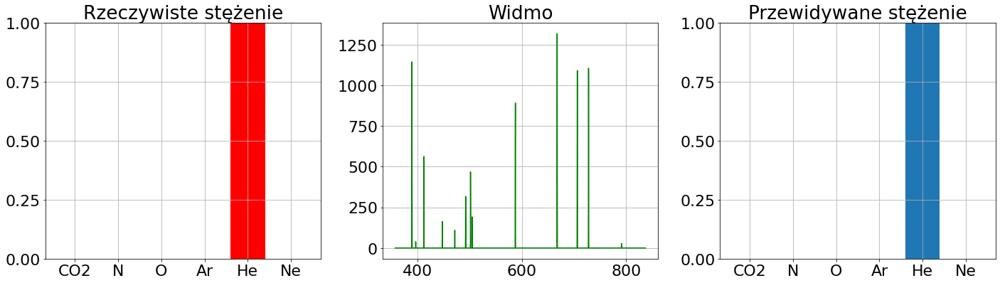

18


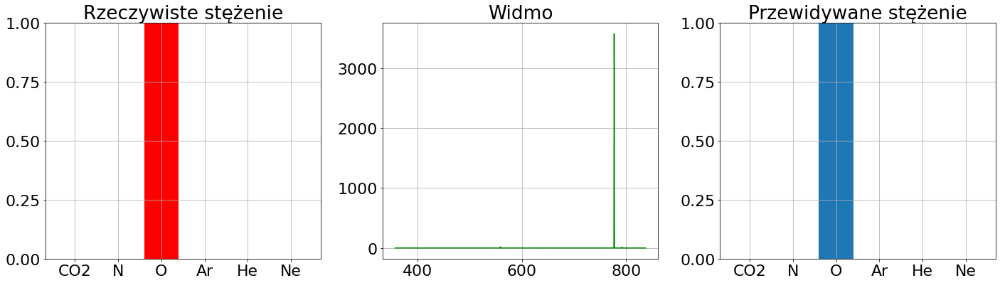

19


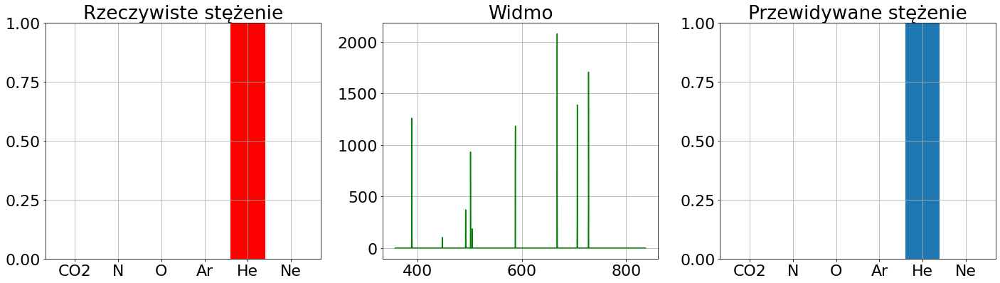

20


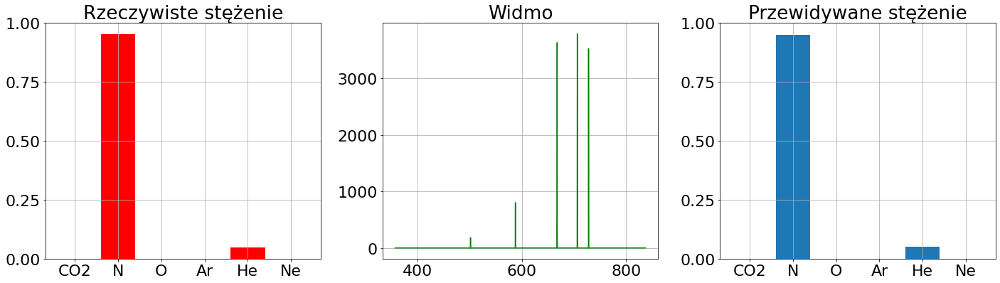

21


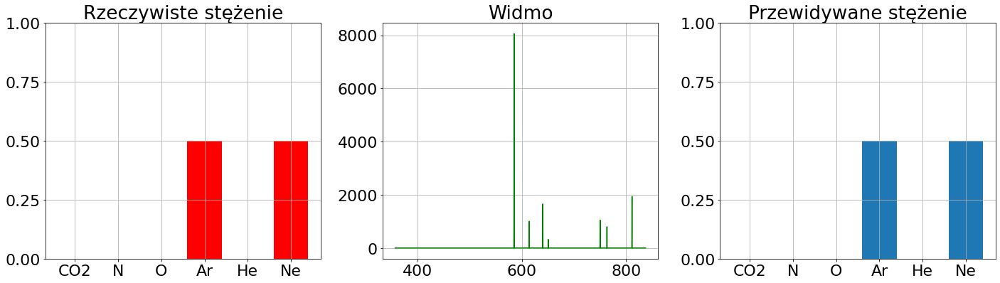

22


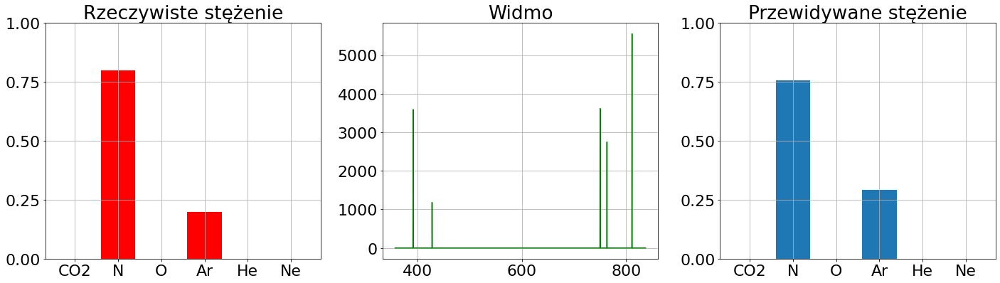

23


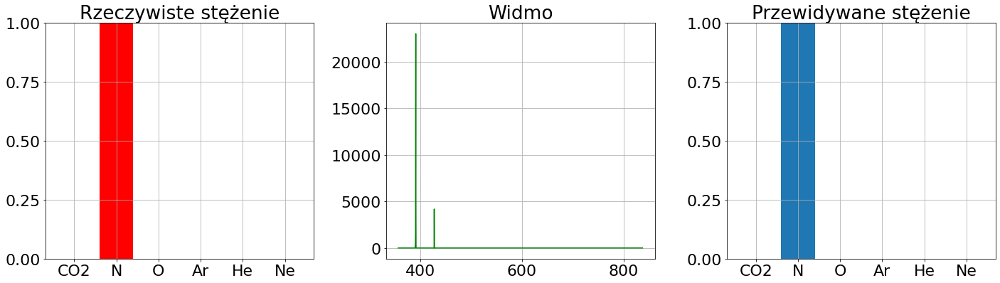

24


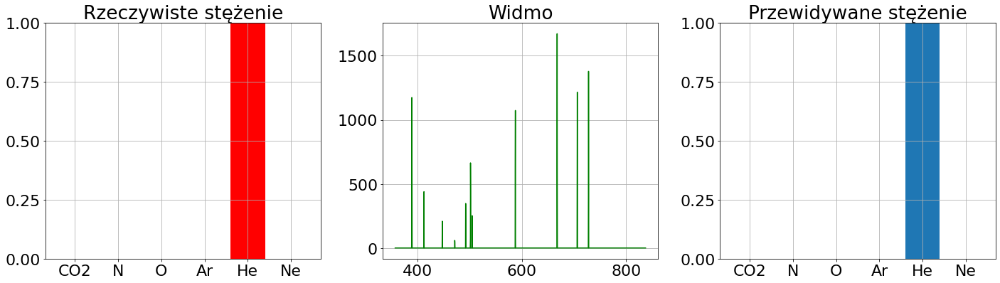

25


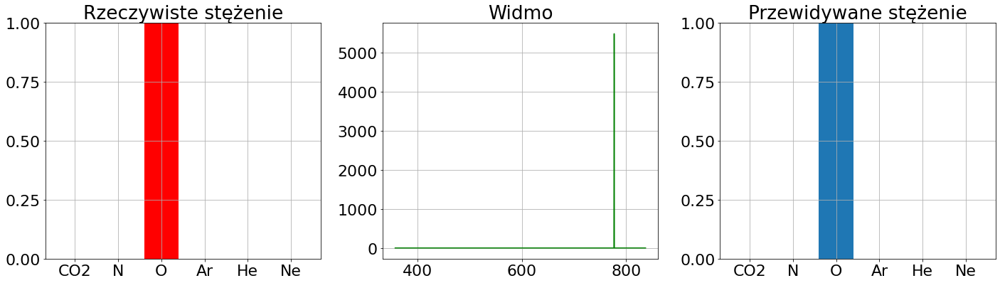

26


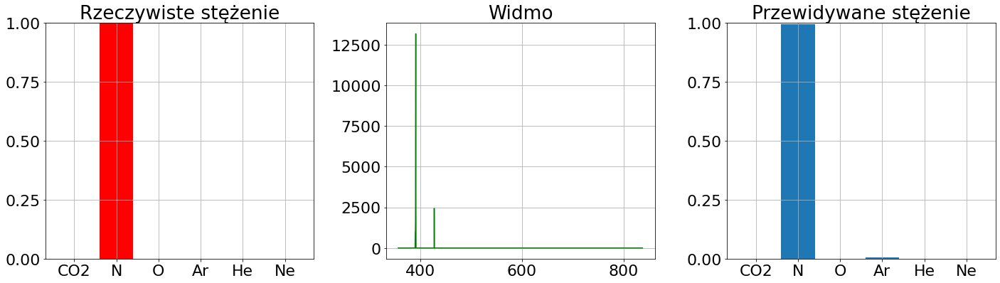

27


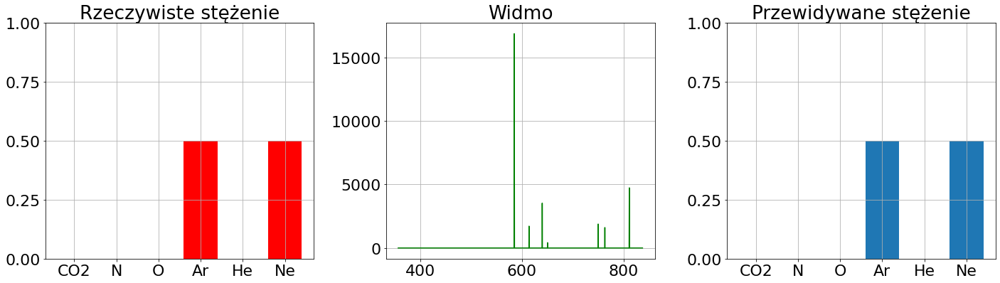

28


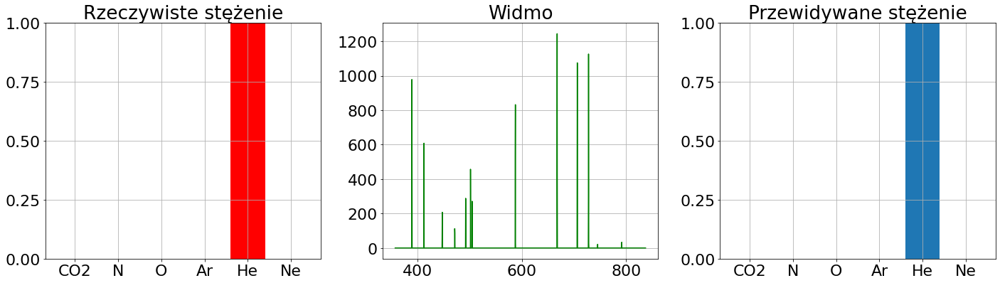

29


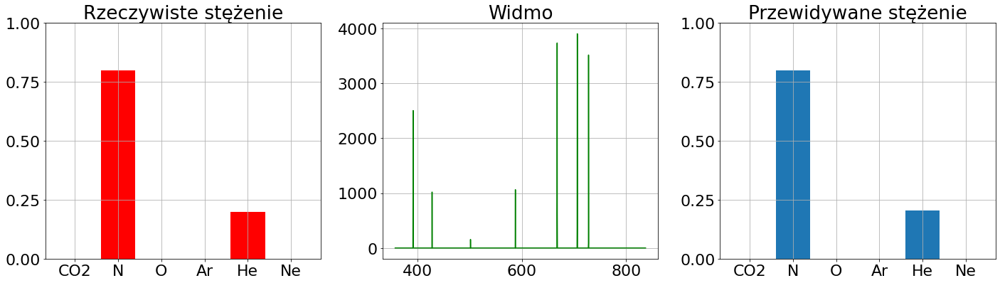

30


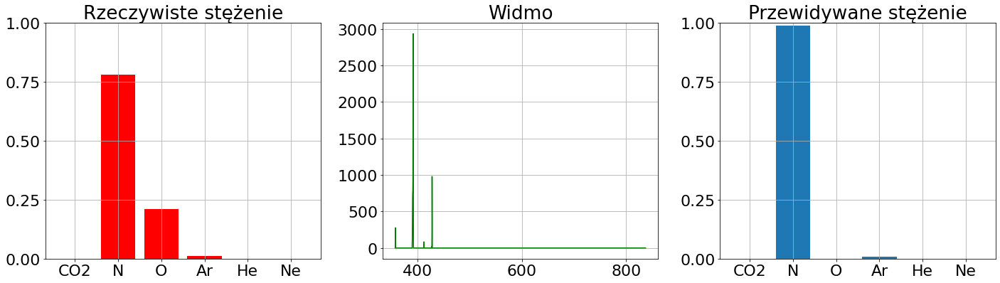

31


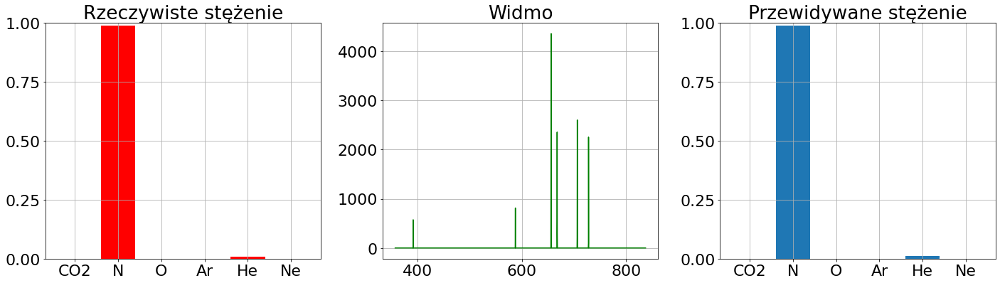

32


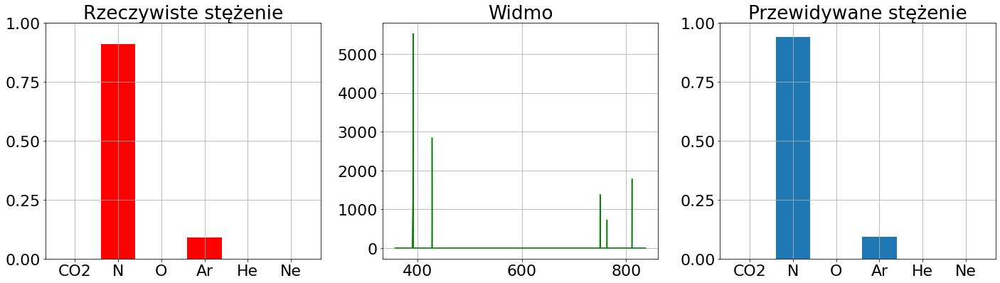

33


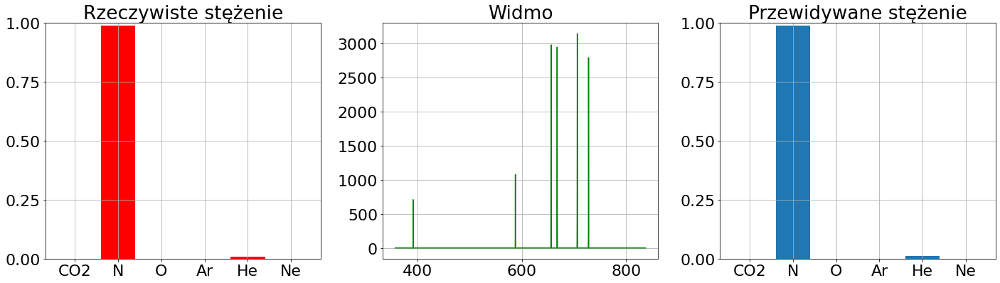

34


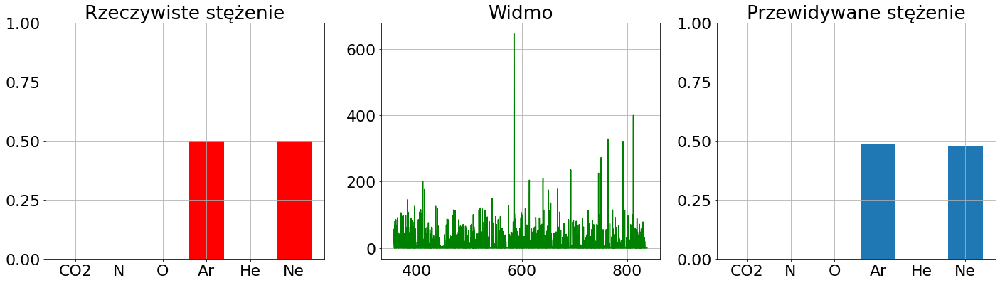

35


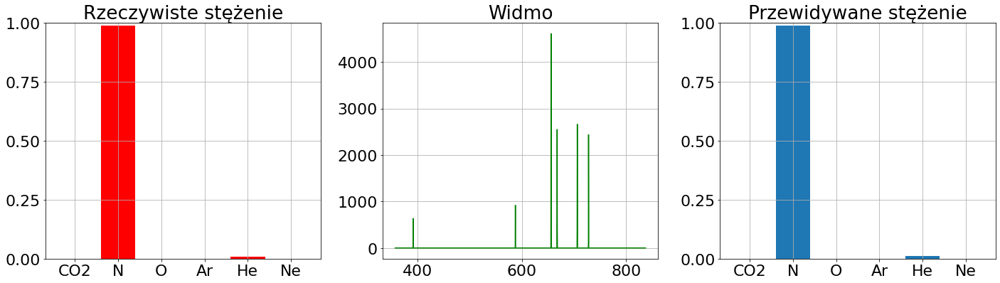

36


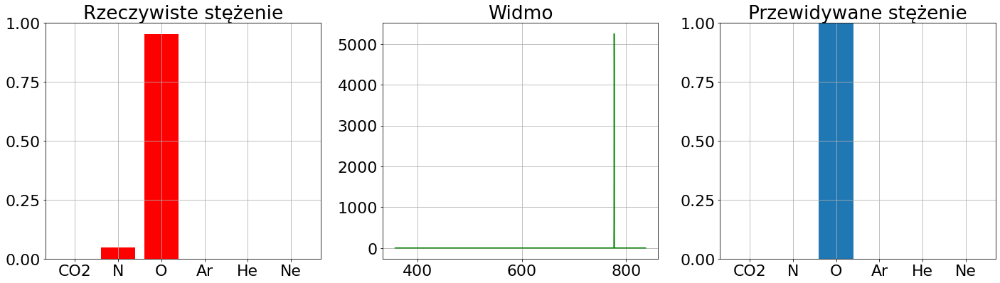

37


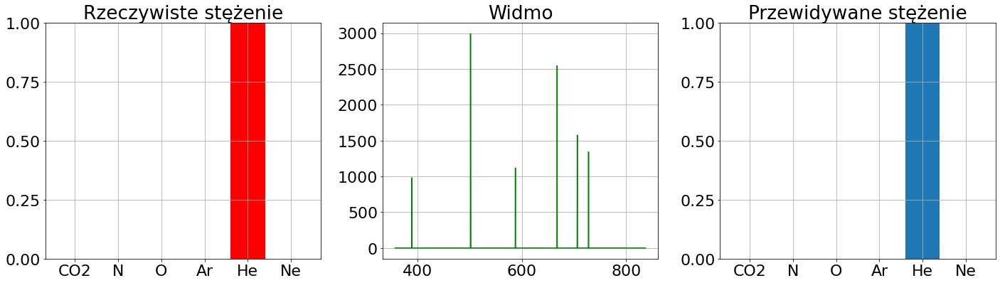

38


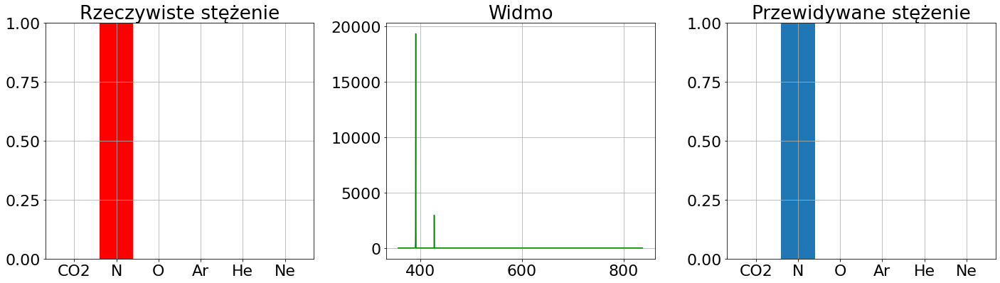

39


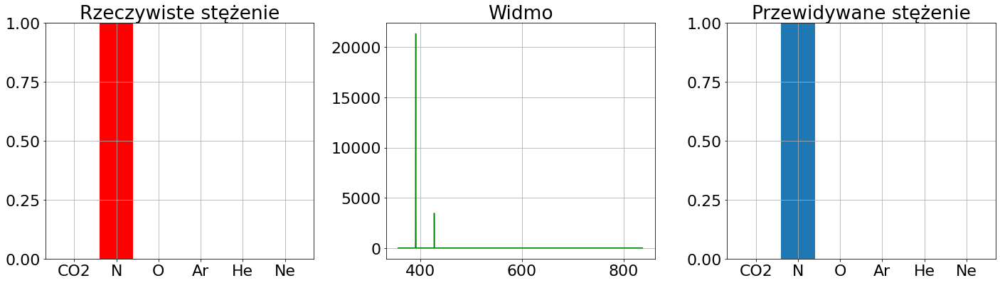

40


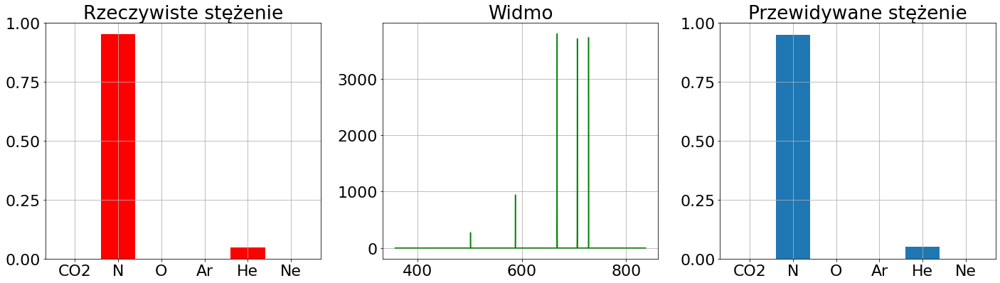

41


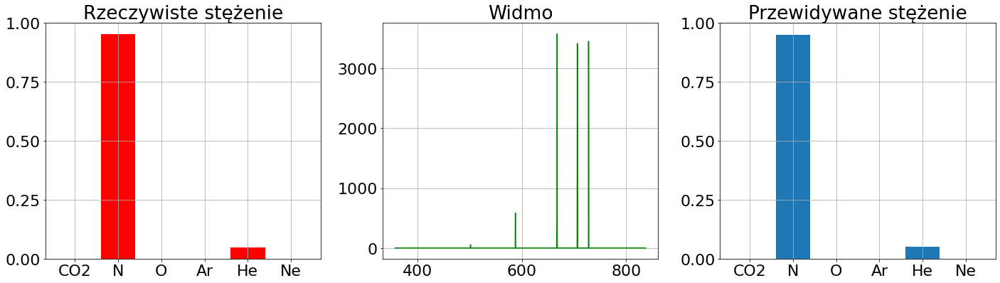

42


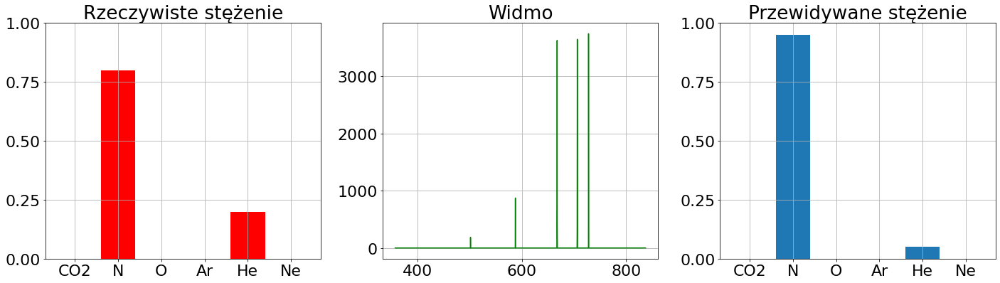

43


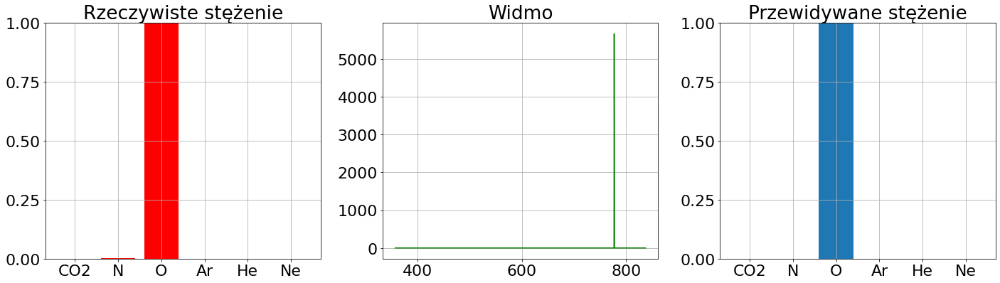

44


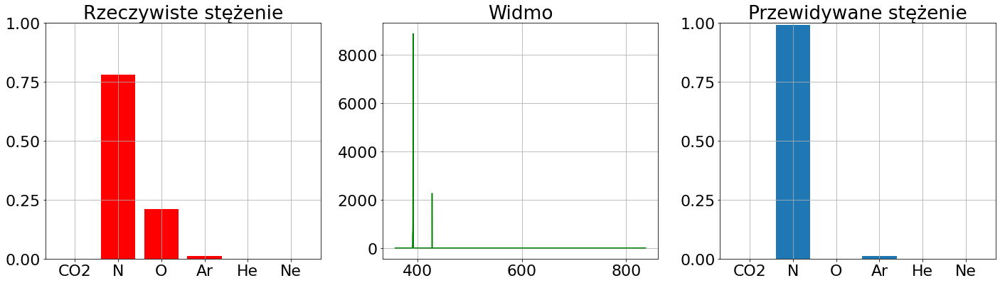

45


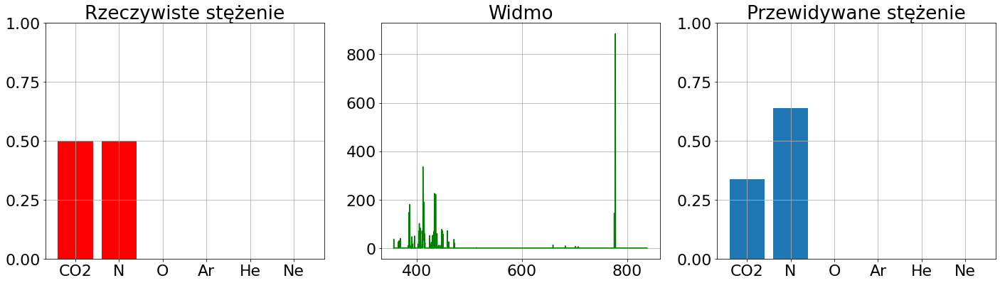

46


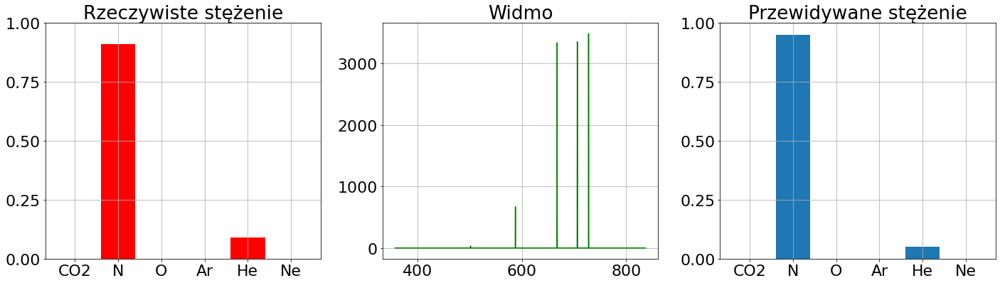

47


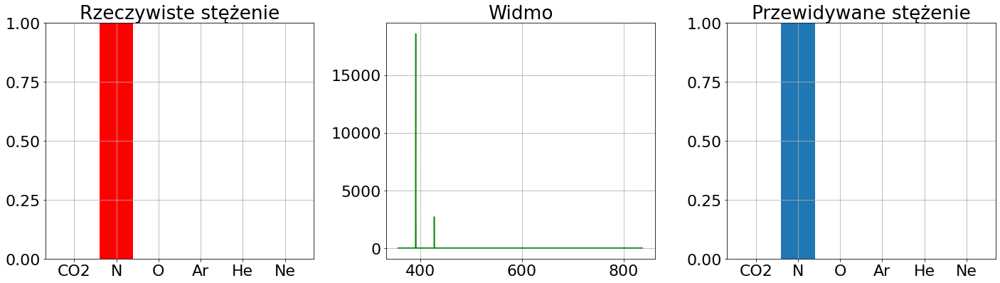

48


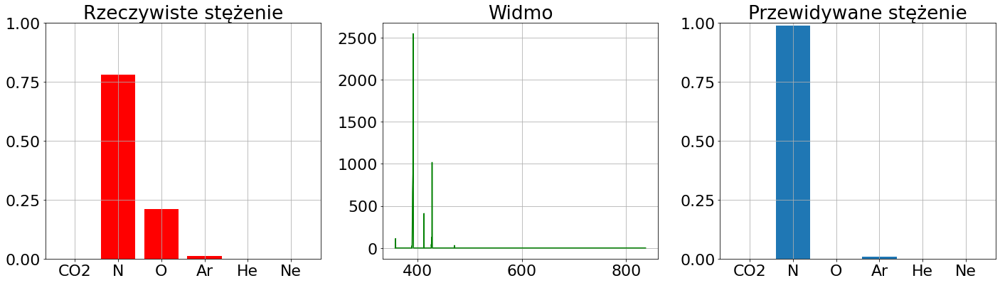

49


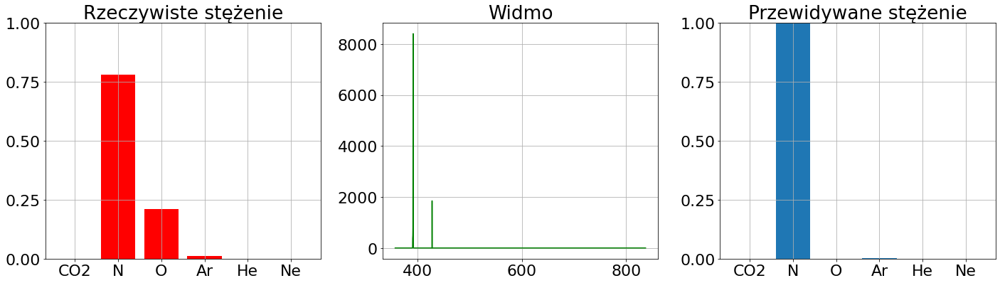

50


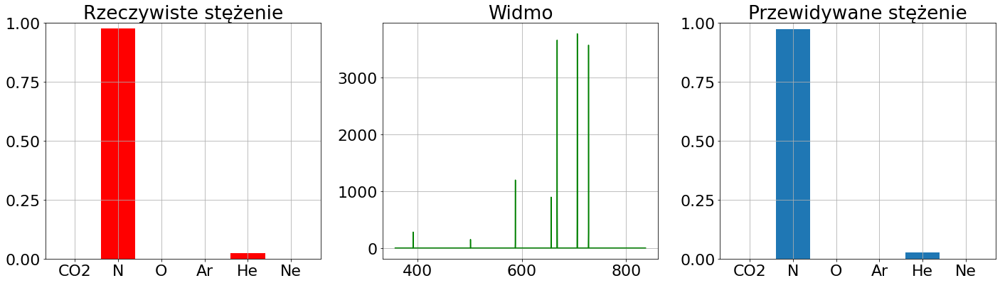

51


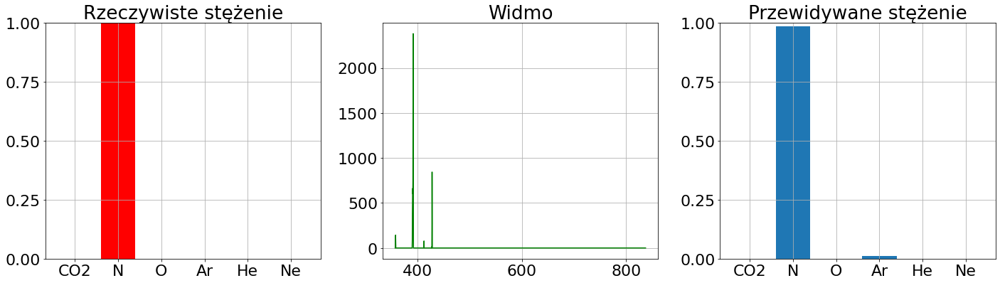

52


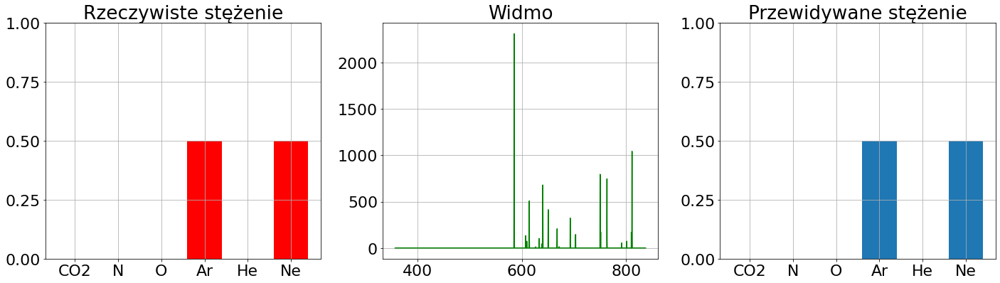

53


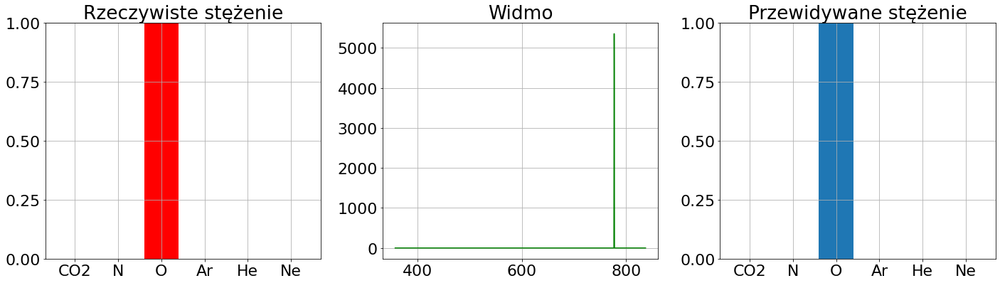

54


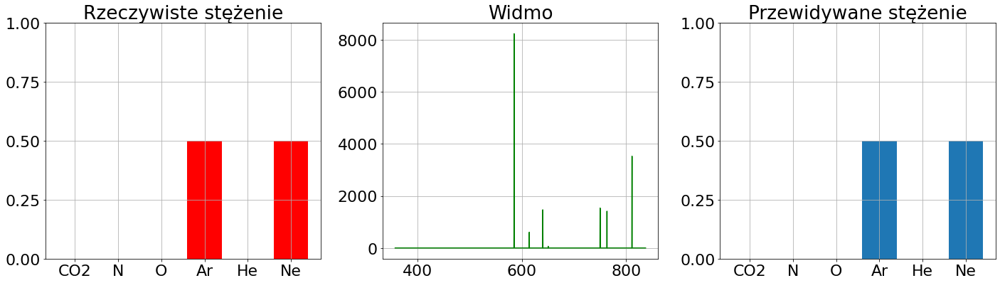

55


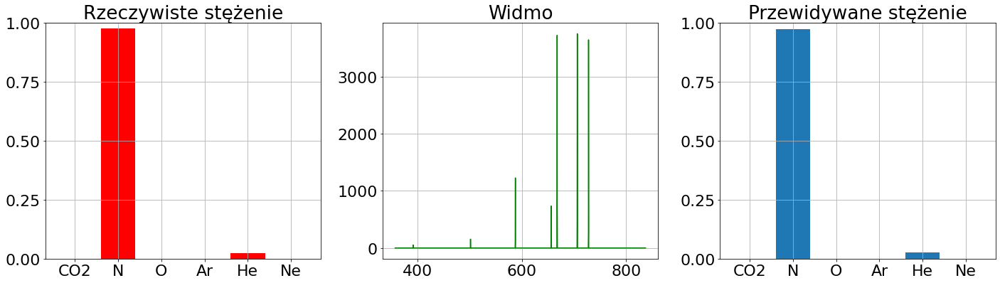

56


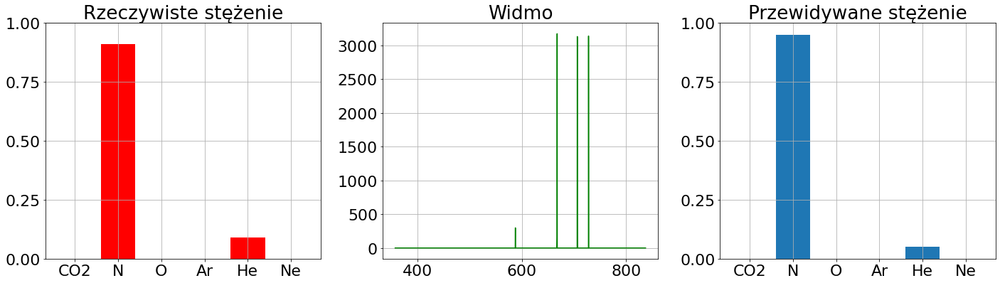

57


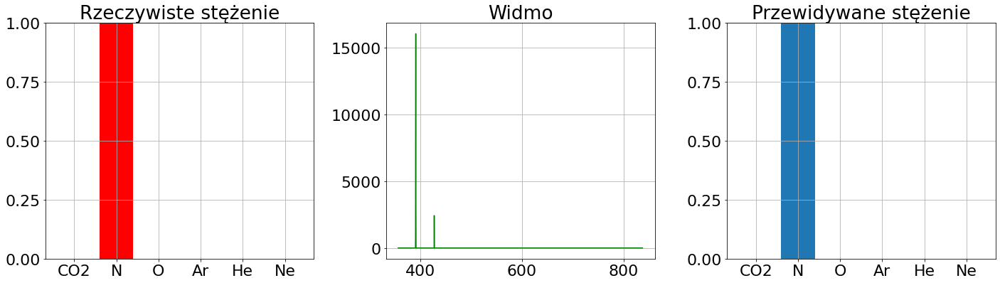

58


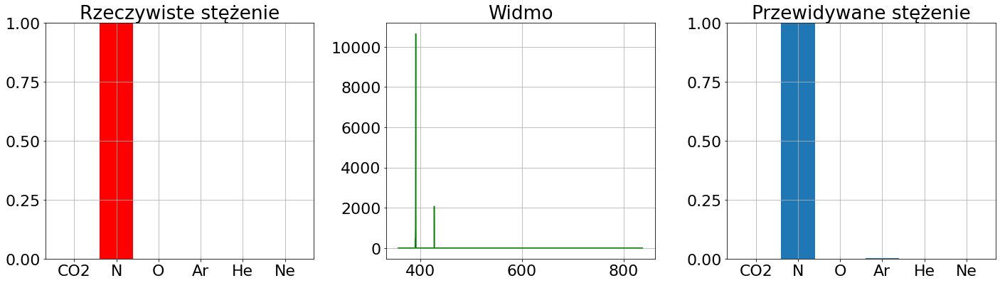

59


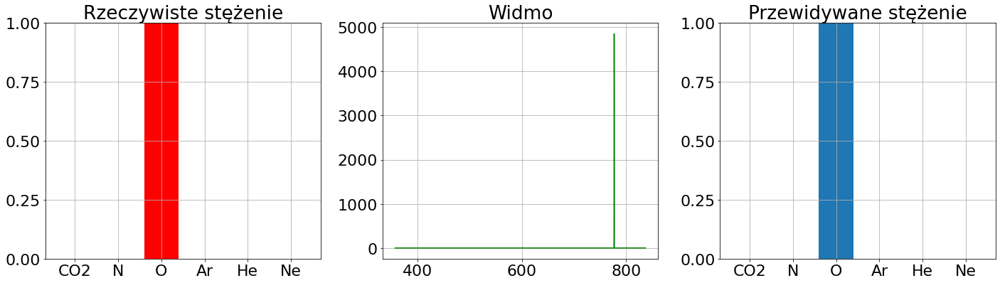

60


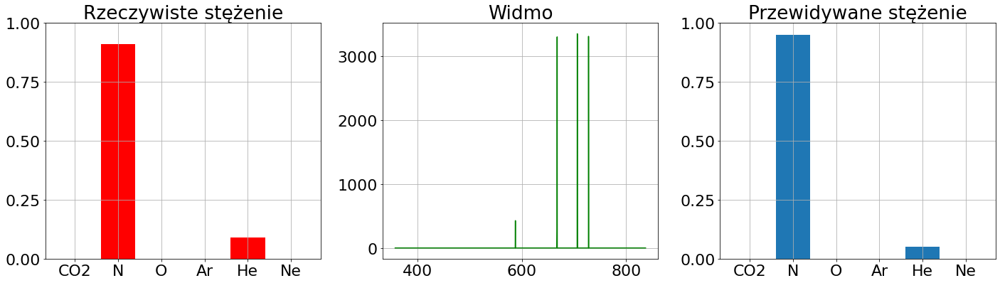

61


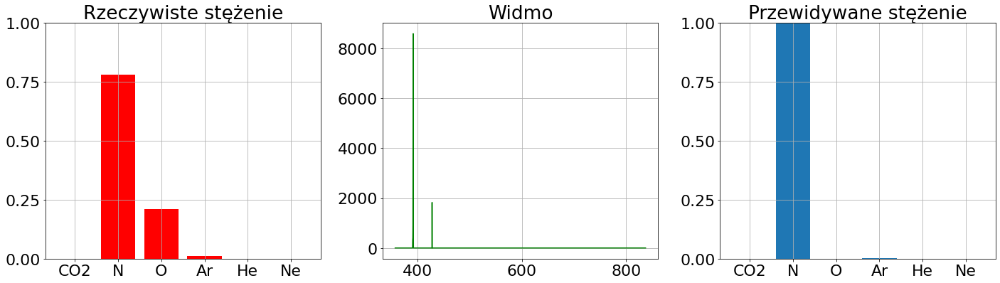

62


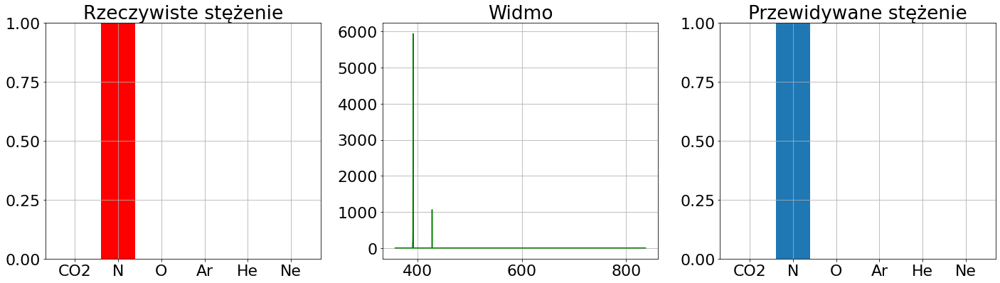

63


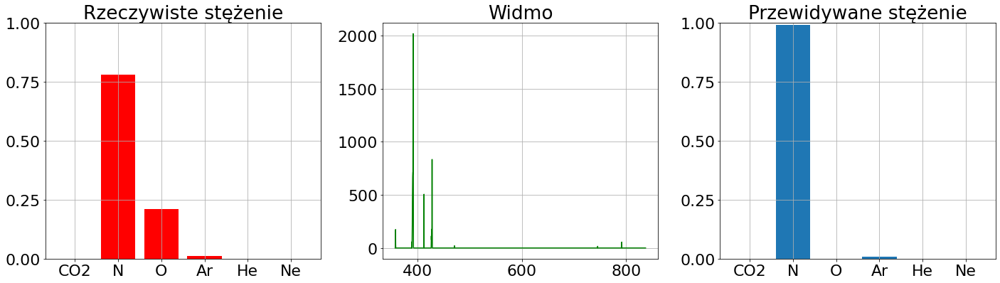

64


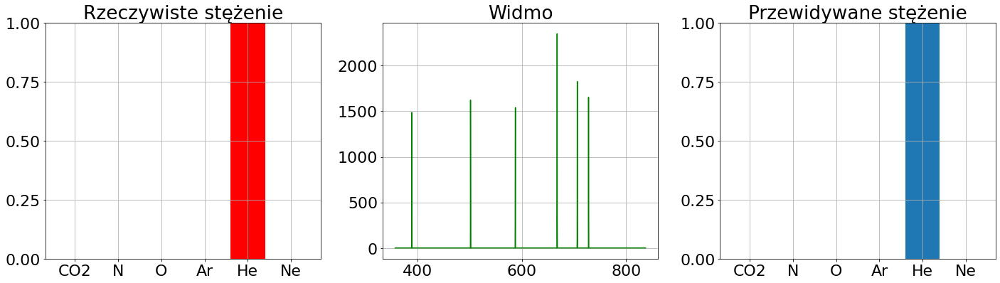

65


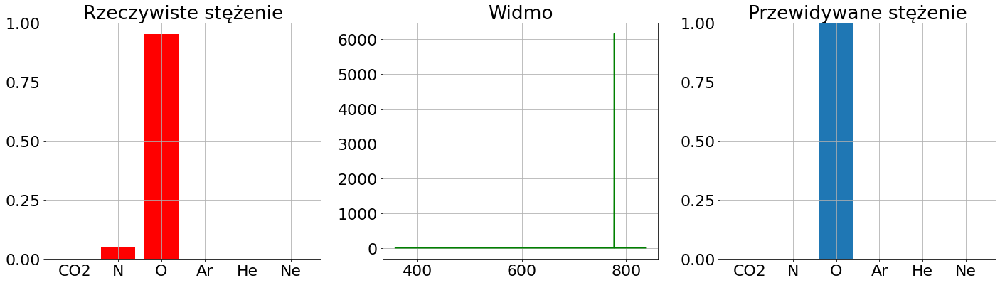

66


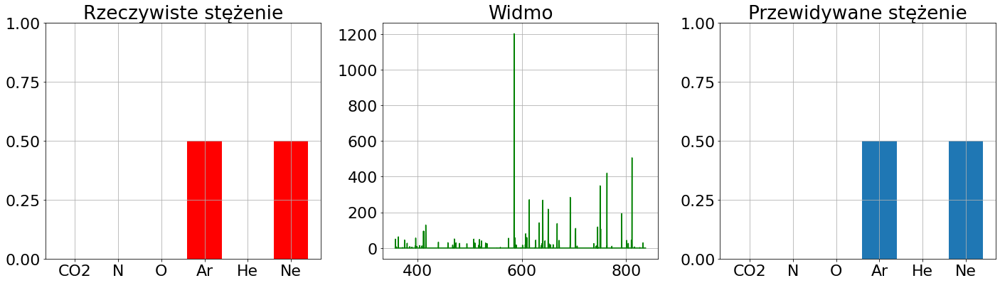

67


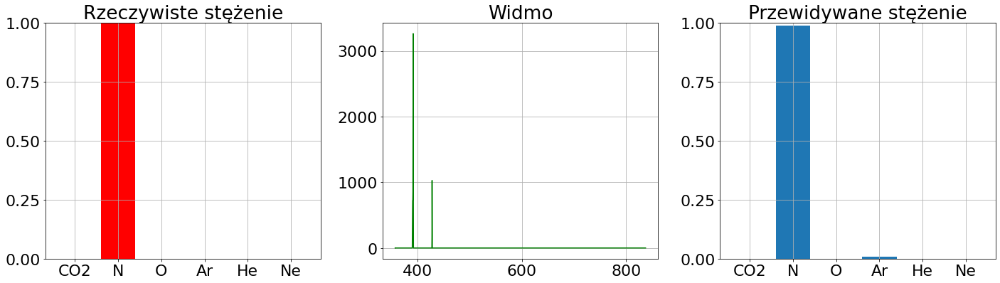

68


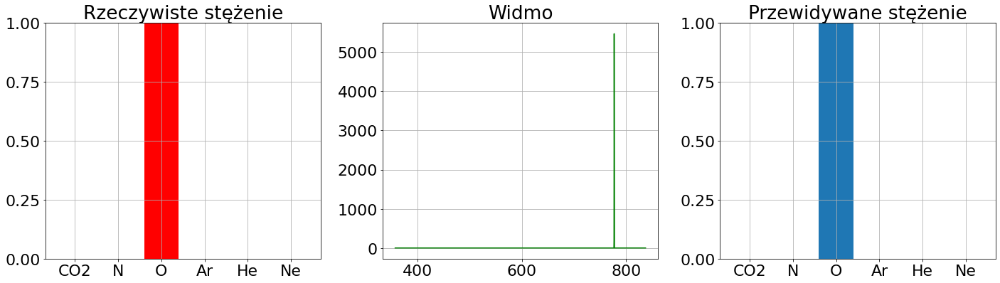

69


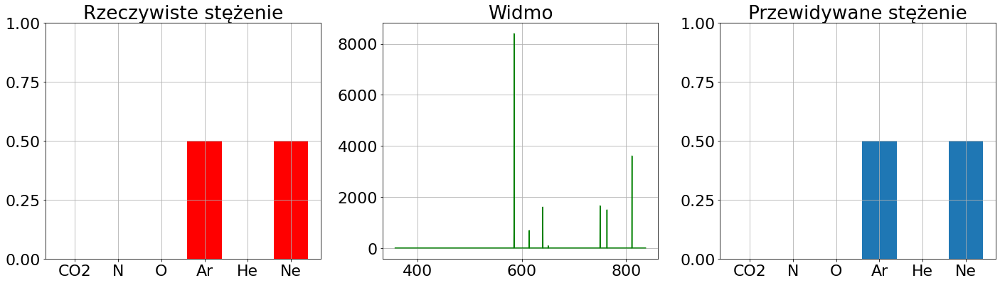

70


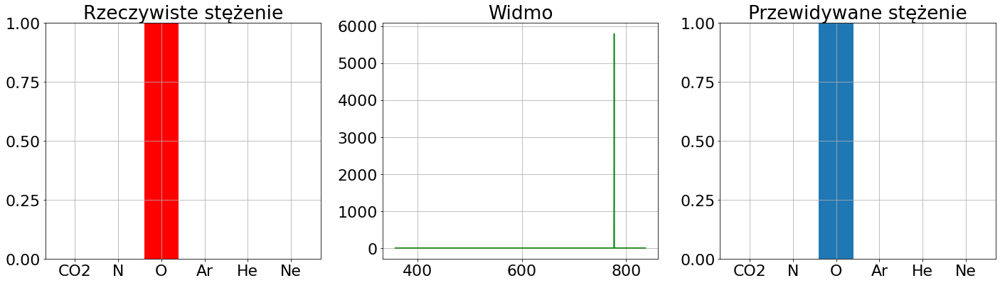

71


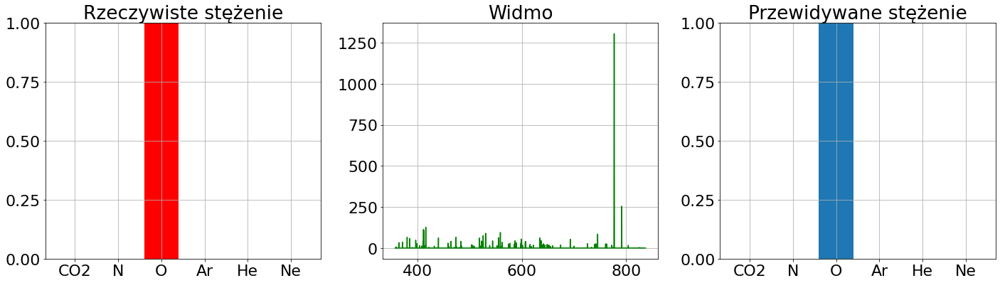

72


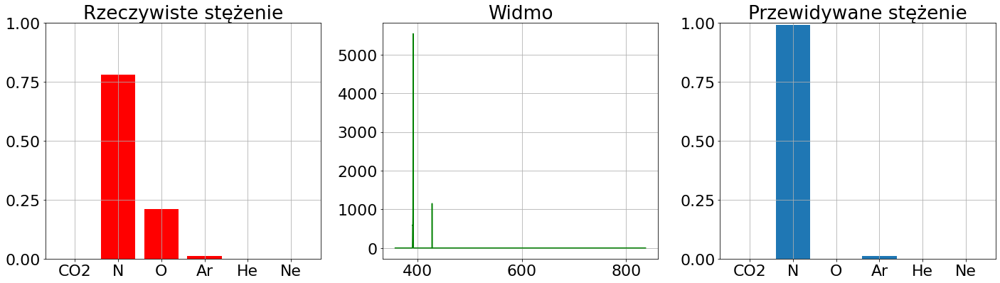

73


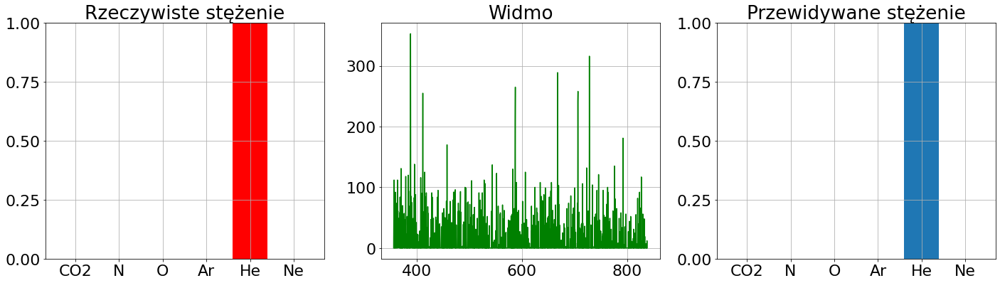

74


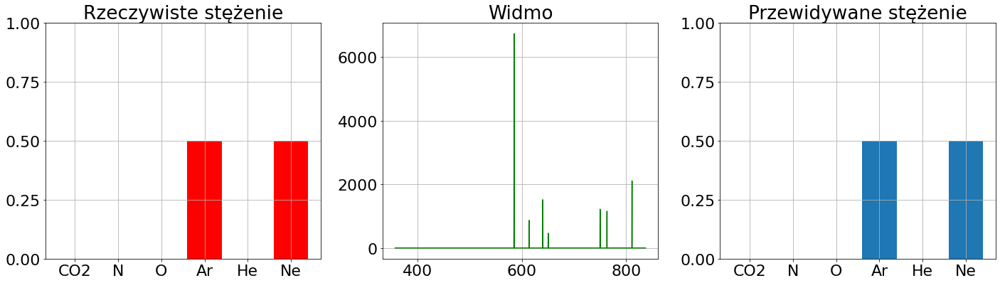

75


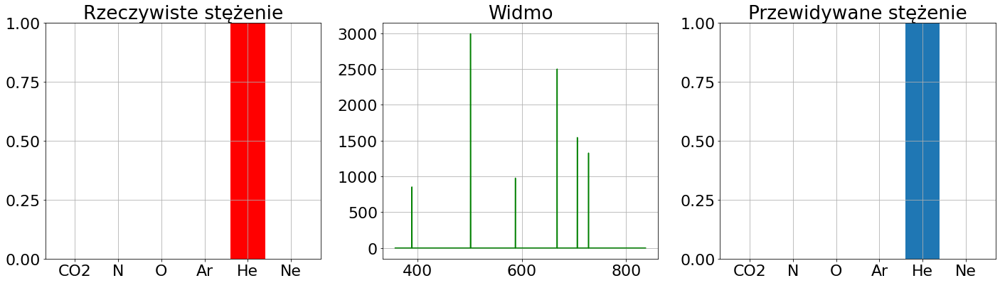

76


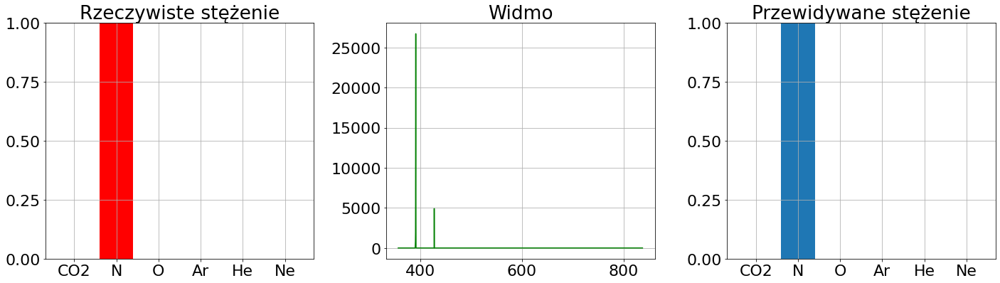

77


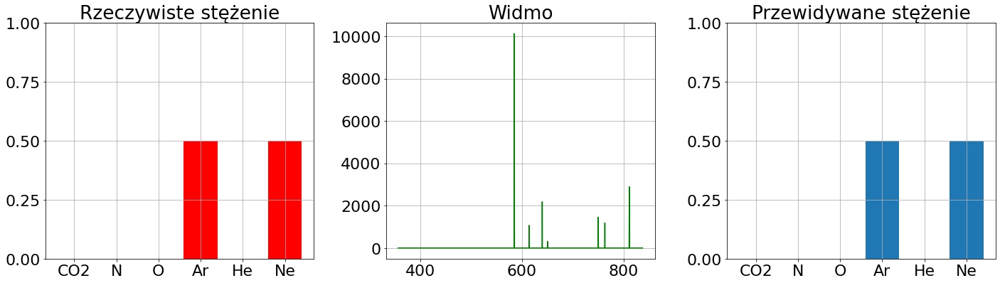

78


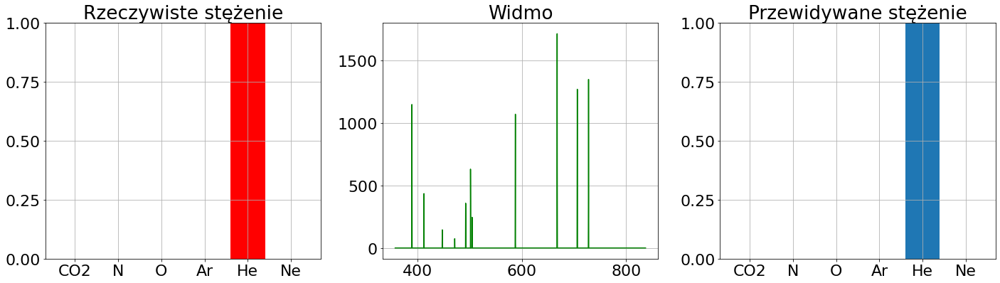

79


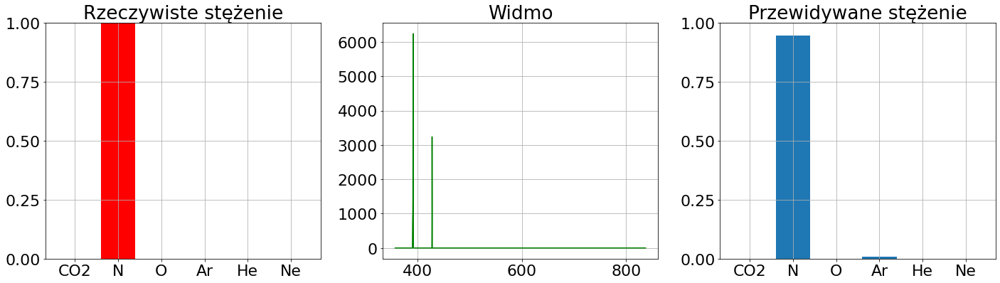

80


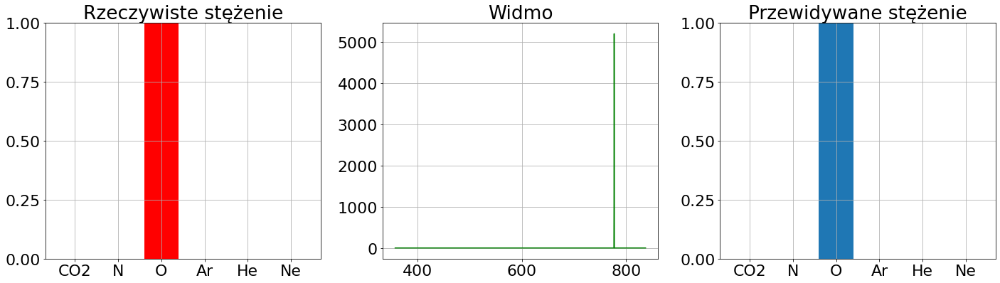

81


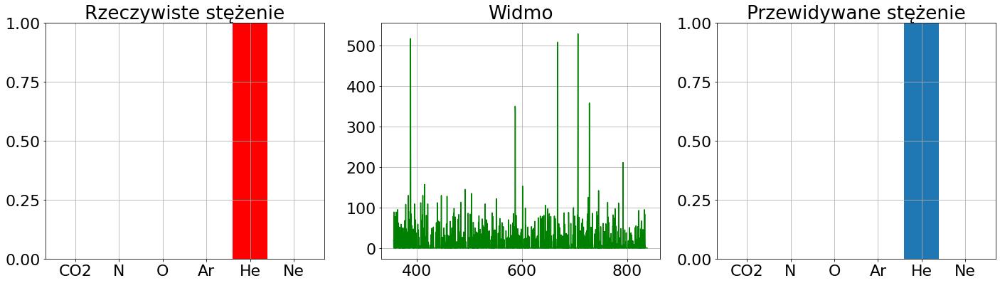

82


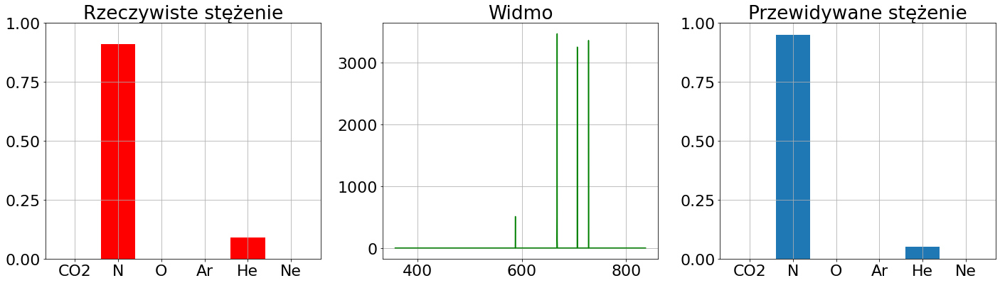

83


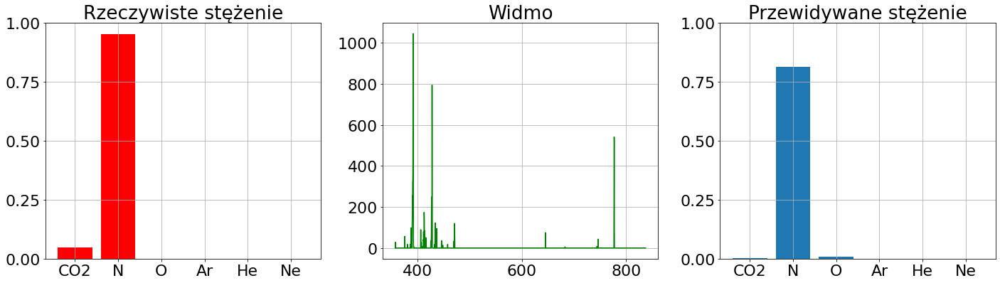

84


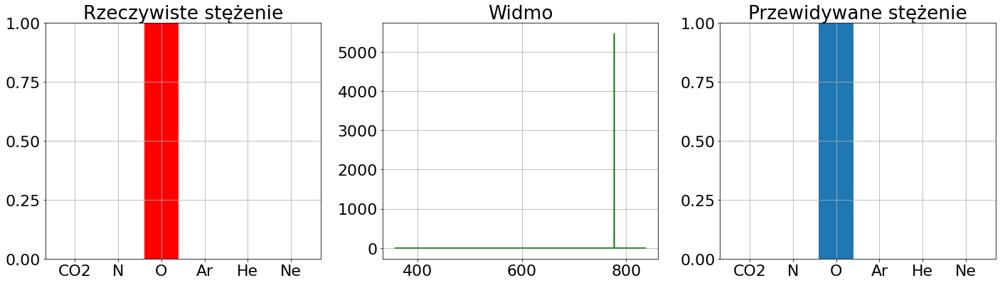

85


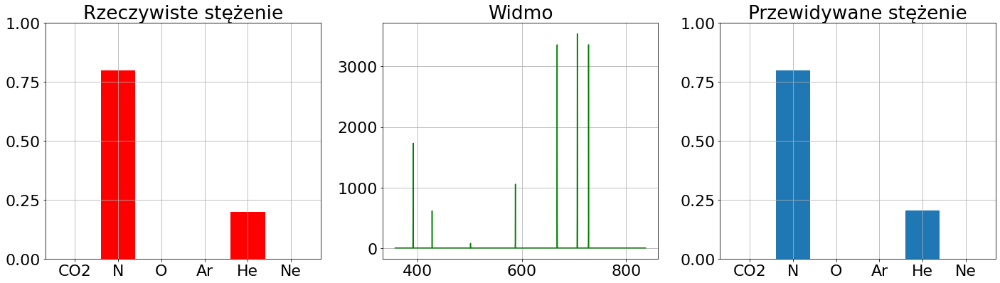

86


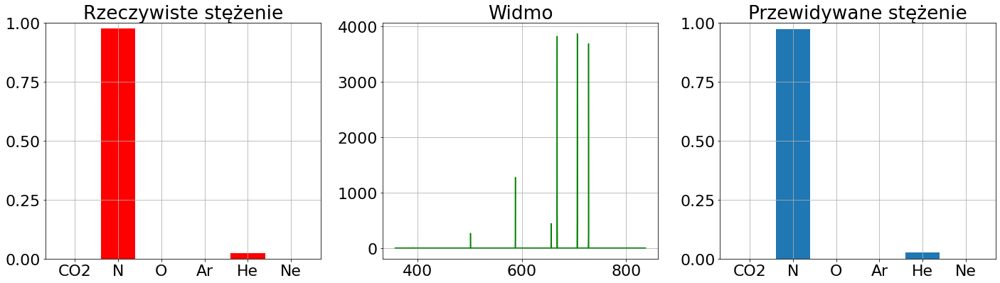

87


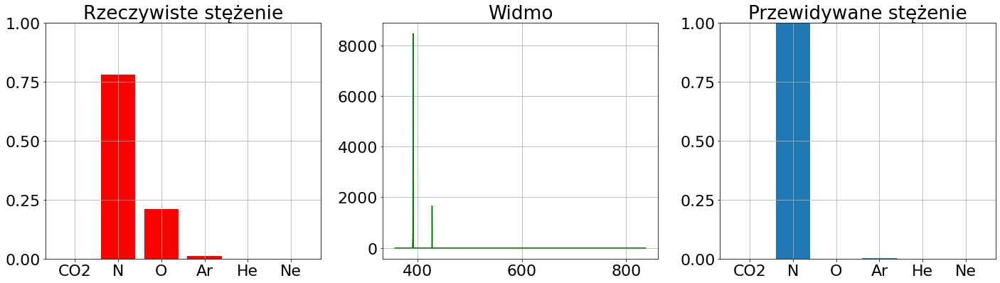

88


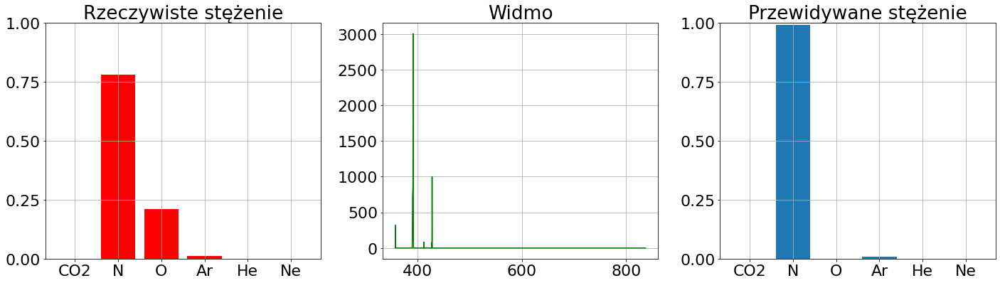

89


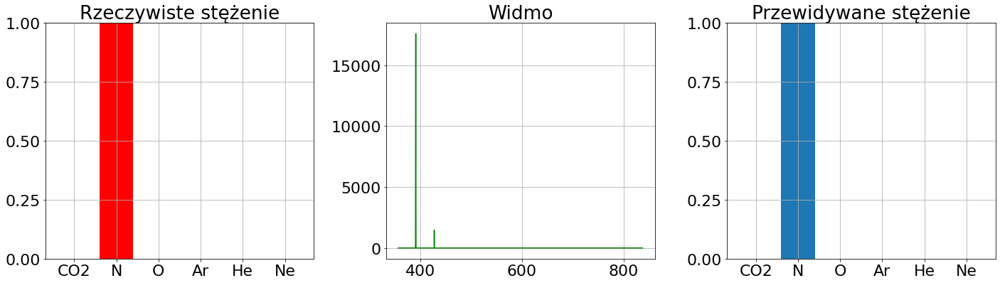

90


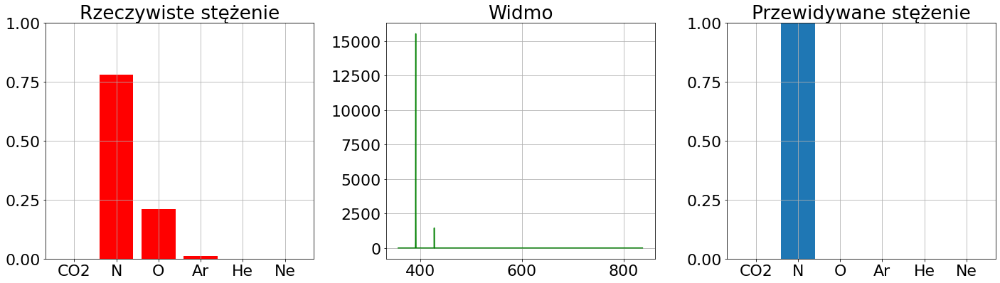

91


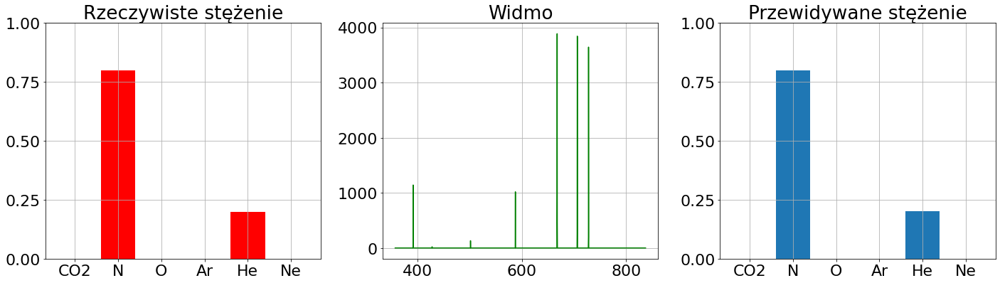

92


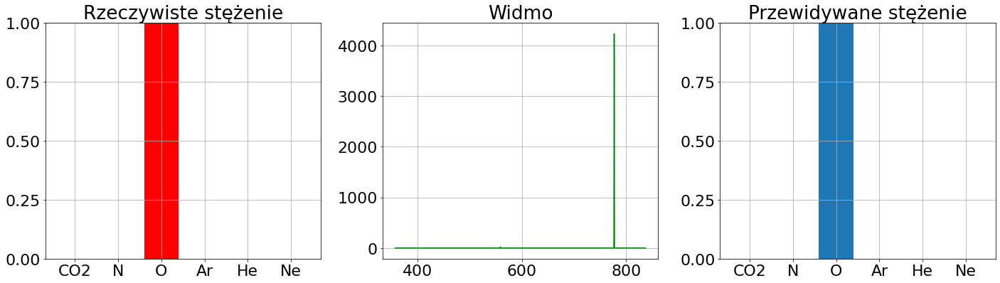

93


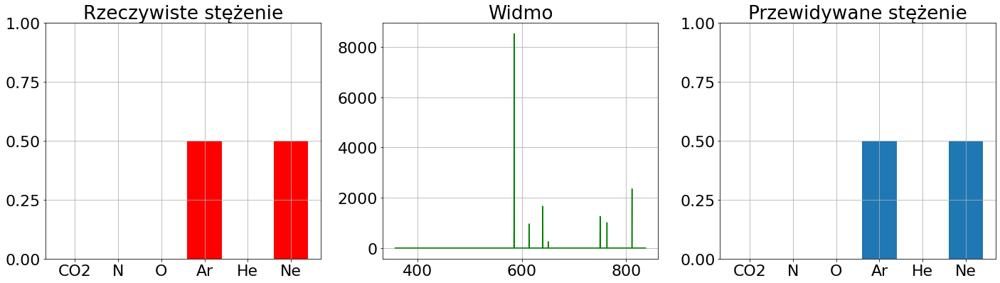

In [361]:
for i in range(94):
    print(i)
    fig = show_predictions(hypermodel, test_spectrumsA, test_concentrations, i)
    fig.savefig('siec_A_wyniki/siec_A_' + "{:02d}".format(i) +".jpg", dpi=fig.dpi)

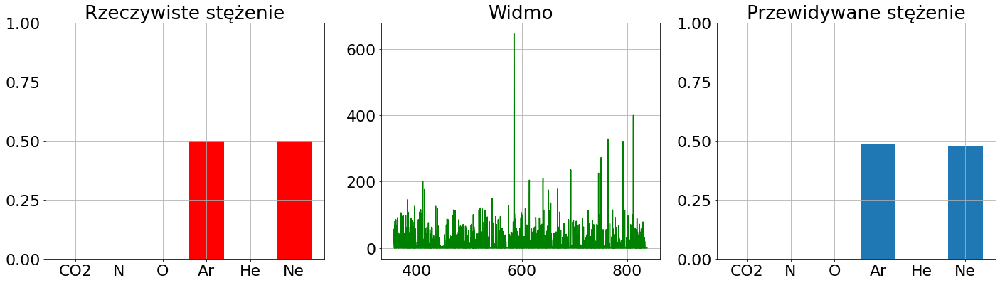

In [334]:
fig = show_predictions(hypermodel, test_spectrumsA, test_concentrations, 34)

In [336]:
fig.savefig('siec_A_przewidywania_ArNeOpt', dpi=fig.dpi)

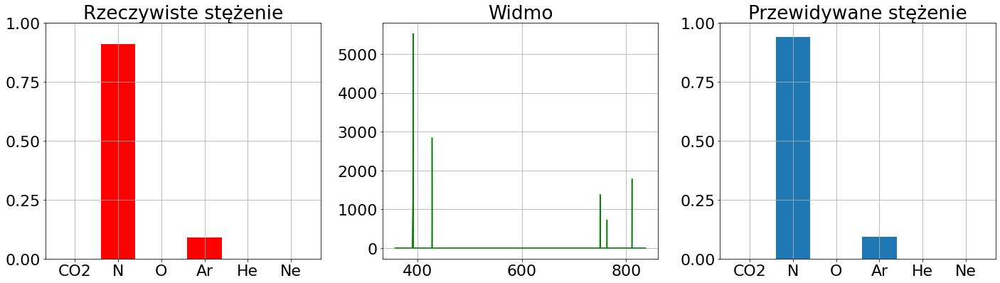

In [337]:
fig = show_predictions(hypermodel, test_spectrumsA, test_concentrations, 32)

In [338]:
fig.savefig('siec_A_przewidywania_NiArOpt', dpi=fig.dpi)

In [362]:
hypermodel.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 528)               1081872   
_________________________________________________________________
dense_1 (Dense)              (None, 240)               126960    
_________________________________________________________________
dense_2 (Dense)              (None, 128)               30848     
_________________________________________________________________
dense_3 (Dense)              (None, 6)                 774       
Total params: 1,240,454
Trainable params: 1,240,454
Non-trainable params: 0
_________________________________________________________________


In [358]:
hypermodel.save('siecA.h5')

# 2. Sieć B

Sieć B ma założeniu brać pełne dane pomiarowe tj. widmo, ciśnienie oraz napięcie na strukturze to znajdowania stężenia gazu.

## 2.1. Dane

In [186]:
train_data = pd.read_csv("train_data.csv")
test_data = pd.read_csv("test_data.csv")
wavelengths = np.loadtxt("wavelengths")

In [202]:
train_data.head()

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,972.0,0.0150,0.0,0.666667,0.0,0.0,0.333333,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,985.0,0.0050,0.0,0.000000,1.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,637.0,0.0100,0.0,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,971.0,0.0123,0.0,0.909091,0.0,0.0,0.090909,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,965.0,0.0130,0.0,0.975610,0.0,0.0,0.024390,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [187]:
train_concentrations = train_data.to_numpy()[:, 2:8]
train_spectrums_B = np.concatenate([train_data.to_numpy()[:, :2], train_data.to_numpy()[:, 8:]], axis=1)

test_concentrations = test_data.to_numpy()[:, 2:8]
test_spectrums_B = np.concatenate([test_data.to_numpy()[:, :2], test_data.to_numpy()[:, 8:]], axis=1)

## 2.2. Wstępny model

In [183]:
stop_learning = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [188]:
tf.random.set_seed(13)

p_multipler = np.ones(2048 + 2)
p_multipler[1] = 10000

modelB = tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(2048+2,)),
    tf.keras.layers.Lambda(lambda x: x * p_multipler ),
    tf.keras.layers.Dense(512, activation='tanh'),
    tf.keras.layers.Dense(256, activation='tanh'),
    tf.keras.layers.Dense(128, activation='tanh'),
    tf.keras.layers.Dense(6, activation="sigmoid")
]
)

modelB.compile(loss=custom_loss,
              optimizer='Adam',
              metrics=['mse','mae'])

history = modelB.fit(train_spectrums_B,
                    train_concentrations,
                    epochs = 100,
                    verbose = 2,
                    callbacks = [stop_learning], 
                    validation_split=0.2)

Epoch 1/100
10/10 - 1s - loss: 5.2512 - mse: 0.0902 - mae: 0.1906 - val_loss: 1.1706 - val_mse: 0.0408 - val_mae: 0.0889
Epoch 2/100
10/10 - 0s - loss: 1.0077 - mse: 0.0314 - mae: 0.0715 - val_loss: 0.7922 - val_mse: 0.0248 - val_mae: 0.0591
Epoch 3/100
10/10 - 0s - loss: 0.7532 - mse: 0.0187 - mae: 0.0508 - val_loss: 0.6152 - val_mse: 0.0109 - val_mae: 0.0412
Epoch 4/100
10/10 - 0s - loss: 0.6281 - mse: 0.0118 - mae: 0.0398 - val_loss: 0.5290 - val_mse: 0.0076 - val_mae: 0.0324
Epoch 5/100
10/10 - 0s - loss: 0.5711 - mse: 0.0104 - mae: 0.0348 - val_loss: 0.5085 - val_mse: 0.0071 - val_mae: 0.0305
Epoch 6/100
10/10 - 0s - loss: 0.5282 - mse: 0.0097 - mae: 0.0324 - val_loss: 0.4720 - val_mse: 0.0066 - val_mae: 0.0298
Epoch 7/100
10/10 - 0s - loss: 0.4928 - mse: 0.0091 - mae: 0.0309 - val_loss: 0.4463 - val_mse: 0.0064 - val_mae: 0.0284
Epoch 8/100
10/10 - 0s - loss: 0.4542 - mse: 0.0088 - mae: 0.0289 - val_loss: 0.4172 - val_mse: 0.0059 - val_mae: 0.0279
Epoch 9/100
10/10 - 0s - loss: 0

In [189]:
modelB.evaluate(test_spectrums_B, test_concentrations)

3/3 [==============================] - 0s 6ms/step - loss: 0.2243 - mse: 0.0024 - mae: 0.0153


[0.22426044940948486, 0.002393623348325491, 0.015284789726138115]

In [209]:
def show_predictionsB(mod, spectrums, concentrations, index):
  fig = plt.figure(figsize=(20,6))  
  labels=["CO2", "N", "O", "Ar", "He", "Ne"]
  plt.subplot(1, 3, 3) 
  plt.grid(True)
  plt.title("Przewidywane stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  prediction = mod.predict(np.asarray([spectrums[index]]))[0]
  thisplot = plt.bar(labels,  prediction)
  plt.ylim([0, 1])
    
  plt.subplot(1, 3, 2)   
  plt.title("Widmo")
  plt.grid(True)
  plt.plot(wavelengths , spectrums[index, 2:], color="green")
  plt.subplot(1, 3, 1)   

  plt.grid(True)
  plt.title("Rzeczywiste stężenie")
  plt.yticks([0.0, 0.25, 0.5, 0.75, 1.0])
  thisplot = plt.bar(labels,  concentrations[index], color="red")
  plt.ylim([0, 1])
    
  plt.tight_layout()
  plt.show()
  return fig

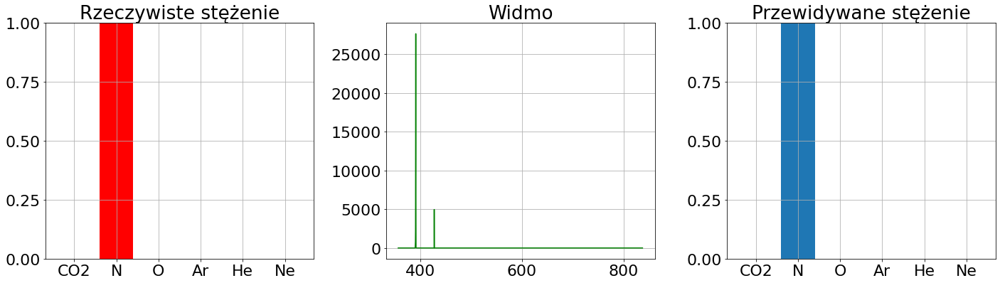

In [210]:
fig = show_predictionsB(modelB, test_spectrums_B, test_concentrations, 16)

0


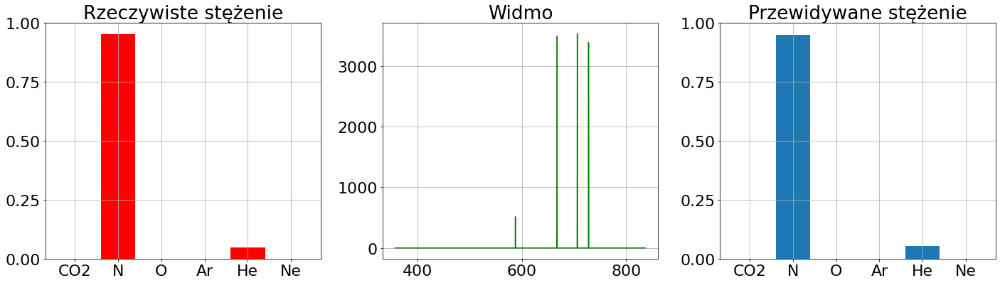

1


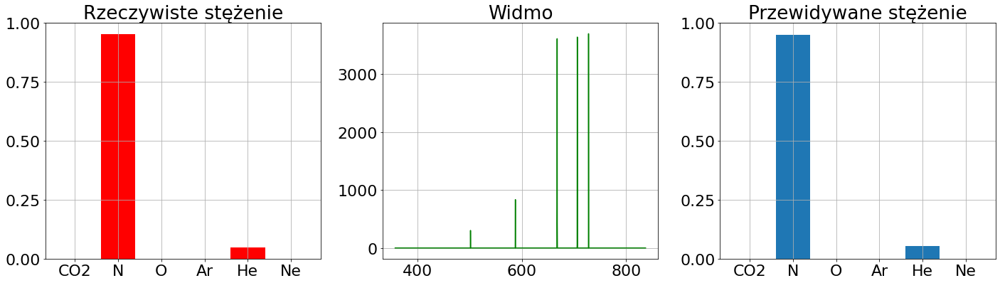

2


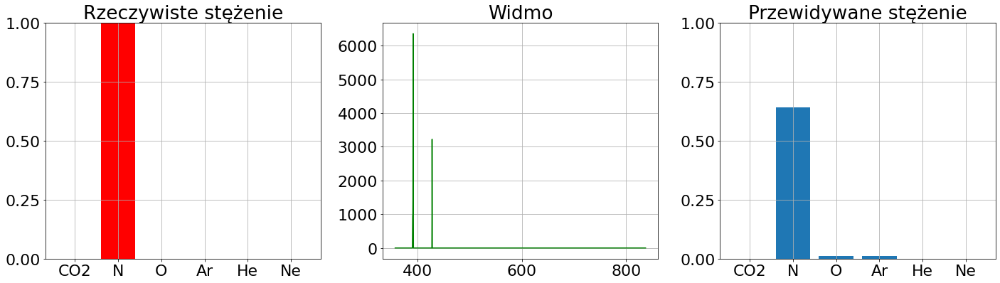

3


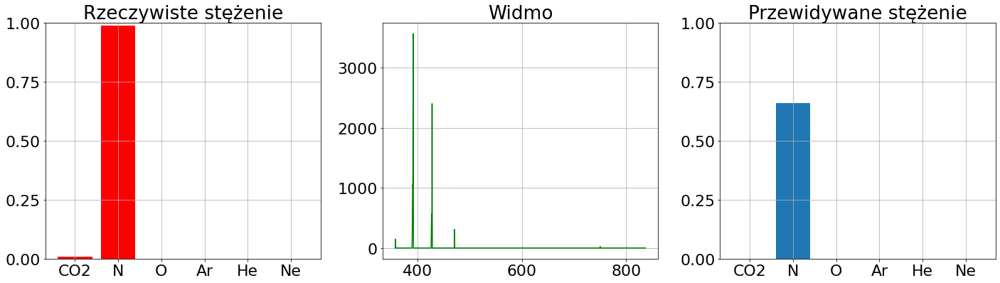

4


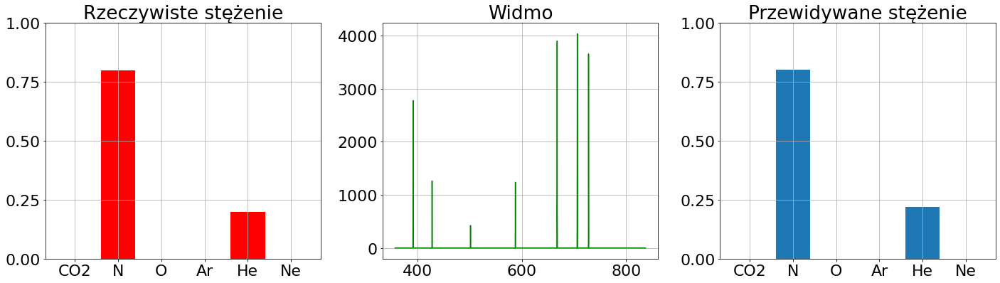

5


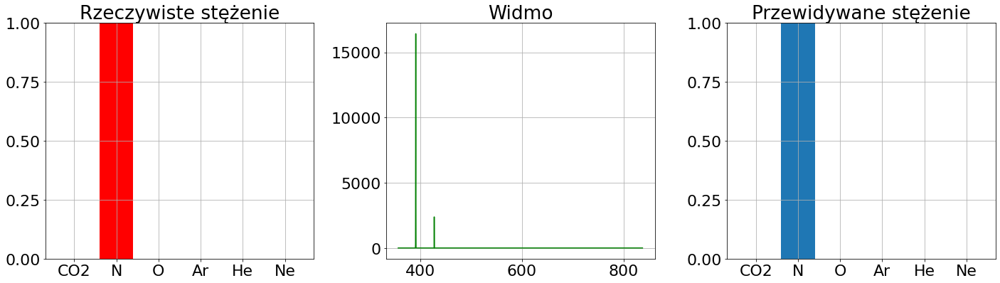

6


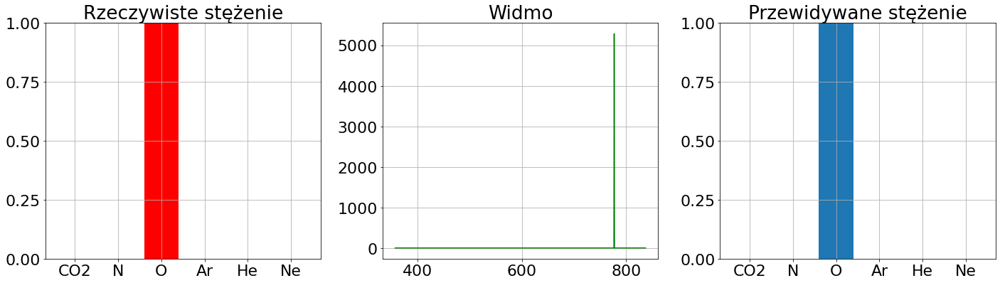

7


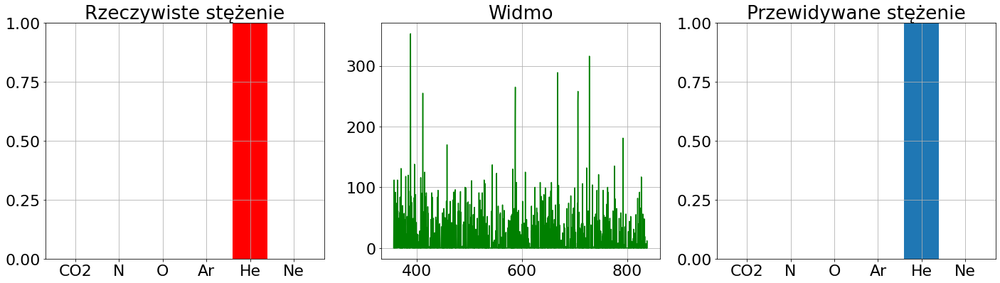

8


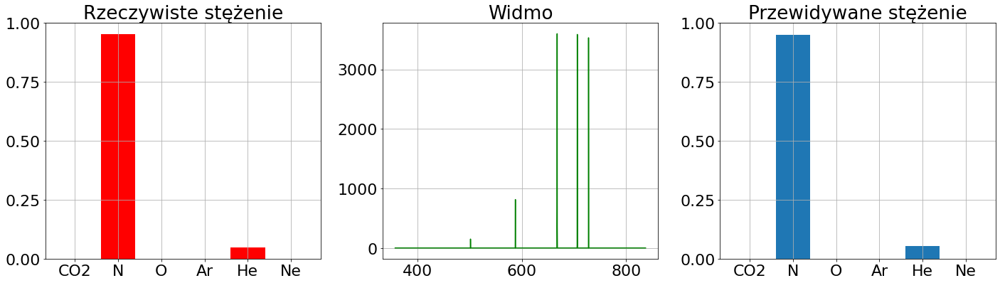

9


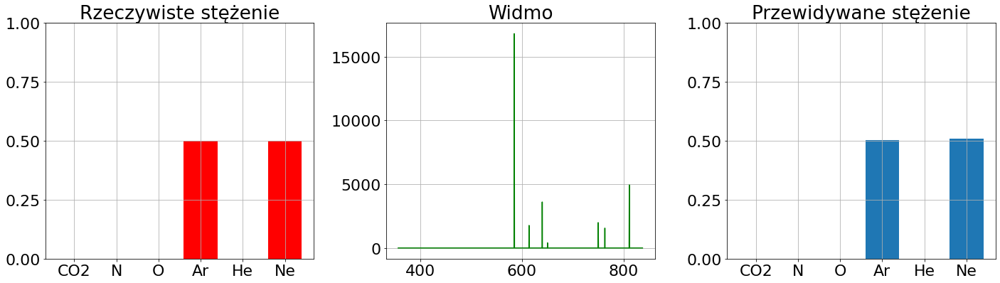

10


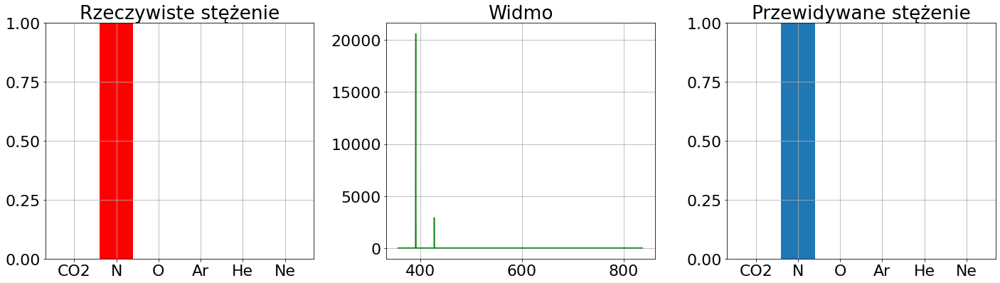

11


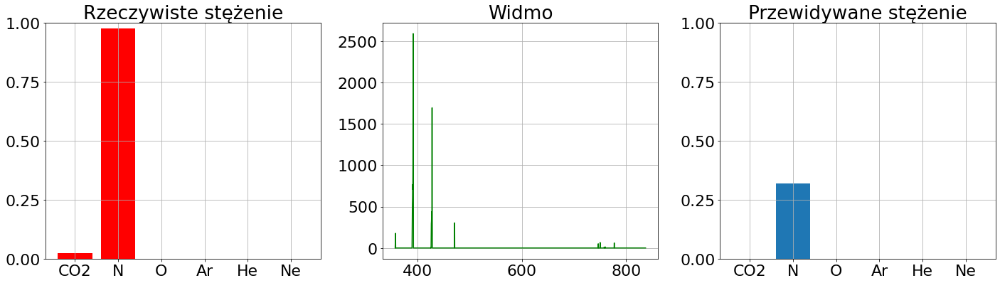

12


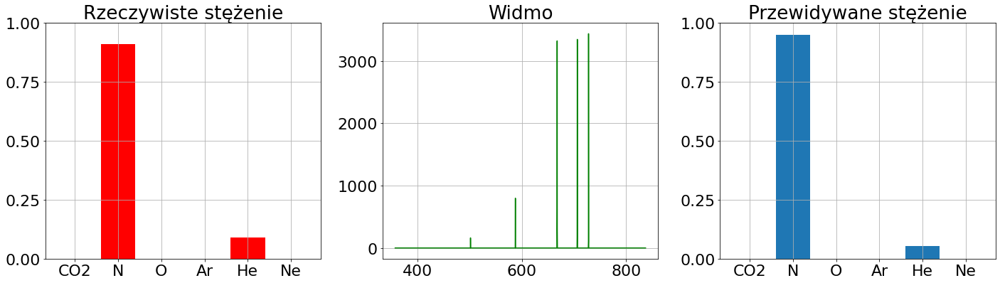

13


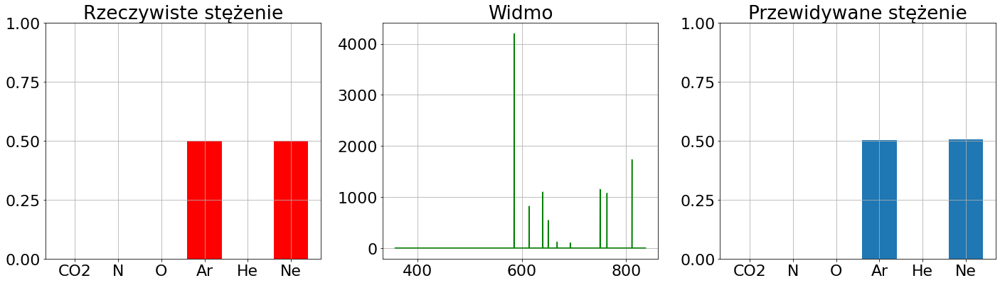

14


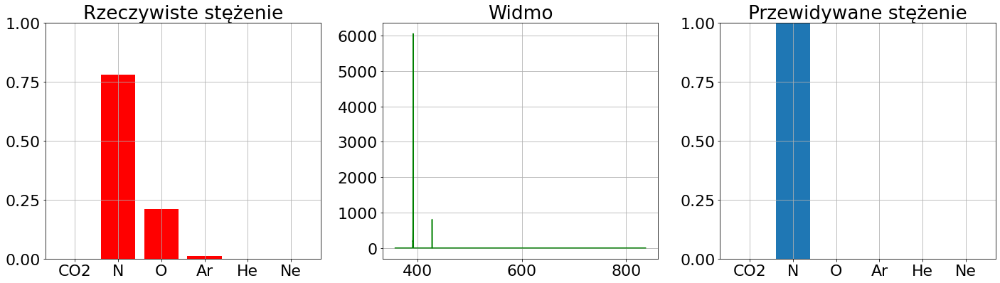

15


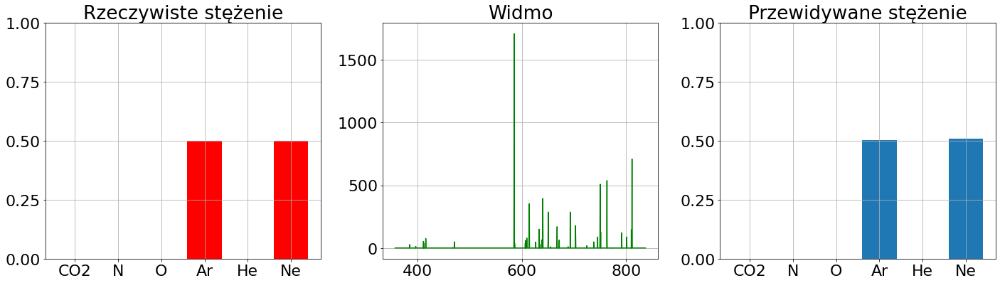

16


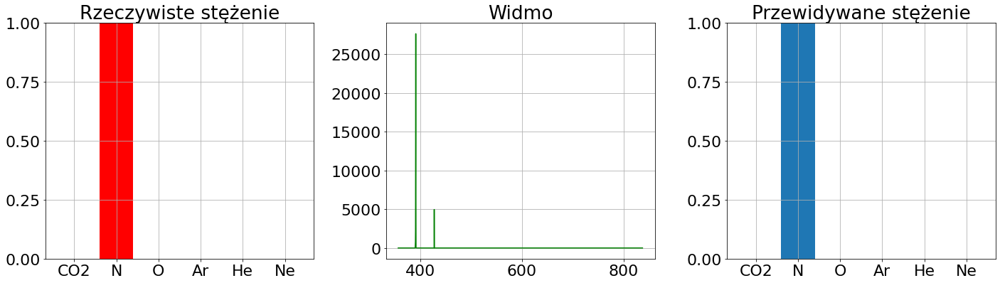

17


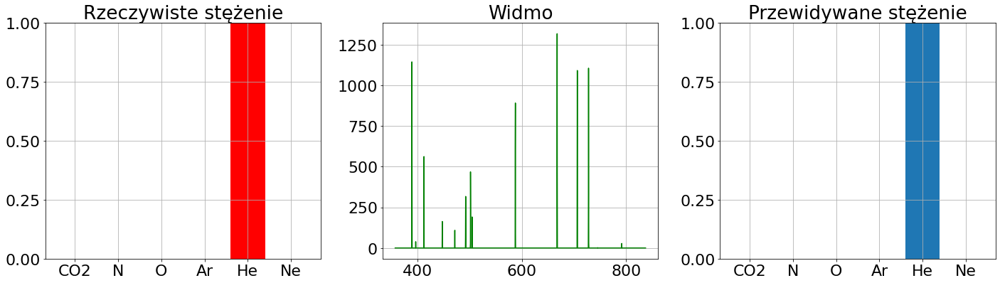

18


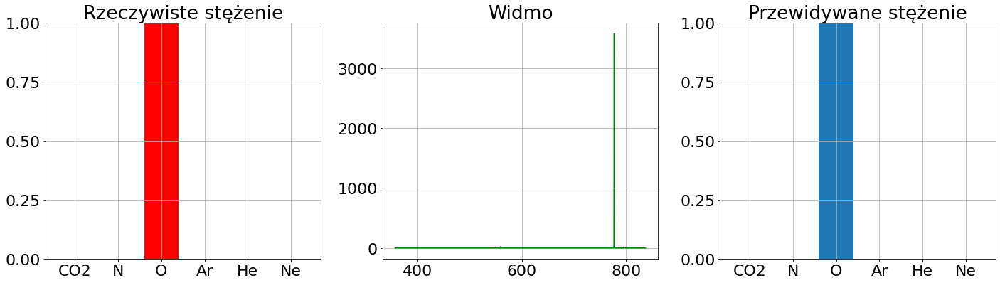

19


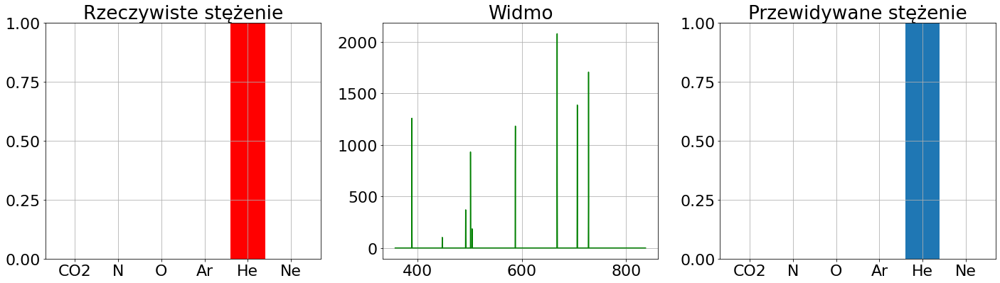

20


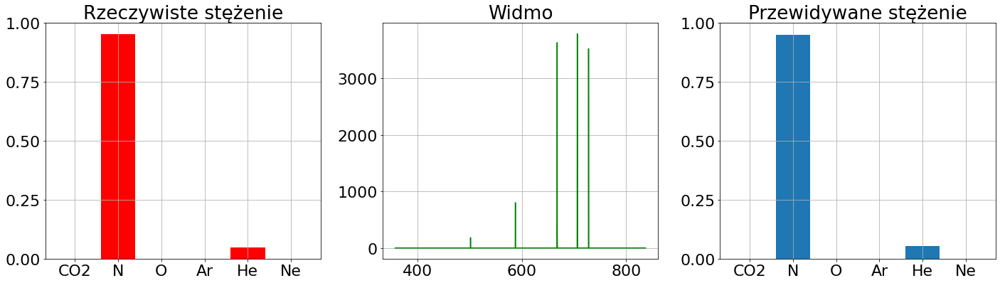

21


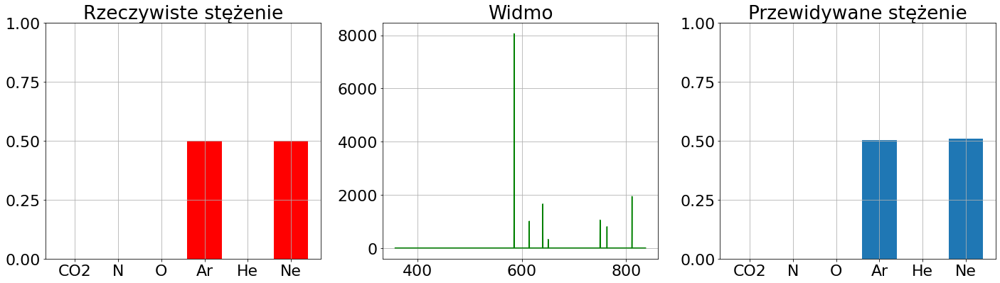

22


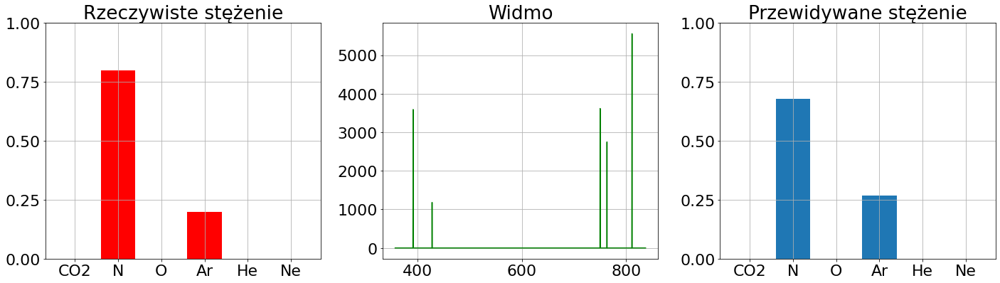

23


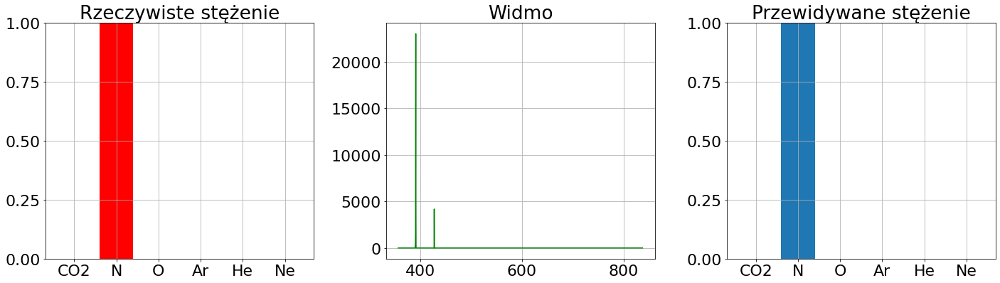

24


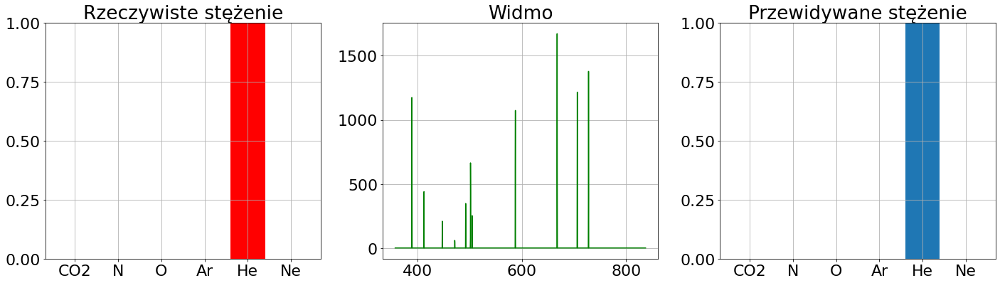

25


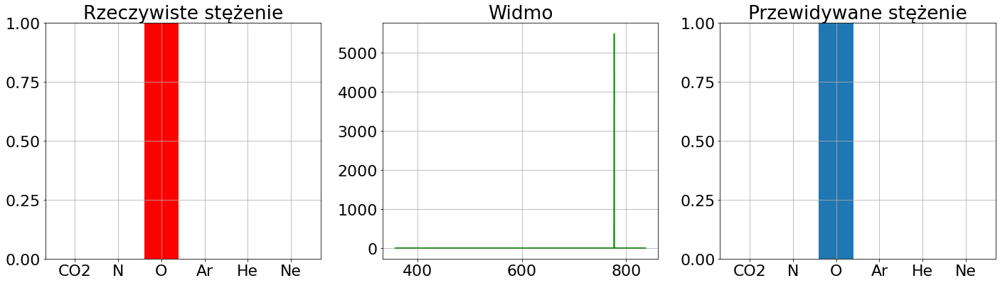

26


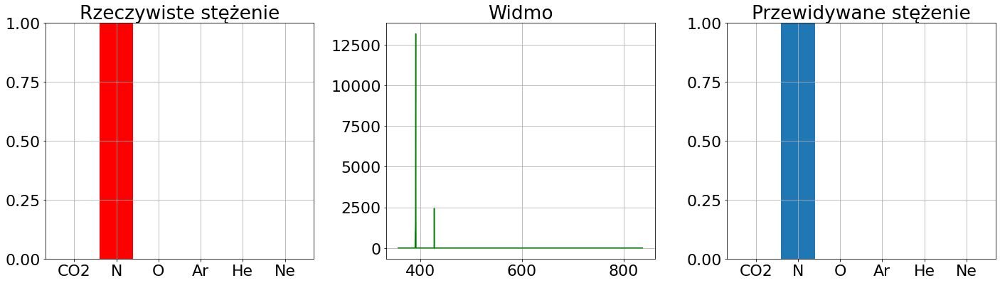

27


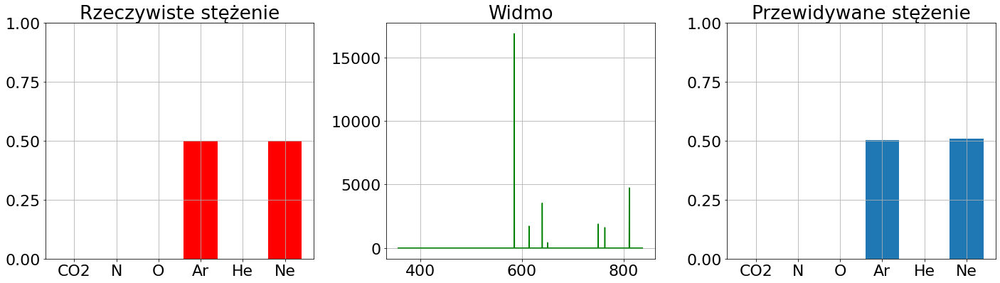

28


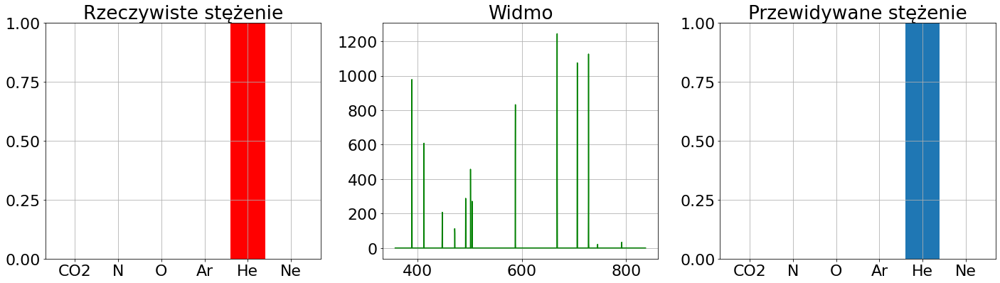

29


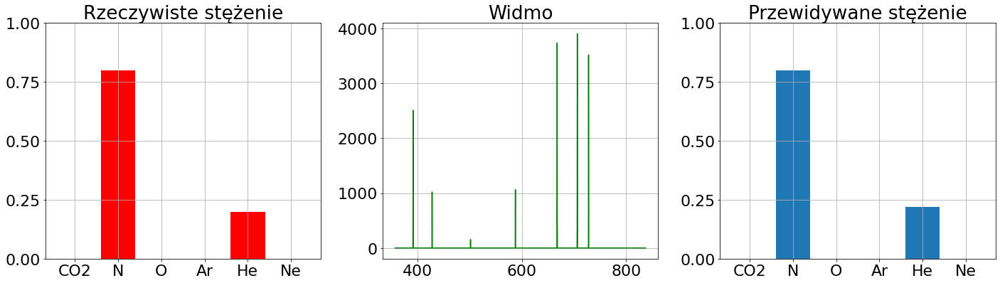

30


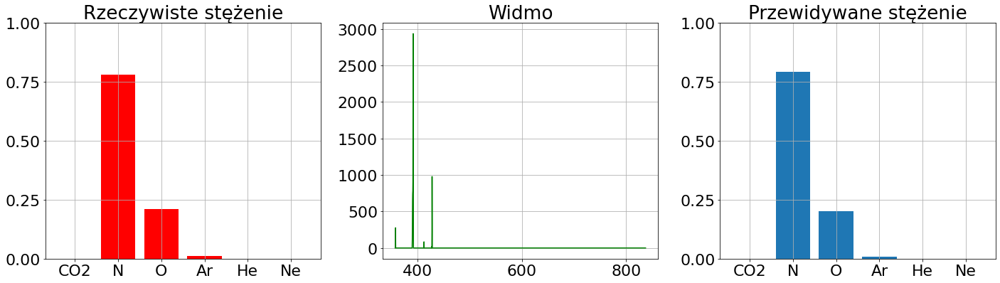

31


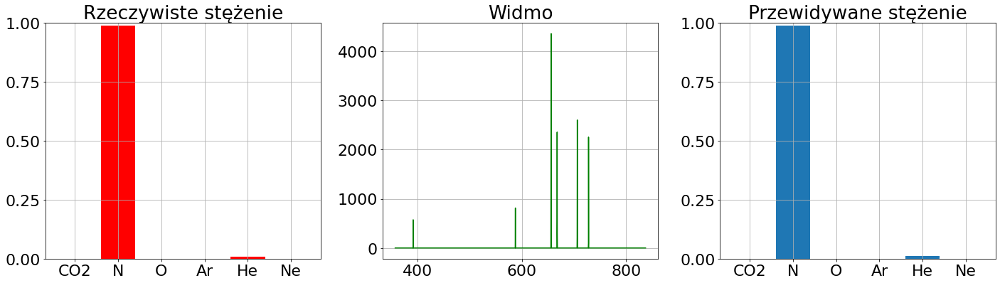

32


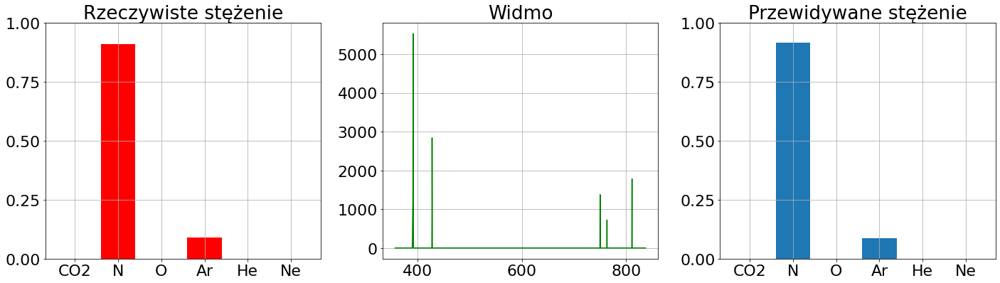

33


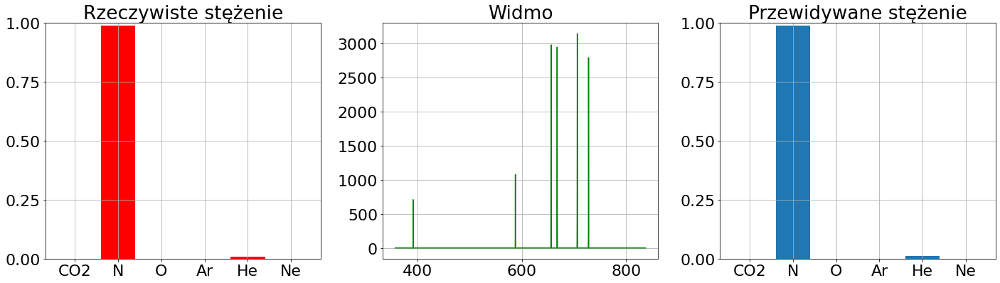

34


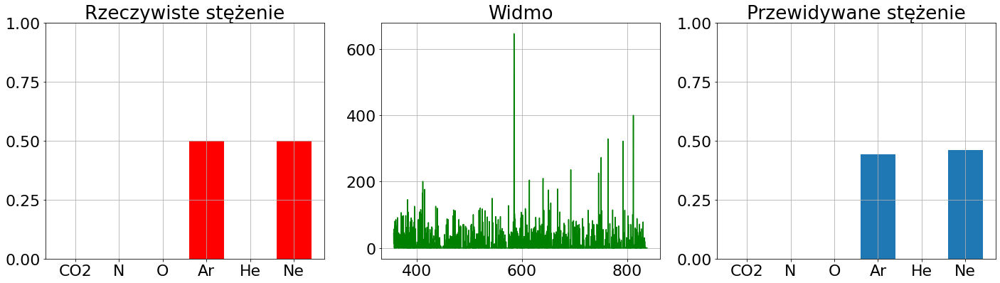

35


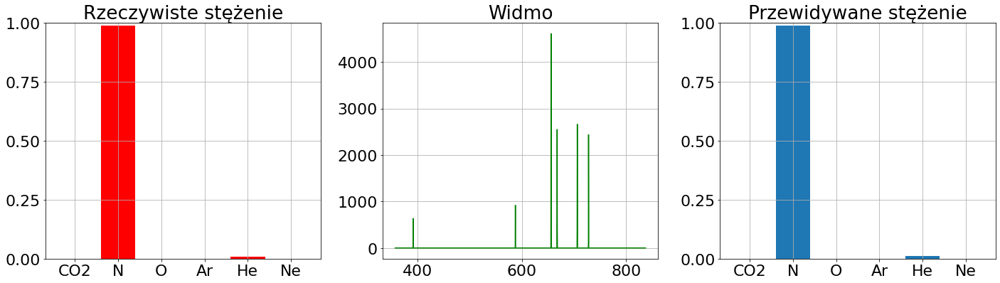

36


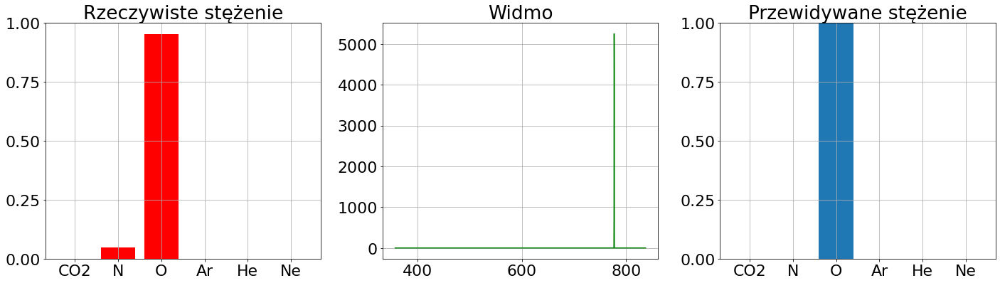

37


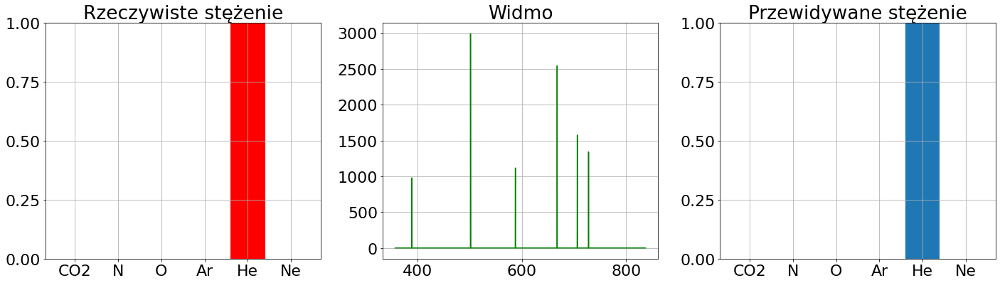

38


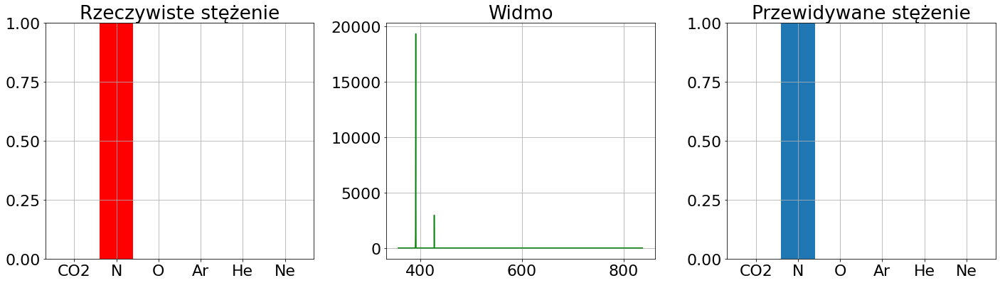

39


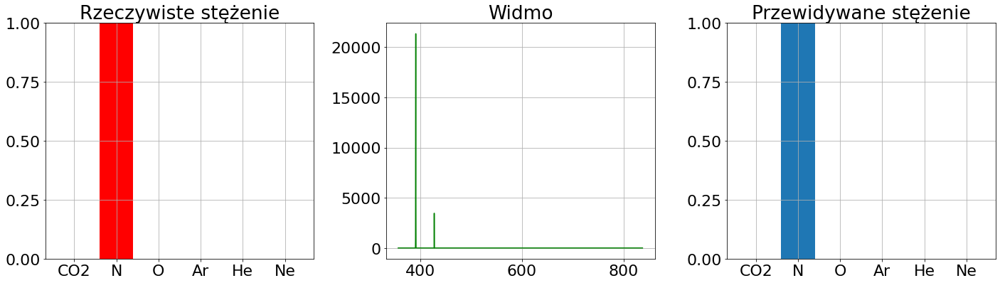

40


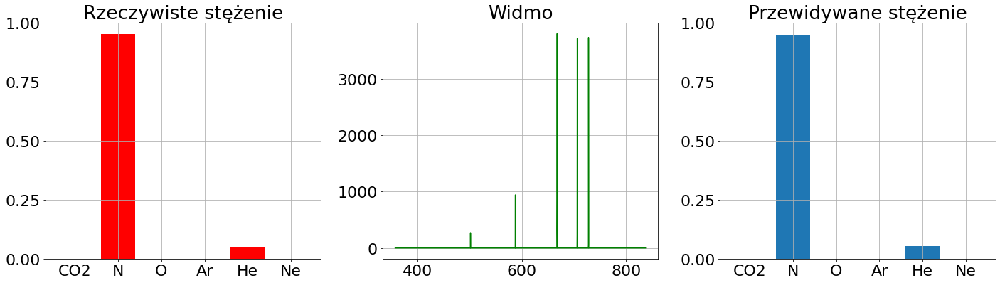

41


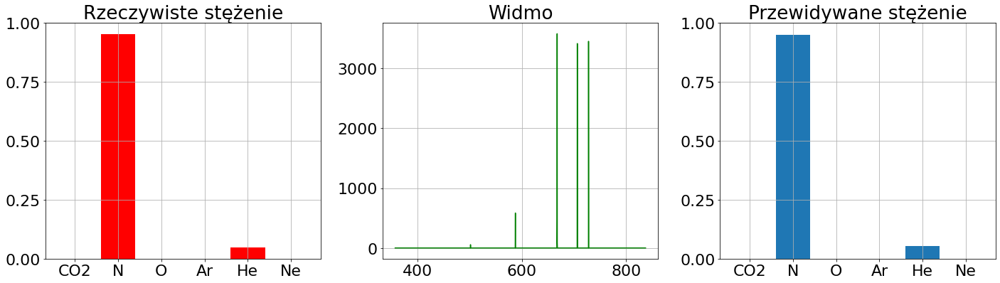

42


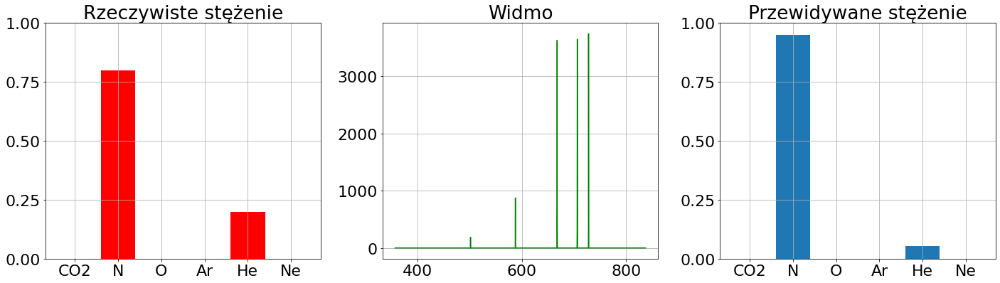

43


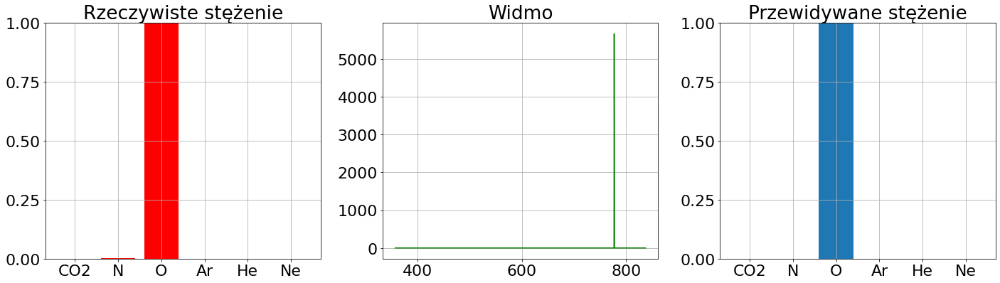

44


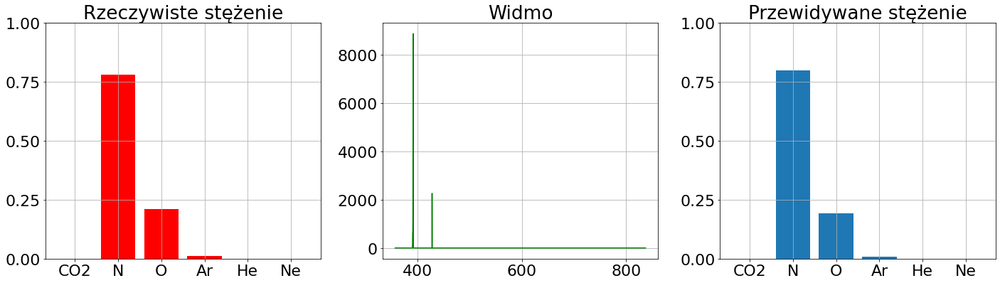

45


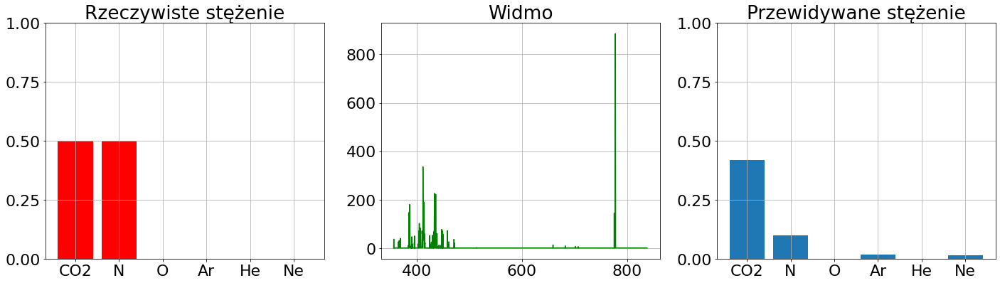

46


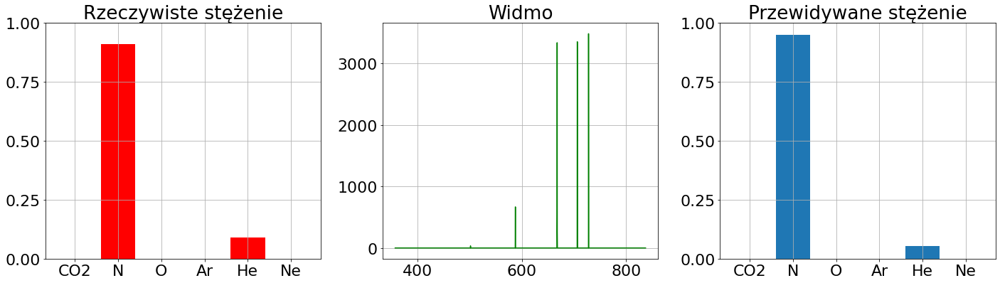

47


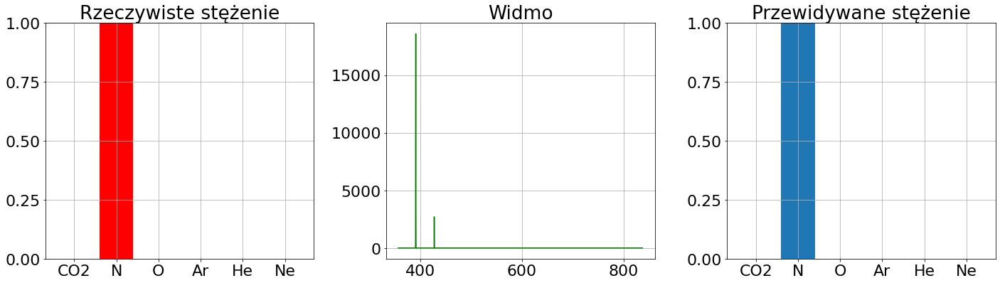

48


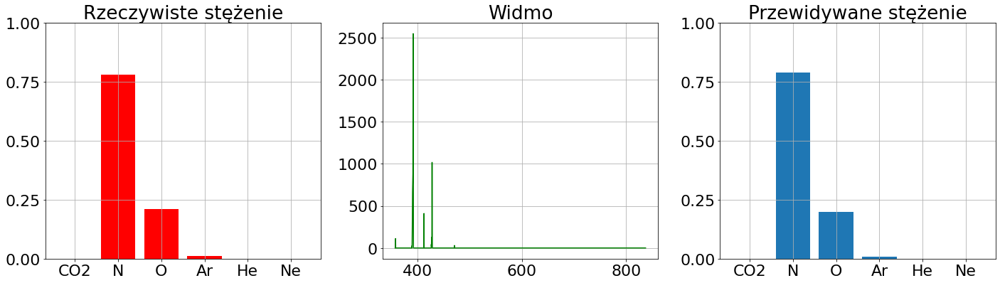

49


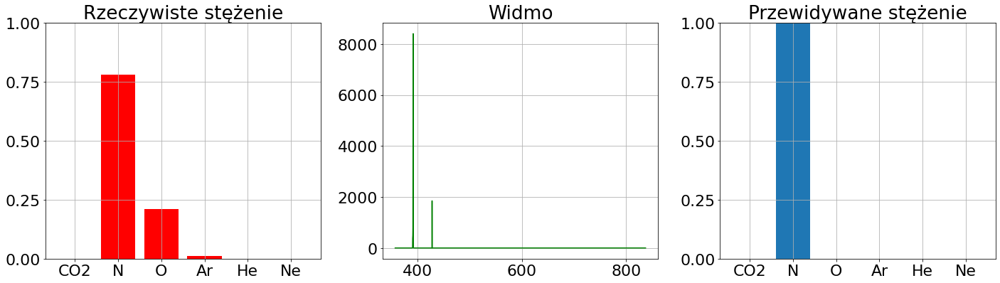

50


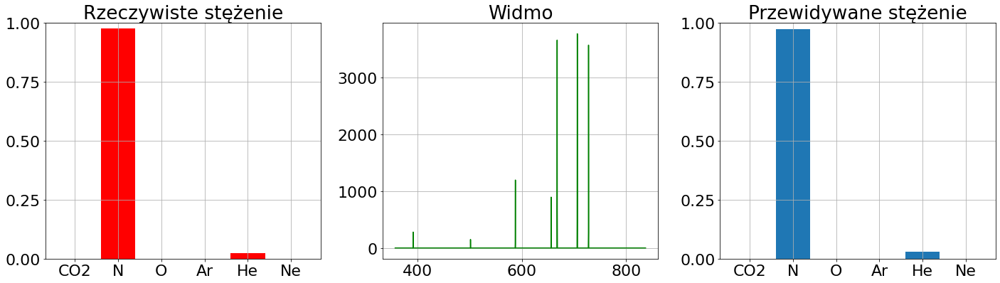

51


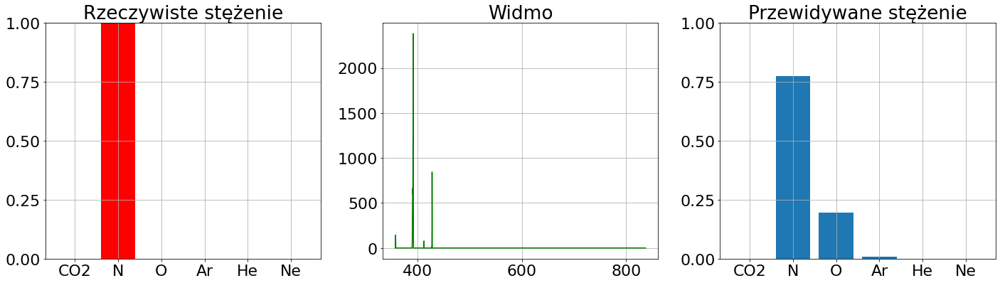

52


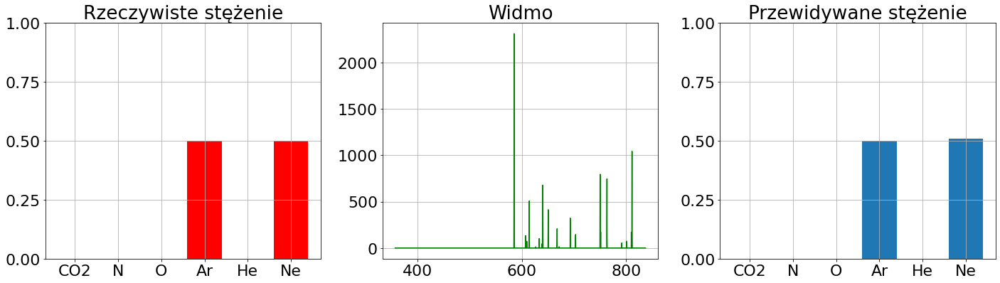

53


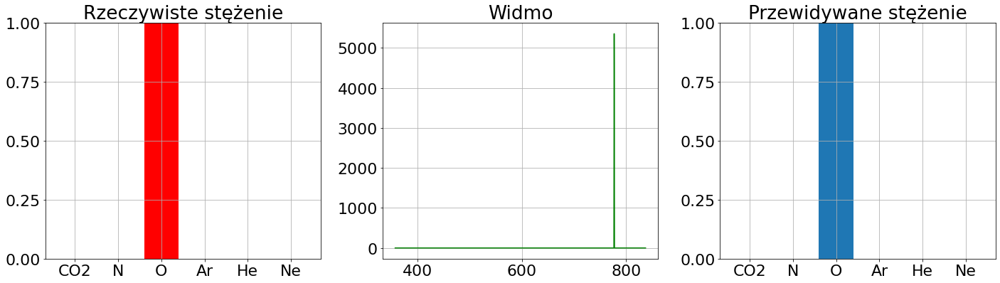

54


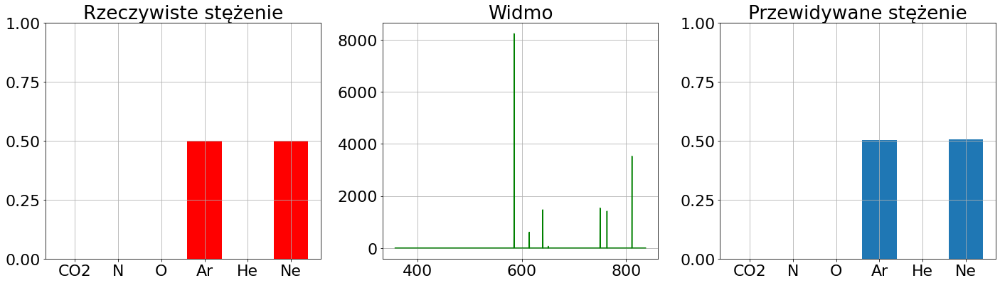

55


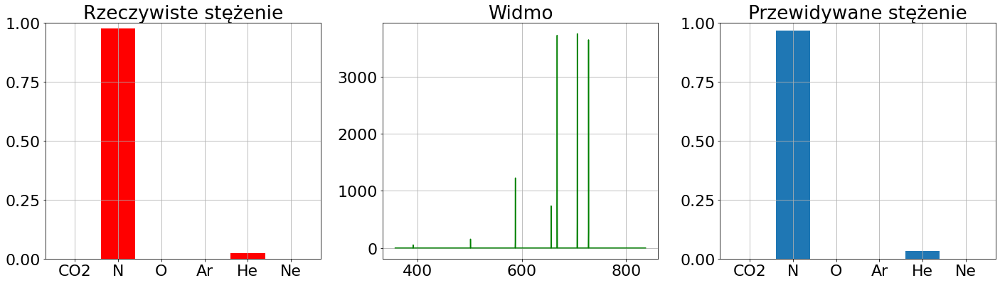

56


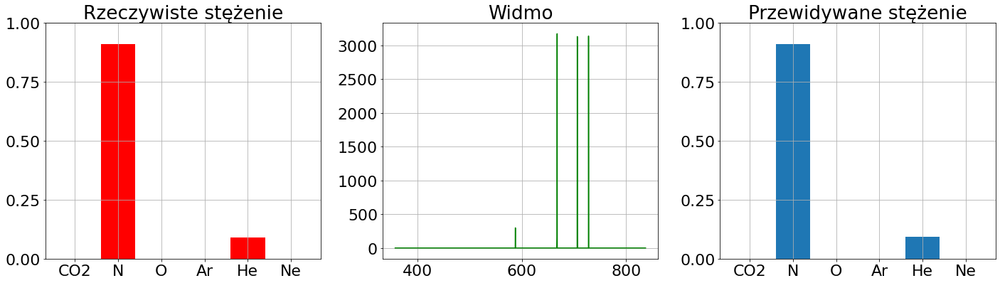

57


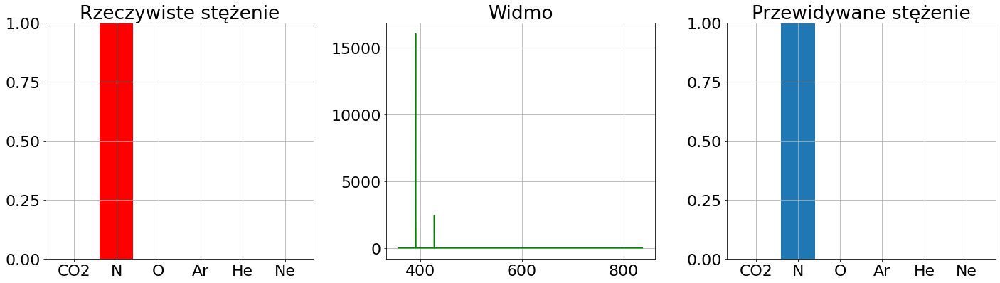

58


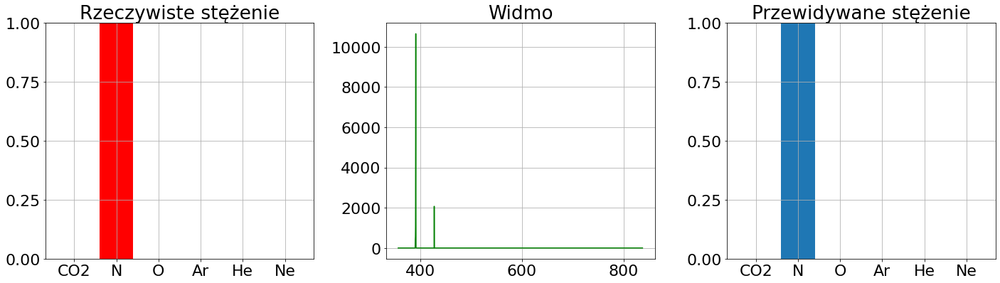

59


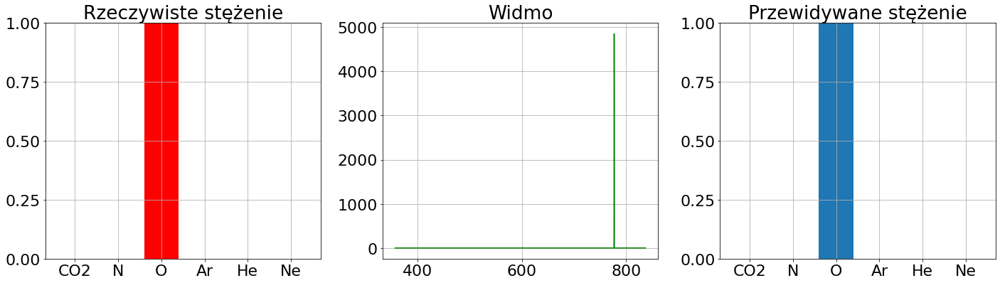

60


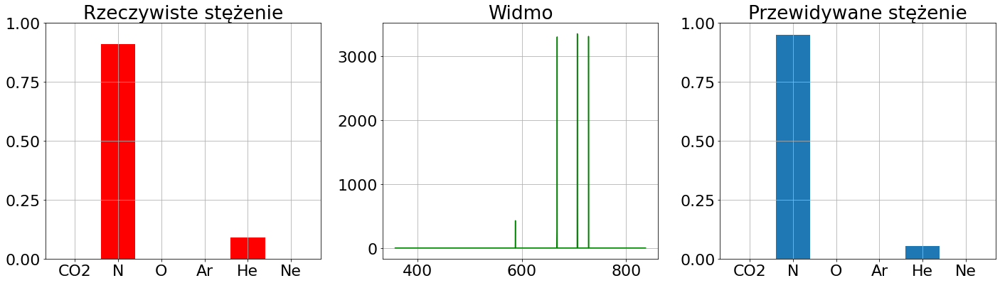

61


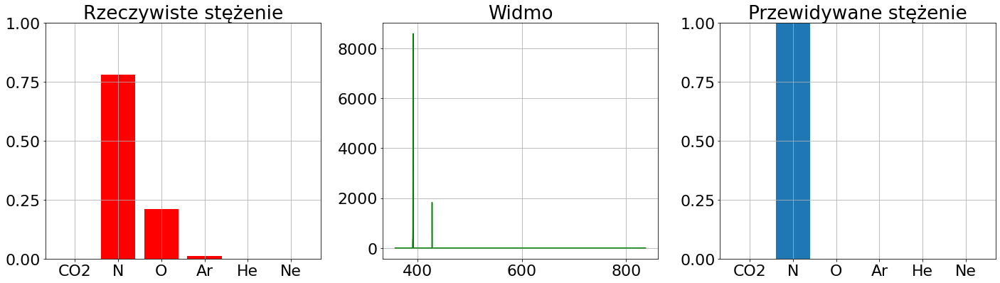

62


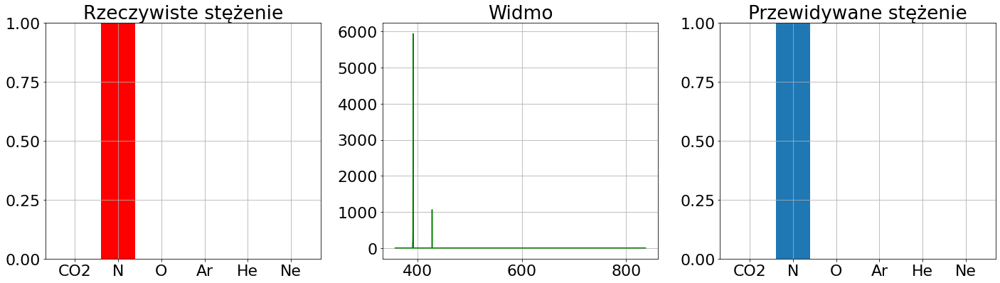

63


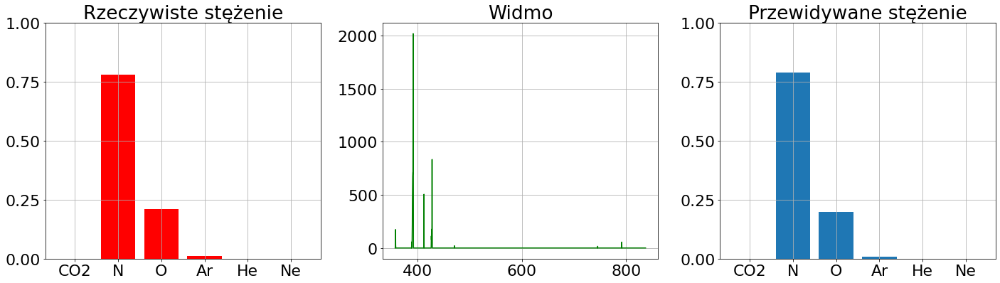

64


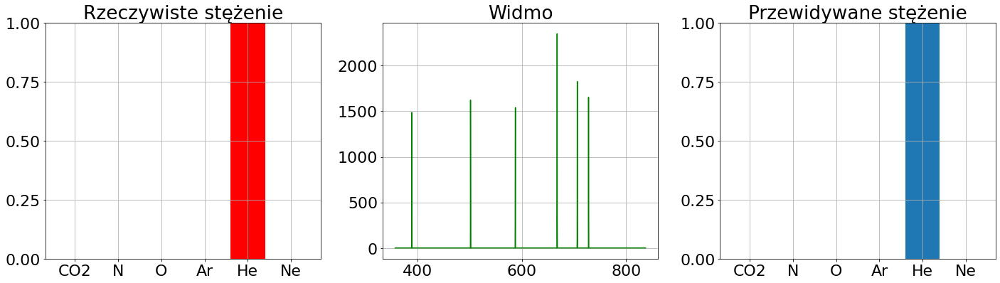

65


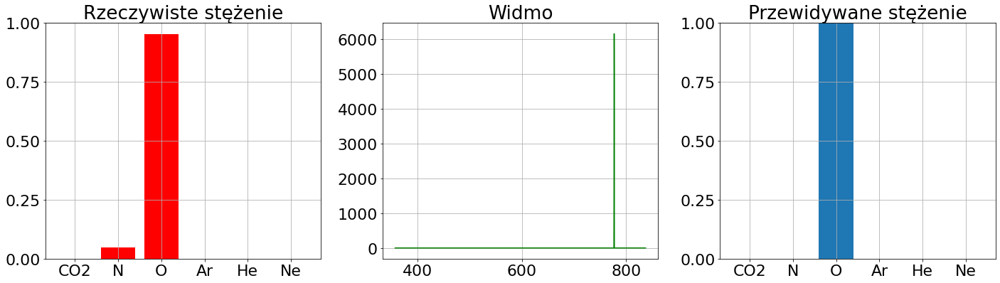

66


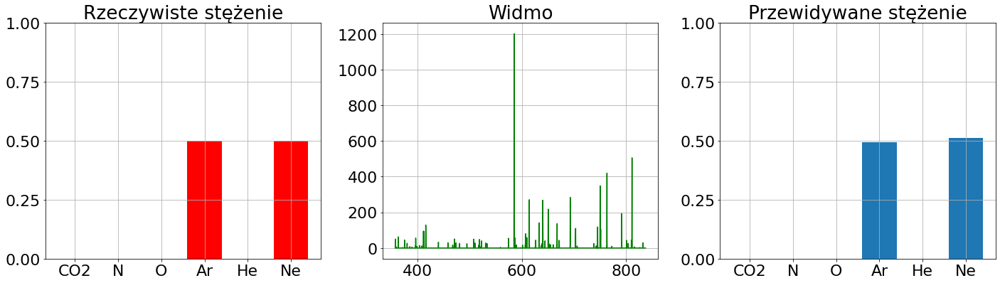

67


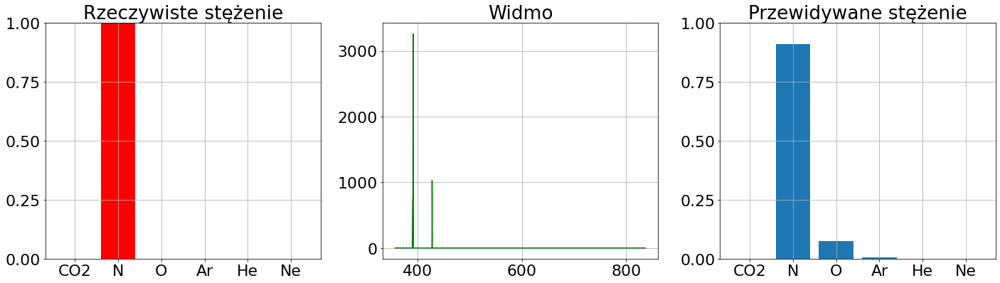

68


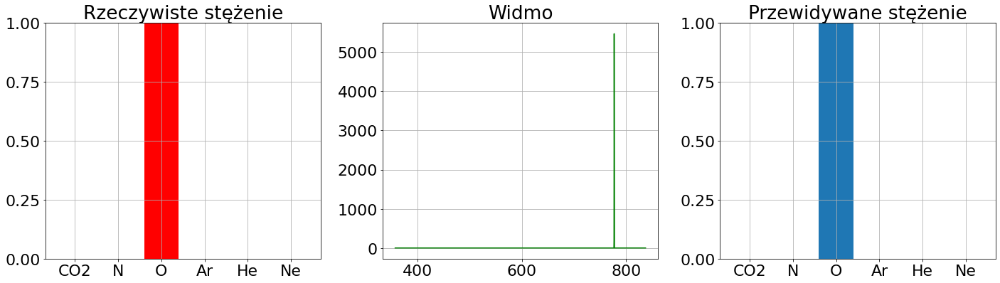

69


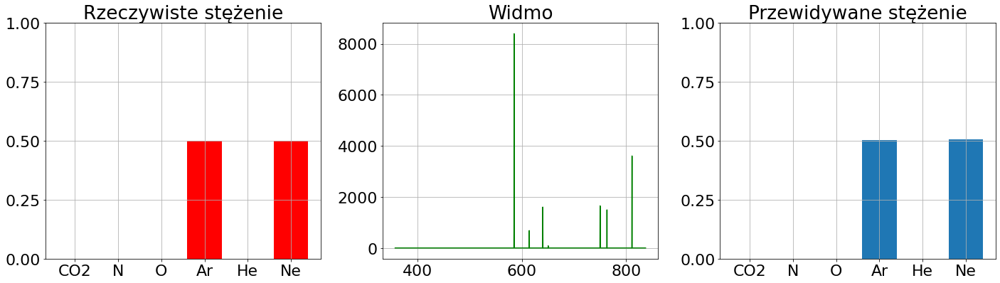

70


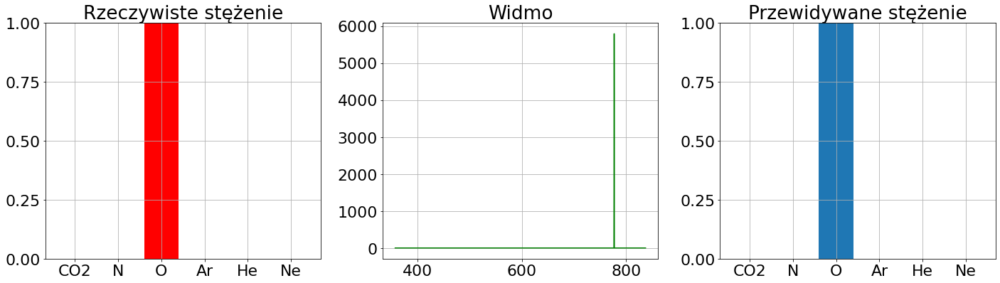

71


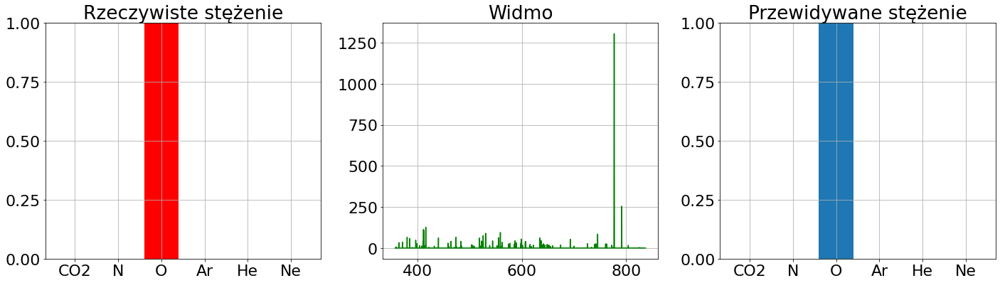

72


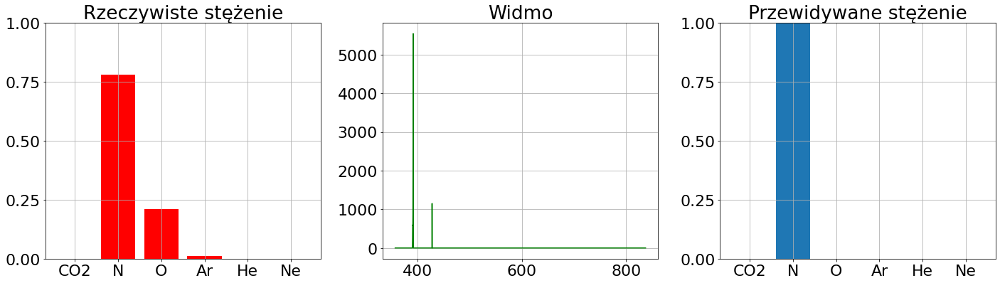

73


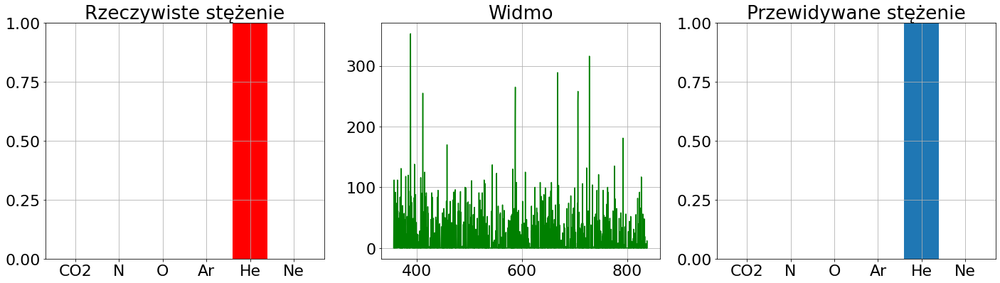

74


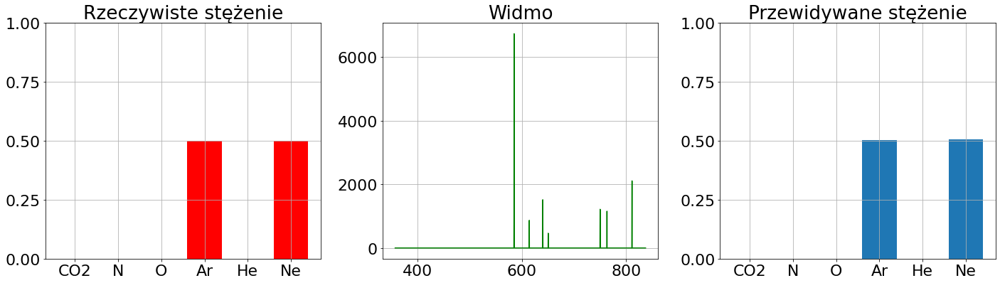

75


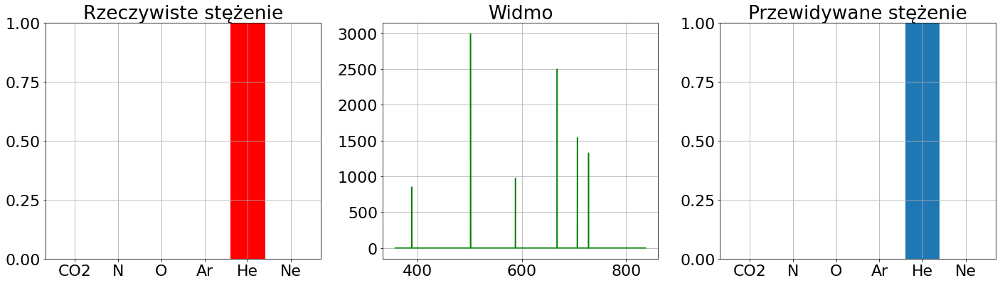

76


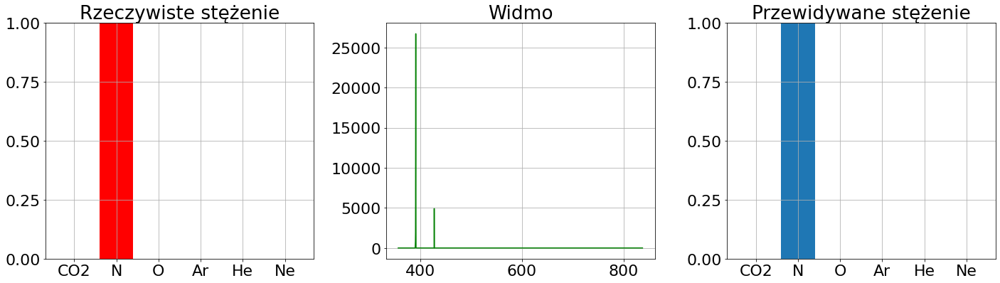

77


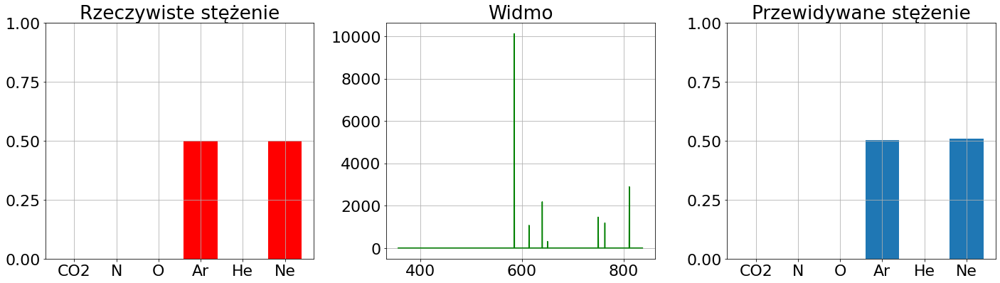

78


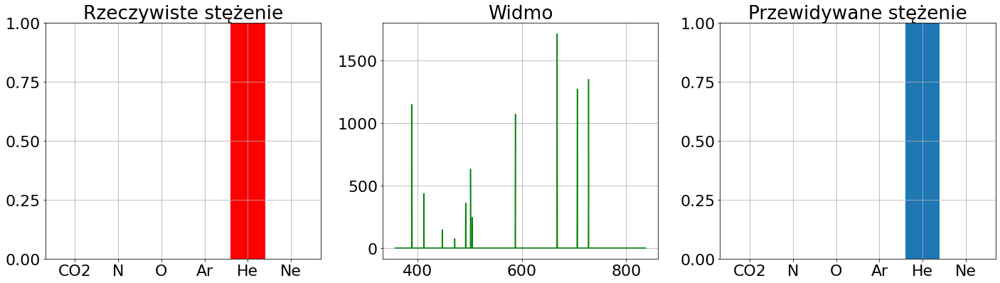

79


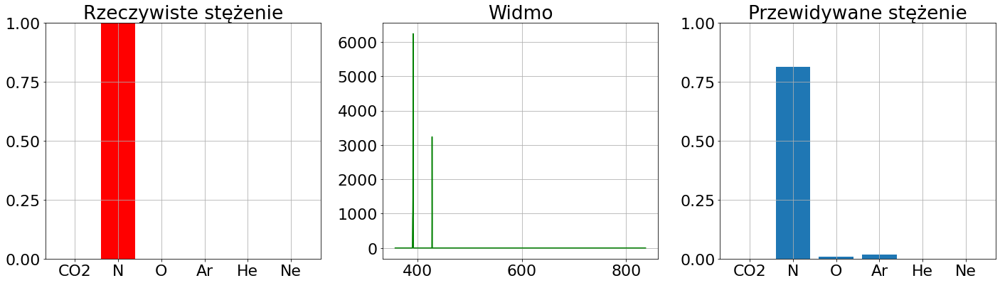

80


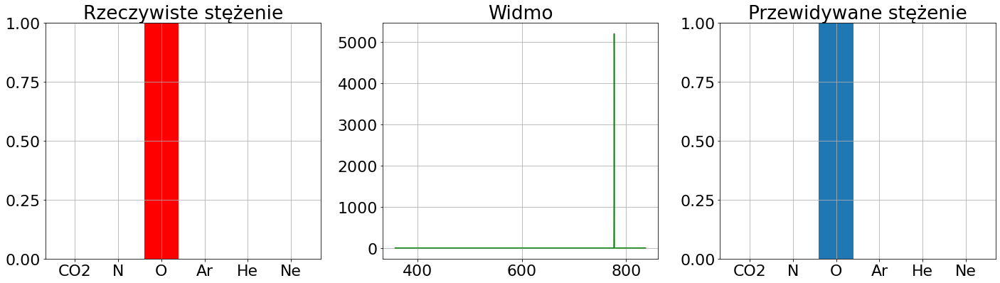

81


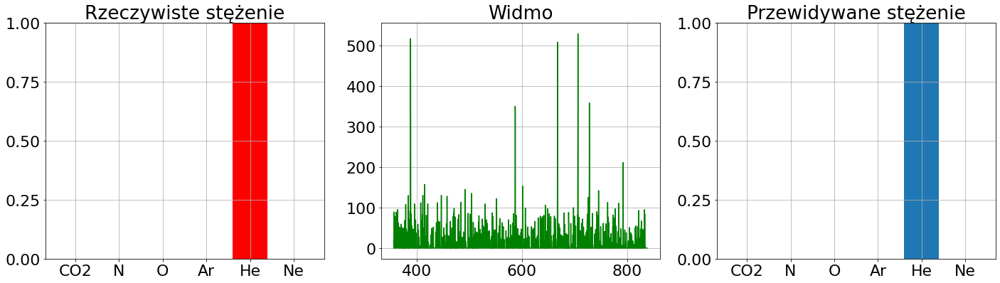

82


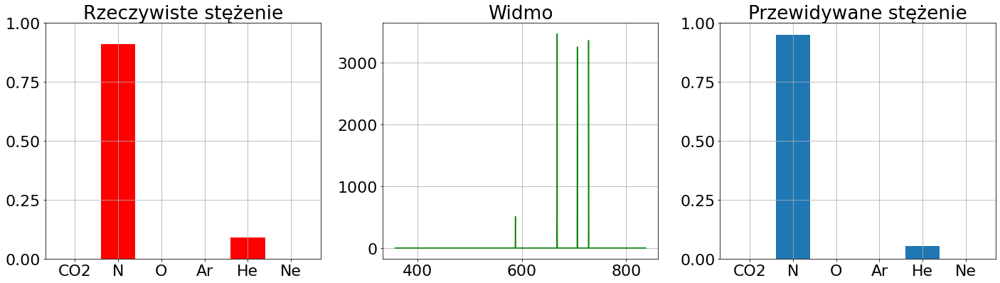

83


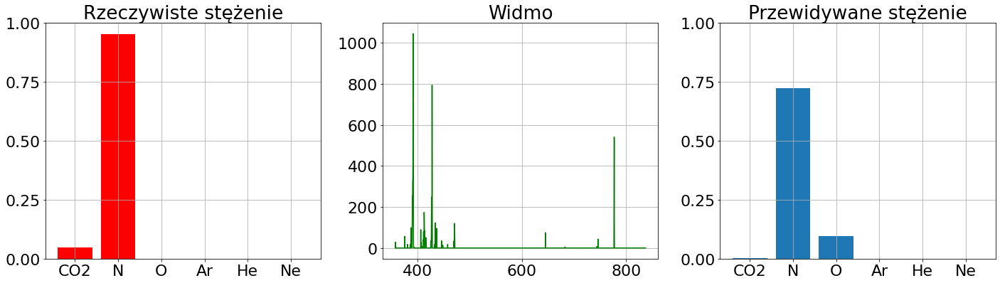

84


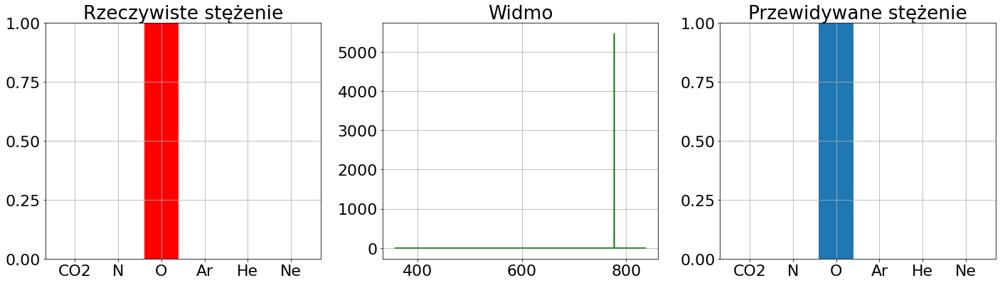

85


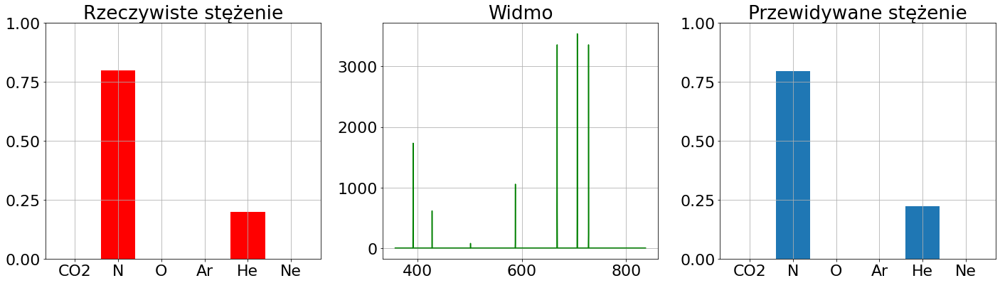

86


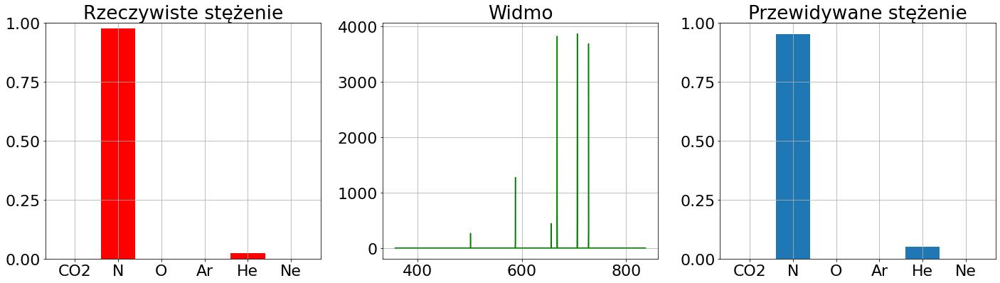

87


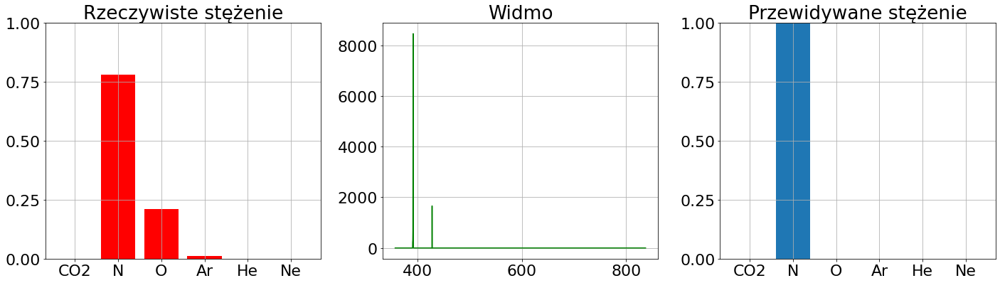

88


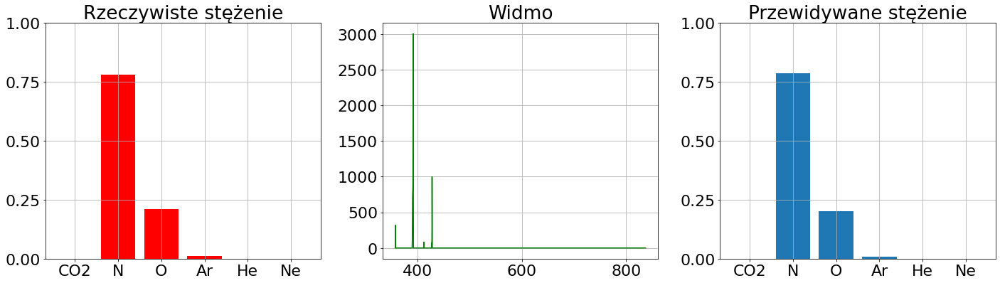

89


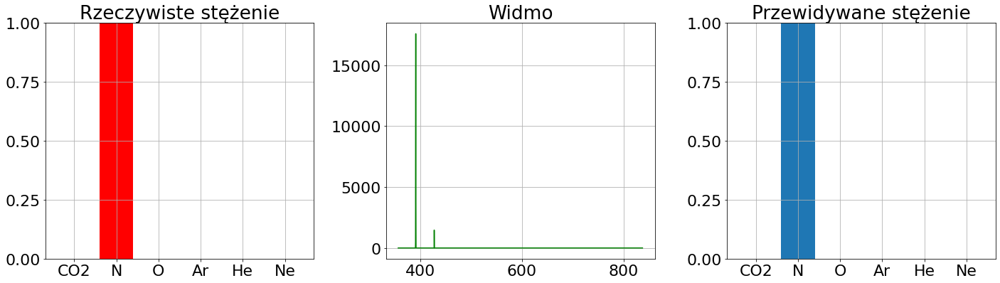

90


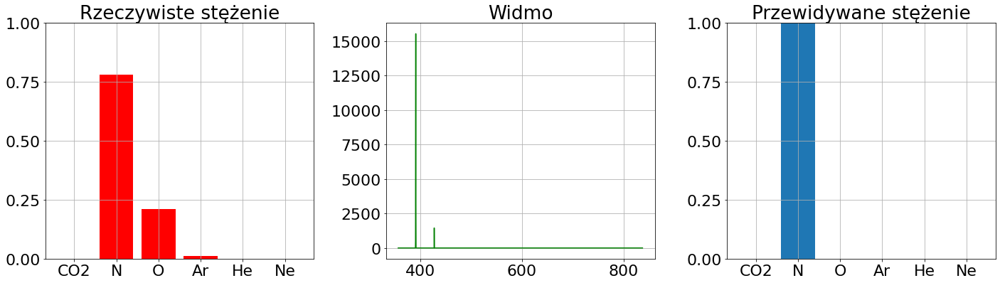

91


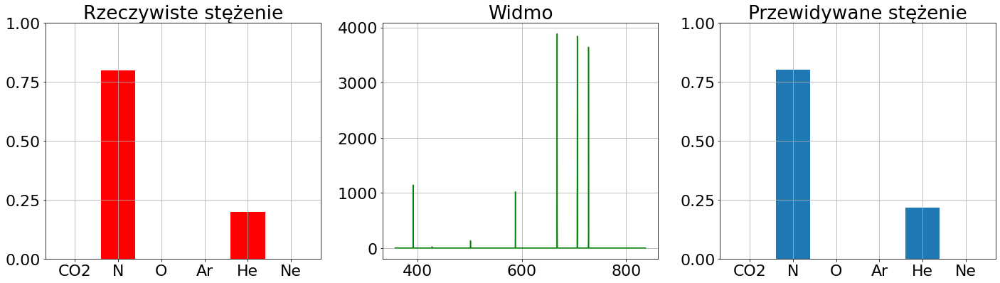

92


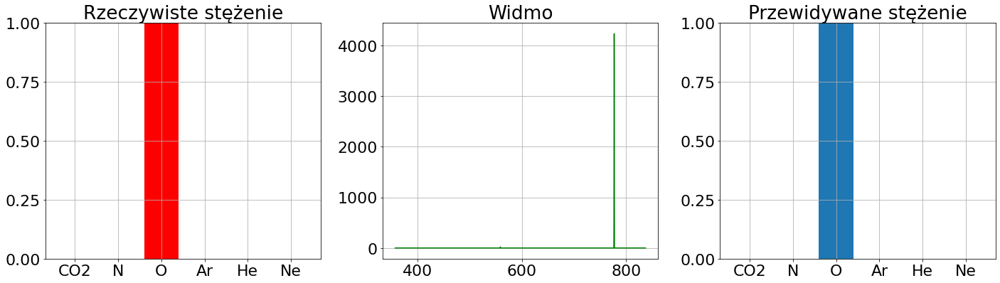

93


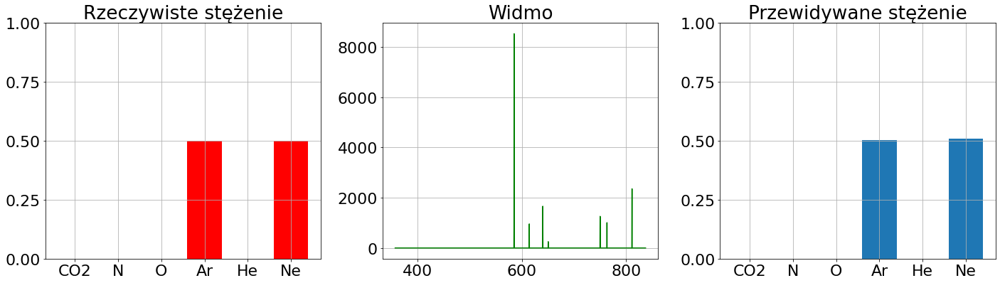

In [211]:
for i in range(94):
    print(i)
    fig = show_predictionsB(modelB, test_spectrums_B, test_concentrations, i)

## 2.3. Optymalizacja

In [193]:
tf.random.set_seed(13)
p_multipler = np.ones(2048 + 2)
p_multipler[1] = 10000

def model_builder_B(hp):
  hp_units1 = hp.Int('units1', min_value=256, max_value=1024, step=32)
  hp_units2 = hp.Int('units2', min_value=256, max_value=512, step=32)
  hp_units3 = hp.Int('units3', min_value=32, max_value=512, step=32)
    
  model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(2050,)),
            tf.keras.layers.Lambda(lambda x: x * p_multipler ),
            tf.keras.layers.Dense(hp_units1, activation='tanh'),
            tf.keras.layers.Dense(hp_units2, activation='tanh'),
            tf.keras.layers.Dense(hp_units3, activation='tanh'),
            tf.keras.layers.Dense(6, activation="sigmoid")])

  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 5e-2, 1e-3, 5e-3, 1e-4, 5e-4, 1e-5]) 
  model.compile(loss=custom_loss,
              optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
              metrics=['mse', 'mae'])

  return model

In [194]:
tf.random.set_seed(13)

tunerB = kt.Hyperband(model_builder_B,
                     objective='val_loss',
                     max_epochs=20,
                     factor=3,
                     directory='tunerB',
                     project_name='siecB')

In [195]:
tf.random.set_seed(13)
stop_learning = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

tunerB.search(train_spectrums_B,
             train_concentrations,
             epochs=50,
            steps_per_epoch=10,
             validation_split=0.2,
             callbacks=[stop_learning])

best_hps = tunerB.get_best_hyperparameters(num_trials=1)[0]

Trial 30 Complete [00h 00m 21s]
val_loss: 3.4235477447509766

Best val_loss So Far: 0.30861568450927734
Total elapsed time: 00h 03m 01s
INFO:tensorflow:Oracle triggered exit


In [196]:
print('Liczba neuronów w warstwie 1: %d' % best_hps.get('units1'))
print('Liczba neuronów w warstwie 2: %d' % best_hps.get('units2'))
print('Liczba neuronów w warstwie 3: %d' % best_hps.get('units3'))
print('Współczynnik uczenia: %f' % best_hps.get('learning_rate'))

Liczba neuronów w warstwie 1: 928
Liczba neuronów w warstwie 2: 448
Liczba neuronów w warstwie 3: 352
Współczynnik uczenia: 0.000500


In [197]:
tf.random.set_seed(13)

modelB = tunerB.hypermodel.build(best_hps)
history = modelB.fit(train_spectrums_B,
                    train_concentrations,
                    steps_per_epoch=10,
                    epochs=400,
                    validation_split=0.2)

val_loss_per_epoch = history.history['val_loss']
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1
print('Best epoch: %d' % (best_epoch,))

Epoch 1/400
10/10 [==============================] - 1s 64ms/step - loss: 3.7430 - mse: 0.0884 - mae: 0.1662 - val_loss: 0.8960 - val_mse: 0.0404 - val_mae: 0.0780
Epoch 2/400
10/10 [==============================] - 0s 32ms/step - loss: 0.7400 - mse: 0.0300 - mae: 0.0604 - val_loss: 0.5959 - val_mse: 0.0122 - val_mae: 0.0410
Epoch 3/400
10/10 [==============================] - 0s 34ms/step - loss: 0.5478 - mse: 0.0128 - mae: 0.0375 - val_loss: 0.4971 - val_mse: 0.0083 - val_mae: 0.0306
Epoch 4/400
10/10 [==============================] - 1s 90ms/step - loss: 0.4503 - mse: 0.0107 - mae: 0.0305 - val_loss: 0.4149 - val_mse: 0.0065 - val_mae: 0.0258
Epoch 5/400
10/10 [==============================] - 0s 36ms/step - loss: 0.4197 - mse: 0.0099 - mae: 0.0286 - val_loss: 0.3831 - val_mse: 0.0059 - val_mae: 0.0253
Epoch 6/400
10/10 [==============================] - 0s 34ms/step - loss: 0.3878 - mse: 0.0096 - mae: 0.0268 - val_loss: 0.3544 - val_mse: 0.0054 - val_mae: 0.0232
Epoch 7/400
10/1

Epoch 51/400
10/10 [==============================] - 0s 41ms/step - loss: 0.2887 - mse: 0.0081 - mae: 0.0228 - val_loss: 0.2704 - val_mse: 0.0056 - val_mae: 0.0192
Epoch 52/400
10/10 [==============================] - 0s 36ms/step - loss: 0.2901 - mse: 0.0076 - mae: 0.0219 - val_loss: 0.2908 - val_mse: 0.0048 - val_mae: 0.0209
Epoch 53/400
10/10 [==============================] - 0s 32ms/step - loss: 0.2803 - mse: 0.0073 - mae: 0.0215 - val_loss: 0.2912 - val_mse: 0.0062 - val_mae: 0.0198
Epoch 54/400
10/10 [==============================] - 0s 34ms/step - loss: 0.2812 - mse: 0.0084 - mae: 0.0225 - val_loss: 0.2665 - val_mse: 0.0049 - val_mae: 0.0199
Epoch 55/400
10/10 [==============================] - 0s 28ms/step - loss: 0.2793 - mse: 0.0073 - mae: 0.0218 - val_loss: 0.2827 - val_mse: 0.0056 - val_mae: 0.0206
Epoch 56/400
10/10 [==============================] - 0s 29ms/step - loss: 0.2948 - mse: 0.0080 - mae: 0.0228 - val_loss: 0.2790 - val_mse: 0.0046 - val_mae: 0.0200
Epoch 57/4

Epoch 101/400
10/10 [==============================] - 0s 30ms/step - loss: 0.3038 - mse: 0.0094 - mae: 0.0241 - val_loss: 0.2815 - val_mse: 0.0055 - val_mae: 0.0210
Epoch 102/400
10/10 [==============================] - 0s 28ms/step - loss: 0.3098 - mse: 0.0099 - mae: 0.0247 - val_loss: 0.2657 - val_mse: 0.0079 - val_mae: 0.0203
Epoch 103/400
10/10 [==============================] - 0s 29ms/step - loss: 0.2797 - mse: 0.0089 - mae: 0.0226 - val_loss: 0.2423 - val_mse: 0.0054 - val_mae: 0.0185
Epoch 104/400
10/10 [==============================] - 0s 41ms/step - loss: 0.2777 - mse: 0.0086 - mae: 0.0221 - val_loss: 0.2825 - val_mse: 0.0074 - val_mae: 0.0207
Epoch 105/400
10/10 [==============================] - 0s 38ms/step - loss: 0.2683 - mse: 0.0090 - mae: 0.0219 - val_loss: 0.2802 - val_mse: 0.0073 - val_mae: 0.0207
Epoch 106/400
10/10 [==============================] - 0s 33ms/step - loss: 0.2769 - mse: 0.0088 - mae: 0.0224 - val_loss: 0.2882 - val_mse: 0.0070 - val_mae: 0.0222
Epoc

10/10 [==============================] - 0s 44ms/step - loss: 0.2450 - mse: 0.0077 - mae: 0.0197 - val_loss: 0.2590 - val_mse: 0.0066 - val_mae: 0.0196
Epoch 151/400
10/10 [==============================] - 0s 27ms/step - loss: 0.2434 - mse: 0.0077 - mae: 0.0199 - val_loss: 0.2397 - val_mse: 0.0071 - val_mae: 0.0185
Epoch 152/400
10/10 [==============================] - 0s 28ms/step - loss: 0.2331 - mse: 0.0074 - mae: 0.0189 - val_loss: 0.2216 - val_mse: 0.0056 - val_mae: 0.0169
Epoch 153/400
10/10 [==============================] - 1s 93ms/step - loss: 0.2416 - mse: 0.0065 - mae: 0.0184 - val_loss: 0.2328 - val_mse: 0.0062 - val_mae: 0.0178
Epoch 154/400
10/10 [==============================] - 0s 33ms/step - loss: 0.2313 - mse: 0.0072 - mae: 0.0184 - val_loss: 0.2396 - val_mse: 0.0067 - val_mae: 0.0176
Epoch 155/400
10/10 [==============================] - 0s 33ms/step - loss: 0.2379 - mse: 0.0074 - mae: 0.0186 - val_loss: 0.3602 - val_mse: 0.0071 - val_mae: 0.0206
Epoch 156/400
10/1

10/10 [==============================] - 0s 41ms/step - loss: 0.2023 - mse: 0.0069 - mae: 0.0164 - val_loss: 0.2310 - val_mse: 0.0070 - val_mae: 0.0168
Epoch 200/400
10/10 [==============================] - 0s 37ms/step - loss: 0.2087 - mse: 0.0068 - mae: 0.0161 - val_loss: 0.2211 - val_mse: 0.0061 - val_mae: 0.0165
Epoch 201/400
10/10 [==============================] - 0s 30ms/step - loss: 0.2041 - mse: 0.0067 - mae: 0.0164 - val_loss: 0.2126 - val_mse: 0.0069 - val_mae: 0.0165
Epoch 202/400
10/10 [==============================] - 0s 29ms/step - loss: 0.2120 - mse: 0.0071 - mae: 0.0169 - val_loss: 0.2535 - val_mse: 0.0071 - val_mae: 0.0180
Epoch 203/400
10/10 [==============================] - 0s 29ms/step - loss: 0.2062 - mse: 0.0065 - mae: 0.0163 - val_loss: 0.2091 - val_mse: 0.0058 - val_mae: 0.0162
Epoch 204/400
10/10 [==============================] - 0s 40ms/step - loss: 0.2166 - mse: 0.0061 - mae: 0.0159 - val_loss: 0.2064 - val_mse: 0.0043 - val_mae: 0.0153
Epoch 205/400
10/1

10/10 [==============================] - 0s 34ms/step - loss: 0.1866 - mse: 0.0067 - mae: 0.0151 - val_loss: 0.2103 - val_mse: 0.0065 - val_mae: 0.0162
Epoch 249/400
10/10 [==============================] - 0s 32ms/step - loss: 0.1866 - mse: 0.0067 - mae: 0.0152 - val_loss: 0.2296 - val_mse: 0.0068 - val_mae: 0.0170
Epoch 250/400
10/10 [==============================] - 0s 38ms/step - loss: 0.1930 - mse: 0.0065 - mae: 0.0155 - val_loss: 0.2197 - val_mse: 0.0069 - val_mae: 0.0165
Epoch 251/400
10/10 [==============================] - 0s 35ms/step - loss: 0.2008 - mse: 0.0071 - mae: 0.0163 - val_loss: 0.2334 - val_mse: 0.0074 - val_mae: 0.0186
Epoch 252/400
10/10 [==============================] - 0s 38ms/step - loss: 0.2043 - mse: 0.0069 - mae: 0.0166 - val_loss: 0.2268 - val_mse: 0.0060 - val_mae: 0.0166
Epoch 253/400
10/10 [==============================] - 0s 29ms/step - loss: 0.2039 - mse: 0.0062 - mae: 0.0158 - val_loss: 0.1929 - val_mse: 0.0052 - val_mae: 0.0148
Epoch 254/400
10/1

10/10 [==============================] - 0s 42ms/step - loss: 0.2013 - mse: 0.0055 - mae: 0.0159 - val_loss: 0.2105 - val_mse: 0.0060 - val_mae: 0.0164
Epoch 298/400
10/10 [==============================] - 1s 55ms/step - loss: 0.2009 - mse: 0.0070 - mae: 0.0165 - val_loss: 0.2505 - val_mse: 0.0066 - val_mae: 0.0179
Epoch 299/400
10/10 [==============================] - 0s 49ms/step - loss: 0.1874 - mse: 0.0058 - mae: 0.0149 - val_loss: 0.1907 - val_mse: 0.0037 - val_mae: 0.0137
Epoch 300/400
10/10 [==============================] - 0s 49ms/step - loss: 0.1937 - mse: 0.0064 - mae: 0.0154 - val_loss: 0.2767 - val_mse: 0.0076 - val_mae: 0.0199
Epoch 301/400
10/10 [==============================] - 0s 39ms/step - loss: 0.1952 - mse: 0.0070 - mae: 0.0161 - val_loss: 0.2046 - val_mse: 0.0060 - val_mae: 0.0155
Epoch 302/400
10/10 [==============================] - 0s 40ms/step - loss: 0.1824 - mse: 0.0055 - mae: 0.0144 - val_loss: 0.1977 - val_mse: 0.0053 - val_mae: 0.0149
Epoch 303/400
10/1

10/10 [==============================] - 0s 31ms/step - loss: 0.1774 - mse: 0.0068 - mae: 0.0145 - val_loss: 0.2040 - val_mse: 0.0071 - val_mae: 0.0158
Epoch 347/400
10/10 [==============================] - 0s 30ms/step - loss: 0.1772 - mse: 0.0068 - mae: 0.0145 - val_loss: 0.2067 - val_mse: 0.0072 - val_mae: 0.0160
Epoch 348/400
10/10 [==============================] - 0s 36ms/step - loss: 0.1728 - mse: 0.0067 - mae: 0.0142 - val_loss: 0.2111 - val_mse: 0.0073 - val_mae: 0.0161
Epoch 349/400
10/10 [==============================] - 0s 32ms/step - loss: 0.1842 - mse: 0.0066 - mae: 0.0145 - val_loss: 0.2252 - val_mse: 0.0072 - val_mae: 0.0167
Epoch 350/400
10/10 [==============================] - 0s 33ms/step - loss: 0.1857 - mse: 0.0068 - mae: 0.0152 - val_loss: 0.1875 - val_mse: 0.0064 - val_mae: 0.0148
Epoch 351/400
10/10 [==============================] - 0s 41ms/step - loss: 0.1824 - mse: 0.0070 - mae: 0.0150 - val_loss: 0.2026 - val_mse: 0.0077 - val_mae: 0.0160
Epoch 352/400
10/1

10/10 [==============================] - 0s 42ms/step - loss: 0.1742 - mse: 0.0070 - mae: 0.0144 - val_loss: 0.1985 - val_mse: 0.0075 - val_mae: 0.0157
Epoch 396/400
10/10 [==============================] - 0s 29ms/step - loss: 0.1766 - mse: 0.0070 - mae: 0.0145 - val_loss: 0.1946 - val_mse: 0.0073 - val_mae: 0.0154
Epoch 397/400
10/10 [==============================] - 0s 32ms/step - loss: 0.1768 - mse: 0.0070 - mae: 0.0146 - val_loss: 0.2011 - val_mse: 0.0071 - val_mae: 0.0163
Epoch 398/400
10/10 [==============================] - 0s 35ms/step - loss: 0.1916 - mse: 0.0070 - mae: 0.0154 - val_loss: 0.2152 - val_mse: 0.0070 - val_mae: 0.0167
Epoch 399/400
10/10 [==============================] - 0s 30ms/step - loss: 0.1886 - mse: 0.0070 - mae: 0.0153 - val_loss: 0.2090 - val_mse: 0.0074 - val_mae: 0.0163
Epoch 400/400
10/10 [==============================] - 0s 35ms/step - loss: 0.1893 - mse: 0.0070 - mae: 0.0152 - val_loss: 0.1943 - val_mse: 0.0071 - val_mae: 0.0154
Best epoch: 327


In [ ]:
print('Najlepsza liczba iteracji: %d' % (best_epoch,))

In [203]:
tf.random.set_seed(13)

hypermodelB = tunerB.hypermodel.build(best_hps)

hypermodelB.fit(train_spectrums_B, train_concentrations, epochs=best_epoch, validation_split=0.2)

Epoch 1/327
10/10 [==============================] - 1s 41ms/step - loss: 3.7067 - mse: 0.0866 - mae: 0.1649 - val_loss: 0.8856 - val_mse: 0.0468 - val_mae: 0.0862
Epoch 2/327
10/10 [==============================] - 0s 25ms/step - loss: 0.7491 - mse: 0.0269 - mae: 0.0602 - val_loss: 0.5439 - val_mse: 0.0106 - val_mae: 0.0378
Epoch 3/327
10/10 [==============================] - 0s 25ms/step - loss: 0.5502 - mse: 0.0126 - mae: 0.0364 - val_loss: 0.4535 - val_mse: 0.0086 - val_mae: 0.0298
Epoch 4/327
10/10 [==============================] - 0s 28ms/step - loss: 0.4694 - mse: 0.0109 - mae: 0.0310 - val_loss: 0.4091 - val_mse: 0.0071 - val_mae: 0.0269
Epoch 5/327
10/10 [==============================] - 1s 83ms/step - loss: 0.4334 - mse: 0.0097 - mae: 0.0291 - val_loss: 0.3820 - val_mse: 0.0064 - val_mae: 0.0252
Epoch 6/327
10/10 [==============================] - 0s 30ms/step - loss: 0.4087 - mse: 0.0094 - mae: 0.0266 - val_loss: 0.3860 - val_mse: 0.0058 - val_mae: 0.0246
Epoch 7/327
10/1

Epoch 51/327
10/10 [==============================] - 0s 20ms/step - loss: 0.2838 - mse: 0.0067 - mae: 0.0209 - val_loss: 0.2979 - val_mse: 0.0059 - val_mae: 0.0219
Epoch 52/327
10/10 [==============================] - 0s 32ms/step - loss: 0.2956 - mse: 0.0067 - mae: 0.0211 - val_loss: 0.3005 - val_mse: 0.0062 - val_mae: 0.0224
Epoch 53/327
10/10 [==============================] - 0s 25ms/step - loss: 0.2938 - mse: 0.0069 - mae: 0.0215 - val_loss: 0.2888 - val_mse: 0.0061 - val_mae: 0.0217
Epoch 54/327
10/10 [==============================] - 0s 25ms/step - loss: 0.2847 - mse: 0.0068 - mae: 0.0212 - val_loss: 0.2732 - val_mse: 0.0047 - val_mae: 0.0204
Epoch 55/327
10/10 [==============================] - 1s 78ms/step - loss: 0.2730 - mse: 0.0058 - mae: 0.0199 - val_loss: 0.2831 - val_mse: 0.0052 - val_mae: 0.0211
Epoch 56/327
10/10 [==============================] - 0s 29ms/step - loss: 0.2874 - mse: 0.0075 - mae: 0.0214 - val_loss: 0.2861 - val_mse: 0.0048 - val_mae: 0.0213
Epoch 57/3

Epoch 101/327
10/10 [==============================] - 0s 34ms/step - loss: 0.2607 - mse: 0.0057 - mae: 0.0190 - val_loss: 0.2980 - val_mse: 0.0069 - val_mae: 0.0229
Epoch 102/327
10/10 [==============================] - 0s 30ms/step - loss: 0.2593 - mse: 0.0068 - mae: 0.0200 - val_loss: 0.2821 - val_mse: 0.0048 - val_mae: 0.0209
Epoch 103/327
10/10 [==============================] - 0s 43ms/step - loss: 0.2985 - mse: 0.0065 - mae: 0.0205 - val_loss: 0.2872 - val_mse: 0.0054 - val_mae: 0.0219
Epoch 104/327
10/10 [==============================] - 0s 31ms/step - loss: 0.2787 - mse: 0.0078 - mae: 0.0212 - val_loss: 0.3266 - val_mse: 0.0089 - val_mae: 0.0241
Epoch 105/327
10/10 [==============================] - 0s 27ms/step - loss: 0.2650 - mse: 0.0081 - mae: 0.0211 - val_loss: 0.2858 - val_mse: 0.0056 - val_mae: 0.0217
Epoch 106/327
10/10 [==============================] - 0s 28ms/step - loss: 0.2836 - mse: 0.0064 - mae: 0.0198 - val_loss: 0.2561 - val_mse: 0.0046 - val_mae: 0.0195
Epoc

10/10 [==============================] - 0s 29ms/step - loss: 0.2603 - mse: 0.0082 - mae: 0.0208 - val_loss: 0.3029 - val_mse: 0.0091 - val_mae: 0.0232
Epoch 151/327
10/10 [==============================] - 0s 31ms/step - loss: 0.2613 - mse: 0.0091 - mae: 0.0214 - val_loss: 0.3005 - val_mse: 0.0088 - val_mae: 0.0241
Epoch 152/327
10/10 [==============================] - 0s 30ms/step - loss: 0.2797 - mse: 0.0090 - mae: 0.0221 - val_loss: 0.3440 - val_mse: 0.0095 - val_mae: 0.0240
Epoch 153/327
10/10 [==============================] - 0s 29ms/step - loss: 0.2787 - mse: 0.0092 - mae: 0.0221 - val_loss: 0.3029 - val_mse: 0.0087 - val_mae: 0.0240
Epoch 154/327
10/10 [==============================] - 0s 35ms/step - loss: 0.2566 - mse: 0.0077 - mae: 0.0206 - val_loss: 0.3030 - val_mse: 0.0092 - val_mae: 0.0237
Epoch 155/327
10/10 [==============================] - 0s 35ms/step - loss: 0.2667 - mse: 0.0096 - mae: 0.0215 - val_loss: 0.2934 - val_mse: 0.0082 - val_mae: 0.0232
Epoch 156/327
10/1

10/10 [==============================] - 0s 39ms/step - loss: 0.2683 - mse: 0.0085 - mae: 0.0212 - val_loss: 0.2470 - val_mse: 0.0073 - val_mae: 0.0203
Epoch 200/327
10/10 [==============================] - 0s 38ms/step - loss: 0.2588 - mse: 0.0076 - mae: 0.0205 - val_loss: 0.2717 - val_mse: 0.0073 - val_mae: 0.0216
Epoch 201/327
10/10 [==============================] - 0s 40ms/step - loss: 0.2520 - mse: 0.0081 - mae: 0.0202 - val_loss: 0.2837 - val_mse: 0.0081 - val_mae: 0.0212
Epoch 202/327
10/10 [==============================] - 0s 49ms/step - loss: 0.2445 - mse: 0.0081 - mae: 0.0193 - val_loss: 0.2494 - val_mse: 0.0072 - val_mae: 0.0187
Epoch 203/327
10/10 [==============================] - 0s 47ms/step - loss: 0.2250 - mse: 0.0076 - mae: 0.0184 - val_loss: 0.2230 - val_mse: 0.0068 - val_mae: 0.0176
Epoch 204/327
10/10 [==============================] - 0s 43ms/step - loss: 0.2391 - mse: 0.0065 - mae: 0.0180 - val_loss: 0.2977 - val_mse: 0.0070 - val_mae: 0.0211
Epoch 205/327
10/1

10/10 [==============================] - 0s 31ms/step - loss: 0.2435 - mse: 0.0079 - mae: 0.0193 - val_loss: 0.2493 - val_mse: 0.0072 - val_mae: 0.0195
Epoch 249/327
10/10 [==============================] - 0s 26ms/step - loss: 0.2405 - mse: 0.0083 - mae: 0.0197 - val_loss: 0.2332 - val_mse: 0.0071 - val_mae: 0.0186
Epoch 250/327
10/10 [==============================] - 0s 32ms/step - loss: 0.2421 - mse: 0.0079 - mae: 0.0193 - val_loss: 0.2418 - val_mse: 0.0080 - val_mae: 0.0196
Epoch 251/327
10/10 [==============================] - 0s 27ms/step - loss: 0.2352 - mse: 0.0085 - mae: 0.0195 - val_loss: 0.2376 - val_mse: 0.0070 - val_mae: 0.0196
Epoch 252/327
10/10 [==============================] - 0s 27ms/step - loss: 0.2408 - mse: 0.0078 - mae: 0.0197 - val_loss: 0.2613 - val_mse: 0.0077 - val_mae: 0.0199
Epoch 253/327
10/10 [==============================] - 0s 29ms/step - loss: 0.2467 - mse: 0.0087 - mae: 0.0199 - val_loss: 0.2204 - val_mse: 0.0056 - val_mae: 0.0178
Epoch 254/327
10/1

10/10 [==============================] - 0s 34ms/step - loss: 0.2363 - mse: 0.0055 - mae: 0.0170 - val_loss: 0.2198 - val_mse: 0.0048 - val_mae: 0.0168
Epoch 298/327
10/10 [==============================] - 0s 33ms/step - loss: 0.2486 - mse: 0.0081 - mae: 0.0195 - val_loss: 0.2295 - val_mse: 0.0073 - val_mae: 0.0185
Epoch 299/327
10/10 [==============================] - 0s 35ms/step - loss: 0.2376 - mse: 0.0084 - mae: 0.0196 - val_loss: 0.2289 - val_mse: 0.0072 - val_mae: 0.0183
Epoch 300/327
10/10 [==============================] - 0s 38ms/step - loss: 0.2319 - mse: 0.0078 - mae: 0.0189 - val_loss: 0.2115 - val_mse: 0.0058 - val_mae: 0.0172
Epoch 301/327
10/10 [==============================] - 0s 37ms/step - loss: 0.2398 - mse: 0.0058 - mae: 0.0172 - val_loss: 0.2003 - val_mse: 0.0037 - val_mae: 0.0155
Epoch 302/327
10/10 [==============================] - 0s 31ms/step - loss: 0.2260 - mse: 0.0064 - mae: 0.0179 - val_loss: 0.2538 - val_mse: 0.0073 - val_mae: 0.0195
Epoch 303/327
10/1

In [204]:
hypermodelB.evaluate(test_spectrums_B, test_concentrations)

3/3 [==============================] - 0s 11ms/step - loss: 0.1601 - mse: 0.0020 - mae: 0.0122


[0.16008226573467255, 0.001988951815292239, 0.01220941822975874]

0


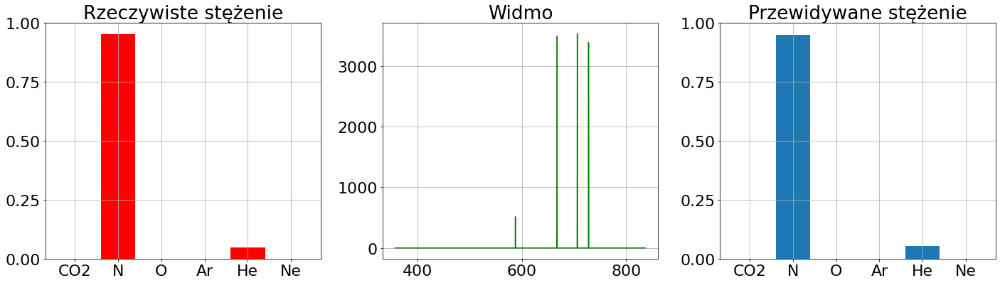

1


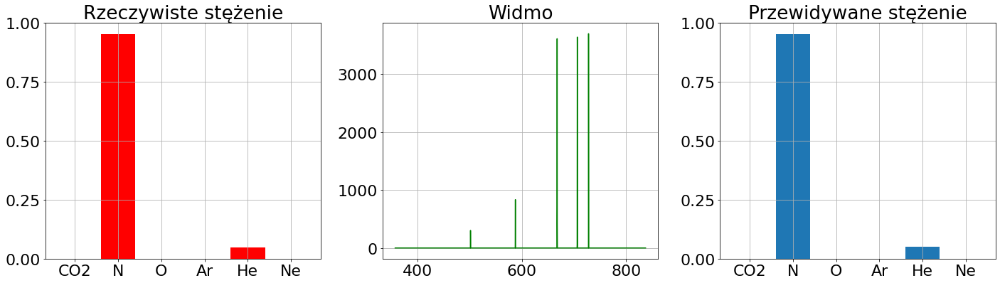

2


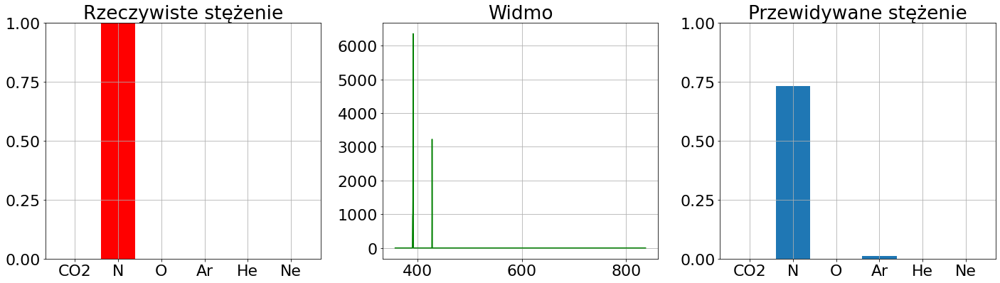

3


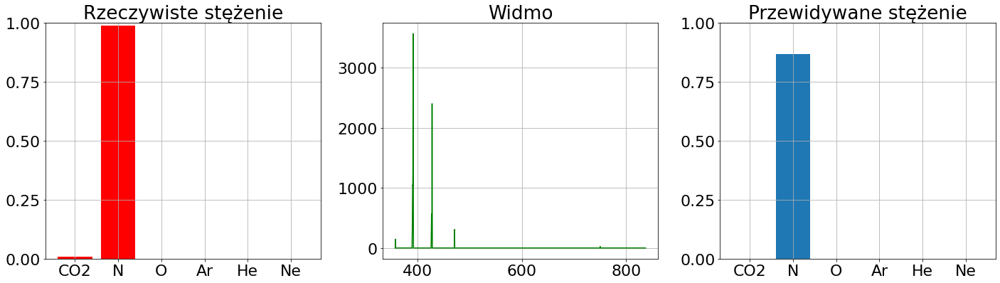

4


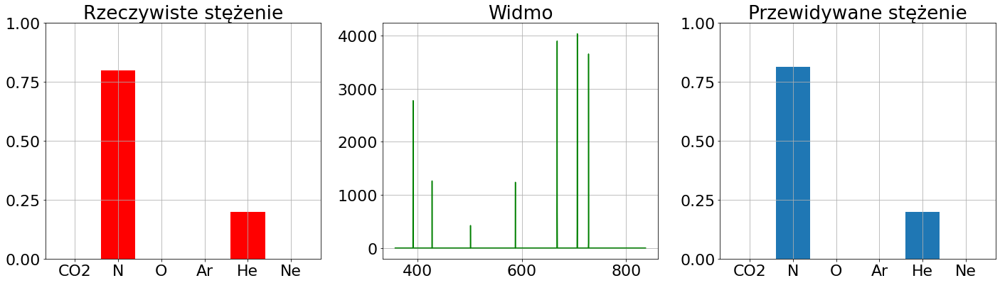

5


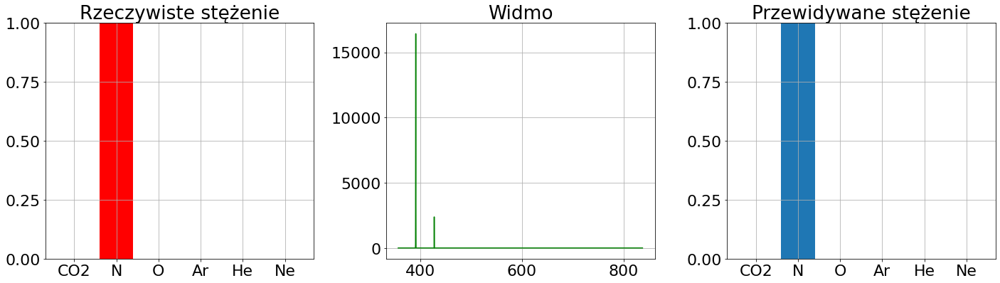

6


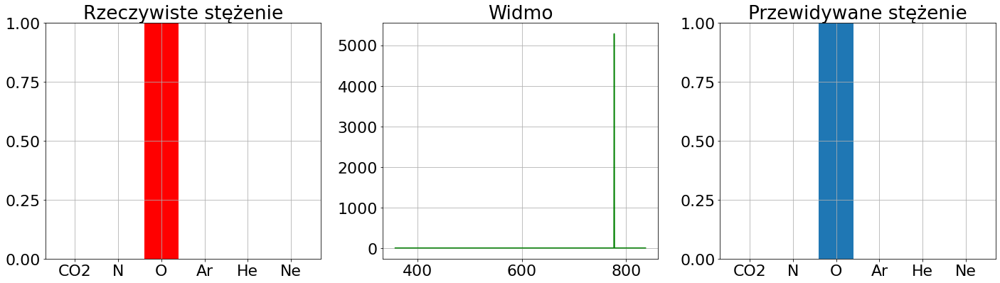

7


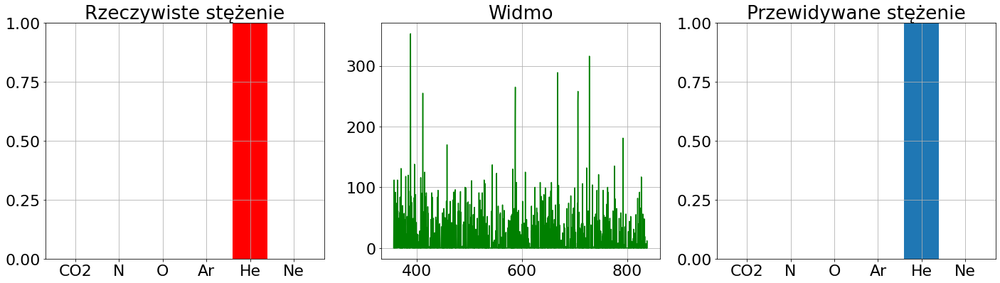

8


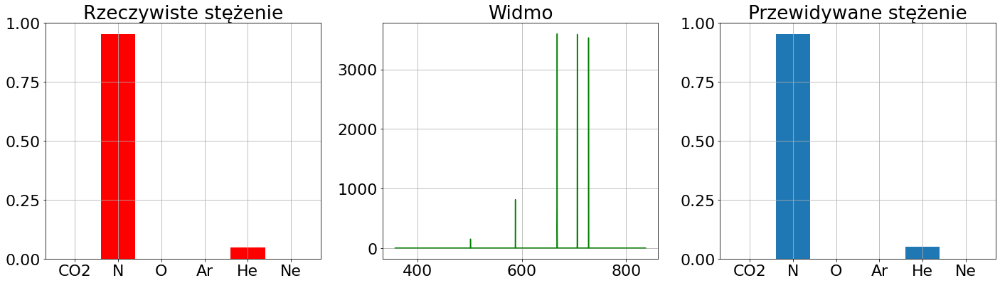

9


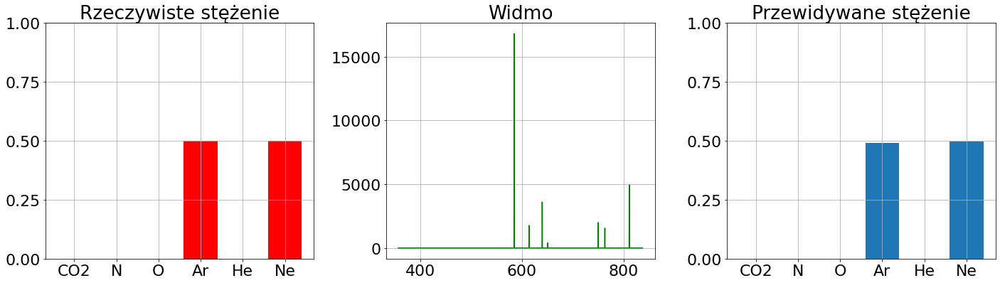

10


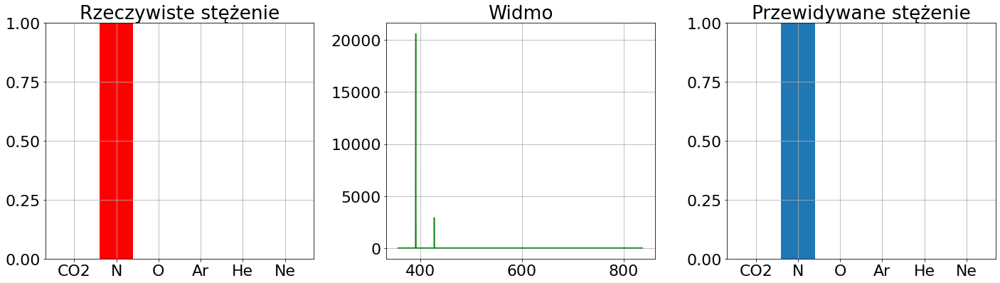

11


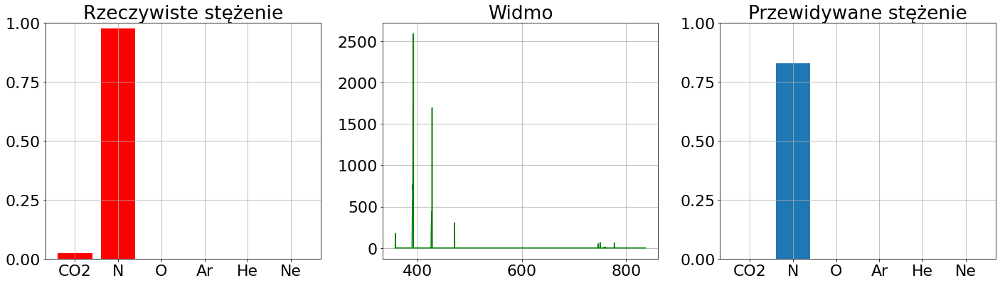

12


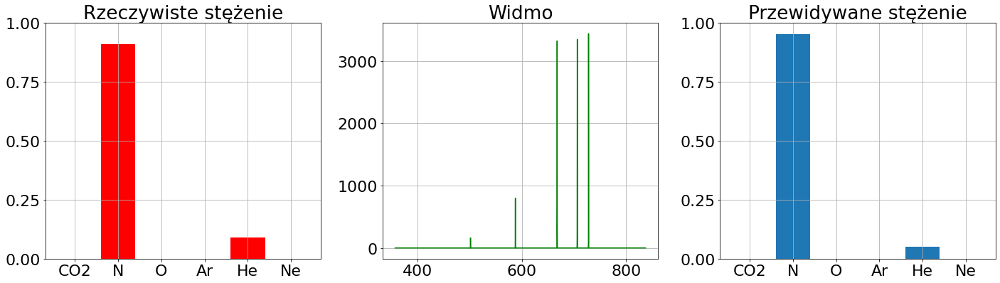

13


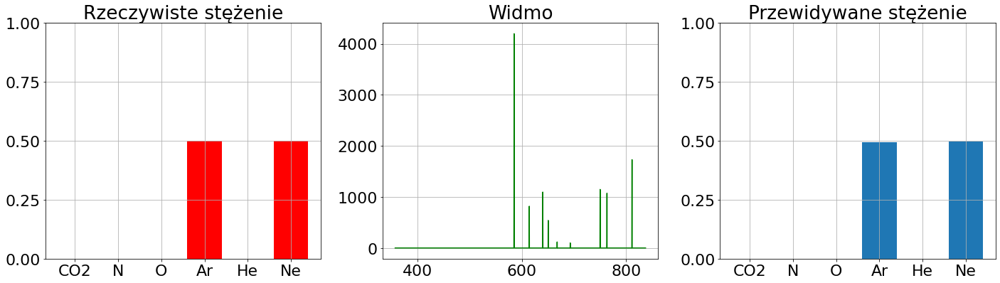

14


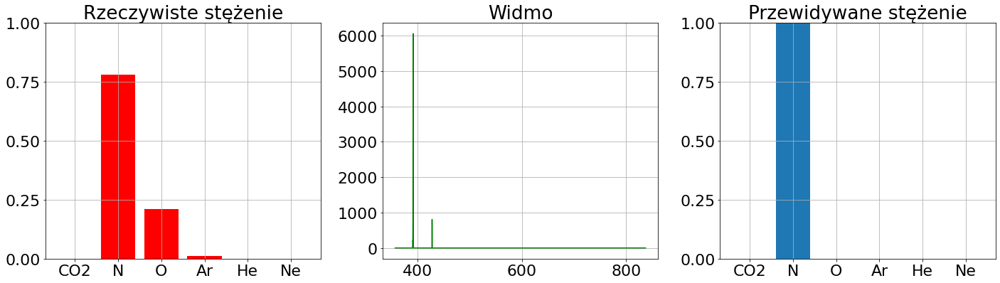

15


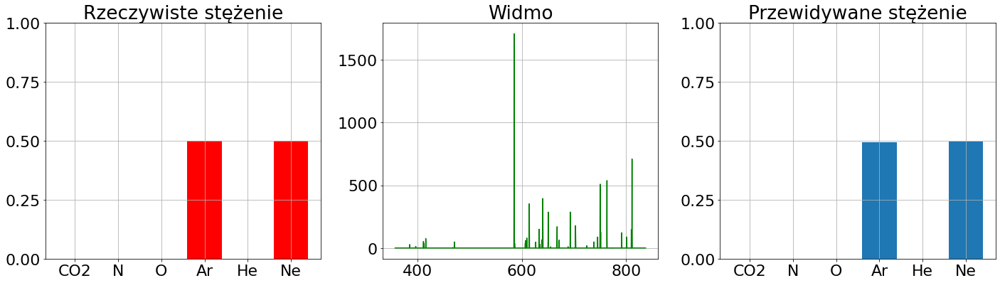

16


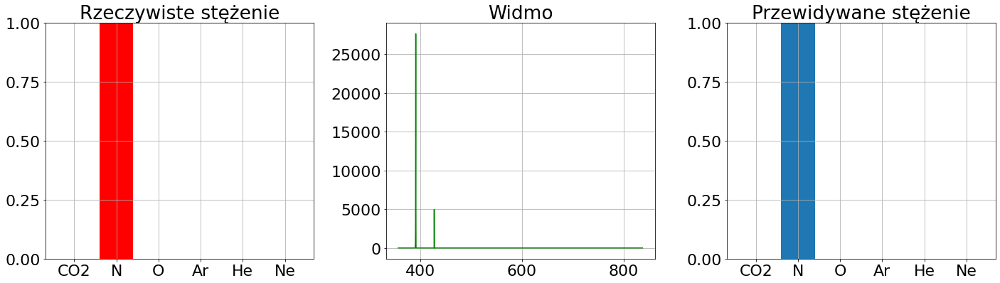

17


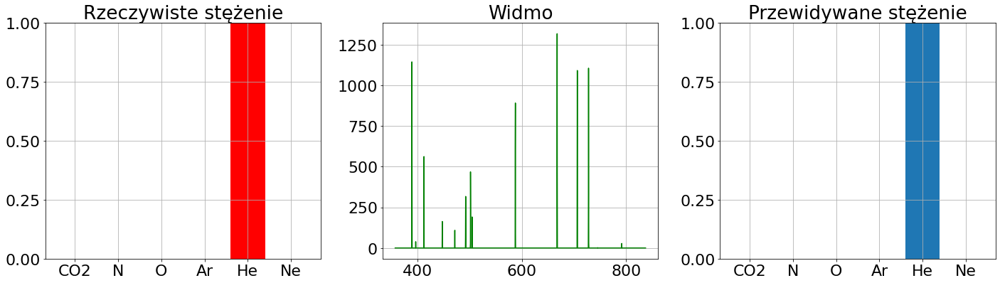

18


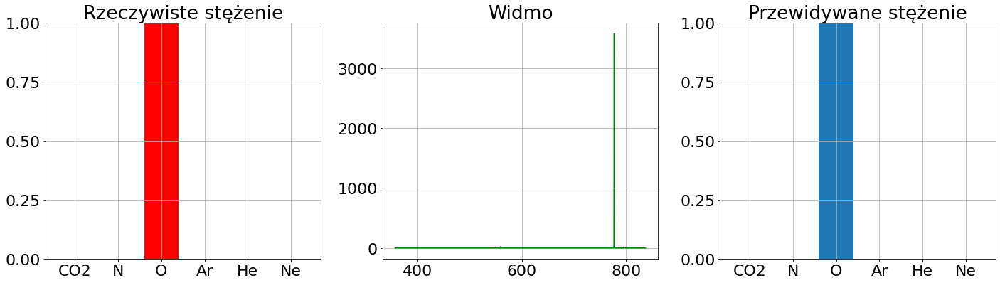

19


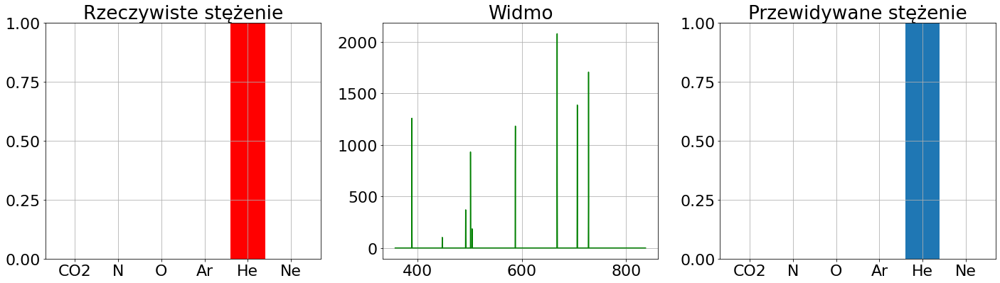

20


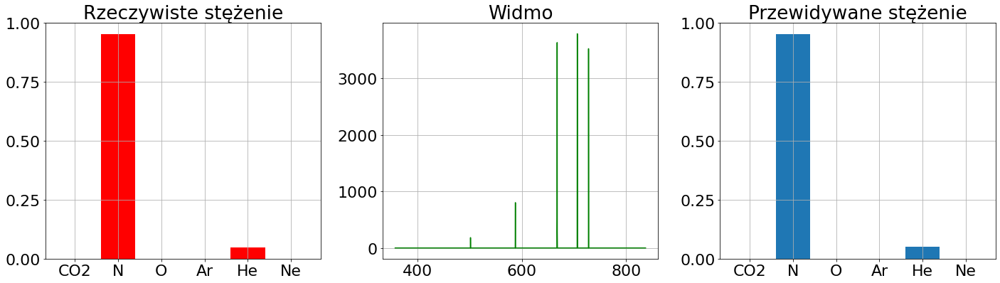

21


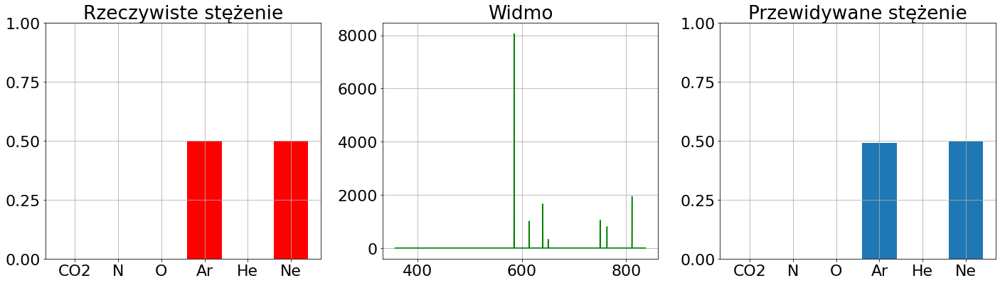

22


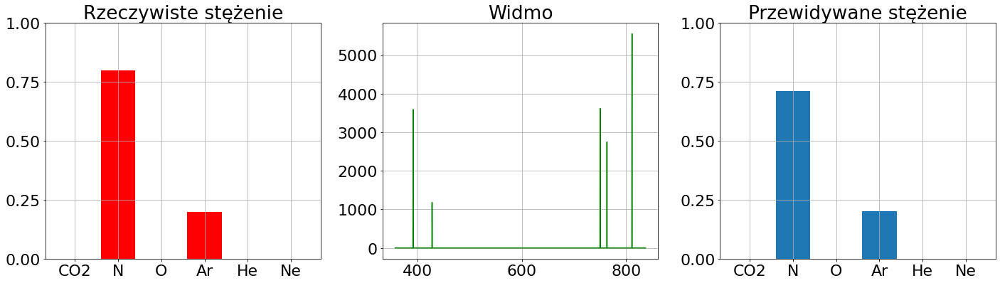

23


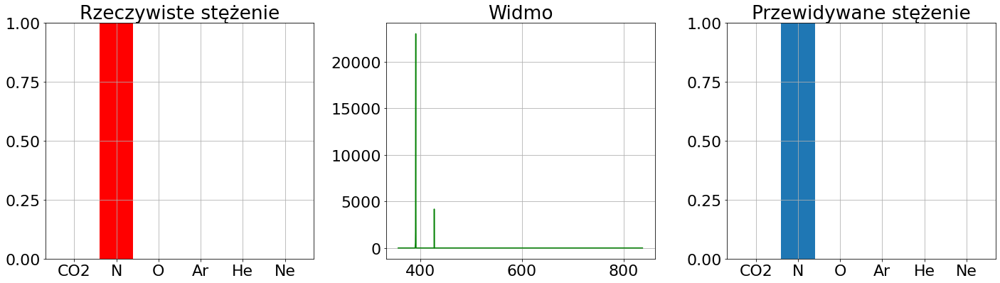

24


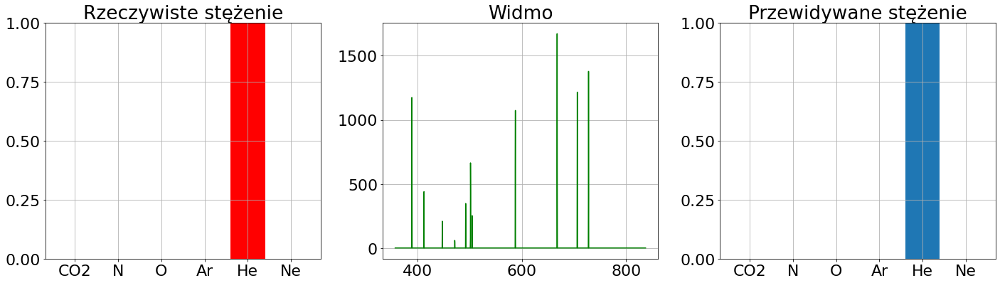

25


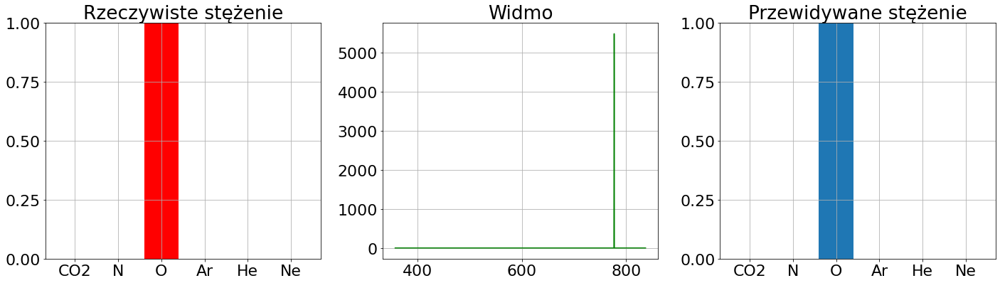

26


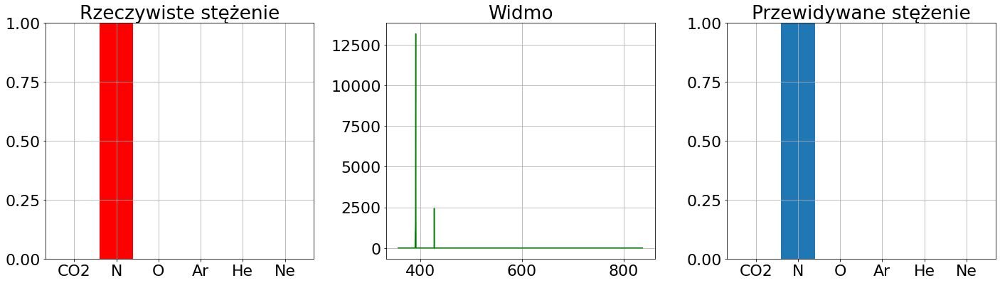

27


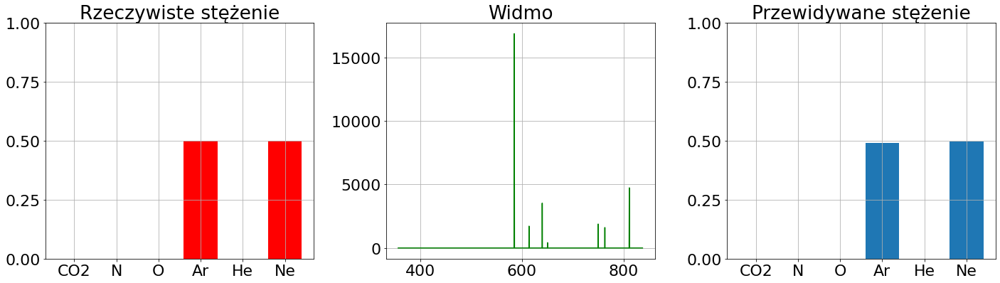

28


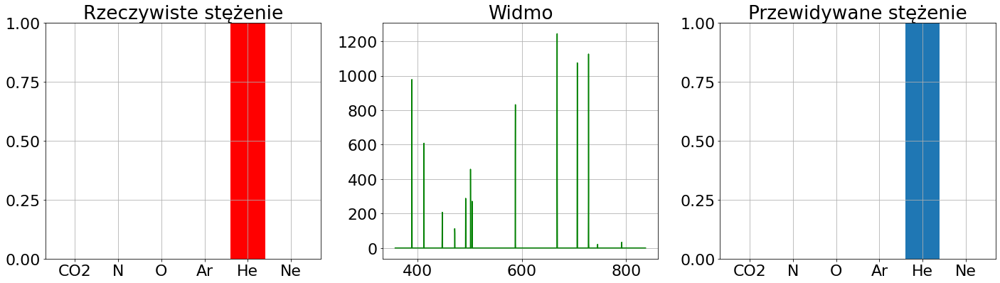

29


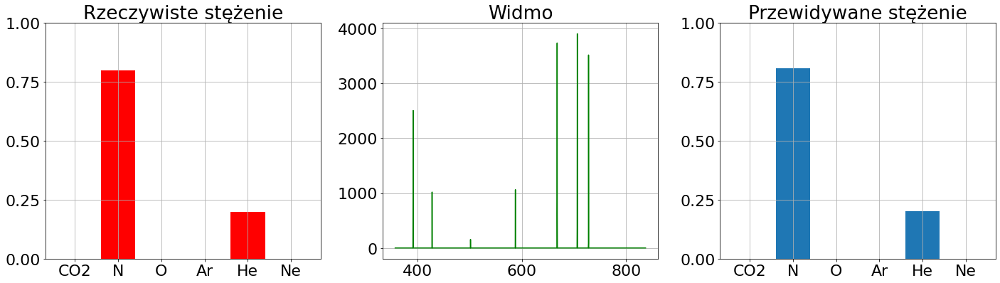

30


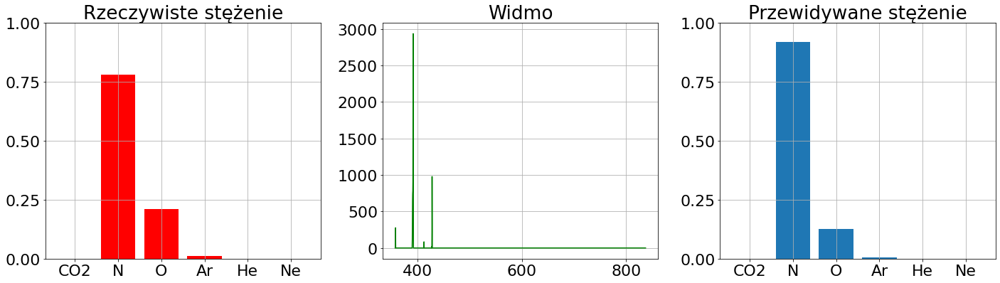

31


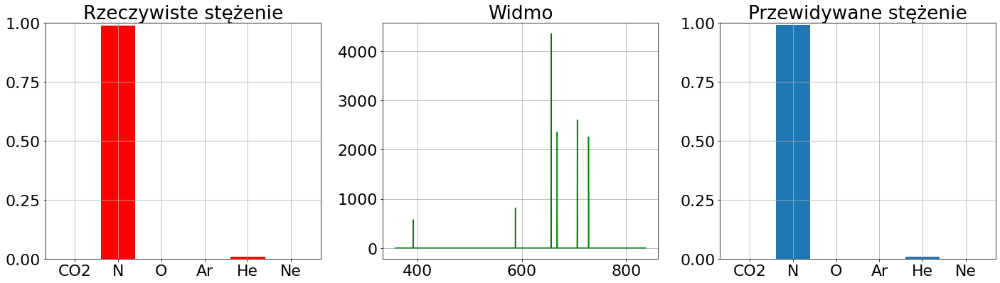

32


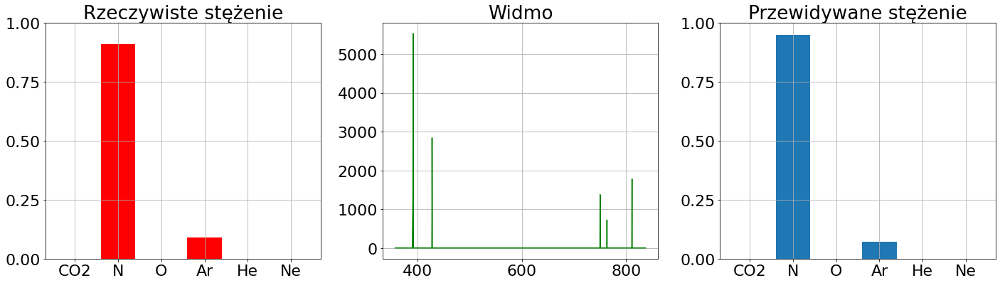

33


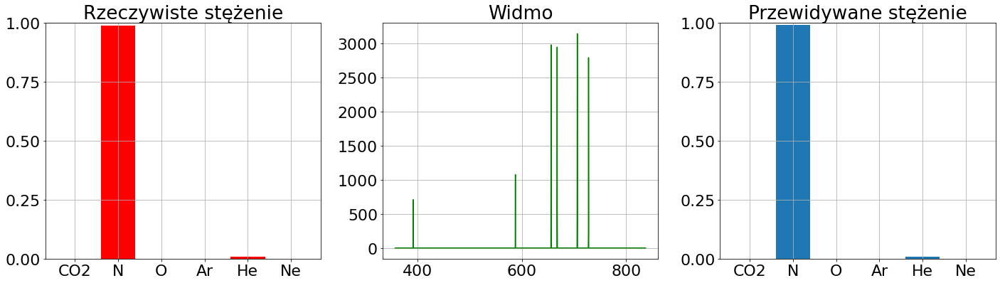

34


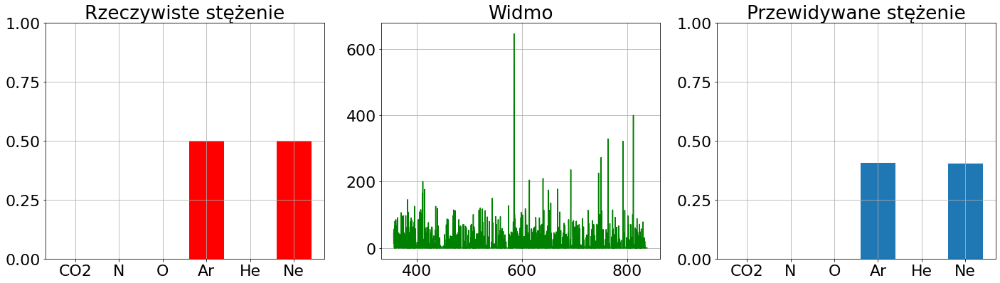

35


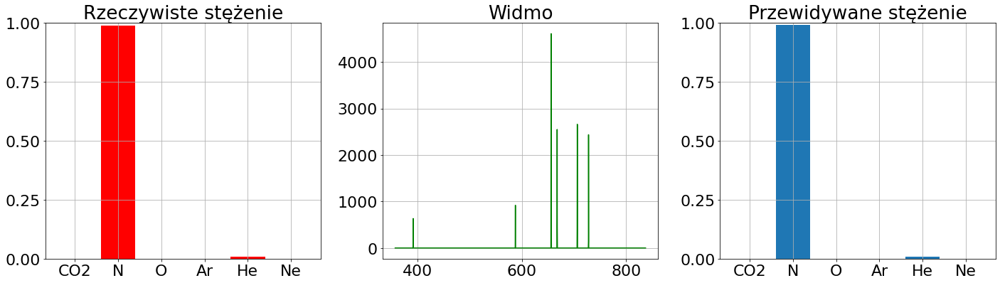

36


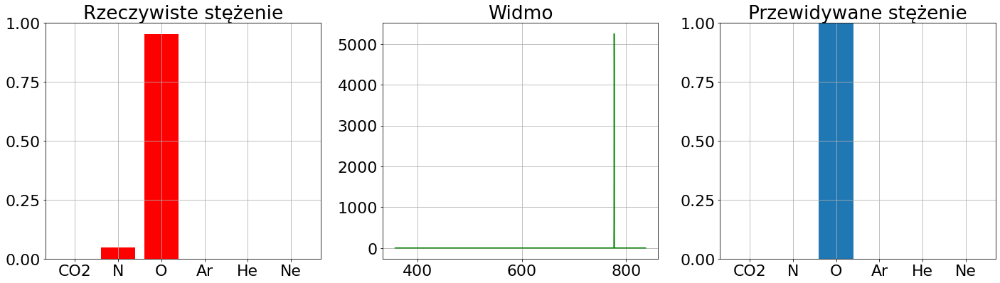

37


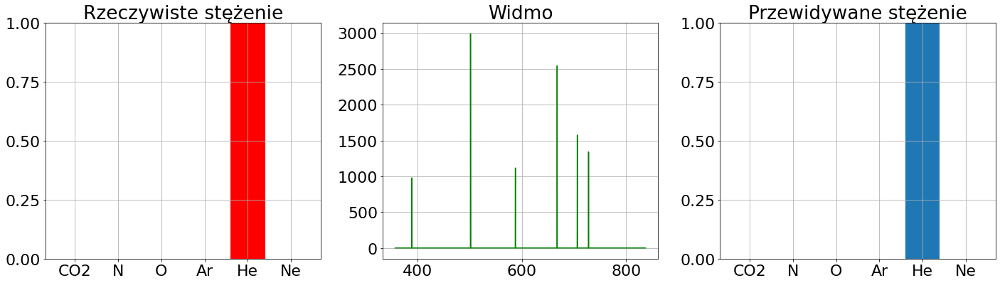

38


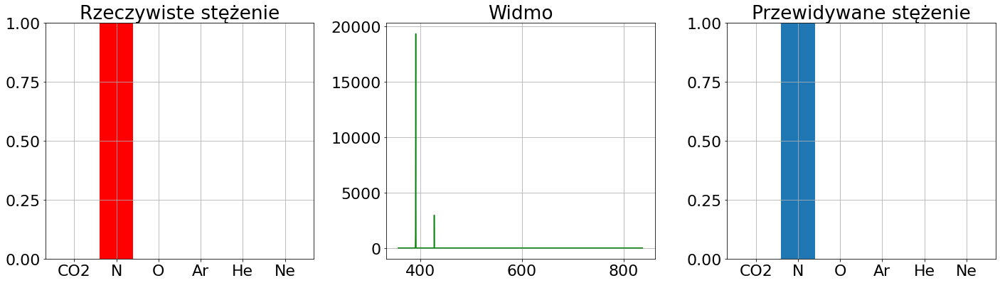

39


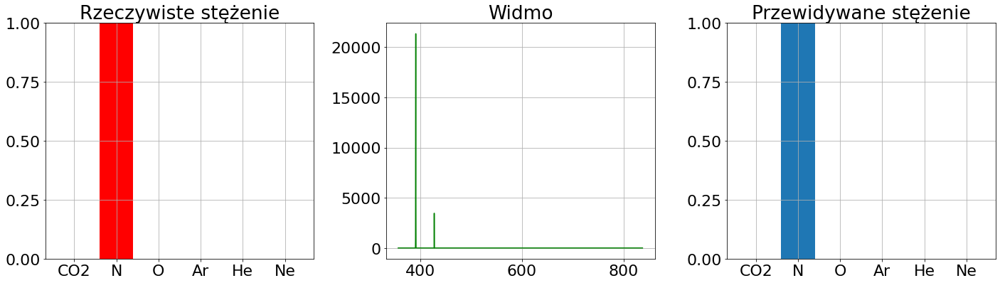

40


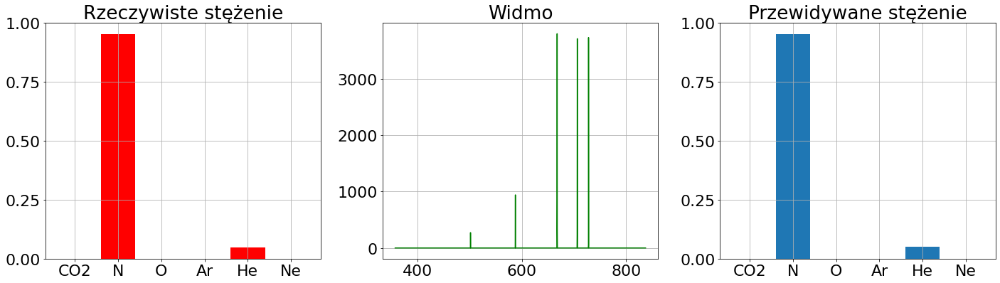

41


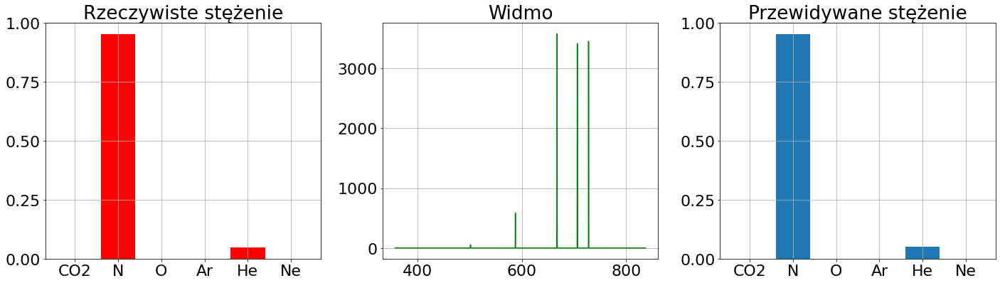

42


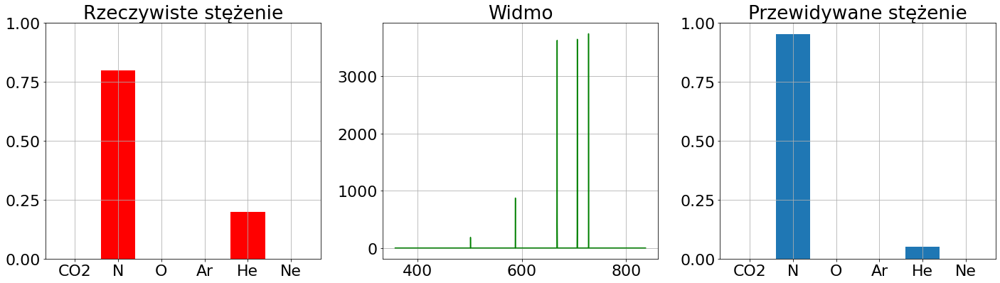

43


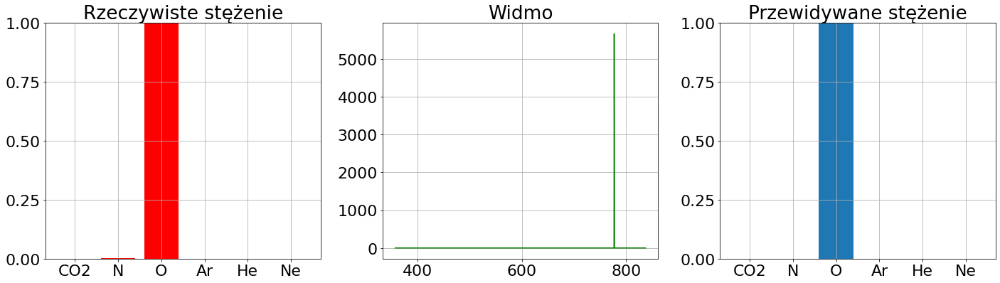

44


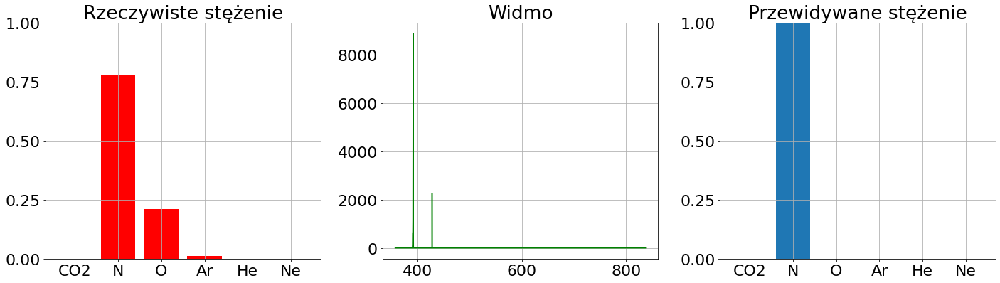

45


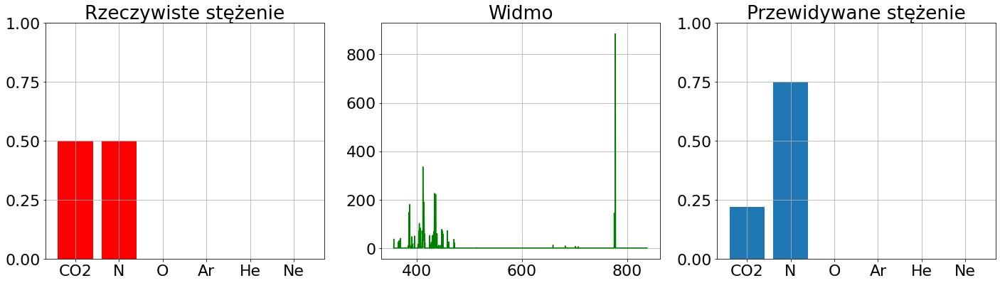

46


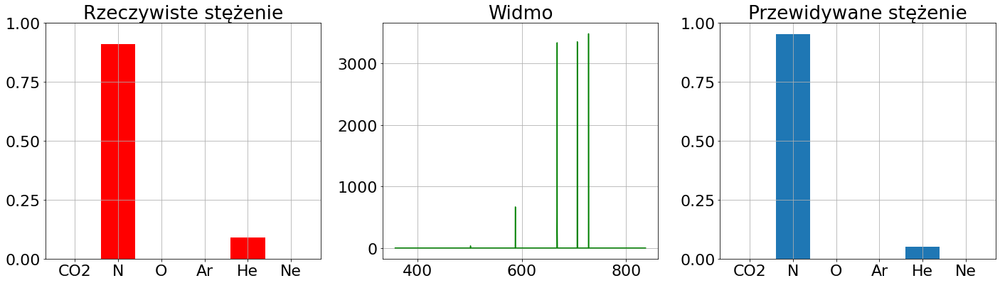

47


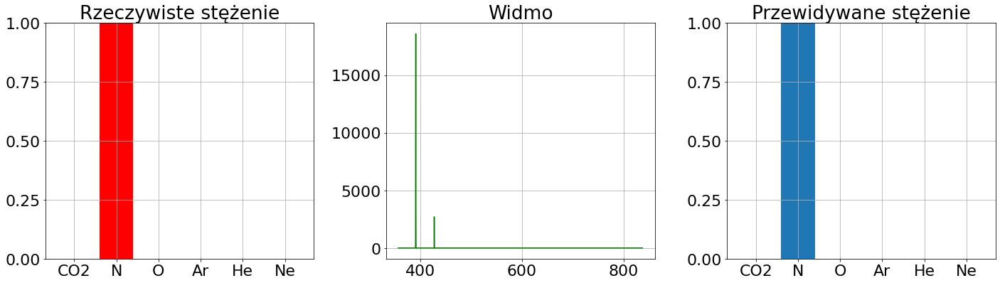

48


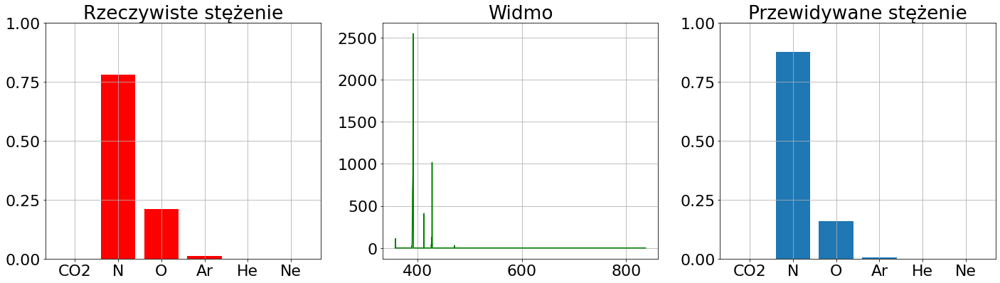

49


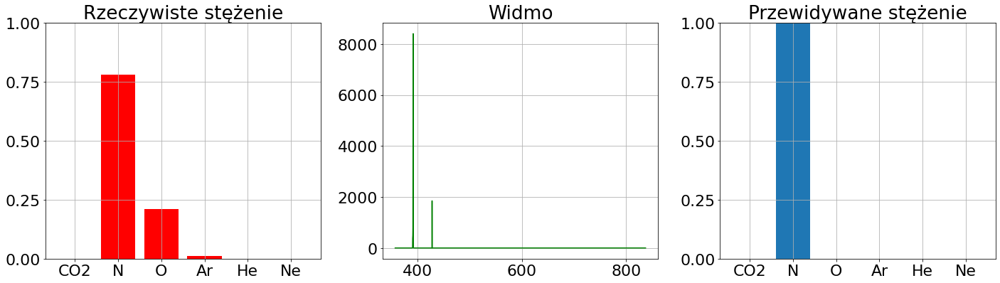

50


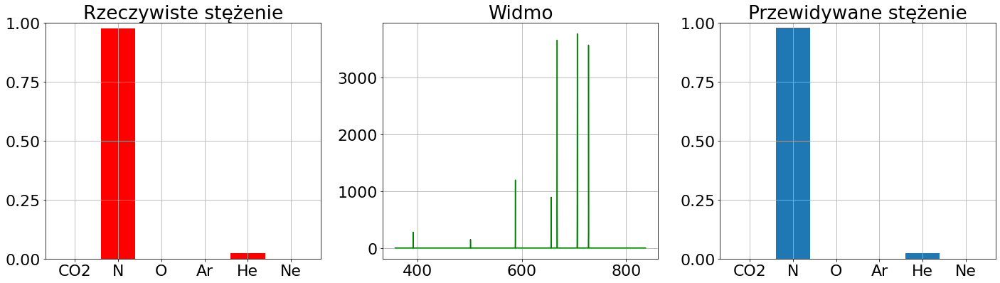

51


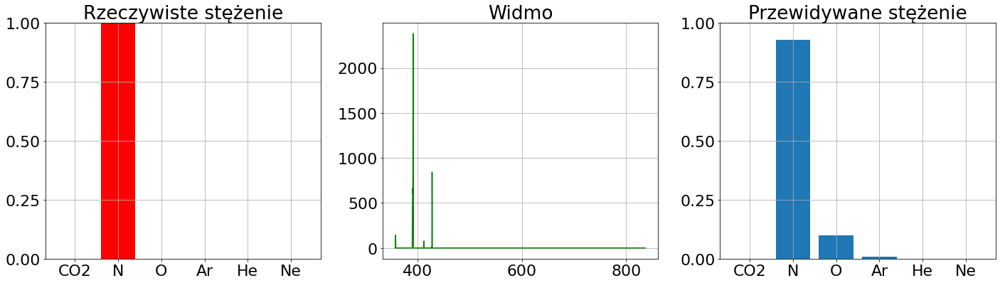

52


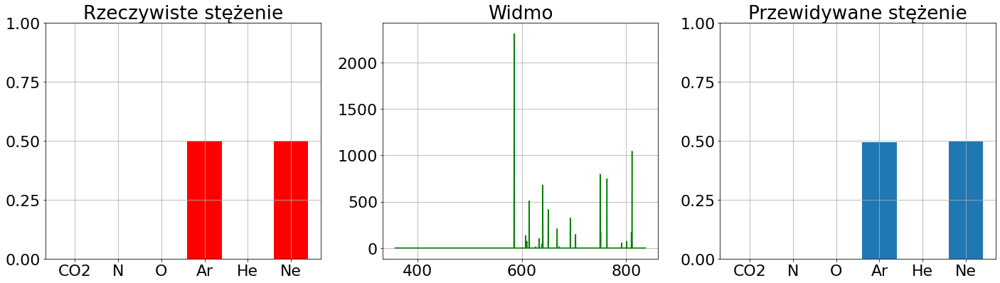

53


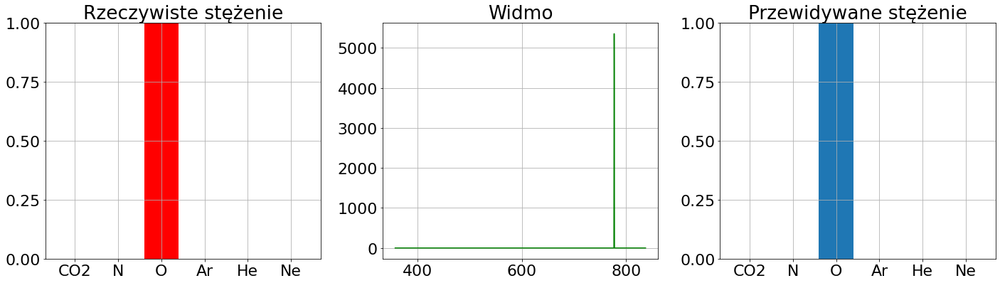

54


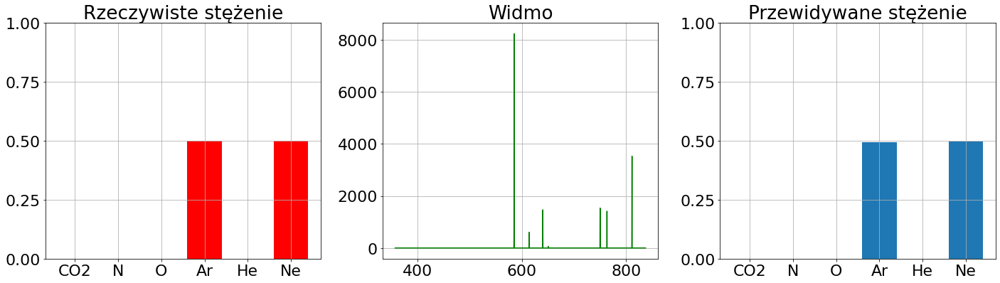

55


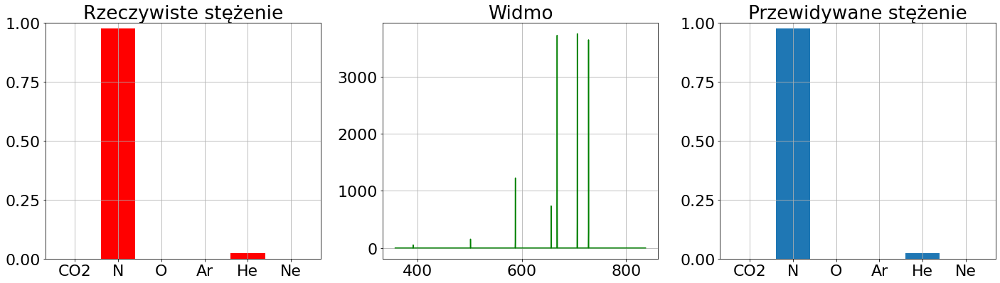

56


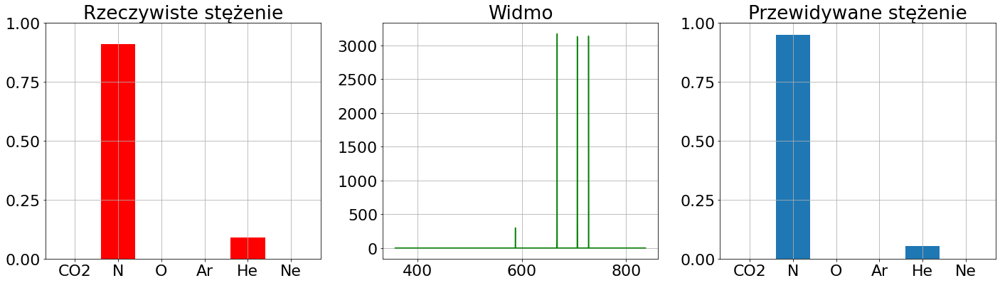

57


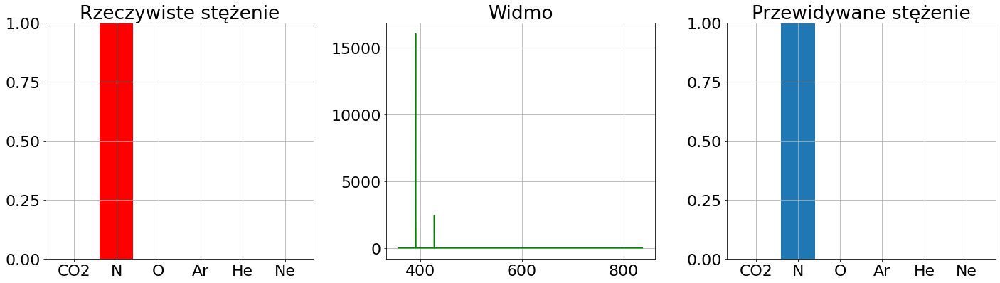

58


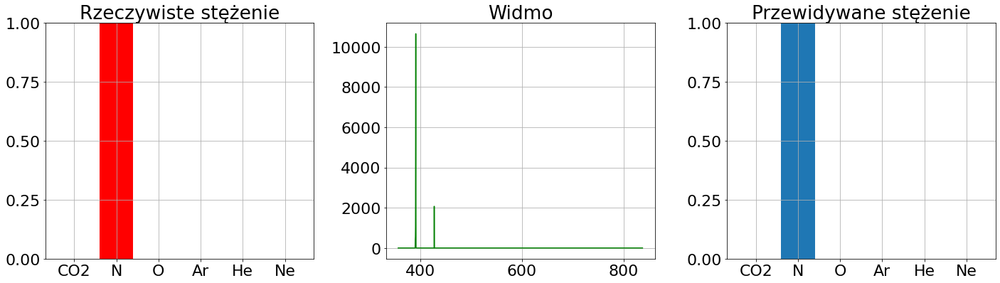

59


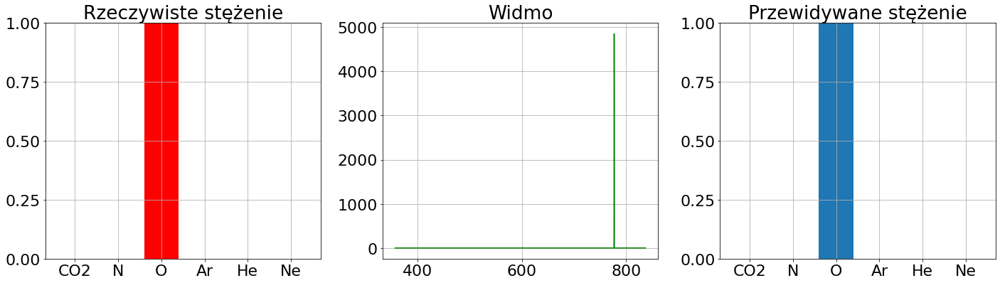

60


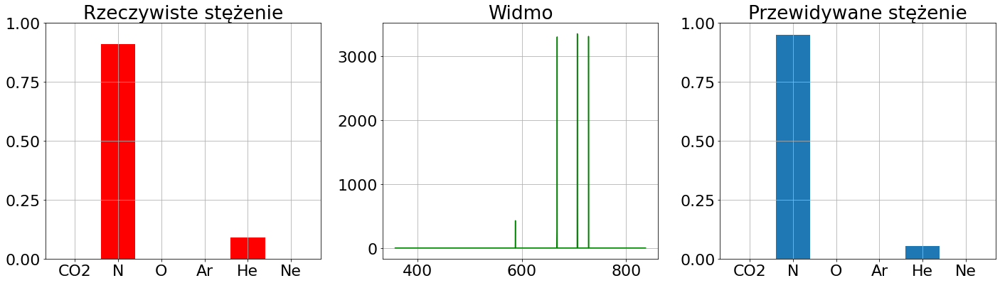

61


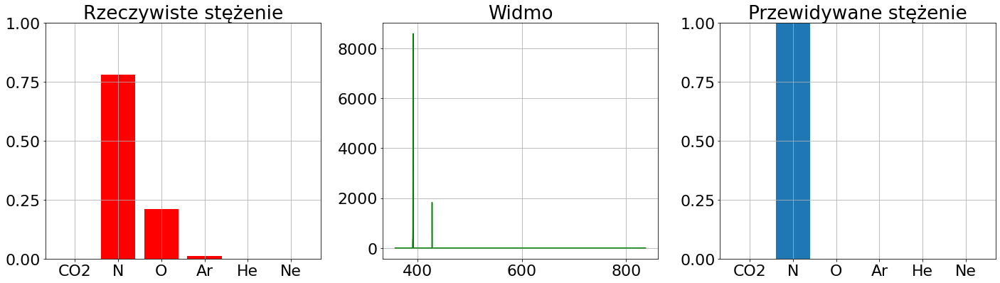

62


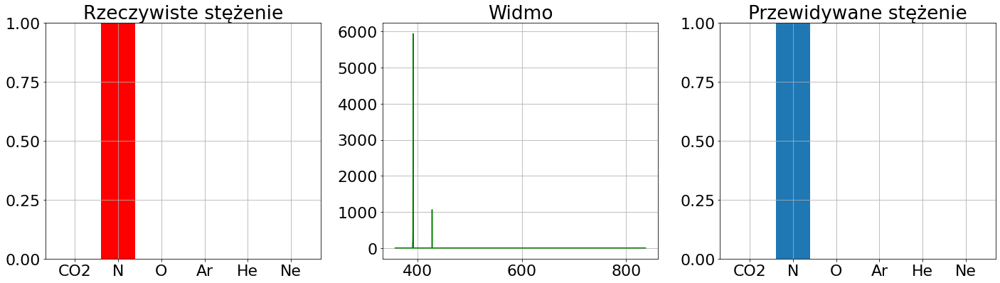

63


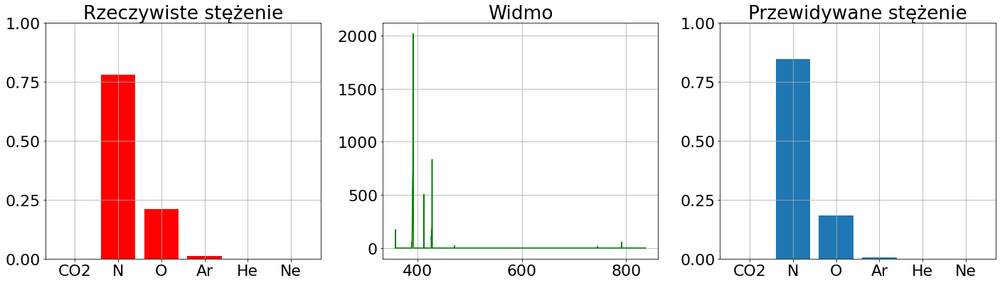

64


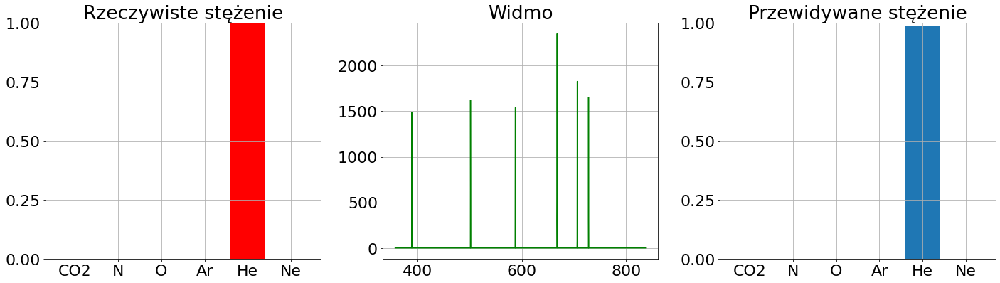

65


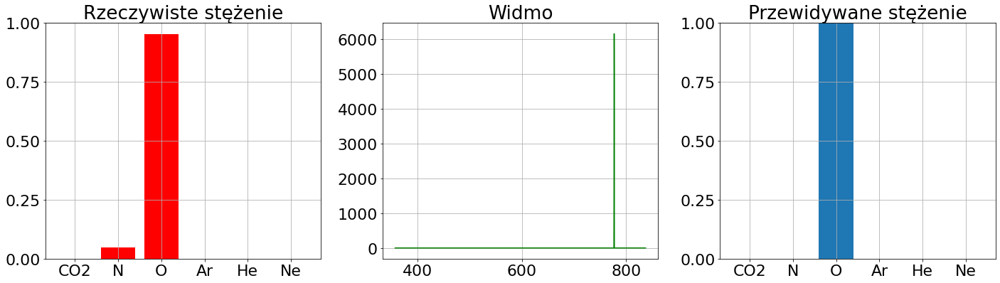

66


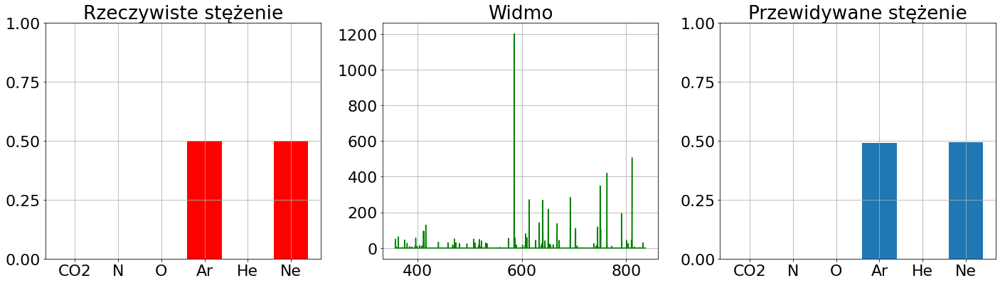

67


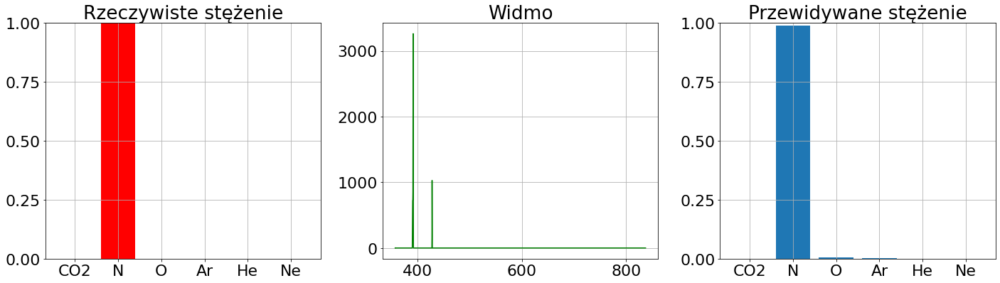

68


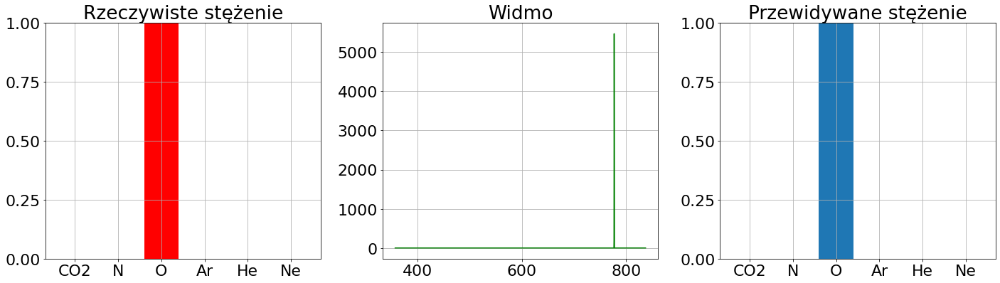

69


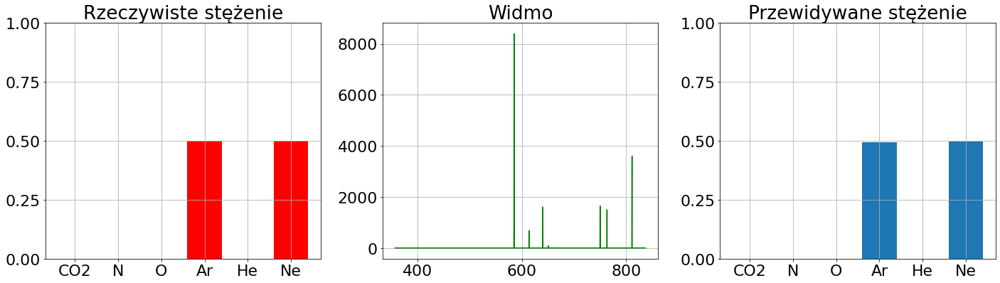

70


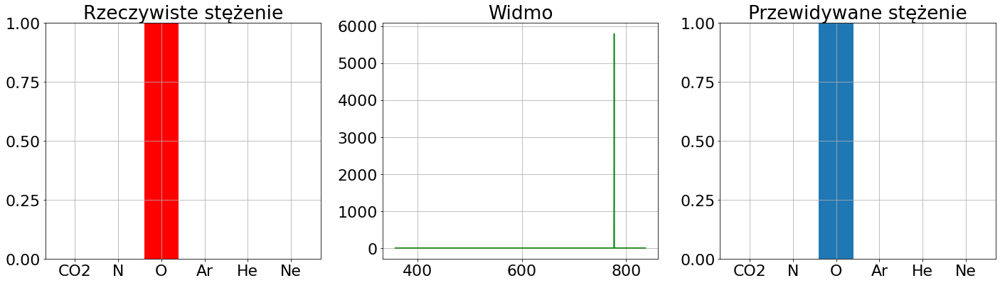

71


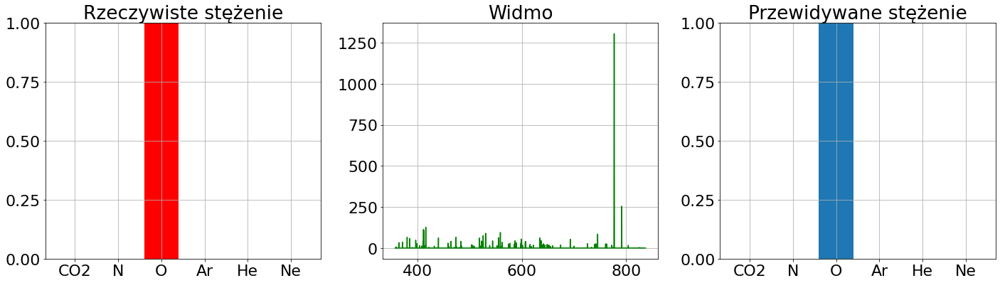

72


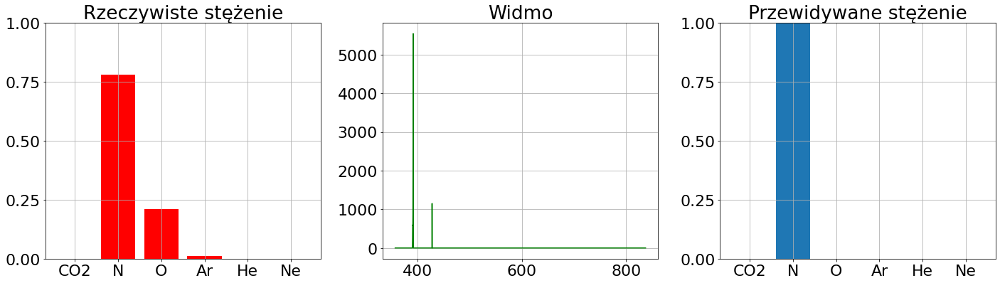

73


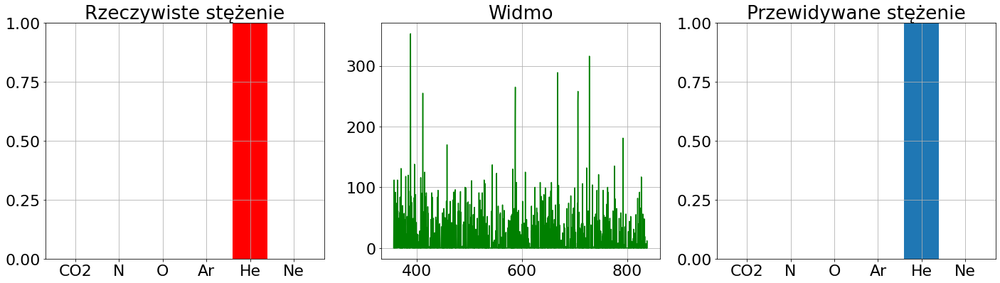

74


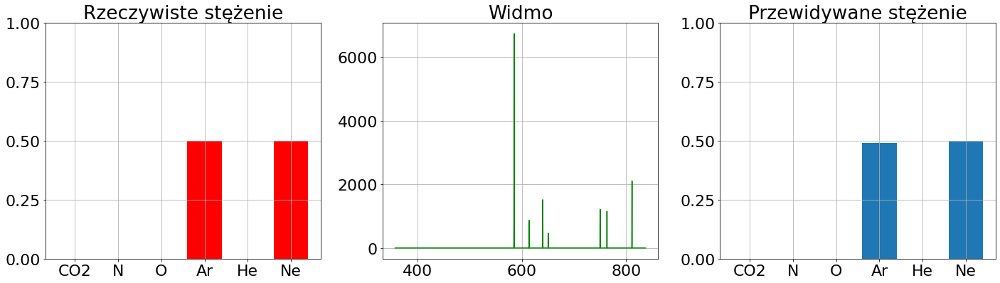

75


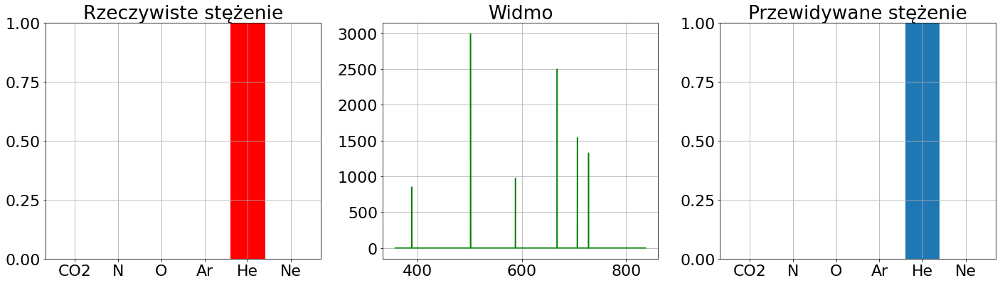

76


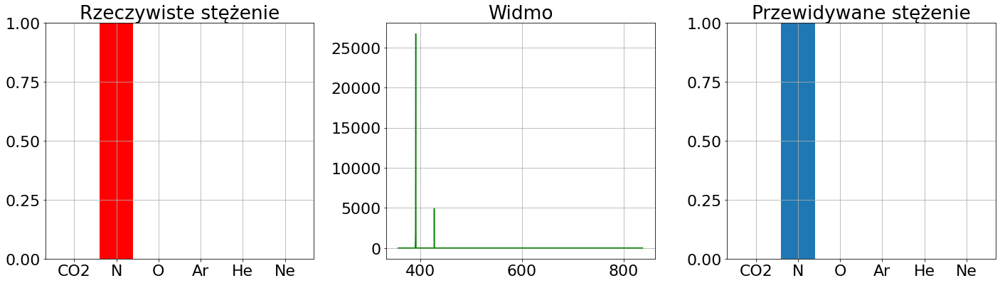

77


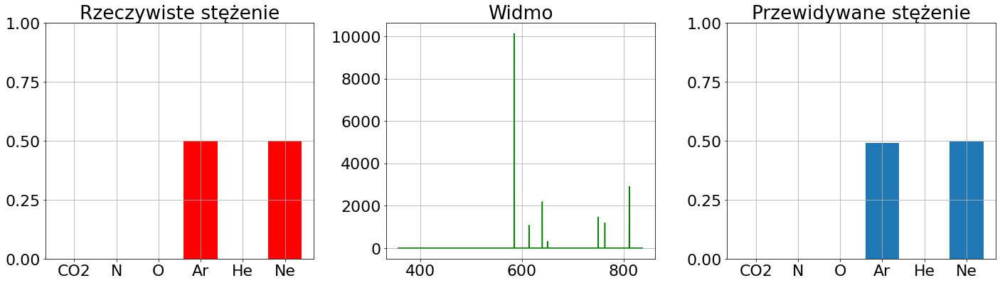

78


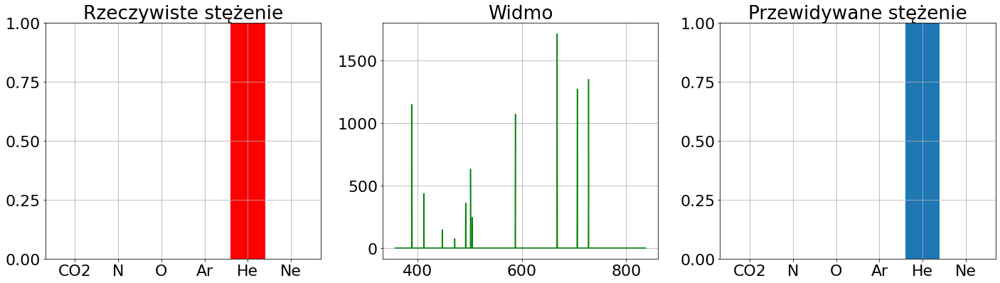

79


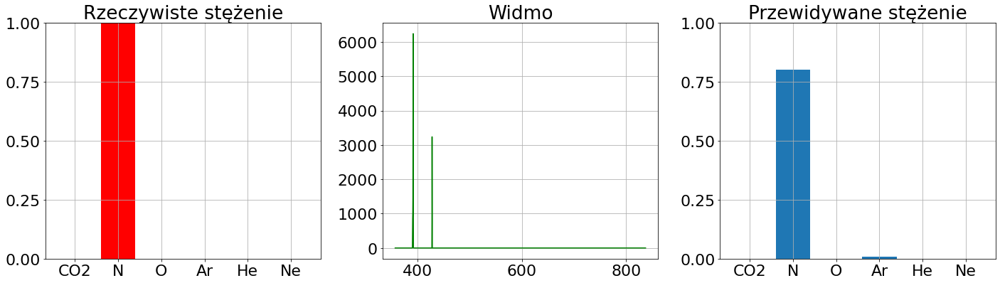

80


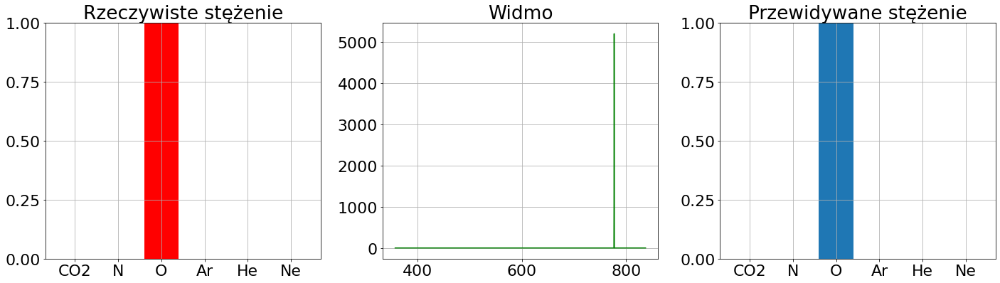

81


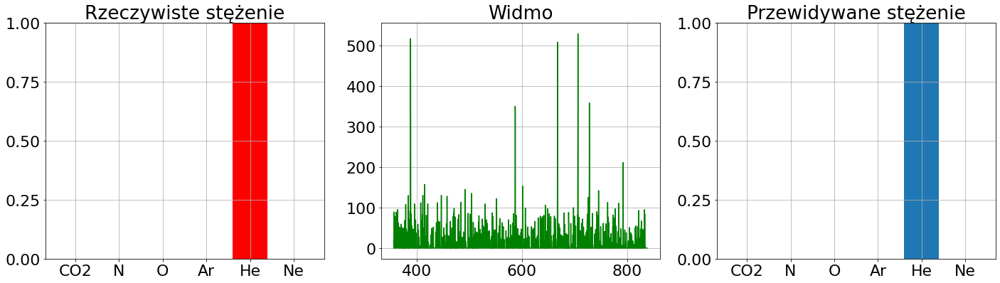

82


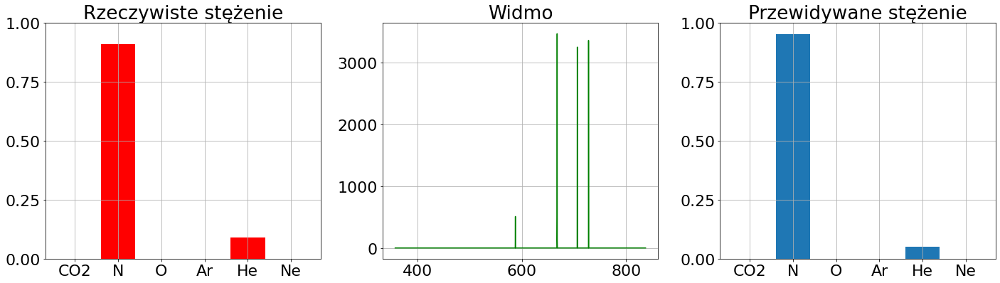

83


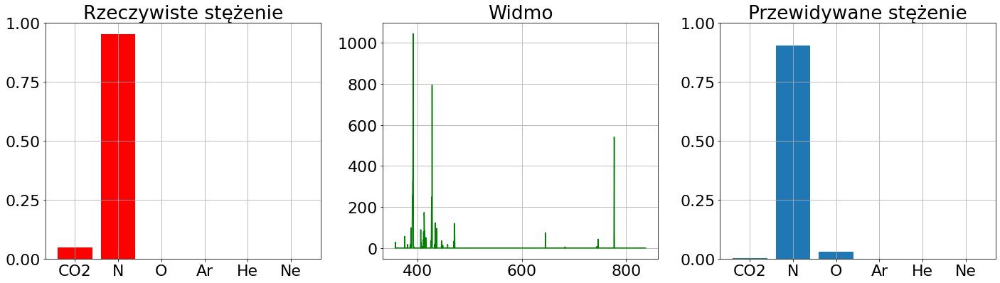

84


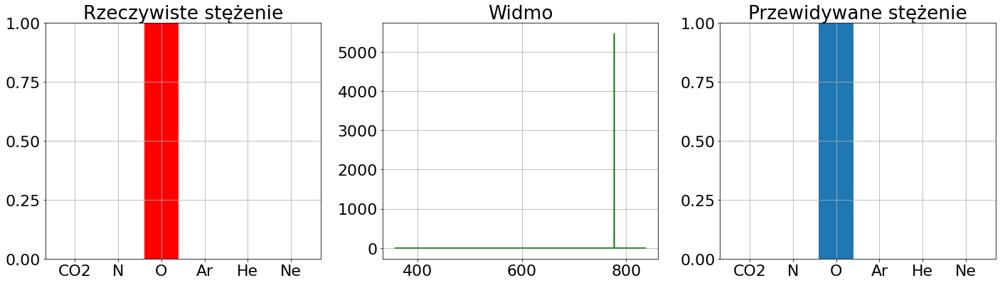

85


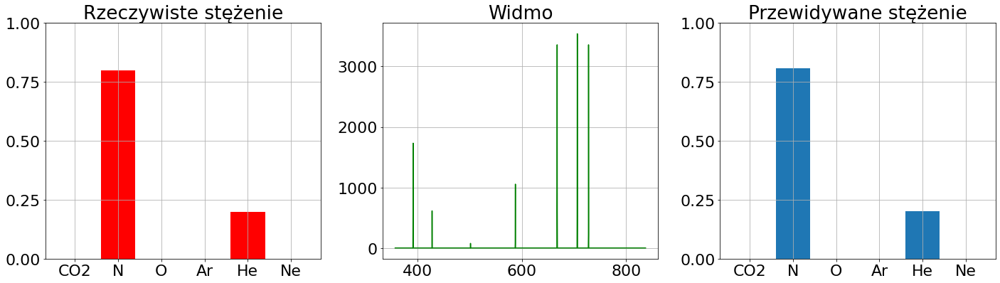

86


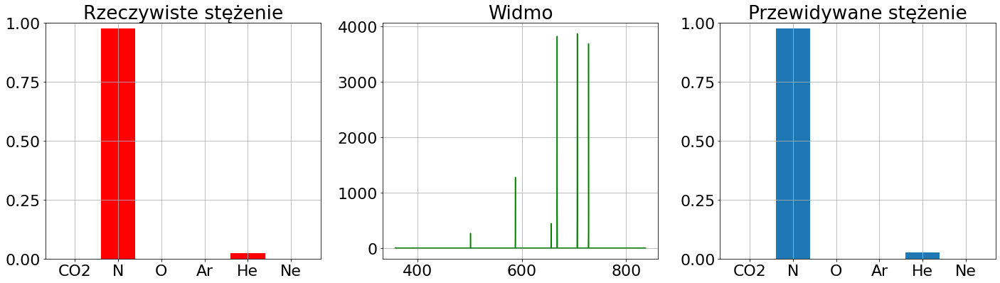

87


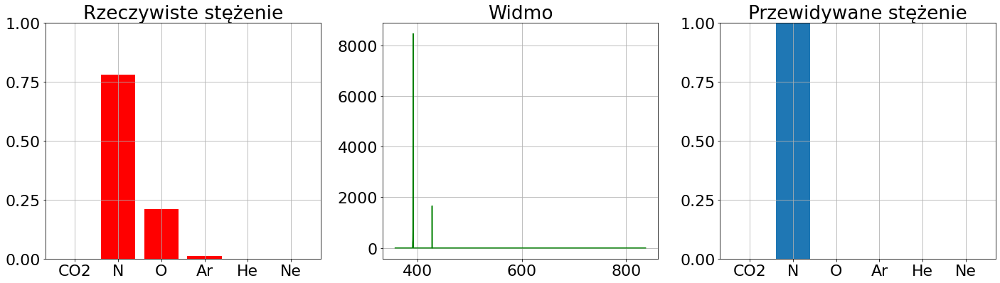

88


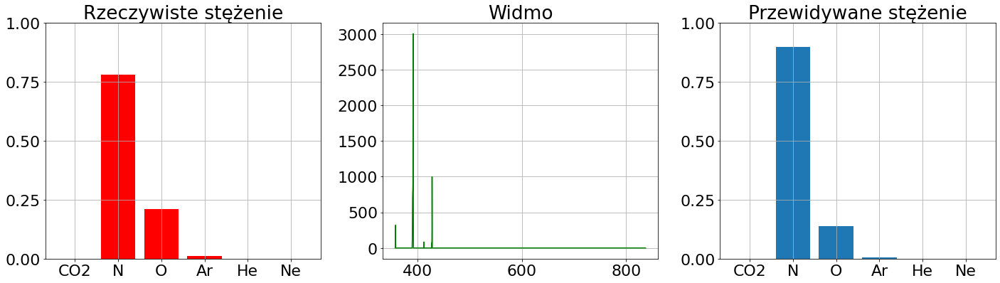

89


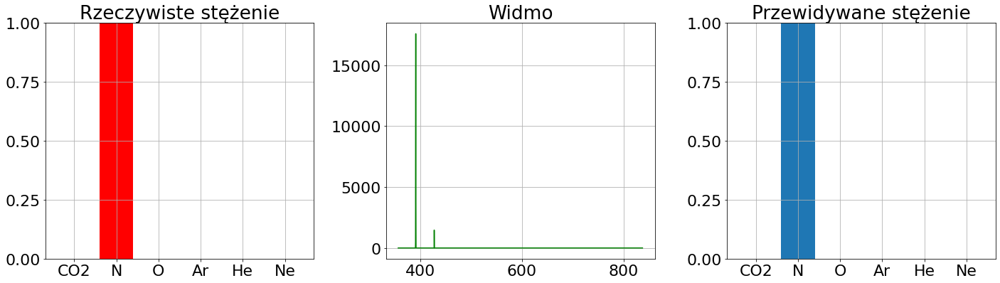

90


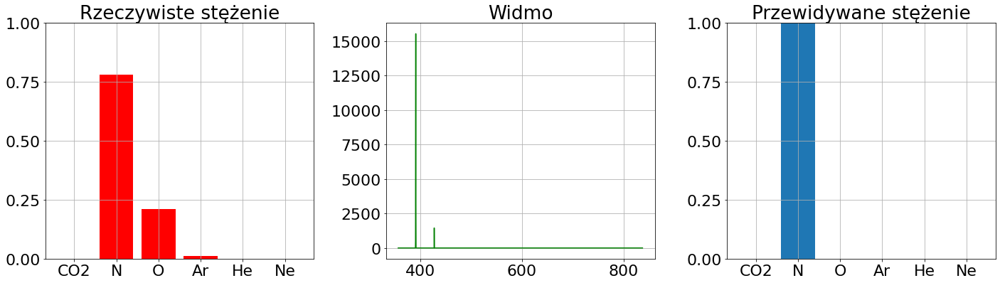

91


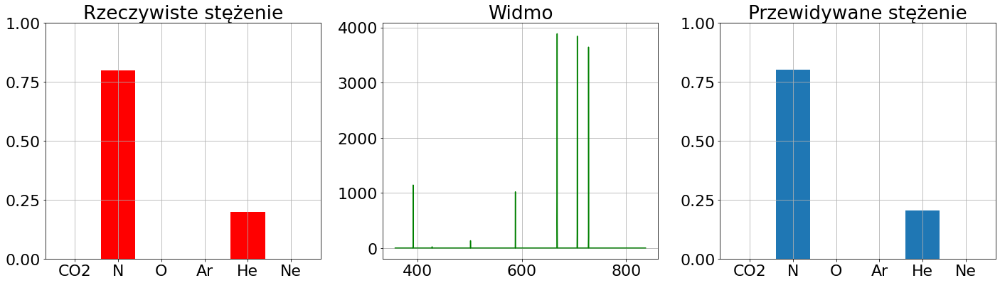

92


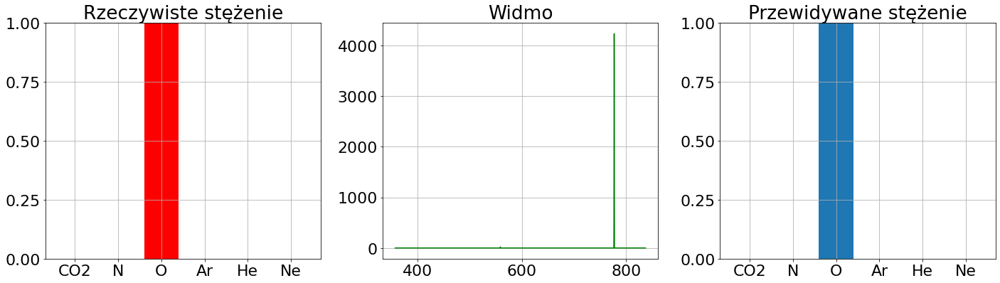

93


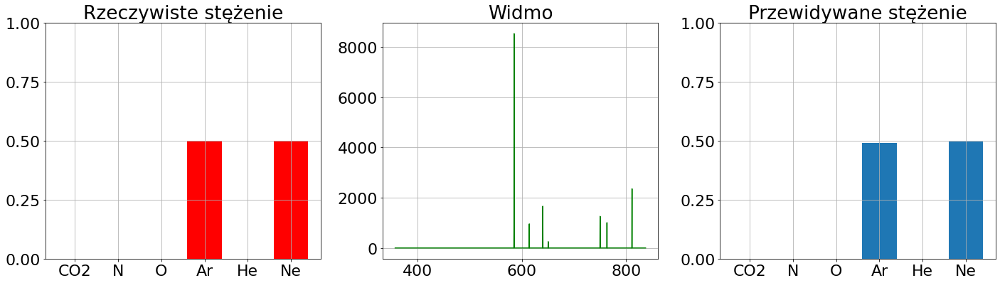

In [364]:
for i in range(94):
    print(i)
    fig = show_predictionsB(hypermodelB, test_spectrums_B, test_concentrations, i)
    fig.savefig('siec_B_wyniki/siec_B_' + "{:02d}".format(i) +".jpg", dpi=fig.dpi)

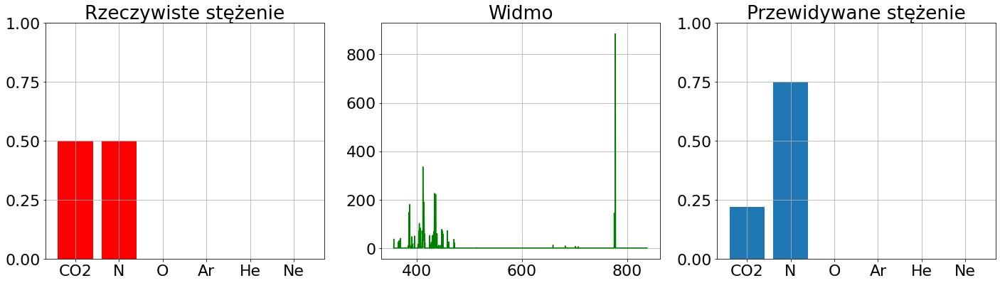

In [354]:
fig = show_predictionsB(hypermodelB, test_spectrums_B, test_concentrations, 45)

In [355]:
fig.savefig('siec_B_przewidywania_2', dpi=fig.dpi)

In [357]:
hypermodelB.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lambda (Lambda)              (None, 2050)              0         
_________________________________________________________________
dense (Dense)                (None, 928)               1903328   
_________________________________________________________________
dense_1 (Dense)              (None, 448)               416192    
_________________________________________________________________
dense_2 (Dense)              (None, 352)               158048    
_________________________________________________________________
dense_3 (Dense)              (None, 6)                 2118      
Total params: 2,479,686
Trainable params: 2,479,686
Non-trainable params: 0
_________________________________________________________________


In [359]:
hypermodelB.save('siecB.h5')

# 3. Sieć C

## 3.1. Dane

In [213]:
train_data = pd.read_csv("train_data.csv")
test_data = pd.read_csv("test_data.csv")
wavelengths = np.loadtxt("wavelengths")

train_data.head()

,Uin,pressure,co2,ni,ox,ar,he,ne,356.519,356.766,...,835.533,835.737,835.94,836.143,836.346,836.549,836.752,836.955,837.158,837.361
0,972.0,0.0150,0.0,0.666667,0.0,0.0,0.333333,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,985.0,0.0050,0.0,0.000000,1.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,637.0,0.0100,0.0,1.000000,0.0,0.0,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,971.0,0.0123,0.0,0.909091,0.0,0.0,0.090909,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,965.0,0.0130,0.0,0.975610,0.0,0.0,0.024390,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [214]:
train_pressure = -np.log10(train_data.to_numpy()[:, 1])
train_spectrums_C = np.concatenate([train_data.to_numpy()[:, 0].reshape(-1,1), train_data.to_numpy()[:, 8:]], axis=1)

test_pressure = -np.log10(test_data.to_numpy()[:, 1])
test_spectrums_C = np.concatenate([test_data.to_numpy()[:, 0].reshape(-1,1), test_data.to_numpy()[:, 8:]], axis=1)

## 3.2 Wstępny model

In [216]:
tf.random.set_seed(13)

modelC= tf.keras.Sequential([
    tf.keras.layers.InputLayer(input_shape=(2048+1,)),
    tf.keras.layers.Dense(512, activation='tanh'),
    tf.keras.layers.Dense(256, activation='tanh'),
    tf.keras.layers.Dense(128, activation='tanh'),
    tf.keras.layers.Dense(1, activation="relu")
]
)

In [218]:
tf.random.set_seed(13)

modelC.compile(loss="mse",
              optimizer='Adam',
              metrics=['mse'])

history = modelC.fit(train_spectrums_C,
                    train_pressure,
                    epochs=100,
                    steps_per_epoch=10,
                    verbose = 2,
                    validation_split = 0.2)

Epoch 1/100
10/10 - 1s - loss: 1.3061 - mse: 1.3061 - val_loss: 0.3660 - val_mse: 0.3660
Epoch 2/100
10/10 - 0s - loss: 0.2467 - mse: 0.2467 - val_loss: 0.1720 - val_mse: 0.1720
Epoch 3/100
10/10 - 0s - loss: 0.1147 - mse: 0.1147 - val_loss: 0.1508 - val_mse: 0.1508
Epoch 4/100
10/10 - 0s - loss: 0.0737 - mse: 0.0737 - val_loss: 0.1103 - val_mse: 0.1103
Epoch 5/100
10/10 - 0s - loss: 0.0508 - mse: 0.0508 - val_loss: 0.1261 - val_mse: 0.1261
Epoch 6/100
10/10 - 0s - loss: 0.0446 - mse: 0.0446 - val_loss: 0.1137 - val_mse: 0.1137
Epoch 7/100
10/10 - 0s - loss: 0.0404 - mse: 0.0404 - val_loss: 0.1118 - val_mse: 0.1118
Epoch 8/100
10/10 - 0s - loss: 0.0411 - mse: 0.0411 - val_loss: 0.1098 - val_mse: 0.1098
Epoch 9/100
10/10 - 0s - loss: 0.0403 - mse: 0.0403 - val_loss: 0.1129 - val_mse: 0.1129
Epoch 10/100
10/10 - 0s - loss: 0.0384 - mse: 0.0384 - val_loss: 0.1160 - val_mse: 0.1160
Epoch 11/100
10/10 - 0s - loss: 0.0399 - mse: 0.0399 - val_loss: 0.1171 - val_mse: 0.1171
Epoch 12/100
10/10 

Epoch 93/100
10/10 - 0s - loss: 0.0289 - mse: 0.0289 - val_loss: 0.0824 - val_mse: 0.0824
Epoch 94/100
10/10 - 0s - loss: 0.0314 - mse: 0.0314 - val_loss: 0.0918 - val_mse: 0.0918
Epoch 95/100
10/10 - 0s - loss: 0.0327 - mse: 0.0327 - val_loss: 0.0811 - val_mse: 0.0811
Epoch 96/100
10/10 - 0s - loss: 0.0290 - mse: 0.0290 - val_loss: 0.0870 - val_mse: 0.0870
Epoch 97/100
10/10 - 0s - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0871 - val_mse: 0.0871
Epoch 98/100
10/10 - 0s - loss: 0.0320 - mse: 0.0320 - val_loss: 0.0794 - val_mse: 0.0794
Epoch 99/100
10/10 - 0s - loss: 0.0295 - mse: 0.0295 - val_loss: 0.0815 - val_mse: 0.0815
Epoch 100/100
10/10 - 0s - loss: 0.0300 - mse: 0.0300 - val_loss: 0.0863 - val_mse: 0.0863


In [231]:
pred = modelC.predict(test_spectrums_C)

passed = ((0.8 * test_pressure < pred[:,0]) & (pred[:,0] < 1.2 * test_pressure)).sum()
all_samples = test_pressure.shape[0]

print(f"Poprawnie przewidziane: {passed}/{all_samples} \n")

for i in range(pred.shape[0]):
    print(pred[i,0], test_pressure[i], 0.8 * test_pressure[i] < pred[i,0] < 1.2 * test_pressure[i] )

Poprawnie przewidziane: 88/94 

1.906025 1.9208187539523751 True
1.8909873 1.9208187539523751 True
1.7297345 1.8239087409443189 True
1.9035949 2.0177287669604316 True
1.7986116 1.8239087409443189 True
2.129172 2.3010299956639813 True
2.3667064 2.3010299956639813 True
3.008064 2.769551078621726 True
1.8909873 1.9208187539523751 True
2.1035182 2.3010299956639813 True
2.129172 2.3010299956639813 True
1.9384544 2.0177287669604316 True
1.8909873 1.9100948885606022 True
2.2781243 2.3010299956639813 True
2.129172 2.3010299956639813 True
2.8736136 3.0 True
2.129172 2.3010299956639813 True
2.3695896 2.3010299956639813 True
2.35755 2.3010299956639813 True
2.3688357 2.3010299956639813 True
1.8909875 1.9208187539523751 True
2.1110435 2.3010299956639813 True
1.2861193 1.8239087409443189 False
2.129172 2.3010299956639813 True
2.3772986 2.3010299956639813 True
2.363991 2.3010299956639813 True
2.0448508 2.0 True
2.1035182 2.3010299956639813 True
2.3535378 2.3010299956639813 True
1.7899938 1.8239087409

## 3.3. Optymalizacja

In [312]:
tf.random.set_seed(13)

def model_builder_C(hp):
  hp_units1 = hp.Int('units1', min_value=32, max_value=1024, step=16)
  hp_units2 = hp.Int('units2', min_value=32, max_value=512, step=16)
  hp_units3 = hp.Int('units3', min_value=32, max_value=256, step=16)
    
  model = tf.keras.Sequential([
            tf.keras.layers.InputLayer(input_shape=(2048+1,)),
            tf.keras.layers.Dense(hp_units1, activation='tanh'),
            tf.keras.layers.Dense(hp_units2, activation='tanh'),
            tf.keras.layers.Dense(hp_units3, activation='tanh'),
            tf.keras.layers.Dense(1)])

  hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 5e-2, 1e-3, 5e-3, 1e-4, 5e-4, 1e-5]) 
    
  model.compile(loss="mse",
              optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
              metrics=['mse'])

  return model

In [313]:
tf.random.set_seed(13)

tunerC = kt.Hyperband(model_builder_C,
                     objective = 'val_loss',
                     max_epochs = 30,
                     factor = 3,
                     directory = 'tunerC',
                     project_name = 'siecC')

In [314]:
tf.random.set_seed(13)

tunerC.search(train_spectrums_C,
             train_pressure,
             epochs=50,
             steps_per_epoch = 10,
             validation_split = 0.2,
             callbacks = [stop_learning])

best_hps = tunerC.get_best_hyperparameters(num_trials=1)[0]

Trial 90 Complete [00h 00m 11s]
val_loss: 0.061298005282878876

Best val_loss So Far: 0.03412400186061859
Total elapsed time: 00h 05m 22s
INFO:tensorflow:Oracle triggered exit


In [315]:
print('Liczba neuronów w warstwie 1: %d' % best_hps.get('units1'))
print('Liczba neuronów w warstwie 2: %d' % best_hps.get('units2'))
print('Liczba neuronów w warstwie 3: %d' % best_hps.get('units3'))
print('Współczynnik uczenia: %f' % best_hps.get('learning_rate'))

Liczba neuronów w warstwie 1: 640
Liczba neuronów w warstwie 2: 496
Liczba neuronów w warstwie 3: 64
Współczynnik uczenia: 0.000100


In [316]:
tf.random.set_seed(13)

modelC = tunerC.hypermodel.build(best_hps)
history = modelC.fit(train_spectrums_C,
                    train_pressure,
                    steps_per_epoch=10,
                    epochs=500,
                    validation_split=0.2)

val_loss_per_epoch = history.history['val_loss']
best_epoch = val_loss_per_epoch.index(min(val_loss_per_epoch)) + 1

Epoch 1/500
10/10 [==============================] - 1s 45ms/step - loss: 1.6934 - mse: 1.6934 - val_loss: 0.7097 - val_mse: 0.7097
Epoch 2/500
10/10 [==============================] - 0s 22ms/step - loss: 0.3946 - mse: 0.3946 - val_loss: 0.2253 - val_mse: 0.2253
Epoch 3/500
10/10 [==============================] - 0s 24ms/step - loss: 0.1351 - mse: 0.1351 - val_loss: 0.1390 - val_mse: 0.1390
Epoch 4/500
10/10 [==============================] - 0s 24ms/step - loss: 0.0686 - mse: 0.0686 - val_loss: 0.1191 - val_mse: 0.1191
Epoch 5/500
10/10 [==============================] - 0s 23ms/step - loss: 0.0444 - mse: 0.0444 - val_loss: 0.1095 - val_mse: 0.1095
Epoch 6/500
10/10 [==============================] - 0s 24ms/step - loss: 0.0324 - mse: 0.0324 - val_loss: 0.0989 - val_mse: 0.0989
Epoch 7/500
10/10 [==============================] - 0s 25ms/step - loss: 0.0267 - mse: 0.0267 - val_loss: 0.1013 - val_mse: 0.1013
Epoch 8/500
10/10 [==============================] - 0s 38ms/step - loss: 0.

10/10 [==============================] - 0s 22ms/step - loss: 0.0125 - mse: 0.0125 - val_loss: 0.0924 - val_mse: 0.0924
Epoch 63/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0133 - mse: 0.0133 - val_loss: 0.0850 - val_mse: 0.0850
Epoch 64/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0121 - mse: 0.0121 - val_loss: 0.0847 - val_mse: 0.0847
Epoch 65/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0864 - val_mse: 0.0864
Epoch 66/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0097 - mse: 0.0097 - val_loss: 0.0880 - val_mse: 0.0880
Epoch 67/500
10/10 [==============================] - 1s 75ms/step - loss: 0.0093 - mse: 0.0093 - val_loss: 0.0859 - val_mse: 0.0859
Epoch 68/500
10/10 [==============================] - 0s 25ms/step - loss: 0.0081 - mse: 0.0081 - val_loss: 0.0928 - val_mse: 0.0928
Epoch 69/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0092 

10/10 [==============================] - 0s 24ms/step - loss: 0.0133 - mse: 0.0133 - val_loss: 0.0819 - val_mse: 0.0819
Epoch 124/500
10/10 [==============================] - 0s 28ms/step - loss: 0.0127 - mse: 0.0127 - val_loss: 0.0838 - val_mse: 0.0838
Epoch 125/500
10/10 [==============================] - 0s 26ms/step - loss: 0.0110 - mse: 0.0110 - val_loss: 0.0837 - val_mse: 0.0837
Epoch 126/500
10/10 [==============================] - 1s 76ms/step - loss: 0.0123 - mse: 0.0123 - val_loss: 0.0823 - val_mse: 0.0823
Epoch 127/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0810 - val_mse: 0.0810
Epoch 128/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0111 - mse: 0.0111 - val_loss: 0.0832 - val_mse: 0.0832
Epoch 129/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0104 - mse: 0.0104 - val_loss: 0.0868 - val_mse: 0.0868
Epoch 130/500
10/10 [==============================] - 0s 22ms/step - loss: 

10/10 [==============================] - 0s 36ms/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0800 - val_mse: 0.0800
Epoch 185/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0803 - val_mse: 0.0803
Epoch 186/500
10/10 [==============================] - 0s 24ms/step - loss: 0.0107 - mse: 0.0107 - val_loss: 0.0750 - val_mse: 0.0750
Epoch 187/500
10/10 [==============================] - 0s 27ms/step - loss: 0.0130 - mse: 0.0130 - val_loss: 0.0773 - val_mse: 0.0773
Epoch 188/500
10/10 [==============================] - 0s 35ms/step - loss: 0.0131 - mse: 0.0131 - val_loss: 0.0812 - val_mse: 0.0812
Epoch 189/500
10/10 [==============================] - 0s 35ms/step - loss: 0.0101 - mse: 0.0101 - val_loss: 0.0727 - val_mse: 0.0727
Epoch 190/500
10/10 [==============================] - 0s 27ms/step - loss: 0.0102 - mse: 0.0102 - val_loss: 0.0753 - val_mse: 0.0753
Epoch 191/500
10/10 [==============================] - 0s 20ms/step - loss: 

10/10 [==============================] - 0s 35ms/step - loss: 0.0080 - mse: 0.0080 - val_loss: 0.0694 - val_mse: 0.0694
Epoch 246/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0090 - mse: 0.0090 - val_loss: 0.0688 - val_mse: 0.0688
Epoch 247/500
10/10 [==============================] - 0s 25ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0705 - val_mse: 0.0705
Epoch 248/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0115 - mse: 0.0115 - val_loss: 0.0668 - val_mse: 0.0668
Epoch 249/500
10/10 [==============================] - 0s 26ms/step - loss: 0.0108 - mse: 0.0108 - val_loss: 0.0644 - val_mse: 0.0644
Epoch 250/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0119 - mse: 0.0119 - val_loss: 0.0709 - val_mse: 0.0709
Epoch 251/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0116 - mse: 0.0116 - val_loss: 0.0674 - val_mse: 0.0674
Epoch 252/500
10/10 [==============================] - 0s 21ms/step - loss: 

10/10 [==============================] - 0s 22ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0580 - val_mse: 0.0580
Epoch 307/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0109 - mse: 0.0109 - val_loss: 0.0594 - val_mse: 0.0594
Epoch 308/500
10/10 [==============================] - 0s 25ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0592 - val_mse: 0.0592
Epoch 309/500
10/10 [==============================] - 0s 24ms/step - loss: 0.0098 - mse: 0.0098 - val_loss: 0.0553 - val_mse: 0.0553
Epoch 310/500
10/10 [==============================] - 0s 23ms/step - loss: 0.0106 - mse: 0.0106 - val_loss: 0.0605 - val_mse: 0.0605
Epoch 311/500
10/10 [==============================] - 0s 23ms/step - loss: 0.0096 - mse: 0.0096 - val_loss: 0.0656 - val_mse: 0.0656
Epoch 312/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0089 - mse: 0.0089 - val_loss: 0.0652 - val_mse: 0.0652
Epoch 313/500
10/10 [==============================] - 0s 23ms/step - loss: 

Epoch 367/500
10/10 [==============================] - 0s 54ms/step - loss: 0.0127 - mse: 0.0127 - val_loss: 0.0570 - val_mse: 0.0570
Epoch 368/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0111 - mse: 0.0111 - val_loss: 0.0552 - val_mse: 0.0552
Epoch 369/500
10/10 [==============================] - 0s 23ms/step - loss: 0.0112 - mse: 0.0112 - val_loss: 0.0651 - val_mse: 0.0651
Epoch 370/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0132 - mse: 0.0132 - val_loss: 0.0599 - val_mse: 0.0599
Epoch 371/500
10/10 [==============================] - 0s 22ms/step - loss: 0.0123 - mse: 0.0123 - val_loss: 0.0550 - val_mse: 0.0550
Epoch 372/500
10/10 [==============================] - 0s 21ms/step - loss: 0.0108 - mse: 0.0108 - val_loss: 0.0574 - val_mse: 0.0574
Epoch 373/500
10/10 [==============================] - 0s 23ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0603 - val_mse: 0.0603
Epoch 374/500
10/10 [==============================] - 0s 24ms

Epoch 428/500
10/10 [==============================] - 0s 26ms/step - loss: 0.0147 - mse: 0.0147 - val_loss: 0.0493 - val_mse: 0.0493
Epoch 429/500
10/10 [==============================] - 0s 40ms/step - loss: 0.0116 - mse: 0.0116 - val_loss: 0.0544 - val_mse: 0.0544
Epoch 430/500
10/10 [==============================] - 0s 26ms/step - loss: 0.0103 - mse: 0.0103 - val_loss: 0.0477 - val_mse: 0.0477
Epoch 431/500
10/10 [==============================] - 0s 28ms/step - loss: 0.0110 - mse: 0.0110 - val_loss: 0.0510 - val_mse: 0.0510
Epoch 432/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0100 - mse: 0.0100 - val_loss: 0.0481 - val_mse: 0.0481
Epoch 433/500
10/10 [==============================] - 0s 35ms/step - loss: 0.0099 - mse: 0.0099 - val_loss: 0.0472 - val_mse: 0.0472
Epoch 434/500
10/10 [==============================] - 0s 29ms/step - loss: 0.0105 - mse: 0.0105 - val_loss: 0.0466 - val_mse: 0.0466
Epoch 435/500
10/10 [==============================] - 0s 29ms

10/10 [==============================] - 0s 44ms/step - loss: 0.0151 - mse: 0.0151 - val_loss: 0.0486 - val_mse: 0.0486
Epoch 490/500
10/10 [==============================] - 0s 30ms/step - loss: 0.0145 - mse: 0.0145 - val_loss: 0.0513 - val_mse: 0.0513
Epoch 491/500
10/10 [==============================] - 0s 24ms/step - loss: 0.0150 - mse: 0.0150 - val_loss: 0.0532 - val_mse: 0.0532
Epoch 492/500
10/10 [==============================] - 0s 27ms/step - loss: 0.0134 - mse: 0.0134 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 493/500
10/10 [==============================] - 0s 31ms/step - loss: 0.0128 - mse: 0.0128 - val_loss: 0.0499 - val_mse: 0.0499
Epoch 494/500
10/10 [==============================] - 0s 31ms/step - loss: 0.0136 - mse: 0.0136 - val_loss: 0.0503 - val_mse: 0.0503
Epoch 495/500
10/10 [==============================] - 0s 26ms/step - loss: 0.0127 - mse: 0.0127 - val_loss: 0.0488 - val_mse: 0.0488
Epoch 496/500
10/10 [==============================] - 0s 38ms/step - loss: 

In [317]:
print('Najlepsza liczba iteracji: %d' % (best_epoch,))

Najlepsza liczba iteracji: 471


In [318]:
tf.random.set_seed(13)

hypermodelC = tunerC.hypermodel.build(best_hps)

hypermodelC.fit(test_spectrums_C,
                test_pressure,
                epochs=best_epoch,
                steps_per_epoch=10,
                validation_split = 0.2)

Epoch 1/471
10/10 [==============================] - 1s 43ms/step - loss: 1.9352 - mse: 1.9352 - val_loss: 0.4890 - val_mse: 0.4890
Epoch 2/471
10/10 [==============================] - 0s 18ms/step - loss: 0.4737 - mse: 0.4737 - val_loss: 0.1190 - val_mse: 0.1190
Epoch 3/471
10/10 [==============================] - 0s 23ms/step - loss: 0.1632 - mse: 0.1632 - val_loss: 0.0300 - val_mse: 0.0300
Epoch 4/471
10/10 [==============================] - 0s 23ms/step - loss: 0.0439 - mse: 0.0439 - val_loss: 0.0259 - val_mse: 0.0259
Epoch 5/471
10/10 [==============================] - 0s 18ms/step - loss: 0.0350 - mse: 0.0350 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 6/471
10/10 [==============================] - 0s 23ms/step - loss: 0.0160 - mse: 0.0160 - val_loss: 0.0134 - val_mse: 0.0134
Epoch 7/471
10/10 [==============================] - 0s 22ms/step - loss: 0.0138 - mse: 0.0138 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 8/471
10/10 [==============================] - 0s 31ms/step - loss: 0.

10/10 [==============================] - 0s 23ms/step - loss: 0.0074 - mse: 0.0074 - val_loss: 0.0163 - val_mse: 0.0163
Epoch 63/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0082 - mse: 0.0082 - val_loss: 0.0195 - val_mse: 0.0195
Epoch 64/471
10/10 [==============================] - 0s 17ms/step - loss: 0.0068 - mse: 0.0068 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 65/471
10/10 [==============================] - 0s 16ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 66/471
10/10 [==============================] - 0s 19ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 67/471
10/10 [==============================] - 0s 23ms/step - loss: 0.0067 - mse: 0.0067 - val_loss: 0.0155 - val_mse: 0.0155
Epoch 68/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0157 - val_mse: 0.0157
Epoch 69/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0037 

10/10 [==============================] - 0s 16ms/step - loss: 0.0039 - mse: 0.0039 - val_loss: 0.0140 - val_mse: 0.0140
Epoch 124/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0033 - mse: 0.0033 - val_loss: 0.0141 - val_mse: 0.0141
Epoch 125/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0026 - mse: 0.0026 - val_loss: 0.0181 - val_mse: 0.0181
Epoch 126/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0049 - mse: 0.0049 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 127/471
10/10 [==============================] - 0s 19ms/step - loss: 0.0066 - mse: 0.0066 - val_loss: 0.0137 - val_mse: 0.0137
Epoch 128/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0071 - mse: 0.0071 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 129/471
10/10 [==============================] - 0s 18ms/step - loss: 0.0048 - mse: 0.0048 - val_loss: 0.0174 - val_mse: 0.0174
Epoch 130/471
10/10 [==============================] - 0s 18ms/step - loss: 

10/10 [==============================] - 0s 19ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0194 - val_mse: 0.0194
Epoch 185/471
10/10 [==============================] - 0s 19ms/step - loss: 0.0038 - mse: 0.0038 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 186/471
10/10 [==============================] - 0s 18ms/step - loss: 0.0028 - mse: 0.0028 - val_loss: 0.0174 - val_mse: 0.0174
Epoch 187/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0149 - val_mse: 0.0149
Epoch 188/471
10/10 [==============================] - 0s 23ms/step - loss: 0.0045 - mse: 0.0045 - val_loss: 0.0220 - val_mse: 0.0220
Epoch 189/471
10/10 [==============================] - 0s 22ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0143 - val_mse: 0.0143
Epoch 190/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0051 - mse: 0.0051 - val_loss: 0.0146 - val_mse: 0.0146
Epoch 191/471
10/10 [==============================] - 0s 19ms/step - loss: 

10/10 [==============================] - 0s 19ms/step - loss: 0.0060 - mse: 0.0060 - val_loss: 0.0085 - val_mse: 0.0085
Epoch 246/471
10/10 [==============================] - 0s 19ms/step - loss: 0.0047 - mse: 0.0047 - val_loss: 0.0135 - val_mse: 0.0135
Epoch 247/471
10/10 [==============================] - 0s 18ms/step - loss: 0.0079 - mse: 0.0079 - val_loss: 0.0099 - val_mse: 0.0099
Epoch 248/471
10/10 [==============================] - 0s 17ms/step - loss: 0.0053 - mse: 0.0053 - val_loss: 0.0207 - val_mse: 0.0207
Epoch 249/471
10/10 [==============================] - 0s 19ms/step - loss: 0.0073 - mse: 0.0073 - val_loss: 0.0161 - val_mse: 0.0161
Epoch 250/471
10/10 [==============================] - 1s 74ms/step - loss: 0.0076 - mse: 0.0076 - val_loss: 0.0137 - val_mse: 0.0137
Epoch 251/471
10/10 [==============================] - 0s 23ms/step - loss: 0.0078 - mse: 0.0078 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 252/471
10/10 [==============================] - 0s 19ms/step - loss: 

10/10 [==============================] - 0s 21ms/step - loss: 0.0021 - mse: 0.0021 - val_loss: 0.0167 - val_mse: 0.0167
Epoch 307/471
10/10 [==============================] - 0s 17ms/step - loss: 0.0027 - mse: 0.0027 - val_loss: 0.0130 - val_mse: 0.0130
Epoch 308/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0031 - mse: 0.0031 - val_loss: 0.0147 - val_mse: 0.0147
Epoch 309/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0135 - val_mse: 0.0135
Epoch 310/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0125 - val_mse: 0.0125
Epoch 311/471
10/10 [==============================] - 0s 22ms/step - loss: 0.0023 - mse: 0.0023 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 312/471
10/10 [==============================] - 0s 21ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0136 - val_mse: 0.0136
Epoch 313/471
10/10 [==============================] - 0s 19ms/step - loss: 

10/10 [==============================] - 1s 77ms/step - loss: 0.0011 - mse: 0.0011 - val_loss: 0.0117 - val_mse: 0.0117
Epoch 368/471
10/10 [==============================] - 0s 24ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0089 - val_mse: 0.0089
Epoch 369/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0010 - mse: 0.0010 - val_loss: 0.0106 - val_mse: 0.0106
Epoch 370/471
10/10 [==============================] - 0s 19ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0075 - val_mse: 0.0075
Epoch 371/471
10/10 [==============================] - 0s 19ms/step - loss: 0.0013 - mse: 0.0013 - val_loss: 0.0093 - val_mse: 0.0093
Epoch 372/471
10/10 [==============================] - 0s 21ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0113 - val_mse: 0.0113
Epoch 373/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0012 - mse: 0.0012 - val_loss: 0.0137 - val_mse: 0.0137
Epoch 374/471
10/10 [==============================] - 0s 18ms/step - loss: 

10/10 [==============================] - 0s 27ms/step - loss: 0.0032 - mse: 0.0032 - val_loss: 0.0112 - val_mse: 0.0112
Epoch 429/471
10/10 [==============================] - 0s 27ms/step - loss: 0.0019 - mse: 0.0019 - val_loss: 0.0111 - val_mse: 0.0111
Epoch 430/471
10/10 [==============================] - 0s 22ms/step - loss: 0.0018 - mse: 0.0018 - val_loss: 0.0094 - val_mse: 0.0094
Epoch 431/471
10/10 [==============================] - 0s 20ms/step - loss: 0.0025 - mse: 0.0025 - val_loss: 0.0097 - val_mse: 0.0097
Epoch 432/471
10/10 [==============================] - 0s 26ms/step - loss: 0.0052 - mse: 0.0052 - val_loss: 0.0281 - val_mse: 0.0281
Epoch 433/471
10/10 [==============================] - 0s 30ms/step - loss: 0.0065 - mse: 0.0065 - val_loss: 0.0086 - val_mse: 0.0086
Epoch 434/471
10/10 [==============================] - 0s 28ms/step - loss: 0.0044 - mse: 0.0044 - val_loss: 0.0114 - val_mse: 0.0114
Epoch 435/471
10/10 [==============================] - 0s 27ms/step - loss: 

Ewaluacja liczby poprawnie rozponanych ciśnień

In [323]:
pred = hypermodelC.predict(test_spectrums_C)

passed = ((0.9 * test_pressure < pred[:,0]) & (pred[:,0] < 1.1 * test_pressure)).sum()
all_samples = test_pressure.shape[0]

print("Liczba poprawnie rozponanych ciśnień", passed, '/', all_samples)

Liczba poprawnie rozponanych ciśnień 92 / 94


In [360]:
hypermodelC.save('siecC.h5')